In [23]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
# auto reload the objects
%load_ext autoreload
%autoreload 2
import re
import pandas as pd
#pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 10)
pd.set_option('display.width', 1000)
import numpy as np
import os
#os.getcwd()
# enable interactive plotly in notebook
#import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)
#from umap import UMAP
import sklearn.datasets
from scipy.stats import stats
import requests

In [4]:
### all files
inputDir='input/'
from os import walk
f = []
for (dirpath, dirnames, filenames) in walk(r'./'+inputDir):
    f.extend(filenames)
    break
f

['T+N IFN-y final data.xlsx',
 'M+N IL-6 final data.xlsx',
 'TMN-IL6  final data.xlsx',
 'TMN-IFNy-final data.xlsx',
 'Figure 3 cell mapping  data.xlsx',
 'IL-6 with amount summary.xlsx',
 'Jurkat T cell IFN-y secretion final data.xlsx',
 'T+N IL-6 final data.xlsx',
 'T+M IL-6 final data.xlsx',
 'M+N IFN-y final data.xlsx',
 'T+M IFN-y final data.xlsx',
 'Anisotropic data.xlsx']

In [5]:
# 1. readData
InputDirectory = "input"

#df = pd.read_excel('./'+InputDirectory+"/M+N IL-6 final data.xlsx", sheet_name=1,header=None)#
#df = pd.read_excel(r'./'+InputDirectory+"/Figure 3 cell mapping  data.xlsx", sheet_name='cell 15-isotropy',header=None)
#df = pd.read_excel(r'./'+InputDirectory+"/Figure 3 cell mapping  data.xlsx", sheet_name='cell 21-anisotropy',header=None)
#df = pd.read_excel(r'./'+InputDirectory+"/Anisotropic data.xlsx",header=None)

# 5/31/23 
#df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet13-180c-depends',header=None)
df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet12',header=None)
df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet15',header=None)
#df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet21-15max',header=None)
#df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet13-180c-depends',header=None)

In [18]:
### functions ###
### derivative ###
def DERIVATIVE(arr, dx):
    diff = np.diff(arr)    
    # Divide by dx to approximate the derivative
    derivative = np.array(diff / dx).round(3)
    return derivative

### plot inequality ###
def GINI_IDX(mtx=[],x_unit=[],y_unit=[]):
    ### lorenz curve ###
    x_val,y_val=mtx.sum(0),mtx.sum(1)
    x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit)[0:x_unit])
    y_inequ = np.array((y_val/y_val.sum()).cumsum()-(np.arange(0,1,1/y_unit)+1/y_unit)[0:y_unit])
    x_inequ=np.insert(x_inequ, 0, 0)
    y_inequ=np.insert(y_inequ, 0, 0)    
    x_inequ=np.nan_to_num(x_inequ, copy=True, nan=0.0, posinf=None, neginf=None)
    y_inequ=np.nan_to_num(y_inequ, copy=True, nan=0.0, posinf=None, neginf=None)
    return(x_inequ,y_inequ)
 
### generate center weights ###
def generate_weights(x_drvtv):
    if len(x_drvtv)%2 == 0:
        radius = int(len(x_drvtv)/2)
        distance = np.array((np.linspace(1,radius,radius)))
        weight_vector = sqrt(1.0-(distance/np.max(distance))**2)
        weight_vector = np.concatenate((weight_vector[::-1],weight_vector))
    else:
        radius=int(len(x_drvtv)/2)+1
        distance = np.array((np.linspace(0,radius-1,radius)))
        weight_vector = sqrt(1.0-(distance/np.max(distance))**2)
        weight_vector = np.concatenate((weight_vector[::-1],weight_vector[1:]))
    return(weight_vector)

### generate center weighted signal-to-noise ratio ###
def generate_coverageIndex(x_drvtv):
    ratio = len([x for x in x_drvtv if x > 0])/len([x for x in x_drvtv if x <= 0])
    weight=generate_weights(x_drvtv)
    x_drvtv= np.array(x_drvtv)
    binary = np.where(x_drvtv>0,x_drvtv,0)
    if sum(binary) != 0:
        signal=np.where(np.array(x_drvtv)>0,x_drvtv,0)
        centralTendency=np.sum(signal*ratio*weight)
    else:
        centralTendency = 0
    return(centralTendency)

def calculate_index(mtx,x_unit,y_unit):
    (x_inequ,y_inequ) = GINI_IDX(mtx=mtx,x_unit=x_unit,y_unit=y_unit)
    ### derivative of gini curve ###
    x_drvtv = list(DERIVATIVE(x_inequ,1))
    y_drvtv = list(DERIVATIVE(y_inequ,1))
    # index 1: DI degree of inequality 
    inequ=np.sqrt((x_inequ.mean()*2)**2 + (y_inequ.mean()*2)**2)
    # index 2: CWSNR center weighted signal-to-noise ratio
    #print(x_drvtv)
    coverageIndex = np.sqrt(generate_coverageIndex(x_drvtv)**2+generate_coverageIndex(y_drvtv)**2)
    return(inequ,coverageIndex)
    

# 3D Heatmap in Python using matplotlib
# to make plot interactive
#%matplotlib inline

### color scale ###
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
def REGISTER_TERRAIN_MAP(**kwargs):
    full=np.power(10,4)*2 # the whole scale of the number
    alpha = kwargs['alpha'] if 'alpha' in kwargs.keys() else 0 # to grey the area that below the cutoff values
    t = int(full*alpha)
    top = plt.get_cmap('Blues_r', full) 
    bottom = plt.get_cmap('Reds', full)
    fade = kwargs['fade'] if 'fade' in kwargs.keys() else [0,0,0,1]
    if alpha == 0:
        newcolors = np.vstack((
                top(np.linspace(0, 1, full))[0:int(full-t)],
               ([fade]),
               bottom(np.linspace(0, 1, full))[int(t):full]
            ))
    else:
        gray = plt.get_cmap('Greys', t)
        newcolors = np.vstack((
                        top(np.linspace(0, 1, full))[0:int(full-t)],
                           np.array([[0,0,0,0.5]]*(t-1)),
                        ([fade]),
                       np.array([[0,0,0,0.5]]*(t-1)),
                   bottom(np.linspace(0, 1, full))[int(t):full]
                    ))
    newcmp = ListedColormap(newcolors, name='RedBlue')   
    return(newcmp)

# Importing required libraries
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from pylab import *
def plot_3D(mtx, z_max=5000,signalCutoff = 0,**kwargs):
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(211, projection='3d')
    # load the last stage of the signals
    mtx_pre = kwargs['previous'] if 'previous' in kwargs.keys() else pd.DataFrame(np.zeros(shape=(50, 50)))
    
    lx,ly= size(mtx,0),size(mtx,1)       # Work out matrix dimensions
    xpos, ypos = np.arange(0,lx,1),np.arange(0,ly,1)    # Set up a mesh of positions
    xpos, ypos = np.meshgrid(xpos+0.25, ypos+0.25)  
    xpos, ypos = xpos.flatten(),ypos.flatten()   # Convert positions to 1D array
    zpos = np.zeros(lx*ly)
    dx = 0.5 * np.ones_like(zpos)
    dy = dx.copy()
    delta_dz = mtx.values.flatten() - mtx_pre.values.flatten()
    dz_pre = mtx_pre.values.flatten()

    # signal cutoff
    delta_dz[delta_dz<signalCutoff] = 0 # replace the negative values by zero
    dz_pre[dz_pre<signalCutoff] = 0 # replace the negative values by zero
    #cs = ['r', 'g', 'b', 'y', 'c'] * ly   #     #print(xpos.shape)#print(ypos.shape)#print(dz_pre.shape)
    
    _zpos = zpos   # the starting zpos for each bar
    
    ax.bar3d(xpos, ypos,_zpos, dx, dy, dz_pre, color='grey', shade=True)
    _zpos += dz_pre
    ax.bar3d(xpos, ypos,_zpos, dx, dy, delta_dz, color='r', shade=True)
    ax.set_zlim(0,z_max)
    azim = 120
    elev = 70
    dist = 10
    if azim is not None:
        ax.azim = azim
    if dist is not None:
        ax.zoom = dist
    if elev is not None:
        ax.elev = elev
    ax.set_xlabel('x-axis')
    ax.set_ylabel('y-axis')
    ax.invert_xaxis()
    #sh()
    #ax.xaxis.set_ticklabels(mtx.columns) #w_xaxis.set_ticklabels
    #ax.yaxis.set_ticklabels(mtx.index)
    #ax.set_xlabel('Letter')
    #ax.set_ylabel('Day')
    #ax.set_zlabel('Occurrence')
        
    #plt.savefig('./myplot.png')
    #plt.close()
    
    ################################
    ### 3D terrain delta changes ###
    ################################
    ax2 = fig.add_subplot(212, projection='3d')
    #X = np.linspace(0 , lx , lx )
    #Y = np.linspace(0 , ly , ly )
    X, Y = np.arange(0,lx,1),np.arange(0,ly,1)    # Set up a mesh of positions
    X, Y = np.meshgrid(Y,X)      
    #print(lx)
    #print(ly)
    Z = np.array(mtx.reset_index(drop=True).subtract(mtx_pre.reset_index(drop=True)))
    Z[Z<signalCutoff] = 0
    #print(Z.shape)
    #print(X.shape)
    #print(Y.shape)
    # Plot the surface.
    #Z.reshape()
    surf = ax2.plot_surface(X,Y,Z, cmap=REGISTER_TERRAIN_MAP(),#vmax=Bound, vmin=-Bound,, antialiased=False
                           linewidth=0)  
    # Customize the z axis.
    #ax.set_zlim(-Bound, Bound)
    ax2.zaxis.set_major_locator(LinearLocator(6))
    ax2.zaxis.set_major_formatter(FormatStrFormatter('%d'))
    if azim is not None:
        ax2.azim = azim
    if dist is not None:
        ax2.zoom = dist
    if elev is not None:
        ax2.elev = elev
    # Hide grid lines
    ax2.grid(False)
    ax2.set_zlim(0,z_max)
    ax2.set_xlabel('x-axis')
    ax2.set_ylabel('y-axis')
    
    #ax.xaxis.set_ticklabels(mtx.columns)
    #ax.yaxis.set_ticklabels(mtx.index)
    ax2.invert_xaxis()
    plt.show()
    plt.close()
    return(X,Y,Z)
    
def plot_inequality(mtx,**kwargs):
    x_unit = kwargs['x_unit'] if 'x_unit' in kwargs.keys() else 50 
    y_unit = kwargs['y_unit'] if 'y_unit' in kwargs.keys() else 50 
    
    fig = plt.figure(figsize=(10, 5))
    ax1,ax2 = fig.add_subplot(121),fig.add_subplot(122)
    (x_val,y_val)=(mtx.sum(0),mtx.sum(1))
    ax1.plot(np.arange(0,1,1/x_unit),(x_val/x_val.sum()).cumsum()-np.arange(0,1,1/x_unit))
    ax1.plot(np.arange(0,1,1/x_unit),np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit),color='Black')
    ax2.plot(np.arange(0,1,1/y_unit),(y_val/y_val.sum()).cumsum()-np.arange(0,1,1/y_unit))
    ax2.plot(np.arange(0,1,1/y_unit),np.arange(0,1,1/y_unit)-np.arange(0,1,1/y_unit),color='Black')
    plt.show()
    
    x_inequ = ((x_val/x_val.sum()).cumsum()-np.arange(0,1,1/x_unit)).sum()
    y_inequ = ((y_val/y_val.sum()).cumsum()-np.arange(0,1,1/y_unit)).sum()
    
    return(x_inequ,y_inequ,x_val,y_val)
    
########################
### set up new color ###
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
### custome the levels of the colors ###
customRange = list(np.linspace(500,5000,7))
full = len(customRange)
top = cm.get_cmap('rainbow', full)
newcolors = np.vstack(top(np.linspace(0, 1, full)),)
newcmp = ListedColormap(newcolors, name='newcmp')
########################

###############################################
### Create a LinearSegmentedColormap object ###
### Get masks using top-/bottom-rank values ###
def GET_MASK(z=[],top=50,btm=50):
    z_t10, z_b10 = np.sort(z)[-top], np.sort(z)[btm]
    mask, mask_top, mask_btm = (z>=z_t10) + (z<=z_b10), z>=z_t10, z<=z_b10
    return(mask,mask_top,mask_btm)

### major function of plot stream ###
# https://stackoverflow.com/questions/16529892/adding-water-flow-arrows-to-matplotlib-contour-plot
from scipy.interpolate import Rbf
def plotStream(mtx=[],lx=50,top=10,btm=10,colorLevels=np.linspace(500,5000,7),signalCutoff=0.0,RBF_function='linear',**kwargs):
    # -- parameters --------------------
    lx,ly= np.size(mtx,0),np.size(mtx,1) # Work out matrix dimensions  
    cmlt_contour_color = kwargs['cmlt_contour_color'] if 'cmlt_contour_color' in kwargs.keys() else 'red'
    mtx_pre = kwargs['previous'] if 'previous' in kwargs.keys() else pd.DataFrame(np.zeros(shape=(50, 50)))
    x_unit = kwargs['x_unit'] if 'x_unit' in kwargs.keys() else 50 
    y_unit = kwargs['y_unit'] if 'y_unit' in kwargs.keys() else 50
    densityYN=kwargs['densityYN'] if 'densityYN' in kwargs.keys() else True
    density = kwargs['density'] if 'density' in kwargs.keys() else 1
    cntrlinecml = kwargs['cntrlinecml'] if 'cntrlinecml' in kwargs.keys() else 1200
    show_contour = kwargs['show_contour'] if 'show_contour' in kwargs.keys() else True
    show_cmlt_contour = kwargs['show_cmlt_contour'] if 'show_cmlt_contour' in kwargs.keys() else True
    timeline = kwargs['timeline'] if 'timeline' in kwargs.keys() else ''
    tick_labelsize = kwargs['tick_labelsize'] if 'tick_labelsize' in kwargs.keys() else 20
    dpi_value = kwargs['dpi_value'] if 'dpi_value' in kwargs.keys() else 300
    linewidth = kwargs['linewidth'] if 'linewidth' in kwargs.keys() else 6
    labelweight = kwargs['labelweight'] if 'labelweight' in kwargs.keys() else 'normal'
    framelinewidth = kwargs['framelinewidth'] if 'framelinewidth' in kwargs.keys() else 10
    fontname = kwargs['fontname'] if 'fontname' in kwargs.keys() else 'Arial'

    
    # -- Plot --------------------------
    ### Set the font family for all text elements
    plt.rcParams['font.family'] = fontname    
    fig = plt.figure(figsize=(10, 10))
    #ax = fig.add_subplot(111)
    ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
    ax1 = plt.subplot2grid((4, 4), (3, 0), colspan=3, rowspan=1)
    ax2 = plt.subplot2grid((4, 4), (0, 3),colspan=1, rowspan=3)  

    # signal cutoff
    mtx[mtx<signalCutoff]=0
    mtx_pre[mtx_pre<signalCutoff]=0

    ### delta changes ###
    Z = np.array(mtx.reset_index(drop=True).subtract(mtx_pre.reset_index(drop=True)))[:,::-1]     
    ### Interpolate these onto a regular grid ###
    xi,yi = np.meshgrid(np.arange(0,lx,1),np.arange(0,ly,1)) # Set up a mesh of positions
    ### flatten the observation matrix ###
    xpos,ypos,z = xi.flatten(),yi.flatten(),Z.flatten() # Convert positions to 1D array

    ### interpolation options ###
    #'multiquadric': sqrt((r/self.epsilon)**2 + 1)
    #'inverse': 1.0/sqrt((r/self.epsilon)**2 + 1)
    #'gaussian': exp(-(r/self.epsilon)**2)
    #'linear': r
    #'cubic': r**3
    #'quintic': r**5
    #'thin_plate': r**2 * log(r)
    func = Rbf(xpos,ypos, z, function=RBF_function)#func = Rbf(xpos[mask],ypos[mask], z[mask], function=RBF_function)  
    zi = func(xi, yi) 
     
    ### layer 1: signal delta change color layer ###  
    try:
        ax.contourf(xi, yi, zi, 
                    levels=list(colorLevels),cmap=newcmp,#list(np.linspace(500,5000,7)),linewidths=2,
                    #cmap="jet2",
                    linestyles='dashed')
    except:
        print("not available for signal delta change")

    ### layer 2: Plot stream-plot for signal delta change ###
    if densityYN == True:
        if top != 0:

            ### get_mask ###
            shape = (lx,ly)
            (mask,mask_top,mask_btm) = GET_MASK(z=z,top=top,btm=btm)
            mask_top_pd = pd.DataFrame(mask_top.reshape(shape))
            mask_top_pd_pstn = np.where(mask_top_pd == True)
            # Flow goes down gradient (thus -zi)
            dy, dx = np.gradient(-zi) 
            stream = ax.streamplot(xi[0,:], yi[:,0], dx, dy, density=1,arrowsize=1,linewidth=3,minlength=0.011,
                               color = 'grey',#broken_streamlines=True,
                               start_points=np.column_stack((mask_top_pd[1],mask_top_pd_pstn[0]))
                              )#color='0.6',
            # Customize the transparency level
            stream.lines.set_alpha(0.5)
    
    ### layer 3: Plot contour lines for signal delta change and cumulative signal ###
    contours =[]       
    if show_contour == True:
        try:
            contours = ax.contour(xi, yi, zi, 
                              linewidths=2,levels=list(colorLevels),cmap=newcmp,#list(np.linspace(500,5000,7))
                              linestyles='dashed')
            ax.clabel(contours,inline=True, fontsize=12) 
        except:
            print("not available for signal delta change contour line")               
    
    contours_cmltv = []
    if show_cmlt_contour == True:
        try:
            ### for cumulative signal ###
            Z_cmltv = np.array(mtx.reset_index(drop=True))[:,::-1]
            Z_cmltv[Z_cmltv<signalCutoff] = 0
            z_cmltv = Z_cmltv.flatten()
            ### interpolation ###
            func_cmltv = Rbf(xpos, ypos, z_cmltv, function=RBF_function)#func_cmltv = Rbf(xpos[mask_cmltv],ypos[mask_cmltv], z_cmltv[mask_cmltv], function=RBF_function)
            zi_cmltv = func_cmltv(xi, yi)
            contours_cmltv = ax.contour(xi, yi, zi_cmltv, [cntrlinecml], colors = cmlt_contour_color,alpha=0.5,linewidths=4) #
            ax.clabel(contours_cmltv,inline=True, fontsize=12)
        except:
            print("not available for cumulative contour line")          

    
    ####################
    ##### color ######
    #print(zi)
    #plt.imshow(zi,extent=[-lx, lx, -ly, ly], #cmap=REGISTER_TERRAIN_MAP(),#vmax=Bound, vmin=-Bound,, antialiased=False
    #                       interpolation='nearest',cmap='viridis')  # linewidth=1,
    
    ### Plot well locations ###
    if top != 0:
        shape = (lx,ly)
        (mask,mask_top,mask_btm) = GET_MASK(z=z,top=top,btm=btm)        
        ax.plot(xpos[mask_top],ypos[mask_top], 'ko',color='black',markersize=2) #cmlt_contour_color
        #ax.plot(xpos[mask_top_cmltv],ypos[mask_top_cmltv], 'ko',color='red')
        #ax.plot(xpos[mask_btm],ypos[mask_btm], 'ko',color='blue')
    ax.set_xlabel('x-axis')
    ax.set_ylabel('y-axis')
    ax.invert_xaxis()
    ax.invert_yaxis()
    #ax.axis('off')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    (x_inequ,y_inequ) = GINI_IDX(mtx=mtx,x_unit=x_unit,y_unit=y_unit)
    ### derivative of gini curve ###
    x_drvtv = list(DERIVATIVE(x_inequ,1))
    y_drvtv = list(DERIVATIVE(y_inequ,1))
    
    ### plot SII (signal inequality index) ###
    # Set the maximum number of ticks on the x-axis
    max_ticks = 3
    import matplotlib.ticker as ticker
    
    ax1.plot(np.arange(0,x_unit,1),(np.arange(0,x_unit,1)-np.arange(0,x_unit,1)),color='Black',linewidth=linewidth)      #ax1.plot(np.arange(0,1,1/x_unit),(np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit)),color='Black',linewidth=linewidth)  
    ax1.plot(np.arange(0,x_unit,1),x_drvtv,linewidth=linewidth)
    ax1.xaxis.set_visible(False)
    ax1.yaxis.set_label_position("right") #ax1.yaxis.tick_right()
    ax1.yaxis.set_tick_params(labelsize=tick_labelsize) 
    # Set the new tick locations on the x-axis
    ax1.yaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
    #ax1.set_yticklabels([np.float(i) *100 for i in ax1.get_yticks()])
    #ax1.set_yticks(range(len([np.float(i)*100 for i in ax1.get_yticks()])))

    # Set tick label font weight
    # Optionally, you can format the tick labels if needed
    # Get current ticks
    ax1_x_ticks = ax1.get_xticks().tolist()
    ax1_y_ticks = ax1.get_yticks().tolist()
    # Set the tick positions using FixedLocator
    ax1.xaxis.set_major_locator(ticker.FixedLocator(ax1_x_ticks))
    ax1.yaxis.set_major_locator(ticker.FixedLocator(ax1_y_ticks))
    ax1.set_xticklabels(["{}".format(int(tick*100)) for tick in ax1_x_ticks], rotation=0, weight=labelweight)
    ax1.set_yticklabels(["{}".format(int(tick*100)) for tick in ax1_y_ticks])   

    
    ax2.plot(np.arange(0,y_unit,1)-np.arange(0,y_unit,1),np.arange(0,y_unit,1),color='Black',linewidth=linewidth)
    ax2.plot(y_drvtv,np.arange(0,y_unit,1),linewidth=linewidth)
    #ax2.plot(y_drvtv,np.arange(0.5,y_unit-0.5,1),linewidth=linewidth)
    ax2.invert_yaxis()
    ax2.xaxis.set_tick_params(labelsize=tick_labelsize)
    ax2.yaxis.set_visible(False)
    # Set the new tick locations on the x-axis
    ax2.xaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
    #ax2.set_xticklabels([np.float(i)*100 for i in ax2.get_xticks()])
    #ax2.set_xticks(range(len([np.float(i)*100 for i in ax2.get_xticks()])))
   
    # Set tick label font weight
    # Optionally, you can format the tick labels if needed
    ax2_x_ticks = ax2.get_xticks().tolist()
    ax2_y_ticks = ax2.get_yticks().tolist()
    # Set the tick positions using FixedLocator
    ax2.xaxis.set_major_locator(ticker.FixedLocator(ax2_x_ticks))
    ax2.yaxis.set_major_locator(ticker.FixedLocator(ax2_y_ticks))
    ax2.set_xticklabels(["{}".format(int(tick*100)) for tick in ax2_x_ticks], rotation=0, weight=labelweight)   
    ax2.set_yticklabels(["{}".format(int(tick*100)) for tick in ax2_y_ticks])
    
    for axis in ['top', 'bottom', 'left', 'right']:
        ax.spines[axis].set_linewidth(framelinewidth)  # change width
        ax1.spines[axis].set_linewidth(framelinewidth)  # change width
        ax2.spines[axis].set_linewidth(framelinewidth)  # change width
        #ax.spines[axis].set_color('red')    # change color

    # Adjust the margins (decrease them)
    plt.subplots_adjust(left=0.1, right=0.95, top=0.925, bottom=0.075)    #left=-0.15, right=0.85, top=0.95, bottom=-0.05
    plt.margins(0,0)

    # Save the plot as png and pdf files
    #plt.savefig('./output/'+timeline+".png",dpi=dpi_value,pad_inches = 0)
    #plt.savefig('./output/'+timeline+".pdf", format='pdf',pad_inches = 0)

    #plt.show()
    #st.set_option('deprecation.showPyplotGlobalUse', False)
    #st.pyplot(fig)
    plt.close()
    return(x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv,fig)  

def get_contourline_df(contours):
    # Extract contour data
    contour_data = contours.collections[0].get_paths()
    
    # Get height values
    heights = contours.levels
    
    # Collect x, y, and height information
    data_points = []
    for path, height in zip(contour_data, heights):
        vertices = path.vertices
        for vertex in vertices:
            x_val, y_val = vertex
            data_points.append((x_val, y_val, height))
    
    # Create a pandas DataFrame
    df = pd.DataFrame(data_points, columns=['x', 'y', 'height'])
    
    # Display the DataFrame
    return(df)
    

C:\Users\yzlco\AppData\Local\Temp\ipykernel_15928\705024667.py:215: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  top = cm.get_cmap('rainbow', full)


In [316]:
(x_inequ,y_inequ) = GINI_IDX(mtx=mtx,x_unit=x_unit,y_unit=y_unit)
### derivative of gini curve ###
x_drvtv = list(DERIVATIVE(x_inequ,1))
y_drvtv = list(DERIVATIVE(y_inequ,1))
x_drvtv

[-0.057, 0.014, 0.086, 0.014, -0.057]

x:25,y:25


24

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



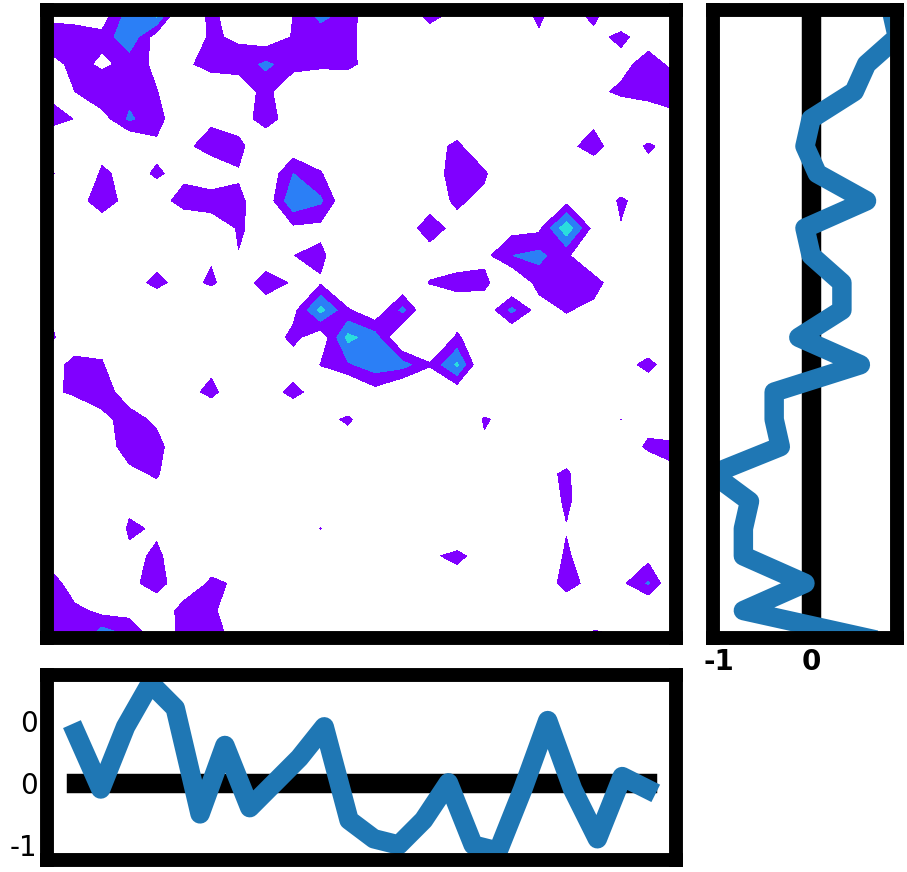

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



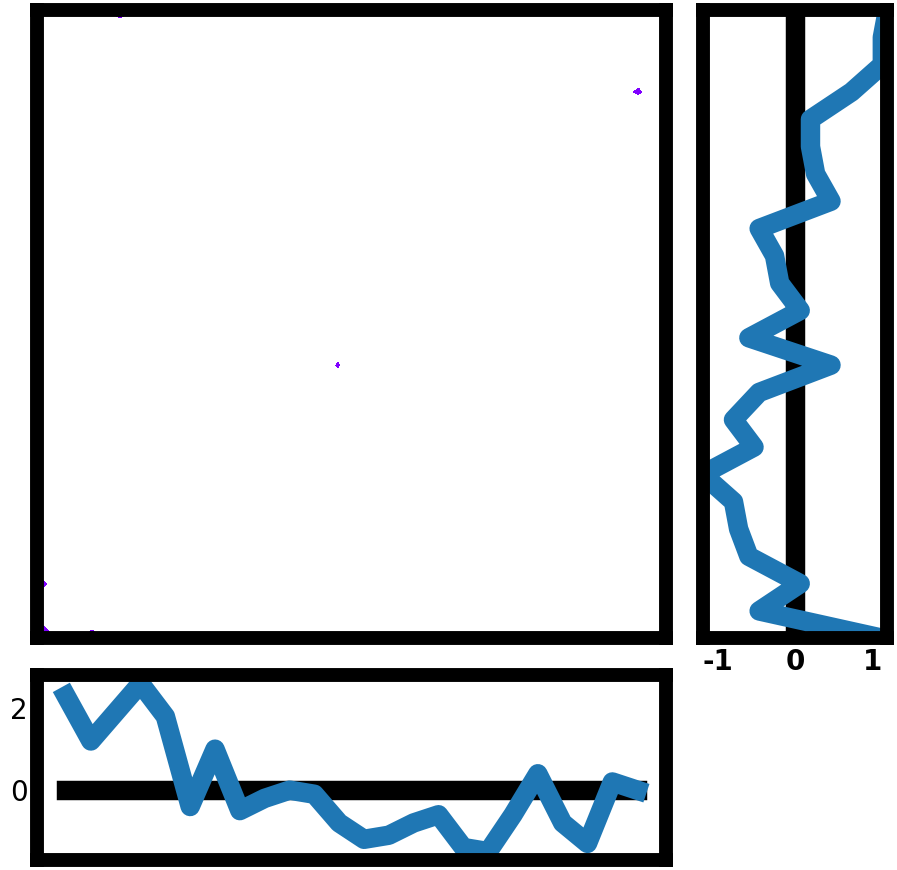

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



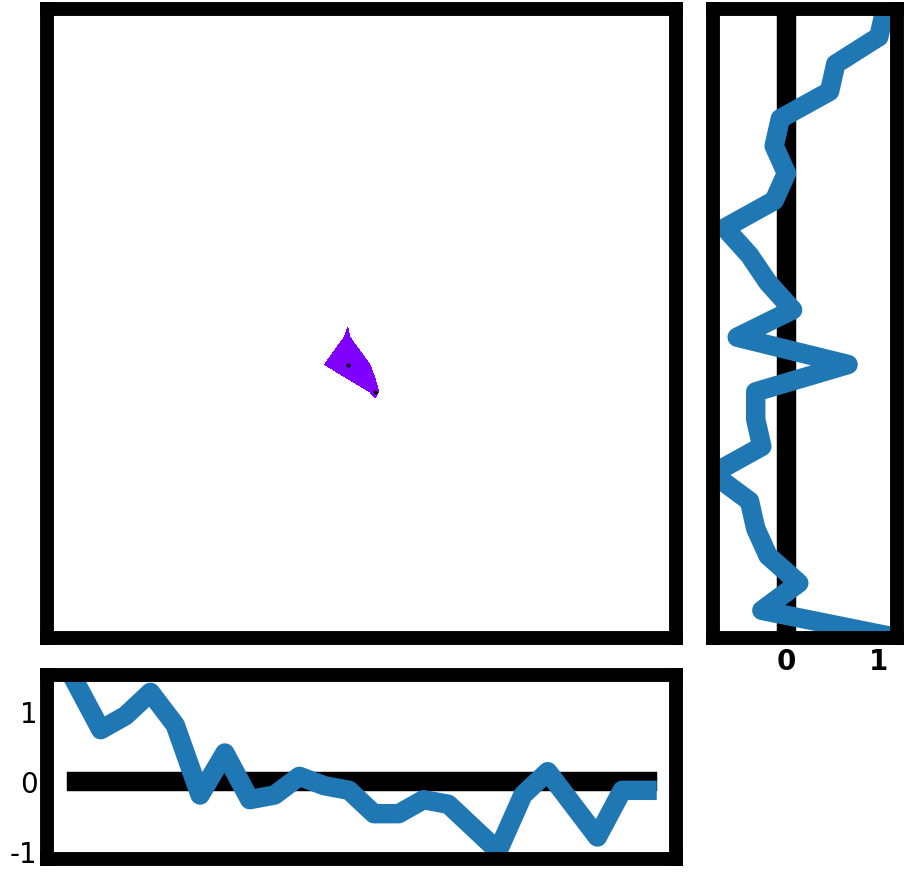

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



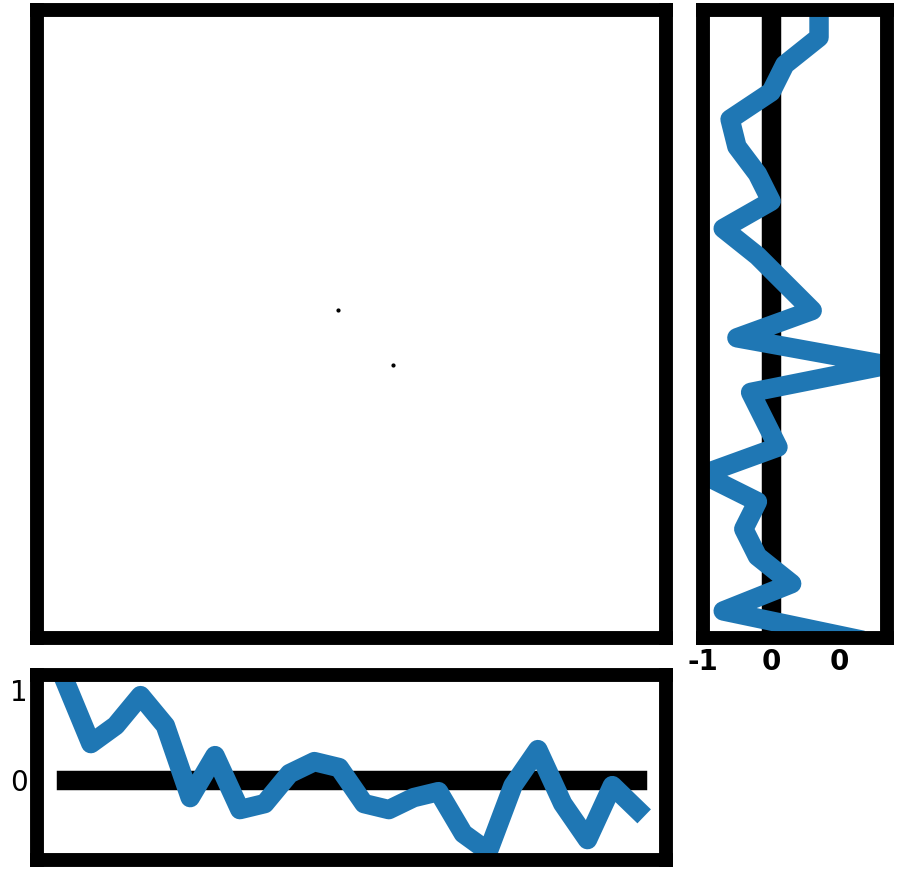

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



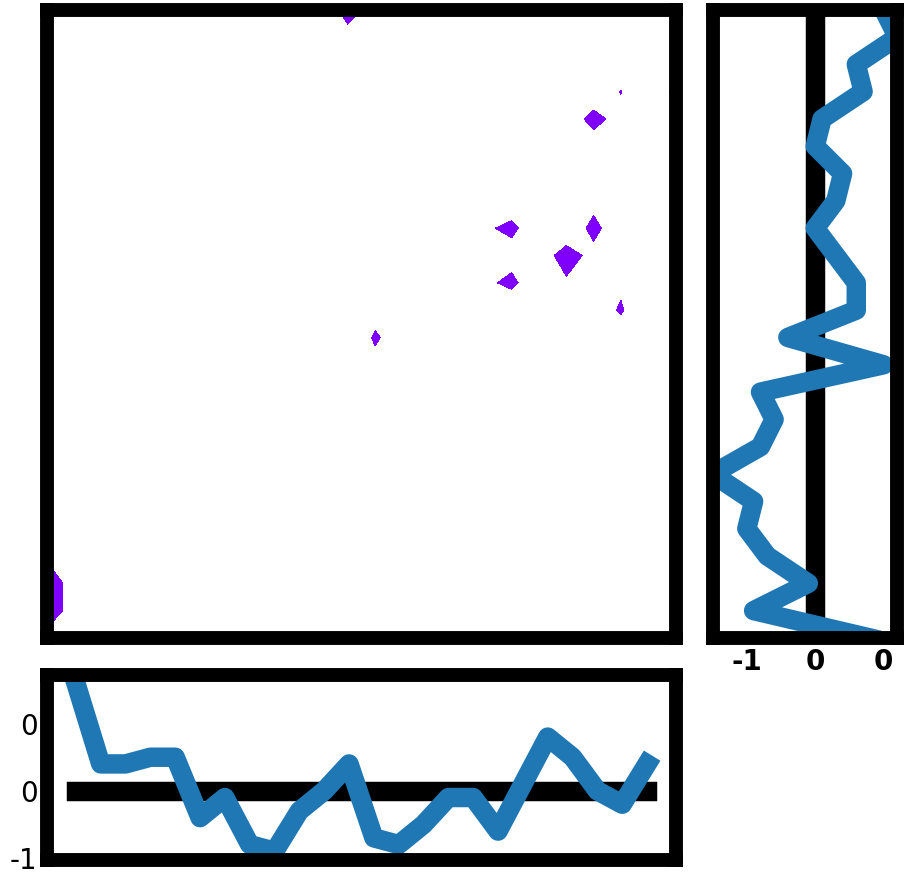

C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\3723604149.py:346: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



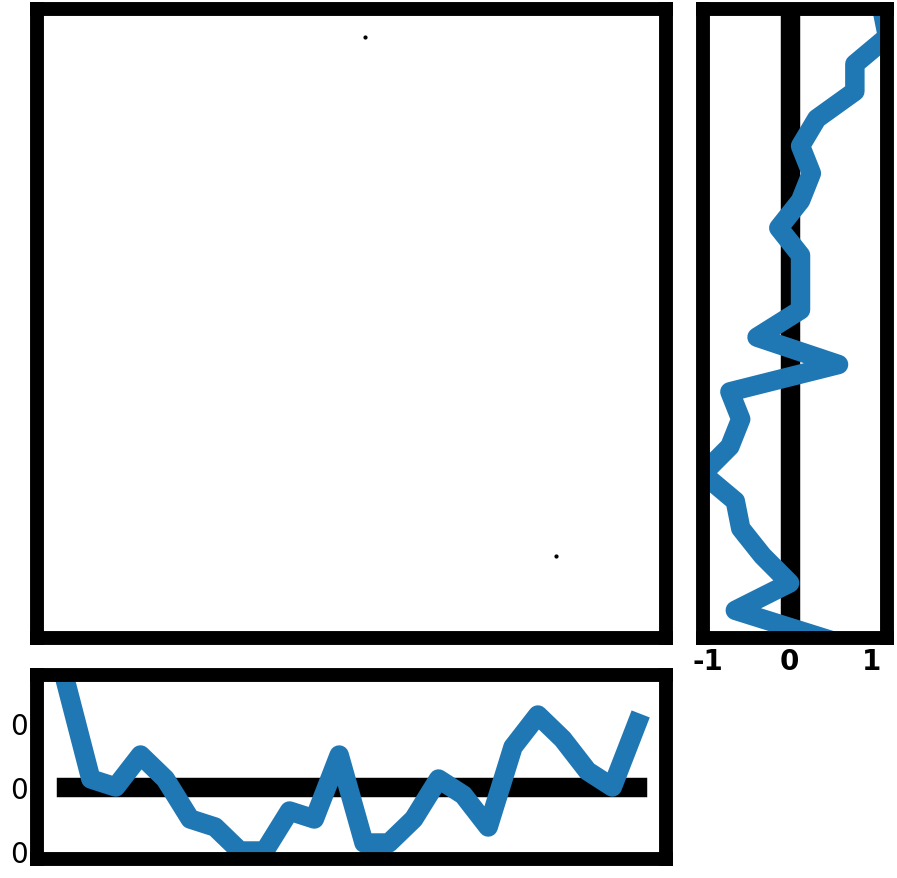

In [63]:
### test: IL6 sheet 21
InputDirectory='input/'
#df = pd.read_excel(r'./'+InputDirectory+"/M+N IFN-y final data.xlsx", sheet_name='Sheet1',header=None) # T+N IFN-y final data.xlsx
df1 = pd.read_excel(r'./'+InputDirectory+"/Jurkat T in CNI4.xlsx", sheet_name='CNI4004',header=None)
# center coordinate
if df1.shape[1]>50:
    df_x1,df_y1 = df1.iloc[0,50],df1.iloc[0,51]
    
    if ~df_x.isdigit():
        df_x1,df_y1 = df1.iloc[1,50],df1.iloc[1,51]       
else:
    df_x1,df_y1 = 25,25  

print("x:%s,y:%s" %(df_x,df_y))
(top1,btm1) = ([1,2,2,2,2,2,3],[1,1,1,1,200,200,200])
diameter = 12
(x_start1,x_end1,y_start1,y_end1) = (df_x1-diameter,df_x1+diameter,df_y1-diameter,df_y1+diameter)


#mtx_pre = pd.DataFrame(np.zeros(shape=(x_end-x_start, y_end-y_start)))
#mtx_pre.columns = range(y_start,y_end)
#mtx_pre.index=range(x_start,x_end)
cmlt_contour_color1 = ['blue','','blue','','orange','orange','red']
(x_unit,y_unit) = (x_end1-x_start1,y_end1-y_start1)
timeline=['0 mins','5 mins','10 mins','15 mins','20 mins','25 mins','30 mins']
i=0
mtx = df.iloc[i*50:(i+1)*50,0:50]
mtx = mtx.iloc[(x_start-1):(x_end),(y_start-1):(y_end)]
x_unit

mtx_pre = df.iloc[(i-2)*50:(i-1)*50,0:50]      
mtx_pre = mtx_pre.iloc[(x_start-1):(x_end),(y_start-1):(y_end)]

import matplotlib.font_manager
fontnames = sorted(set([f.name for f in matplotlib.font_manager.fontManager.ttflist]))
fontname = fontnames[0]
signalCutoff = 0
colorLevelsSet = (1000,5000)
tick_labelsize = 18
dpi_value =500
densityYN1 = True
density1 = 1
show_cmlt_contour1 =True
cntrlinecml = True
linewidth = 14
fontname = ''
tick_labelsize = 20
framelinewidth = 10
labelweight = 'bold'
RBF_function1 = 'gaussian'
hs1_5,hs1_10,hs1_15,hs1_20,hs1_25,hs1_30 = 1,1,2,2,2,3
densityYN1,density1,show_contour1,show_cmlt_contour1,cntrlinecml1=False,1.0,False,False,1200.0
# center coordinate
if df1.shape[1]>50:
    df1_x,df1_y = df1.iloc[0,50],df1.iloc[0,51]
    ## Correct usage by converting the integer to a string
    number_str = str(df1_x)                
    if ~number_str.isdigit():
        df1_x,df1_y = df1.iloc[1,50],df1.iloc[1,51]       
else:
    df1_x,df1_y = 25,25
df1_x = 25 if df1_x>=50 else df1_x
df1_y = 25 if df1_y>=50 else df1_y      
col1_center_x,col1_center_y =int(df1_x),int(df1_y)
min_1=np.int32(np.min([df1_x, 50-df1_x,df1_y,50-df1_y]))
col1_apothem = min_1
pixels = (2+col1_apothem)**2
hs1_btm_30 = hs1_btm_25 = hs1_btm_20 = pixels-3 if pixels <= 200 else 200
(top1,btm1) = ([0,hs1_5,hs1_10,hs1_15,hs1_20,hs1_25,hs1_30],[1,1,1,1,hs1_btm_20,hs1_btm_25,hs1_btm_30])  
for i in range(1,7,1):#7
    mtx = df.iloc[i*50:(i+1)*50,0:50]
    mtx = mtx.iloc[(x_start):x_end,(y_start):y_end] 

    if (i == 0) or (i == 1):
        mtx_pre = pd.DataFrame(np.zeros(shape=(x_end-x_start, y_end-y_start)))
        mtx_pre.columns = range(y_start,y_end)
        mtx_pre.index=range(x_start,x_end)
        (X,Y,Z)=plot_3D(mtx,previous = mtx_pre,signalCutoff=signalCutoff)
        (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv,fig) = plotStream(
            mtx=mtx,top=top1[i],btm=btm1[i],previous = mtx_pre,signalCutoff=signalCutoff,RBF_function=RBF_function1,
            colorLevels=np.linspace(colorLevelsSet[0],colorLevelsSet[1],7),
            x_unit = (x_end-x_start),y_unit = (y_end-y_start),
            cmlt_contour_color=cmlt_contour_color[i],
            densityYN=densityYN1,density=density1,
            show_contour=show_cmlt_contour1,show_cmlt_contour=show_cmlt_contour1,
            cntrlinecml=cntrlinecml1,
            timeline = 'a_'+timeline[i],
            tick_labelsize = tick_labelsize,
            dpi_value = dpi_value,
            linewidth = linewidth,
            labelweight=labelweight,
            framelinewidth=framelinewidth,
            fontname=fontname
        )

    else:
        ## 10 mins interval
        #mtx_pre = df.iloc[(i-2)*50:(i-1)*50,0:50] 
        # 5 mins interval
        mtx_pre = df.iloc[(i-1)*50:(i)*50,0:50] 
        mtx_pre = mtx_pre.iloc[(x_start):x_end,(y_start):y_end]
        (X,Y,Z) = plot_3D(mtx,previous = mtx_pre,signalCutoff=signalCutoff)
        (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv,fig) = plotStream(
            mtx=mtx,top=top1[i],btm=btm1[i],previous = mtx_pre,signalCutoff=signalCutoff,RBF_function=RBF_function1,
            colorLevels=np.linspace(colorLevelsSet[0],colorLevelsSet[1],7),
            x_unit = (x_end-x_start),y_unit = (y_end-y_start),
            cmlt_contour_color=cmlt_contour_color[i],
            densityYN=densityYN1,density=density1,
            show_contour=show_cmlt_contour1,show_cmlt_contour=show_cmlt_contour1,    
            cntrlinecml=cntrlinecml1,
            timeline = 'a_'+timeline[i],
            tick_labelsize = tick_labelsize,
            dpi_value = dpi_value,
            linewidth = linewidth,
            labelweight=labelweight,
            framelinewidth=framelinewidth,
            fontname=fontname
        )
    fig

In [24]:
from scipy.stats import pearsonr
SII_SCI_metrics = pd.read_csv("SII_SCI_metrics.txt",sep="\t",header = 0, index_col =0)
SII_SCI_metrics
# Compute Pearson correlation coefficient and p-value
correlation, p_value = pearsonr(SII_SCI_metrics.iloc[:,0], SII_SCI_metrics.iloc[:,1])
correlation
p_value 
correlation, p_value = pearsonr(SII_SCI_metrics.iloc[:,2], SII_SCI_metrics.iloc[:,3])
correlation
p_value 
correlation, p_value = pearsonr(SII_SCI_metrics.iloc[:,0], SII_SCI_metrics.iloc[:,3])
correlation
p_value 



,CNI4004_SII,CNI4010_SII,CNI4004_SCI,CNI4010_SCI
5 mins,0.118550,0.093498,0.048266,0.113565
10 mins,0.180195,0.152518,0.105561,0.142137
15 mins,0.141024,0.118846,0.052688,0.120773
20 mins,0.062874,0.044060,0.086786,0.064389
25 mins,0.101607,0.055420,0.119825,0.074401
30 mins,0.223837,0.149249,0.102606,0.151485


0.9384430734946267

0.005567255349229383

-0.07999744619295382

0.8802598061948042

0.9475211495530883

0.004058780458807124

,0,1,2,3,4,5,6
0,1,2,3,4,3,2,1
1,1,2,3,4,3,2,1
2,1,2,3,4,3,2,1
3,1,2,3,4,3,2,1
4,1,2,3,4,3,2,1
5,1,2,3,4,3,2,1
6,1,2,3,4,3,2,1


1

7

,0,1,2,3,4,5,6
0,1,2,3,4,3,2,1
1,1,2,3,4,3,2,1
2,1,2,3,4,3,2,1
3,1,2,3,4,3,2,1
4,1,2,3,4,3,2,1
5,1,2,3,4,3,2,1
6,1,2,3,4,3,2,1


C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:72: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:114: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



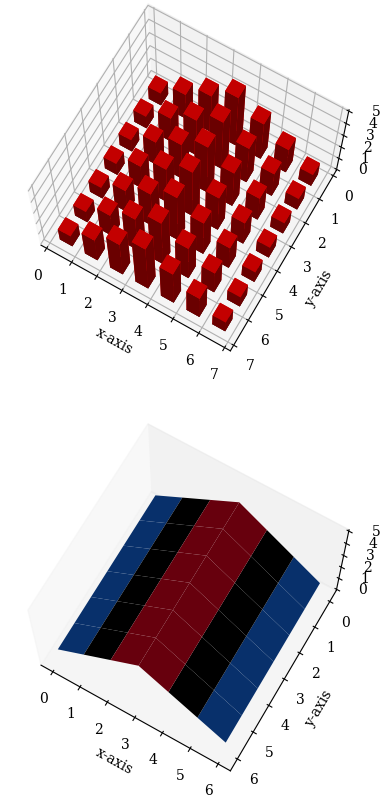

7

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:303: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:336: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:337: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:338: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:353: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py:354: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3888994.py

7
[-0.08, -0.018, 0.045, 0.107, 0.045, -0.018, -0.08]


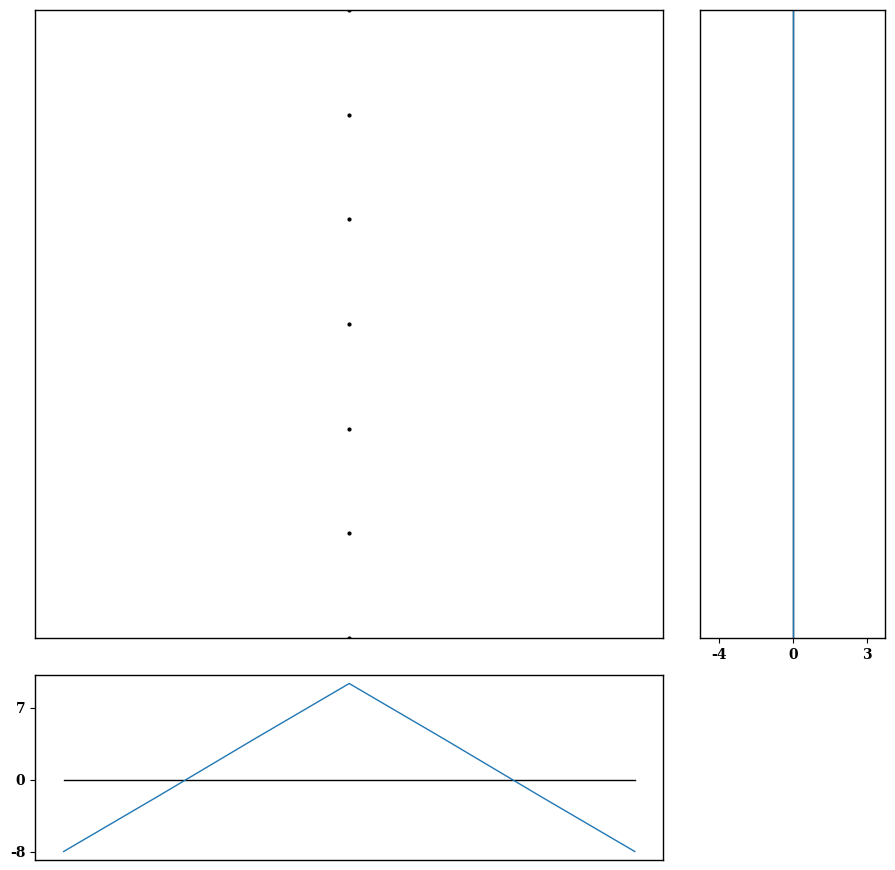

In [326]:
mtx = pd.DataFrame([[1,2,3,4,3,2,1],[1,2,3,4,3,2,1],[1,2,3,4,3,2,1],[1,2,3,4,3,2,1],[1,2,3,4,3,2,1],[1,2,3,4,3,2,1],[1,2,3,4,3,2,1]])

df_x,df_y = 4,4  
diameter = 3
(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)
mtx
x_start
x_end
mtx = mtx.iloc[(x_start-1):(x_end),(y_start-1):(y_end)]
mtx
mtx_pre = pd.DataFrame(np.zeros([7,7]))
mtx_pre = mtx_pre.iloc[(x_start-1):(x_end),(y_start-1):(y_end)]
(X,Y,Z)=plot_3D(mtx,previous = mtx_pre,z_max=5)
(x_unit,y_unit) = (x_end-x_start+1,y_end-y_start+1)
x_unit
(x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
    mtx=mtx,top=1,btm=1,previous = mtx_pre,
    x_unit = x_unit,y_unit = y_unit, 
    cmlt_contour_color = cmlt_contour_color[i],
    show_contour = True,
    show_cmlt_contour = True,
    densityYN=False,
    timeline = timeline[i],
    tick_labelsize = 10,
    linewidth= 1,
    labelweight='heavy',#
    framelinewidth = 1,
    fontname='Serif',
    fillcolor=False
)

In [112]:
### all subsheet
import openpyxl
InputDirectory = "input"

# Load the Excel file
#workbook = openpyxl.load_workbook(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx")
workbook = openpyxl.load_workbook(r'./'+InputDirectory+"/T+N IL-6 final data.xlsx")
# Get a list of all sheet names
sheet_names = workbook.sheetnames
sheet_names

['Sheet1',
 'Sheet2',
 'Sheet3',
 'Sheet4',
 'Sheet5',
 'Sheet6',
 'Sheet7',
 'Sheet8',
 'Sheet9',
 'Sheet10',
 'Summary',
 'Sheet11']

In [106]:
# IL-6 with amount summary
sheet_names_sel=sheet_names[0:3]+sheet_names[4:8]+sheet_names[10:12]+sheet_names[14:21]
sheet_names_sel

['Sheet1',
 'Sheet2',
 'Sheet3',
 'Sheet5-depends',
 'Sheet6-depends',
 'Sheet7-15 max',
 'Sheet8-15max',
 'Sheet11',
 'Sheet12',
 'Sheet15',
 'Sheet16',
 'Sheet17-15max',
 'Sheet18',
 'Sheet19',
 'Sheet20',
 'Sheet21-15max']

In [113]:
# T+N IL-6 final data.xlsx
sheet_names_sel=sheet_names[0:10]#sheet_names[0:2]+sheet_names[3:10]
sheet_names_sel

['Sheet1',
 'Sheet2',
 'Sheet3',
 'Sheet4',
 'Sheet5',
 'Sheet6',
 'Sheet7',
 'Sheet8',
 'Sheet9',
 'Sheet10']

In [21]:
str('').isdigit()

False

In [20]:
### test: IL6 sheet 21
import matplotlib.pyplot as plt
def scatter2DPlot(x,y,xlabel,ylabel,labels):
    # Create a figure and a 3D axis
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111) #, projection='3d'
    # Create a scatter plot
    ax.scatter(x, y,label =labels, cmap='viridis')
    # add labels to all points
    for (xi, yi,label) in zip(x, y,labels):
        plt.text(xi, yi, label, va='bottom', ha='center')
    # Add labels and title
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    #ax.set_title(title)
    #ax.invert_yaxis()
    # Display the plot
    plt.show()
    
InputDirectory='input/'
inequ_set=[]
CWSNR_set=[]
## IL-6 with amount summary
#diameter_set = [13,13,13,13,13,13,13,13,
#                13,13,8,13,12,11,13,13]
# T+N IL-6 final data.xlsx
diameter_set = [13,13,12,13,13,13,13,13,13,13,13,
                13,13]
idx=0
for sheet_name in sheet_names_sel:
    # read matrix
  
    #df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name=sheet_name,header=None)
    df = pd.read_excel(r'./'+InputDirectory+"/T+N IL-6 final data.xlsx", sheet_name=sheet_name,header=None)
    print(sheet_name)
    # center coordinate
    if df.shape[1]>50:
        df_x,df_y = df.iloc[0,50],df.iloc[0,51]
        if ~df_x.isdigit():
            df_x,df_y = df.iloc[1,50],df.iloc[1,51]       
    else:
        df_x,df_y = 25,25
    diameter = diameter_set[idx]
    idx+=1
    print("x:%s,y:%s,diameter:%s" %(str(df_x),str(df_y),str(diameter)))
    
    
    (x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)
    i=3
    mtx_pre = df.iloc[(i-1)*50:(i)*50,0:50]
    mtx = df.iloc[i*50:(i+1)*50,0:50]
    mtx_pre = mtx_pre.iloc[x_start:x_end,y_start:y_end]
    mtx_ = mtx.iloc[x_start:x_end,y_start:y_end]
    
    #(X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
    inequ,CWSNR=calculate_index(mtx_,diameter*2,diameter*2)
    inequ_set.append(inequ)
    CWSNR_set.append(CWSNR)
#inequ_set
#CWSNR_set

scatter2DPlot(inequ_set,CWSNR_set,'DII','CWSNR',sheet_names_sel)

NameError: name 'sheet_names_sel' is not defined

In [21]:
####

### distance-based signal spread model ###
import copy
def distance_based_simulator(mtx,**kwargs):
    gridResolation = kwargs['gridResolation'] if 'gridResolation' in kwargs.keys() else 25
    center_x = kwargs['center_x'] if 'center_x' in kwargs.keys() else 25
    center_y = kwargs['center_y'] if 'center_y' in kwargs.keys() else 25
    radius_min = kwargs['radius_min'] if 'radius_min' in kwargs.keys() else 0
    radius_max = kwargs['radius_max'] if 'radius_max' in kwargs.keys() else 0
    signal = kwargs['signal'] if 'signal' in kwargs.keys() else 5000
    # split the space
    x = np.linspace(0 , 2*gridResolation-1 , 2*gridResolation  )
    y = np.linspace(0 , 2*gridResolation-1 , 2*gridResolation )
    X, Y = np.meshgrid(x, y)
    distance_MTX = np.sqrt((X-center_x)**2+(Y-center_y)**2)
    value = signal/radius_max
    mtx_copy=copy.copy(mtx)
    mtx_copy[(distance_MTX>=radius_min) & (distance_MTX<=radius_max)] = value
    return(mtx_copy)

def mask_grid(**kwargs):
    gridResolation = kwargs['gridResolation'] if 'gridResolation' in kwargs.keys() else 25
    center_x = kwargs['center_x'] if 'center_x' in kwargs.keys() else 25
    center_y = kwargs['center_y'] if 'center_y' in kwargs.keys() else 25
    x = np.linspace(0 , 2*gridResolation-1 , 2*gridResolation  )
    y = np.linspace(0 , 2*gridResolation-1 , 2*gridResolation )
    X, Y = np.meshgrid(x, y)
    x_coord=X-center_x
    y_coord=Y-center_y
    return(x_coord,y_coord)
    
### initiate the zero matrix ###
x_start,y_start,x_end,y_end = 0,0,50,50
(x_unit,y_unit) = (x_end-x_start,y_end-y_start)

mtx_zero = pd.DataFrame(np.zeros(shape=(x_end-x_start, y_end-y_start)))
mtx_zero.columns = range(y_start,y_end)
mtx_zero.index=range(x_start,x_end)
radius = 25

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



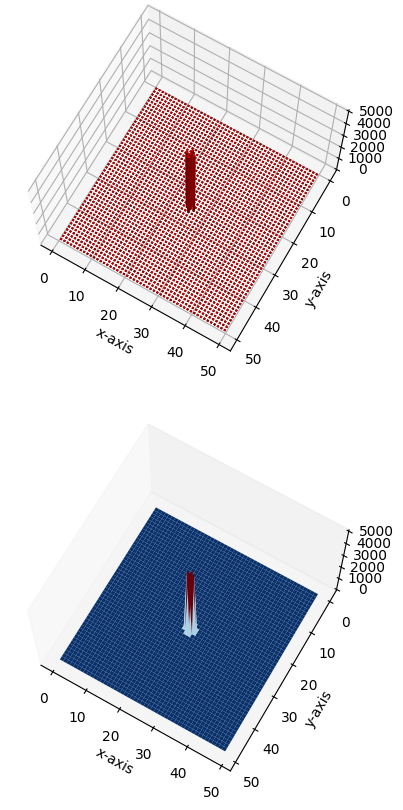

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

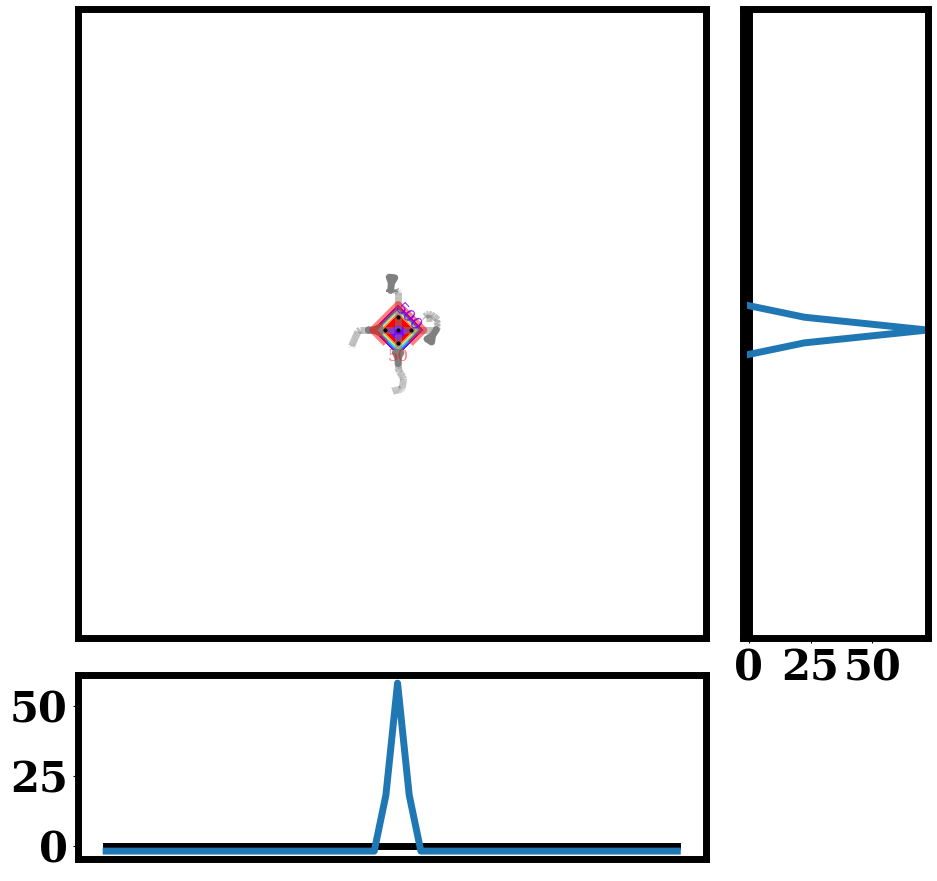

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



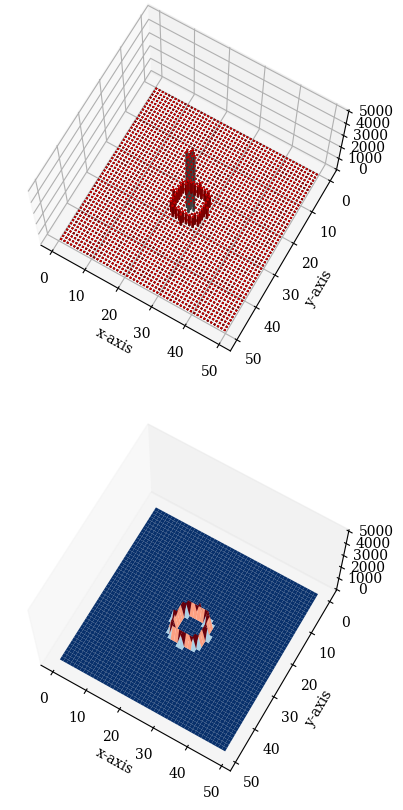

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

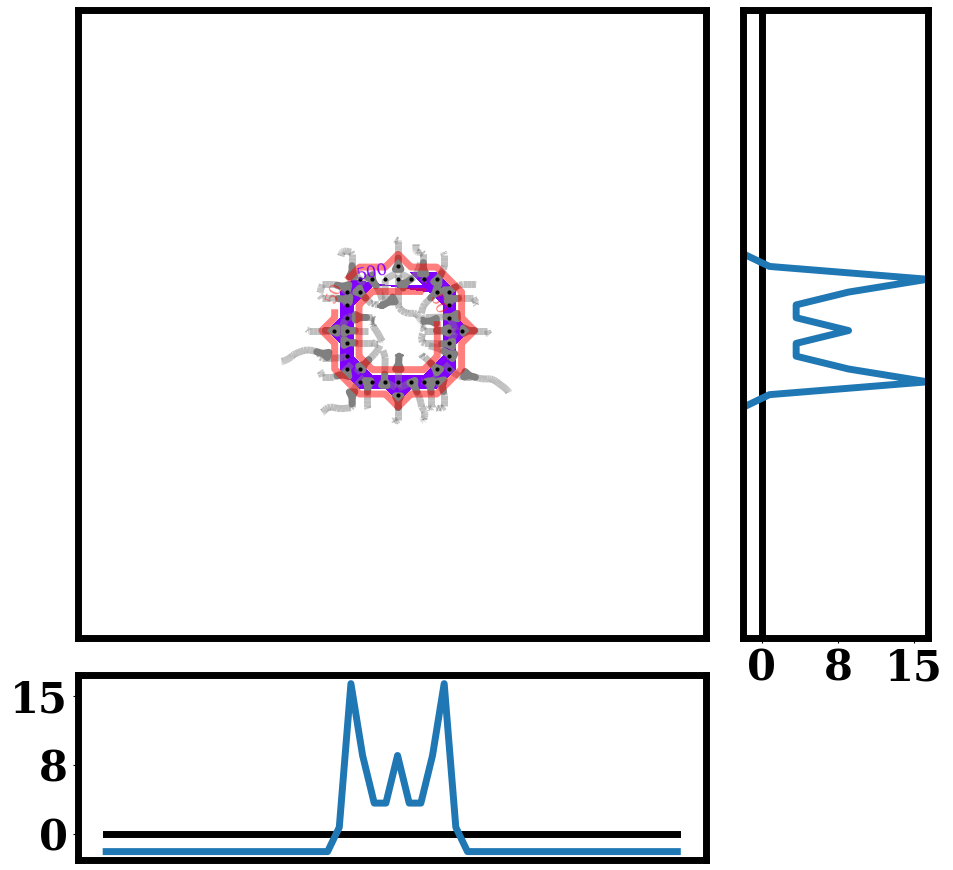

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



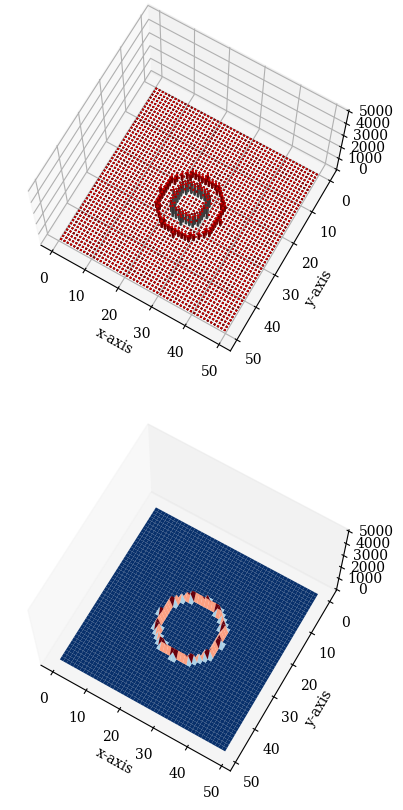

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

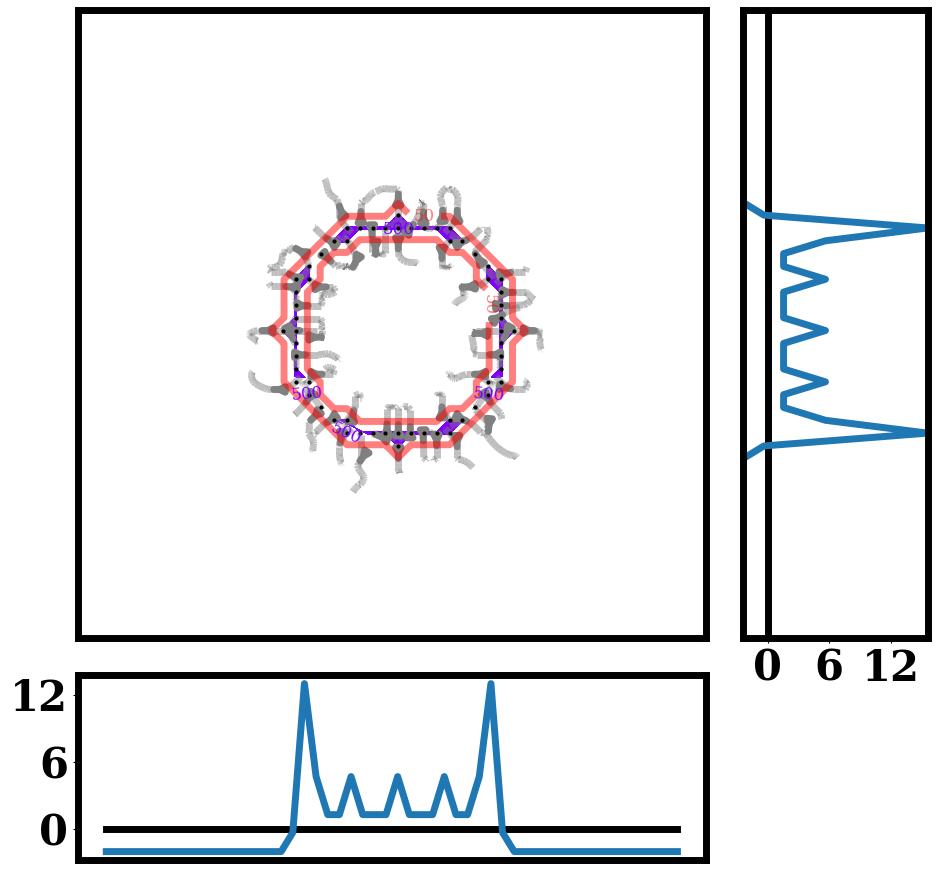

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



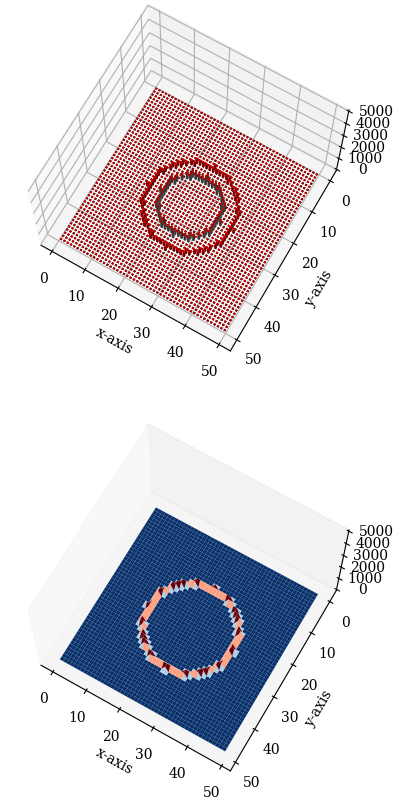

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

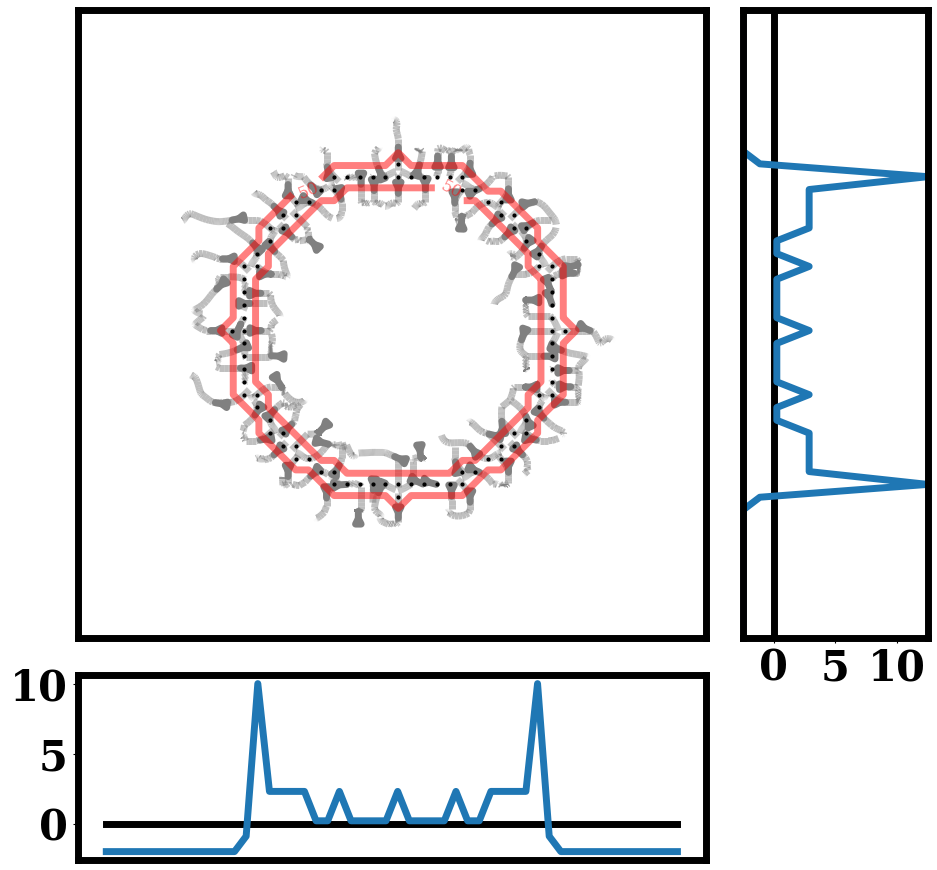

In [22]:
### Synthetic model 1: one signal in the center ###
distance_array = [(0,1),(4,5),(8,9),(12,13)]
top_array = [1,20,10,30]
bottom_array = [100,200,100,100]
x_inequ_sets,y_inequ_sets,x_drvtv_sets,y_drvtv_sets = [],[],[],[]
for i in range(0,len(distance_array)):
    if i == 0:
        mtx_pre = mtx_zero
    else:
        radiusCutoff_pre = distance_array[i-1]
        mtx_pre = distance_based_simulator(mtx_zero,radius_min=radiusCutoff_pre[0],radius_max=radiusCutoff_pre[1])
    radiusCutoff = distance_array[i]
    mtx=distance_based_simulator(mtx_zero,radius_min=radiusCutoff[0],radius_max=radiusCutoff[1])
    (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
    (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
        mtx=mtx,top=top_array[i],btm=bottom_array[i],previous = mtx_pre,
        x_unit = x_unit,y_unit = y_unit, 
        cmlt_contour_color = 'red',
        show_contour = True,
        show_cmlt_contour = True,
        cntrlinecml = 50,
        densityYN=True,
        timeline = '10 mins',
        tick_labelsize = 30,
        linewidth= 5,
        labelweight='heavy',#
        framelinewidth = 5,
        fontname='Serif',
        fillcolor=True,
        flowlineDensity=5
    )
    ### Derivative index
    x_inequ_sets.append(x_inequ)
    y_inequ_sets.append(y_inequ)    
    x_drvtv_sets.append(x_drvtv) #np.sum([np.abs(i) for i in np.array(x_drvtv[0:radius]) - np.array(x_drvtv[-radius:][::-1])])
    y_drvtv_sets.append(y_drvtv) #np.sum([np.abs(i) for i in np.array(y_drvtv[0:radius]) - np.array(y_drvtv[-radius:][::-1])])
model1_x_IE=x_inequ_sets
model1_y_IE=y_inequ_sets
model1_x_DR=x_drvtv_sets
model1_y_DR=y_drvtv_sets

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



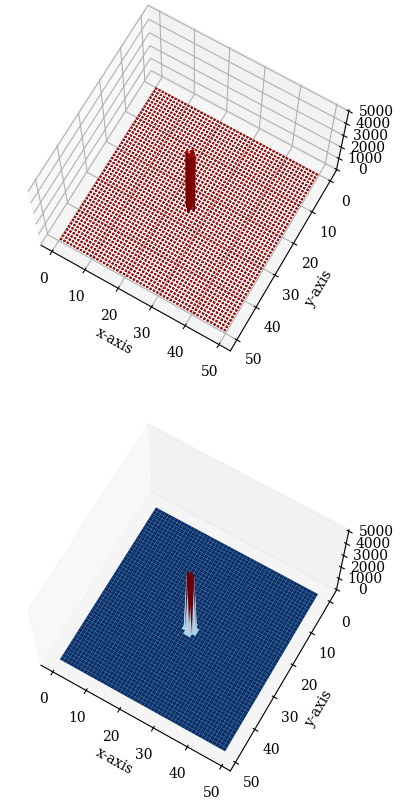

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

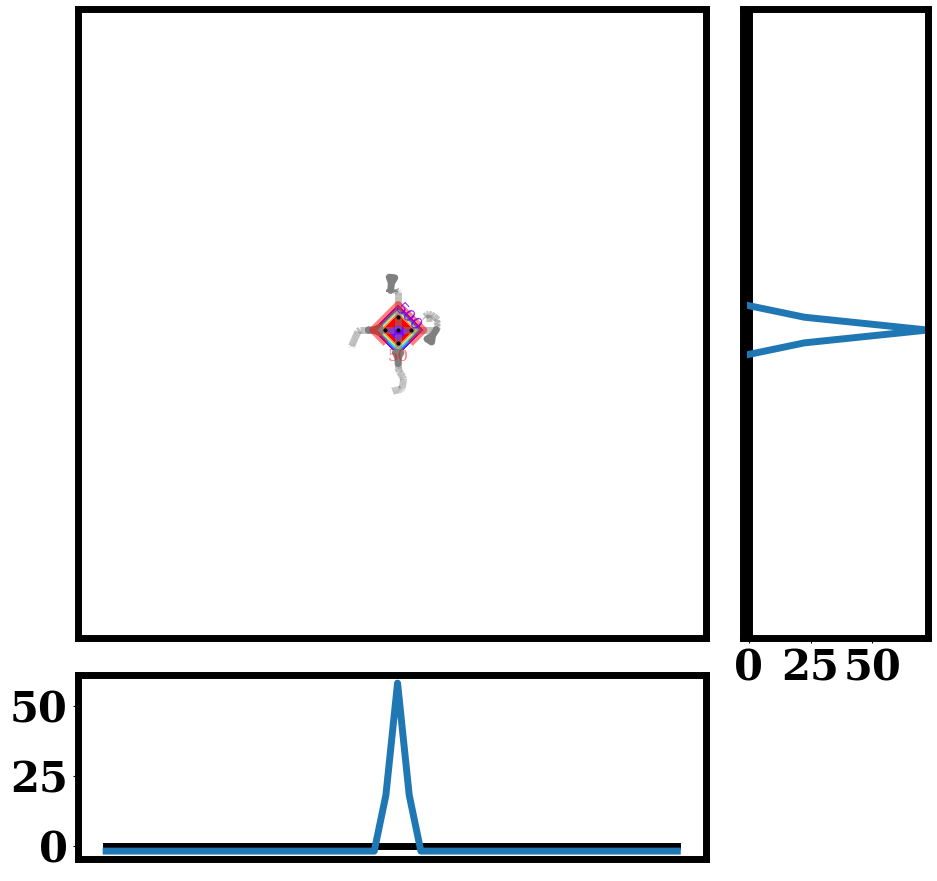

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



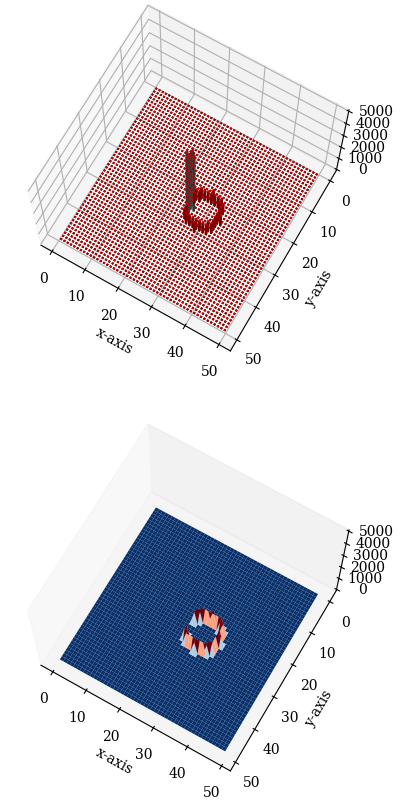

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

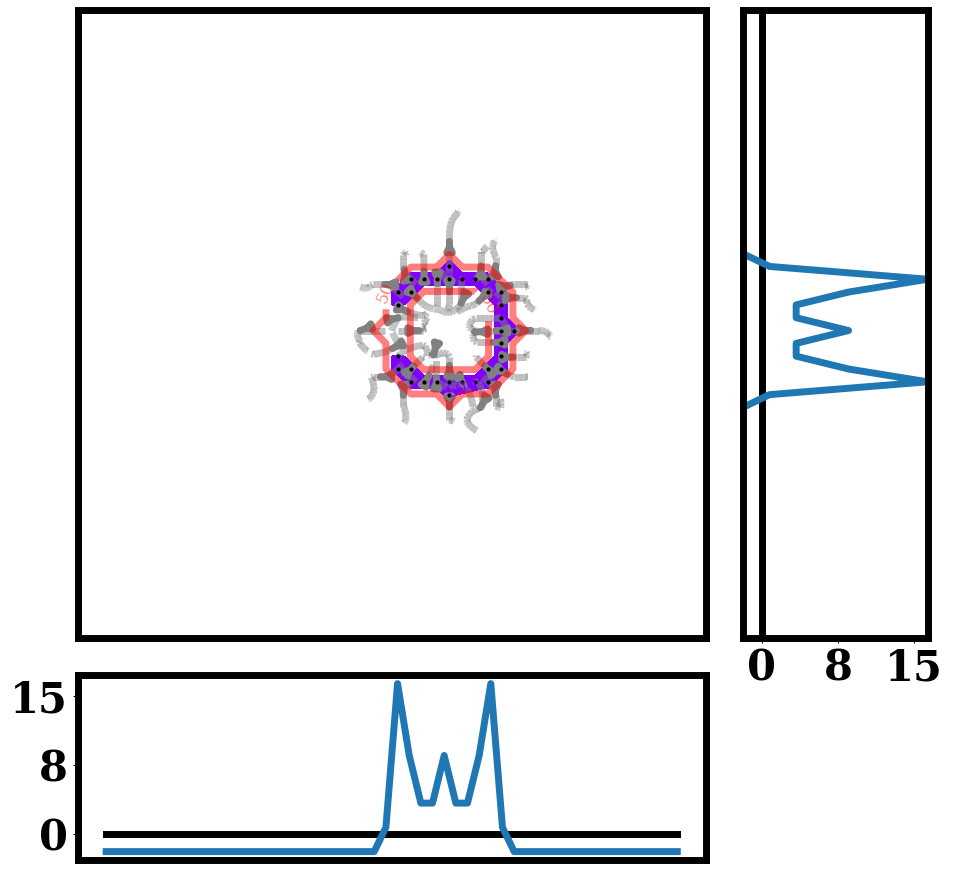

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



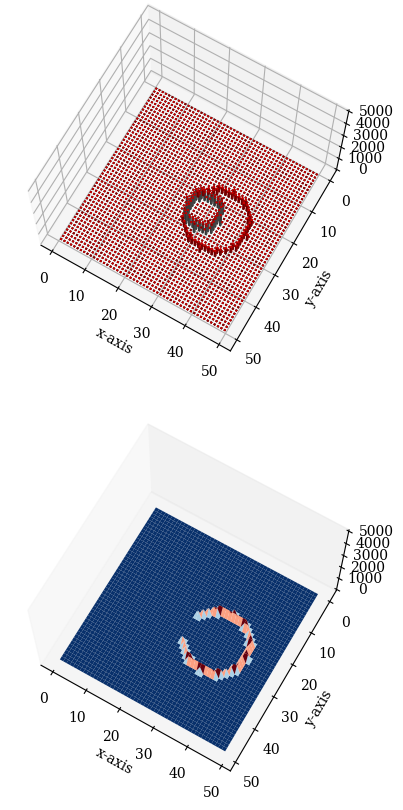

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

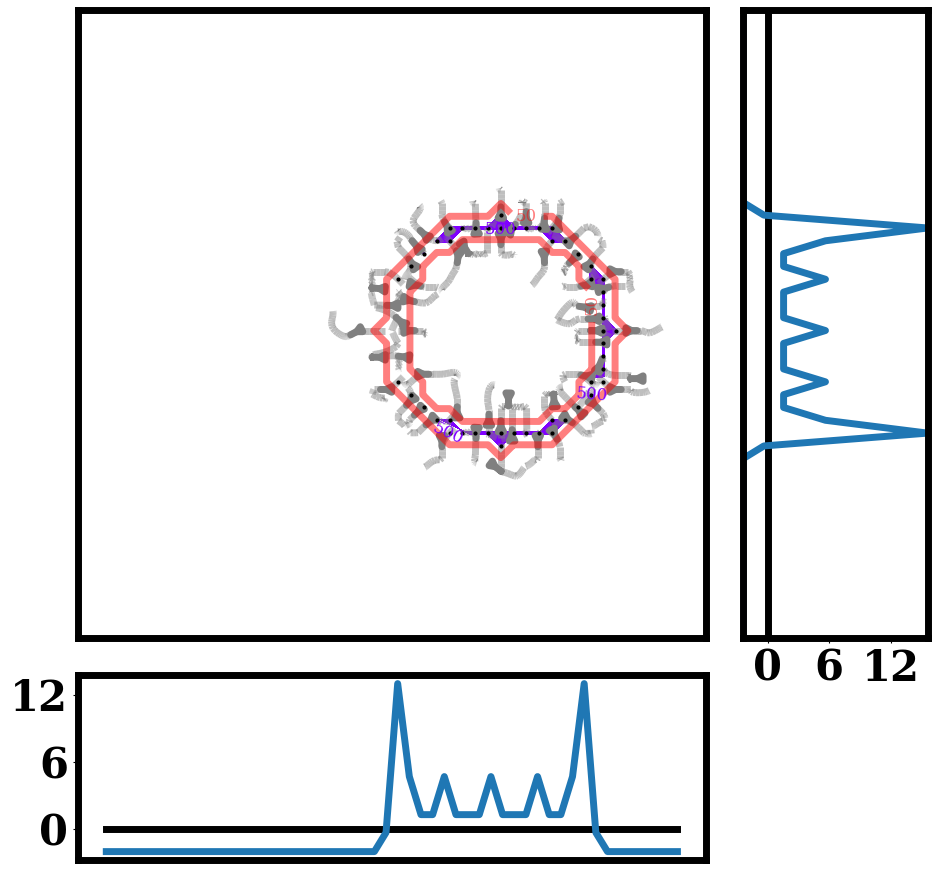

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



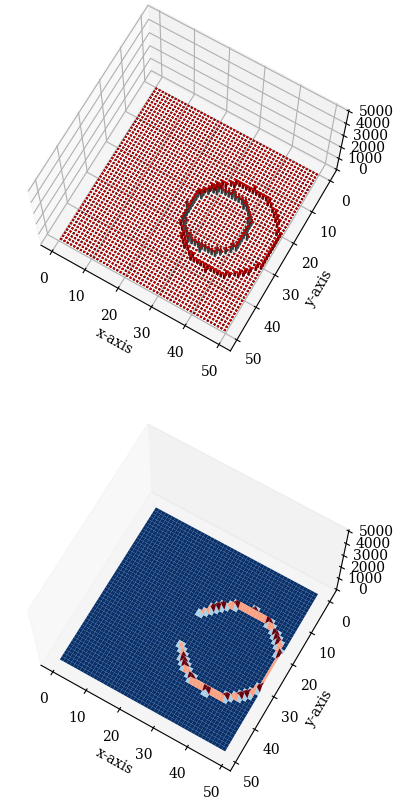

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

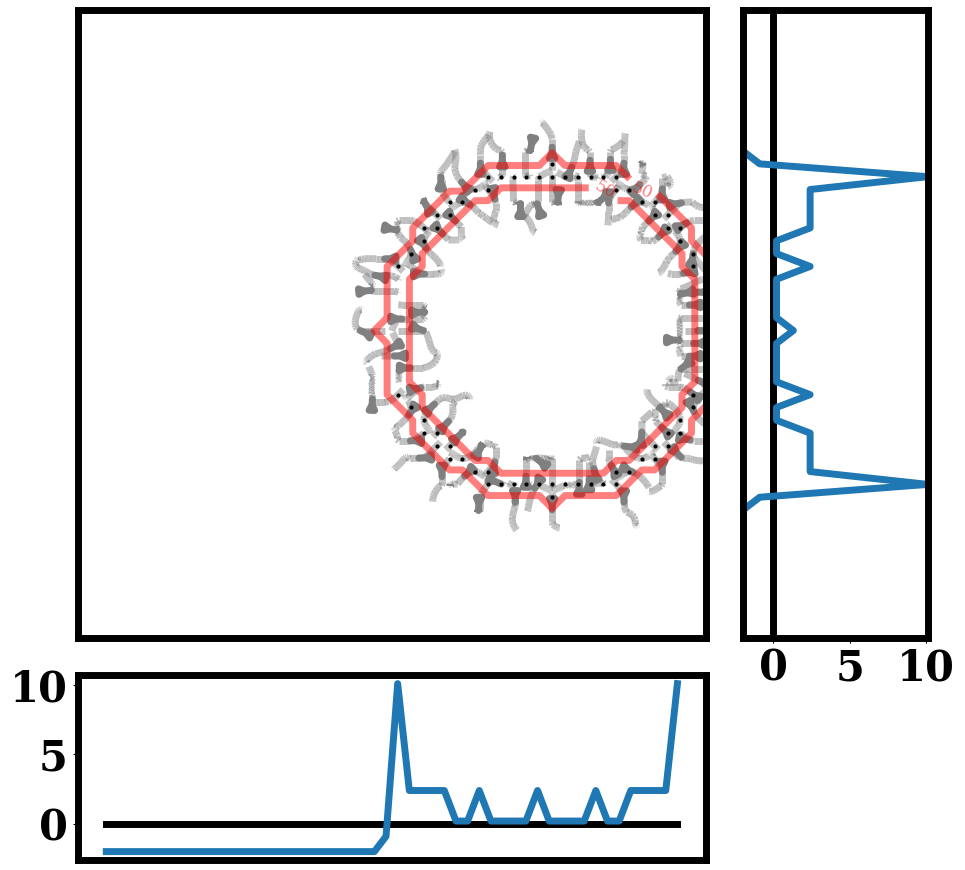

In [23]:
### Synthetic model 2: one signal in the center ###
distance_array = [(0,1),(4,5),(8,9),(12,13)]
top_array = [1,10,10,30]
bottom_array = [100,100,100,100]
x_inequ_sets,y_inequ_sets,x_drvtv_sets,y_drvtv_sets = [],[],[],[]
for i in range(0,len(distance_array)):
    if i == 0:
        mtx_pre = mtx_zero
    else:
        radiusCutoff_pre = distance_array[i-1]      
        mtx_pre = distance_based_simulator(mtx_zero,radius_min=radiusCutoff_pre[0],radius_max=radiusCutoff_pre[1],center_x=25+4*(i-1))
    radiusCutoff = distance_array[i]
    mtx=distance_based_simulator(mtx_zero,radius_min=radiusCutoff[0],radius_max=radiusCutoff[1],center_x=25+4*i)
    (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
    (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
        mtx=mtx,top=top_array[i],btm=bottom_array[i],previous = mtx_pre,
        x_unit = x_unit,y_unit = y_unit, 
        cmlt_contour_color = 'red',
        show_contour = True,
        show_cmlt_contour = True,
        cntrlinecml = 50,
        densityYN=True,
        timeline = '10 mins',
        tick_labelsize = 30,
        linewidth= 5,
        labelweight='heavy',#
        framelinewidth = 5,
        fontname='Serif',
        fillcolor=True,
        flowlineDensity=5
    )
    ### Derivative index
    x_inequ_sets.append(x_inequ)
    y_inequ_sets.append(y_inequ)    
    x_drvtv_sets.append(x_drvtv) #np.sum([np.abs(i) for i in np.array(x_drvtv[0:radius]) - np.array(x_drvtv[-radius:][::-1])])
    y_drvtv_sets.append(y_drvtv) #np.sum([np.abs(i) for i in np.array(y_drvtv[0:radius]) - np.array(y_drvtv[-radius:][::-1])])
model2_x_IE=x_inequ_sets
model2_y_IE=y_inequ_sets
model2_x_DR=x_drvtv_sets
model2_y_DR=y_drvtv_sets

In [11]:
if np.count_nonzero(np.array(mtx_pre)) != 5:

16

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



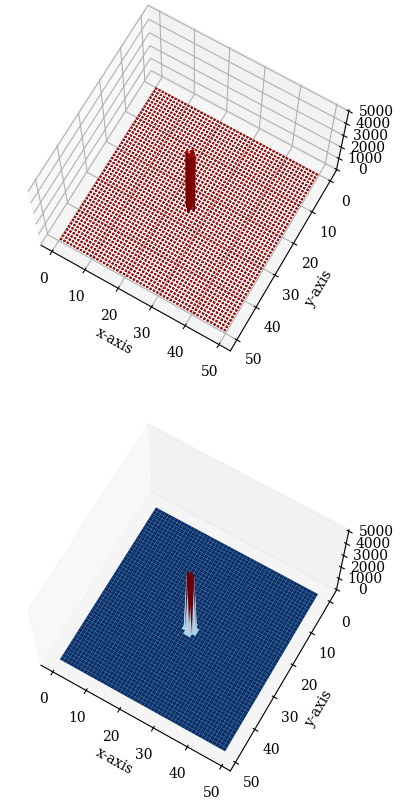

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

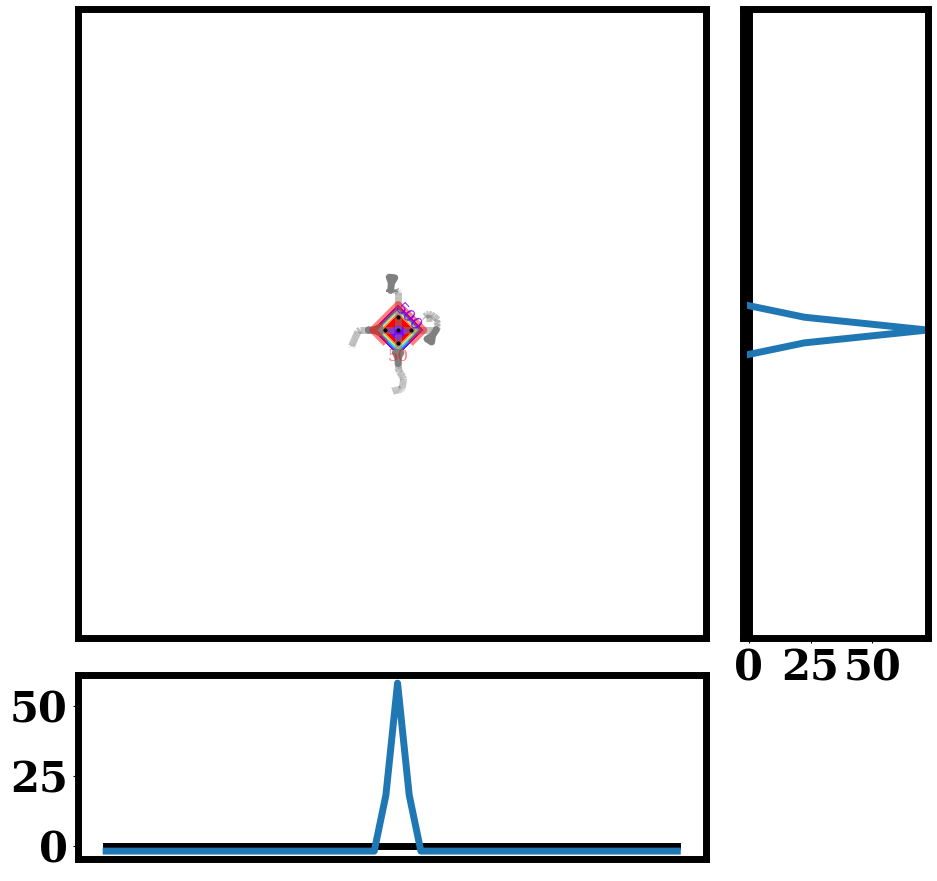

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



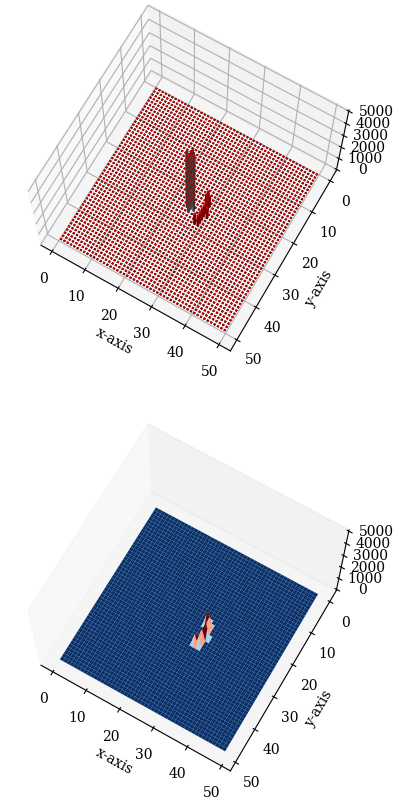

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

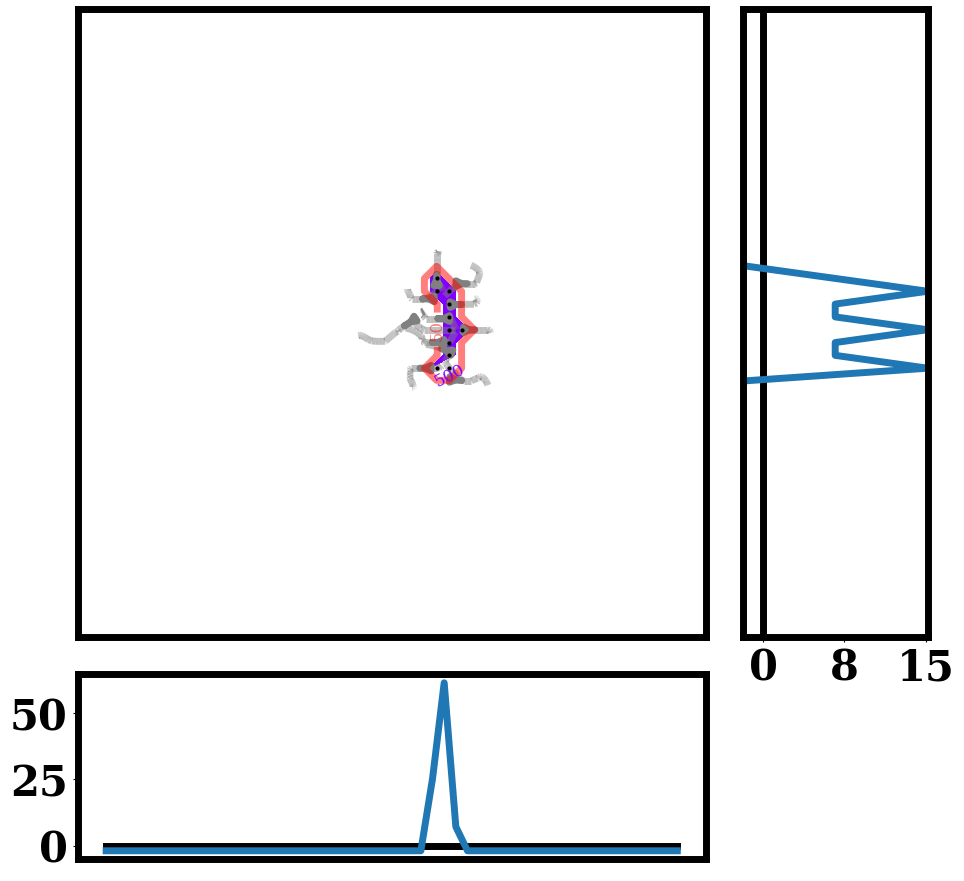

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



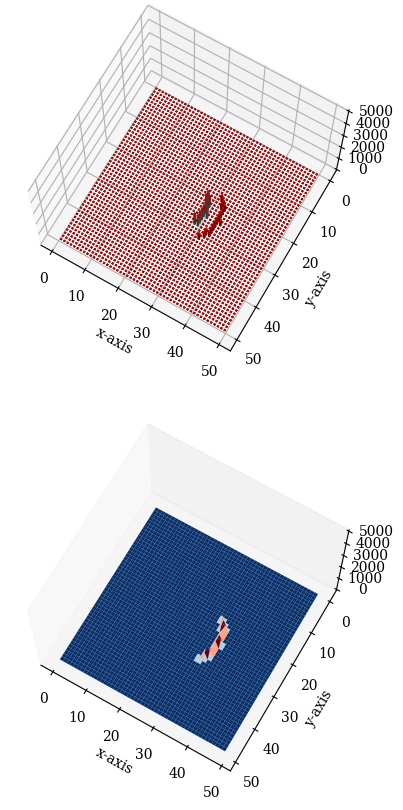

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

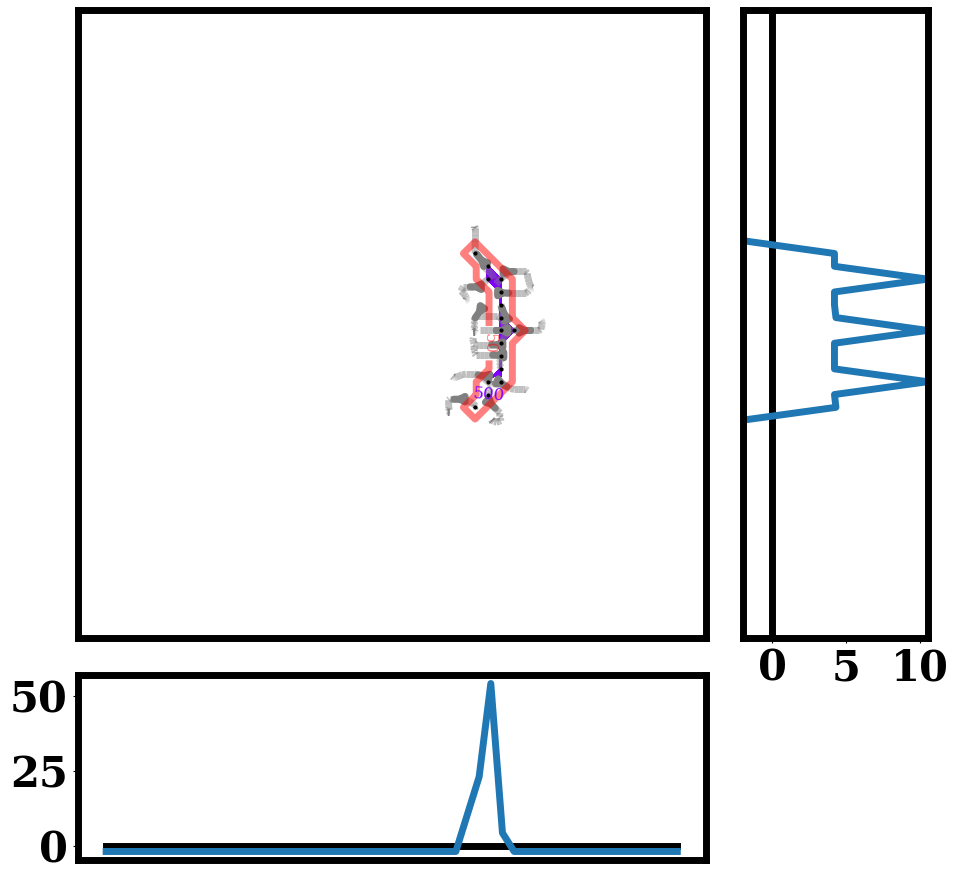

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



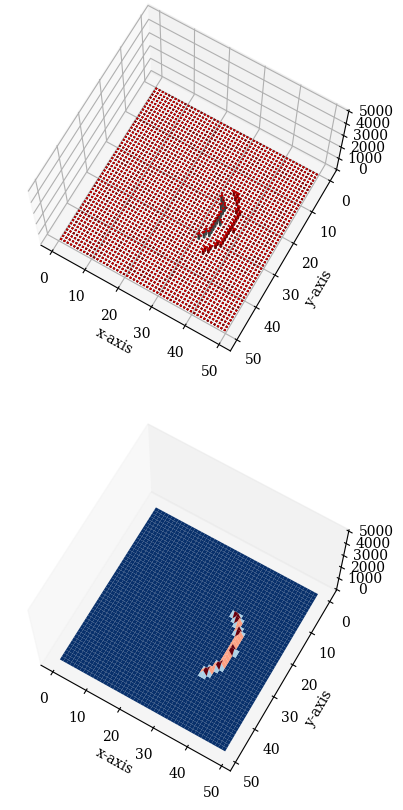

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

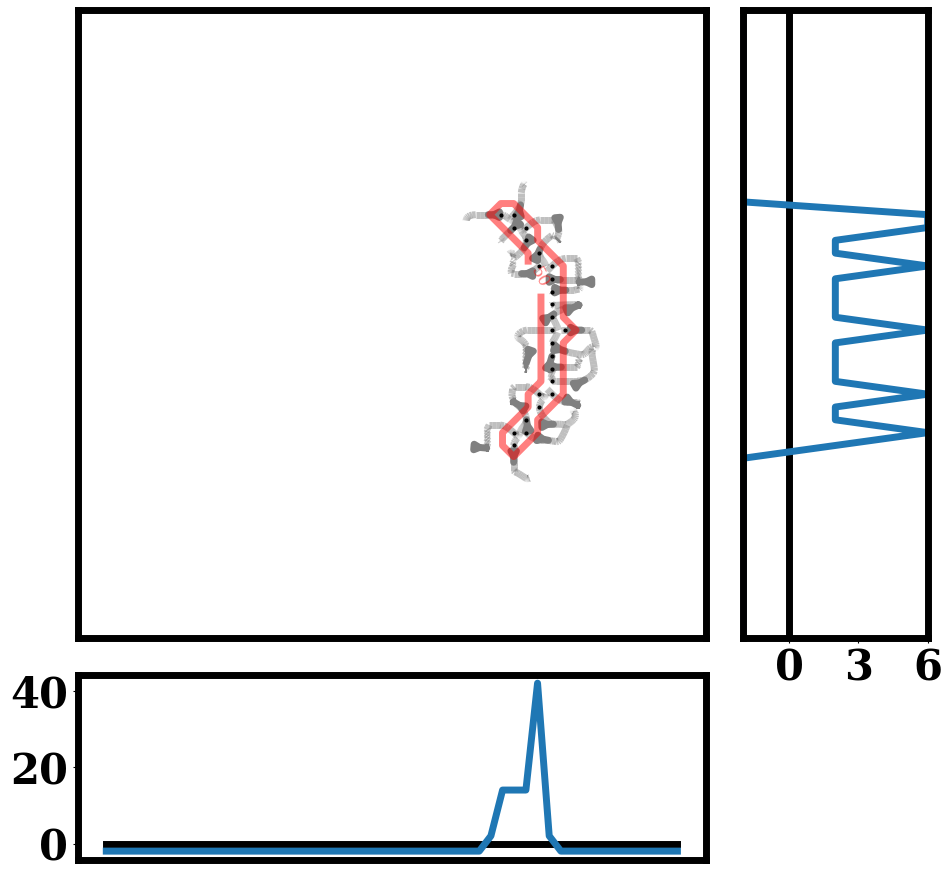

In [24]:
### Synthetic model 3: one signal in the center, diffusion in circular section ###
distance_array = [(0,1),(4,5),(8,9),(12,13)]
top_array = [1,1,1,1]
bottom_array = [100,100,100,100]
x_inequ_sets,y_inequ_sets,x_drvtv_sets,y_drvtv_sets = [],[],[],[]
for i in range(0,len(distance_array)):
    if i == 0:
        mtx_pre = mtx_zero
    else:
        radiusCutoff_pre = distance_array[i-1]
        mtx_pre = distance_based_simulator(mtx_zero,radius_min=radiusCutoff_pre[0],radius_max=radiusCutoff_pre[1])
    radiusCutoff = distance_array[i]
    mtx=distance_based_simulator(mtx_zero,radius_min=radiusCutoff[0],radius_max=radiusCutoff[1])
    (x_coord,y_coord) = mask_grid()
    mask = (x_coord>=y_coord) * (x_coord>(-y_coord-2))
    if np.count_nonzero(np.array(mtx_pre)) != 5:
        mtx_pre= mtx_pre*mask
    if np.count_nonzero(np.array(mtx)) != 5:    
        mtx= mtx*mask
    
    (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
    (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
        mtx=mtx,top=top_array[i],btm=bottom_array[i],previous = mtx_pre,
        x_unit = x_unit,y_unit = y_unit, 
        cmlt_contour_color = 'red',
        show_contour = True,
        show_cmlt_contour = True,
        cntrlinecml = 50,
        densityYN=True,
        timeline = '10 mins',
        tick_labelsize = 30,
        linewidth= 5,
        labelweight='heavy',#
        framelinewidth = 5,
        fontname='Serif',
        fillcolor=True,
        flowlineDensity=5
    )
    ### Derivative index
    x_inequ_sets.append(x_inequ)
    y_inequ_sets.append(y_inequ)    
    x_drvtv_sets.append(x_drvtv) #np.sum([np.abs(i) for i in np.array(x_drvtv[0:radius]) - np.array(x_drvtv[-radius:][::-1])])
    y_drvtv_sets.append(y_drvtv) #np.sum([np.abs(i) for i in np.array(y_drvtv[0:radius]) - np.array(y_drvtv[-radius:][::-1])])

model3_x_IE=x_inequ_sets
model3_y_IE=y_inequ_sets
model3_x_DR=x_drvtv_sets
model3_y_DR=y_drvtv_sets

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



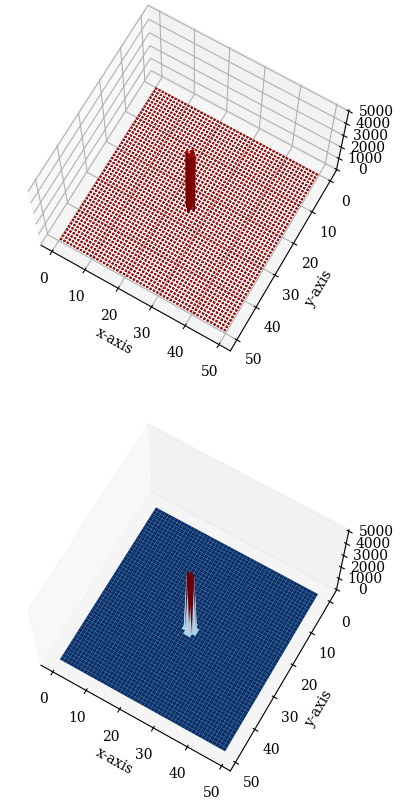

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

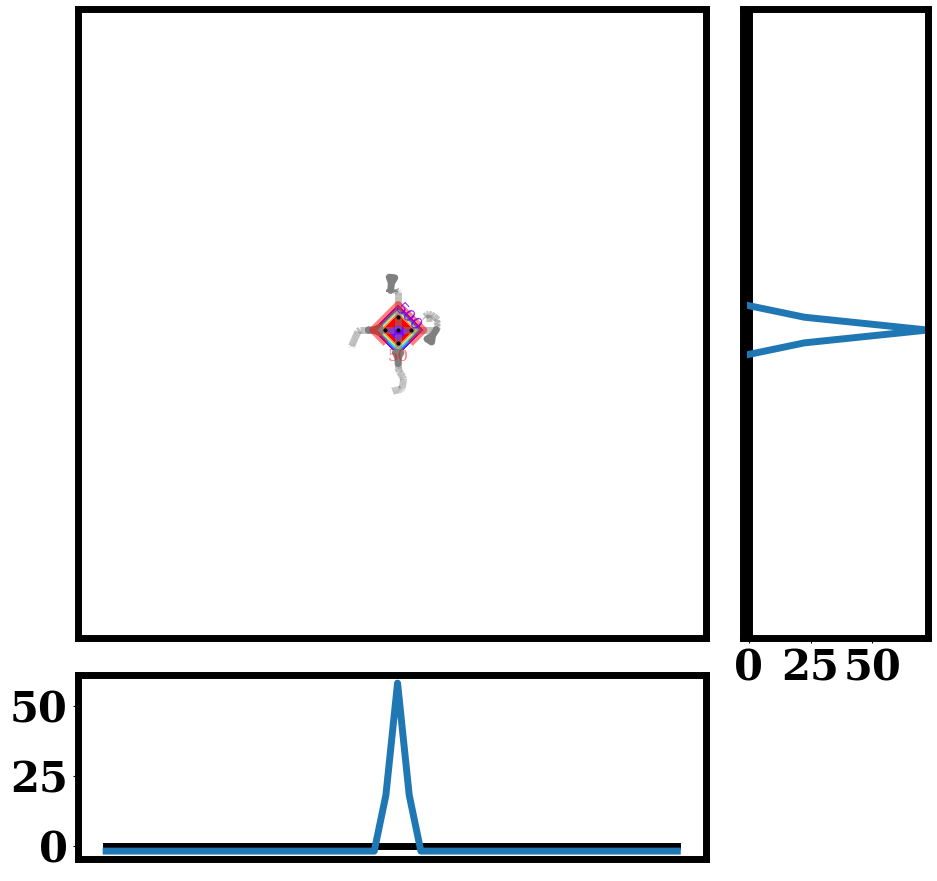

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



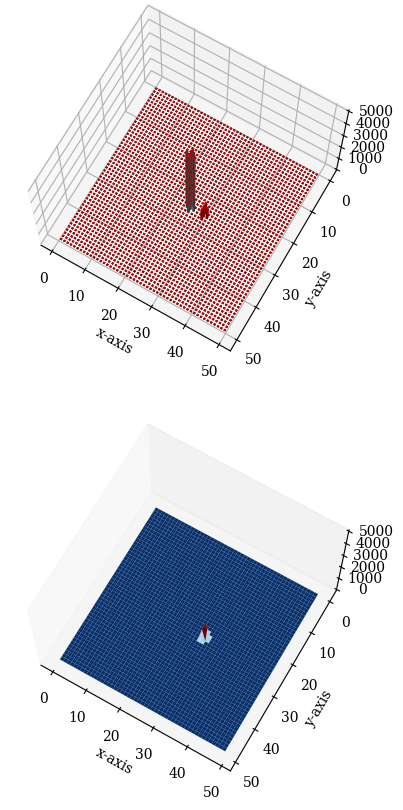

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

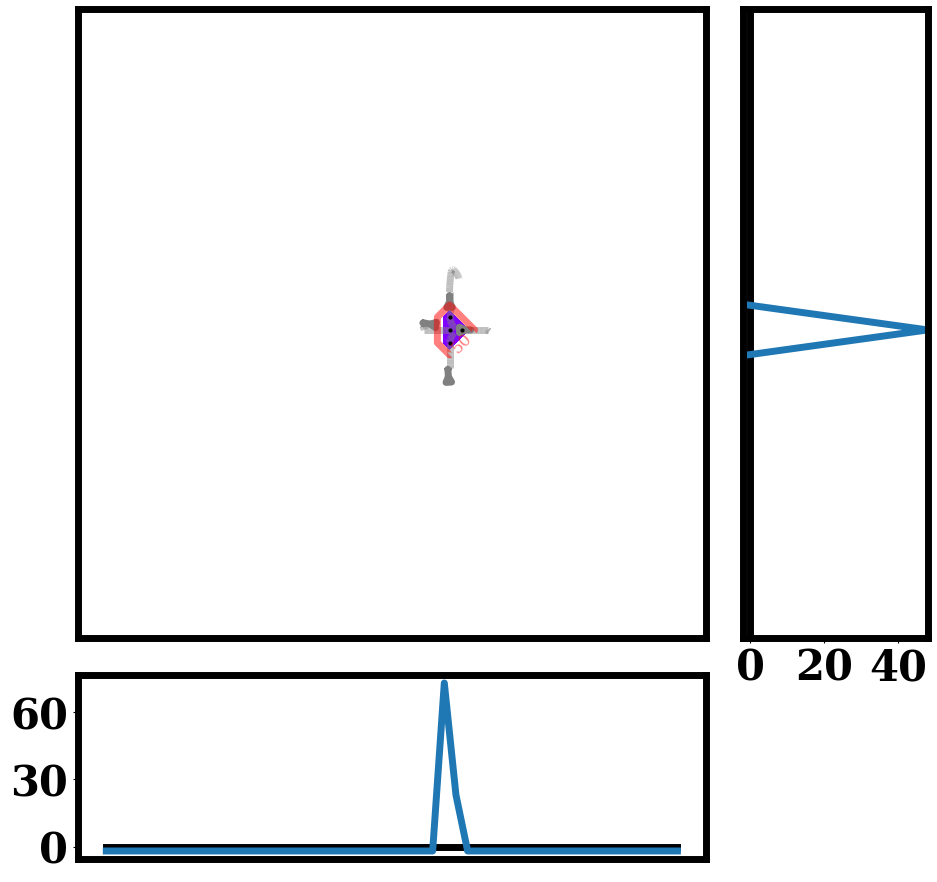

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



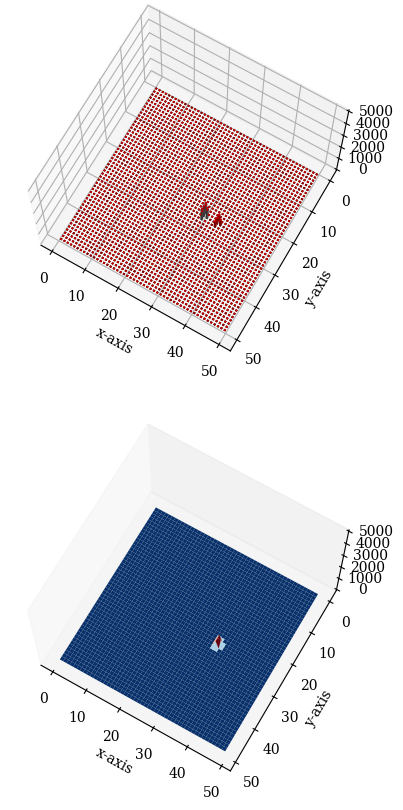

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

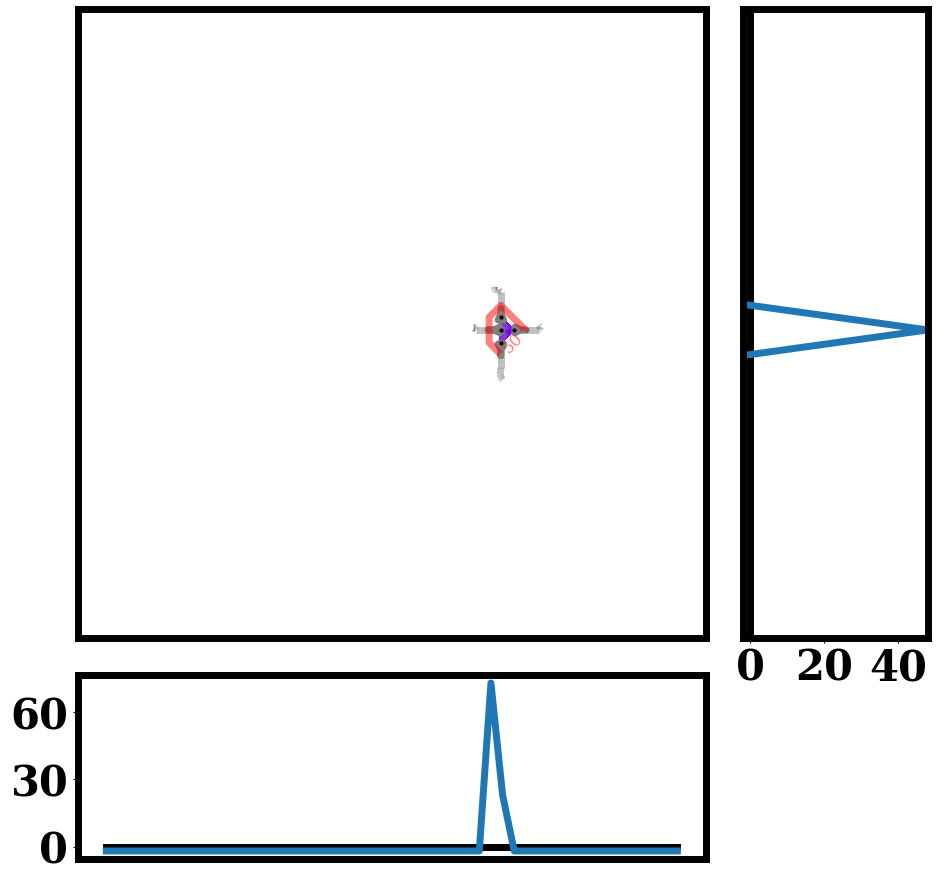

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



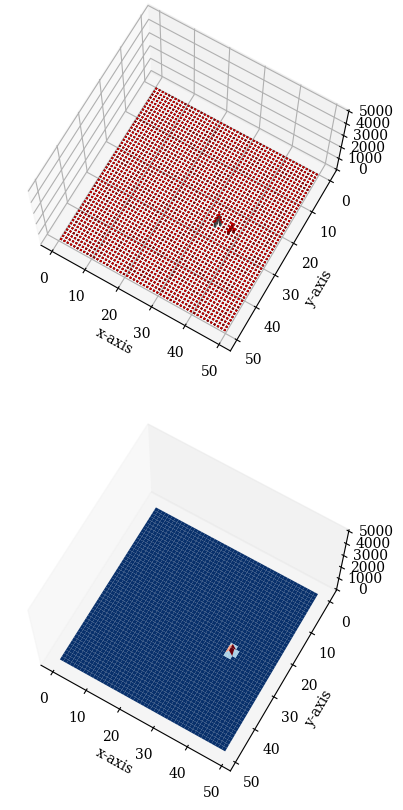

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:308: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:343: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:344: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:360: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\3819486669.py:361: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972

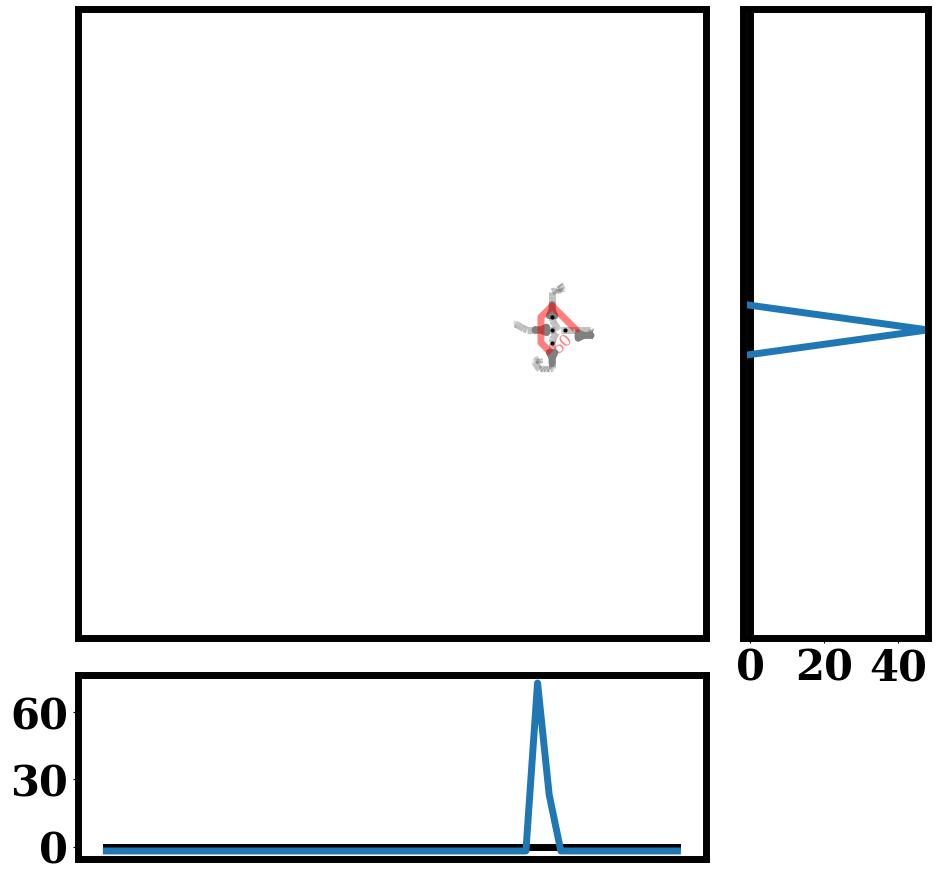

In [25]:
### Synthetic model 4: one signal in the center, diffusion in one direction ###
distance_array = [(0,1),(4,5),(8,9),(12,13)]
top_array = [1,1,1,1]
bottom_array = [100,100,100,100]
x_inequ_sets,y_inequ_sets,x_drvtv_sets,y_drvtv_sets = [],[],[],[]
for i in range(0,len(distance_array)):
    if i == 0:
        mtx_pre = mtx_zero
    else:
        radiusCutoff_pre = distance_array[i-1]
        mtx_pre = distance_based_simulator(mtx_zero,radius_min=radiusCutoff_pre[0],radius_max=radiusCutoff_pre[1])
    radiusCutoff = distance_array[i]
    mtx=distance_based_simulator(mtx_zero,radius_min=radiusCutoff[0],radius_max=radiusCutoff[1])
    mtx_pre.iloc[0:24,:] = 0
    mtx_pre.iloc[27:50,:] = 0
    mtx_pre.iloc[:,0:24] = 0
    mtx.iloc[0:24,:] = 0
    mtx.iloc[27:50,:] = 0  
    mtx.iloc[:,0:24] = 0
    (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
    (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
        mtx=mtx,top=top_array[i],btm=bottom_array[i],previous = mtx_pre,
        x_unit = x_unit,y_unit = y_unit, 
        cmlt_contour_color = 'red',
        show_contour = True,
        show_cmlt_contour = True,
        cntrlinecml = 50,
        densityYN=True,
        timeline = '10 mins',
        tick_labelsize = 30,
        linewidth= 5,
        labelweight='heavy',#
        framelinewidth = 5,
        fontname='Serif',
        fillcolor=True,
        flowlineDensity=5
    )
    ### Derivative index
    x_inequ_sets.append(x_inequ)
    y_inequ_sets.append(y_inequ)    
    x_drvtv_sets.append(x_drvtv) #np.sum([np.abs(i) for i in np.array(x_drvtv[0:radius]) - np.array(x_drvtv[-radius:][::-1])])
    y_drvtv_sets.append(y_drvtv) #np.sum([np.abs(i) for i in np.array(y_drvtv[0:radius]) - np.array(y_drvtv[-radius:][::-1])])
model4_x_IE=x_inequ_sets
model4_y_IE=y_inequ_sets
model4_x_DR=x_drvtv_sets
model4_y_DR=y_drvtv_sets

In [26]:
### collect the results ###
model_x_IE = [model1_x_IE,model2_x_IE,model3_x_IE,model4_x_IE]
model_y_IE = [model1_y_IE,model2_y_IE,model3_y_IE,model4_y_IE]
model_x_DR = [model1_x_DR,model2_x_DR,model3_x_DR,model4_x_DR]
model_y_DR = [model1_y_DR,model2_y_DR,model3_y_DR,model4_y_DR]

[0.027729677693590162, 0.027729677693590138, 0.027729677693590152, 0.02772967769359068]
[0.027729677693590162, 0.1775565713360278, 0.3339095365867923, 0.4849903657696788]
[0.027729677693590162, 0.16942487810630233, 0.3167838822701187, 0.4478767886810978]
[0.027729677693590162, 0.18730365857394904, 0.34369702241094335, 0.5003843198107784]
[0.08474582987451279, 0.30810542971390603, 0.43822234907166524, 0.6121853936462521]
[0.08474582987451279, 0.3053188975340794, 0.4225084405636418, 0.536874814882239]
[0.08474582987451279, 0.16971162552228347, 0.2662130720043211, 0.3821906250833603]
[0.08474582987451279, 0.07154884813012996, 0.07050472309142947, 0.06885213092949012]


C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\4279442788.py:27: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



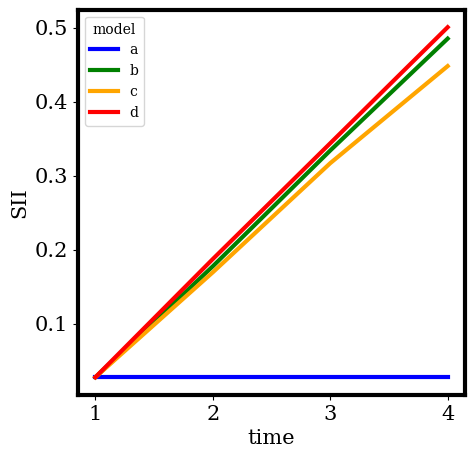

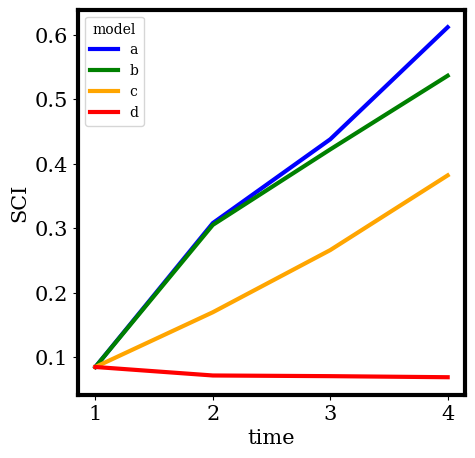

In [27]:

    
def plot_inequ(inequ_sets,**kwargs):
    tick_labelsize = kwargs['tick_labelsize'] if 'tick_labelsize' in kwargs.keys() else 20
    linewidth = kwargs['linewidth'] if 'linewidth' in kwargs.keys() else 6
    framelinewidth = kwargs['framelinewidth'] if 'framelinewidth' in kwargs.keys() else 10
    xlabel = kwargs['xlabel'] if 'xlabel' in kwargs.keys() else ''
    color_sets = kwargs['color_sets'] if 'color_sets' in kwargs.keys() else ['red' for i in inequ_sets]
    legends = kwargs['legends'] if 'legends' in kwargs.keys() else ['a' for i in inequ_sets]
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    for idx in range(0,len(inequ_sets)):
        inequ_set = inequ_sets[idx]
        print(inequ_set)
        ax.plot(range(0,len(inequ_set),1),inequ_set,color=color_sets[idx],label=str(legends[idx]),markersize=5,linewidth = linewidth)#np.repeat(0,len(IDI))
    plt.legend(title='model')
    xlabel = kwargs['xlabel'] if 'xlabel' in kwargs.keys() else ''
    ylabel = kwargs['ylabel'] if 'ylabel' in kwargs.keys() else ''
    ax.set_xlabel(xlabel, fontsize=tick_labelsize)
    ax.set_ylabel(ylabel, fontsize=tick_labelsize)
    #plt.legend(loc="upper right")
    #ax.set_ylim(0,1)  
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(['1','2','3','4'])
    ax.xaxis.set_tick_params(labelsize=tick_labelsize)
    ax.yaxis.set_tick_params(labelsize=tick_labelsize)
    for axis in ['top', 'bottom', 'left', 'right']:
        ax.spines[axis].set_linewidth(framelinewidth)  # change width  
    fig.show()
    #plt.legend(loc="upper right",title='cell type')

inequ_sets=[]
coverageIndex_sets=[]
for idx in range(0,len(model_x_IE)):
    # x_drvtv
    x_IE_sets=model_x_IE[idx]
    y_IE_sets=model_y_IE[idx]
    x_drvtv_sets=model_x_DR[idx]
    y_drvtv_sets=model_y_DR[idx]
    inequ_set=[]
    coverageIndex_set=[]
    
    for i in range(0,len(x_IE_sets)):
        x_inequ = x_IE_sets[i]
        y_inequ = y_IE_sets[i]
        x_drvtv = x_drvtv_sets[i]
        y_drvtv = y_drvtv_sets[i]
        # index 1: DI degree of inequality 
        inequ=np.sqrt((x_inequ.mean()*2)**2 + (y_inequ.mean()*2)**2)
        # index 2: CWSNR center weighted signal-to-noise ratio
        #print(x_drvtv)
        coverageIndex = np.sqrt(generate_coverageIndex(x_drvtv)**2+generate_coverageIndex(y_drvtv)**2)
        inequ_set.append(inequ)
        coverageIndex_set.append(coverageIndex)
    inequ_sets.append(inequ_set)
    coverageIndex_sets.append(coverageIndex_set)
plot_inequ(
    inequ_sets,xlabel='time',ylabel='SII',color_sets=['blue','green','orange','red'],legends=['a','b','c','d'],
    tick_labelsize=15,linewidth=3,framelinewidth=3
) 
plot_inequ(
    coverageIndex_sets,xlabel='time',ylabel='SCI',color_sets=['blue','green','orange','red'],legends=['a','b','c','d'],
    tick_labelsize=15,linewidth=3,framelinewidth=3
) 

In [21]:
np.array((np.linspace(0,2,3)))

array([0., 1., 2.])

In [89]:
import math
radius = int(6/2)
distance = np.array((np.linspace(1,radius,radius)))
weight_vector = sqrt(1.0-(distance/np.max(distance))**2)
weight_vector = np.concatenate((weight_vector[::-1],weight_vector))
weight_vector

radius=int(5/2)+1
distance = np.array((np.linspace(0,radius-1,radius)))
weight_vector = sqrt(1.0-(distance/np.max(distance))**2)
weight_vector = np.concatenate((weight_vector[::-1],weight_vector[1:]))
weight_vector

array([0.        , 0.74535599, 0.94280904, 0.94280904, 0.74535599,
       0.        ])

array([0.       , 0.8660254, 1.       , 0.8660254, 0.       ])

In [325]:
(np.arange(0,1,1/y_unit)+1/y_unit)

array([0.14285714, 0.28571429, 0.42857143, 0.57142857, 0.71428571,
       0.85714286, 1.        ])

In [6]:

### functions ###
### derivative ###
def DERIVATIVE(arr, dx):
    diff = np.diff(arr)    
    # Divide by dx to approximate the derivative
    derivative = np.array(diff / dx).round(3)
    return derivative

### plot inequality ###
def GINI_IDX(mtx=[],x_unit=[],y_unit=[]):
    ### lorenz curve ###
    x_val,y_val=mtx.sum(0),mtx.sum(1)
    x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
    y_inequ = np.array((y_val/y_val.sum()).cumsum()-(np.arange(0,1,1/y_unit)+1/y_unit))    
    x_inequ=np.insert(x_inequ, 0, 0)
    y_inequ=np.insert(y_inequ, 0, 0)
    x_inequ=np.nan_to_num(x_inequ, copy=True, nan=0.0, posinf=None, neginf=None)
    y_inequ=np.nan_to_num(y_inequ, copy=True, nan=0.0, posinf=None, neginf=None)
    return(x_inequ,y_inequ)

### generate center weights ###
def generate_weights(x_drvtv):
    if len(x_drvtv)%2 == 0:
        radius = int(len(x_drvtv)/2)
        distance = np.array((np.linspace(1,radius,radius)))
        weight_vector = np.sqrt(1.0-(distance/np.max(distance))**2)
        weight_vector = np.concatenate((weight_vector[::-1],weight_vector))
    else:
        radius=int(len(x_drvtv)/2)+1
        distance = np.array((np.linspace(0,radius-1,radius)))
        weight_vector = np.sqrt(1.0-(distance/np.max(distance))**2)
        weight_vector = np.concatenate((weight_vector[::-1],weight_vector[1:]))
    return(weight_vector)

### generate center weighted signal-to-noise ratio ###
def generate_coverageIndex(x_drvtv):
    ratio = len([x for x in x_drvtv if x > 0])/len([x for x in x_drvtv if x <= 0])
    weight=generate_weights(x_drvtv)
    x_drvtv= np.array(x_drvtv)
    binary = np.where(x_drvtv>0,x_drvtv,0)
    if sum(binary) != 0:
        signal=np.where(np.array(x_drvtv)>0,x_drvtv,0)
        centralTendency=np.sum(signal*ratio*weight)
    else:
        centralTendency = 0
    return(centralTendency)

def calculate_index(mtx,x_unit,y_unit):
    (x_inequ,y_inequ) = GINI_IDX(mtx=mtx,x_unit=x_unit,y_unit=y_unit)
    ### derivative of gini curve ###
    x_drvtv = list(DERIVATIVE(x_inequ,1))
    y_drvtv = list(DERIVATIVE(y_inequ,1))
    # index 1: DI degree of inequality 
    inequ = np.sqrt((x_inequ.mean()*2)**2 + (y_inequ.mean()*2)**2)
    # index 2: CWSNR center weighted signal-to-noise ratio
    #print(x_drvtv)
    coverageIndex = np.sqrt(generate_coverageIndex(x_drvtv)**2+generate_coverageIndex(y_drvtv)**2)
    return(inequ,coverageIndex)
    

In [505]:
for r in range(1,2):
    print(r)

1


In [12]:
##########################
### data preprocessing ###
##########################
import nd2
import pandas as pd
import numpy as np
from scipy.stats import zscore
def find_max_coord(mtx,rank=1):
    max_value=mtx.max().max()
    if rank == 1:
        print("")
    else:
        for r in range(1,rank):
            # Find the index (row and column) of the maximum value
            max_col = mtx.max().idxmax()
            max_row = mtx[max_col].idxmax()
            mtx.iloc[max_row,max_col] = 0
    # Find the index (row and column) of the maximum value
    max_col = mtx.max().idxmax()
    max_row = mtx[max_col].idxmax()    
    # Display results
    print(f"Maximum Value: {max_value}")
    print(f"Index: {max_row}")
    print(f"Column: {max_col}")
    return(max_value,max_row,max_col)
def aggregate_by_blocks(mtx_zscore,shift=0,unit=5):
    mtx_zscore = mtx_zscore.iloc[shift:,shift:]
    # Aggregate by 5x5 blocks
    mtx_zscore_agg_ = mtx_zscore.groupby(mtx_zscore.index // unit, group_keys=False).apply(lambda x: x.groupby(x.columns // unit, axis=1).mean())
    mtx_zscore_agg = mtx_zscore_agg_.groupby(mtx_zscore_agg_.index // unit, group_keys=False).mean()
    return(mtx_zscore_agg)
def truncate_50(mtx_zscore_agg,max_xcoord,max_ycoord):
    # truncate to 50*50 grid matrix
    mtx_zscore_agg_sub=mtx_zscore_agg.iloc[(max_xcoord-25):(max_xcoord+25),(max_ycoord-25):(max_ycoord+25)].reset_index(drop=True)
    mtx_zscore_agg_sub.columns=range(0,50)
    return(mtx_zscore_agg_sub)
def get_coord(mtx,zscoreCtf=5,shift=0,rank=1):
    # zscore and the cutoff for the removing noise
    mtx_zscore = mtx.apply(zscore)
    mtx_zscore = mtx_zscore.where(mtx_zscore >= zscoreCtf, 0)
    ### find the cell position to be the center of the vision  
    mtx_pre = pd.DataFrame(np.zeros([mtx.shape[0],mtx.shape[1]]))
    df_x,df_y = np.ceil(mtx.shape[0]/2),  np.ceil(mtx.shape[1]/2)  
    diameter = np.floor(mtx.shape[1]/2)
    x_unit=mtx.shape[0]
    y_unit=mtx.shape[1]
    # Aggregate by 5x5 blocks
    mtx_zscore_agg = aggregate_by_blocks(mtx_zscore,shift=shift)
    ## gini index 
    #x_unit,y_unit=mtx_zscore_agg.shape[0],mtx_zscore_agg.shape[1]
    #(x_inequ,y_inequ) = GINI_IDX(mtx=mtx_zscore_agg,x_unit=x_unit,y_unit=y_unit)
    #### derivative of gini curve ###
    #x_drvtv = list(DERIVATIVE(x_inequ,1))
    #y_drvtv = list(DERIVATIVE(y_inequ,1))
    # find maximum value with x coordinate and y coordinate
    print(mtx_zscore_agg.shape)
    (max_val,max_xcoord,max_ycoord)=find_max_coord(mtx_zscore_agg,rank=rank)
    mtx_zscore_agg = aggregate_by_blocks(mtx_zscore,shift=shift)
    mtx_zscore_agg_sub = truncate_50(mtx_zscore_agg,max_xcoord,max_ycoord)
    return(mtx_zscore_agg_sub,max_val,max_xcoord,max_ycoord)
def plotMean_curve(signalmean,size=14):
    timepoints=[5*6,10*6,15*6,20*6,25*6,30*6]
    # Create a scatter plot
    plt.scatter(range(0,len(signalmean)), signalmean, color='blue', label='mean_signal')
    
    # Add titles and labels
    #plt.title('Scatter Plot of Sine Curve')
    for timepoint in timepoints:
        plt.axvline(x=timepoint,linestyle='--',color='red')
    # Reassign x-axis ticks
    plt.xticks(ticks=[0,5*6,10*6,15*6,20*6,25*6,30*6], labels=['0', '5', '10', '15', '20', '25', '30'])
    # Adjust x-axis and y-axis tick size
    plt.tick_params(axis='both', which='major', labelsize=size)  # Change the tick size

    # Set x-axis and y-axis labels with custom font sizes
    plt.xlabel('time (minute)', fontsize=size)  # X-axis label size
    plt.ylabel('the signal mean', fontsize=size)  # Y-axis label size    
    
    # Show legend
    #plt.legend()
    # Display the plot
    plt.show()

(103, 103)
Maximum Value: 6.292291354351786
Index: 31
Column: 54


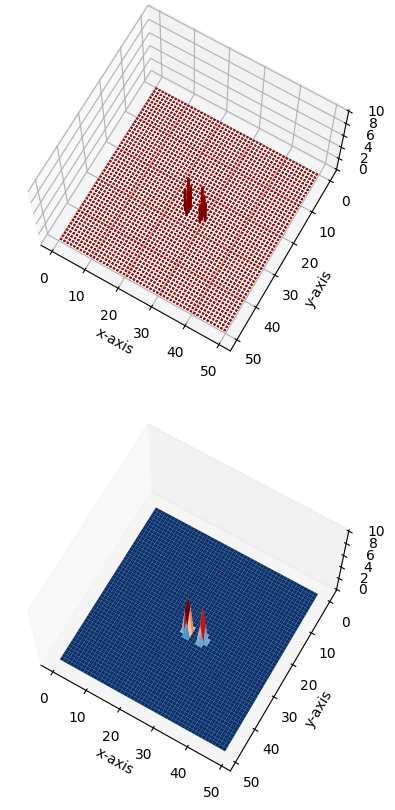

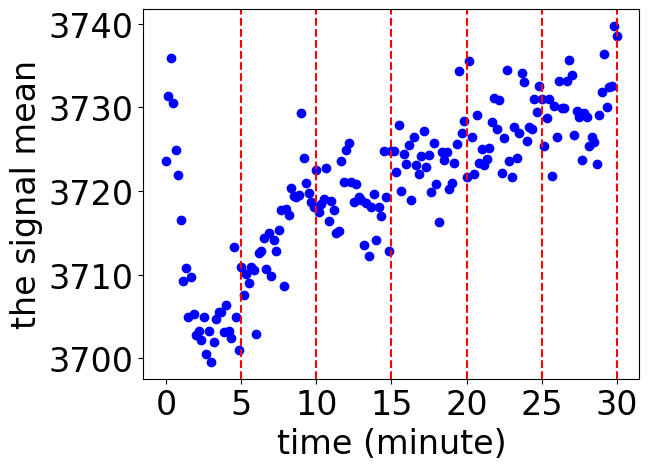

In [41]:
# Example usage
nd2Dir = "C:/Users/yzlco/Desktop/cellsecretionmap/nd2/"
filename="Sun_0919_nd06.nd2" #CNI4004,CNI4005,CNI4007,CNI4008,CNI4010
### read signal fluorence ###
nd2_fluoro_file = filename
shift = 0
rank = 3  # 1,4,4,14,4
# read nd files
nd2_fluoro_files = nd2.ND2File(nd2Dir+nd2_fluoro_file)
framecnt0 = nd2_fluoro_files.asarray()[0][1]
nd2_fluoro_files.close()

mtx = pd.DataFrame(framecnt0)
# get coordinate
(mtx_zscore_agg_sub,max_val,max_xcoord,max_ycoord) = get_coord(mtx,zscoreCtf=5,rank =rank)
# plot 3D
mtx_pre = pd.DataFrame(np.zeros([mtx_zscore_agg_sub.shape[0],mtx_zscore_agg_sub.shape[1]]))
(X,Y,Z)=plot_3D(mtx_zscore_agg_sub,previous = mtx_pre,z_max=10,signalCutoff=2)

#########
### read signals from frames ###
nd2_file = filename
# read nd files
nd2_files = nd2.ND2File(nd2Dir+nd2_file)
framecnts = nd2_files.asarray()
nd2_files.close()

### generate mean values ###
signalmean=[]
for idx in range(0,len(framecnts)):
    frmpd=pd.DataFrame(framecnts[idx][0]).astype(np.int64)        
    signalmean.append(frmpd.mean().mean())
minValue_idx = signalmean.index(min(signalmean))
signalset=[]
for idx in range(0,len(framecnts)):
    frmpd=pd.DataFrame(framecnts[idx][0]).astype(np.int64)
    frmpd_min=pd.DataFrame(framecnts[minValue_idx][0]).astype(np.int64)
    signalset.append(frmpd-frmpd_min)
### plot signal timeline in frames
plotMean_curve(signalmean,size=24)
### get reshape 50*50 grids
timepoints=[0,5*6,10*6,15*6,20*6,25*6,30*6]
timel=5
set_df=pd.DataFrame()
for timepoint in timepoints:
    if timepoint == 0:
        frmpd=pd.DataFrame(signalset[timepoint]).astype(np.int64)
        frmpd_agg=aggregate_by_blocks(frmpd,shift=shift)
        frmpd_agg_sub=truncate_50(frmpd_agg,max_xcoord,max_ycoord)
    else:
        frmpd=pd.DataFrame()
        for idx in range(0,timel):
            frmpdsel=pd.DataFrame(signalset[timepoint-idx]).astype(np.int64)
            if frmpd.shape[0]==0:
                frmpd=frmpdsel
            else:
                frmpd=frmpd+frmpdsel
        frmpd=frmpd/timel
        frmpd_agg=aggregate_by_blocks(frmpd,shift=shift)
        frmpd_agg_sub=truncate_50(frmpd_agg,max_xcoord,max_ycoord)        
    set_df=pd.concat([set_df,frmpd_agg_sub])

array([[5.00000000e-01, 0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
       [1.66666667e-01, 5.00000000e-01, 9.65925826e-01, 1.00000000e+00],
       [1.66666667e-01, 8.66025404e-01, 8.66025404e-01, 1.00000000e+00],
       [5.00000000e-01, 1.00000000e+00, 7.07106781e-01, 1.00000000e+00],
       [8.33333333e-01, 8.66025404e-01, 5.00000000e-01, 1.00000000e+00],
       [1.00000000e+00, 5.00000000e-01, 2.58819045e-01, 1.00000000e+00],
       [1.00000000e+00, 1.22464680e-16, 6.12323400e-17, 1.00000000e+00]])

array([[5.00000000e-01, 0.00000000e+00, 1.00000000e+00, 1.00000000e+00],
       [1.66666667e-01, 5.00000000e-01, 9.65925826e-01, 1.00000000e+00],
       [1.66666667e-01, 8.66025404e-01, 8.66025404e-01, 1.00000000e+00],
       [5.00000000e-01, 1.00000000e+00, 7.07106781e-01, 1.00000000e+00],
       [8.33333333e-01, 8.66025404e-01, 5.00000000e-01, 1.00000000e+00],
       [1.00000000e+00, 5.00000000e-01, 2.58819045e-01, 1.00000000e+00],
       [1.00000000e+00, 1.22464680e-16, 6.12323400e-17, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

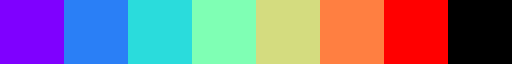

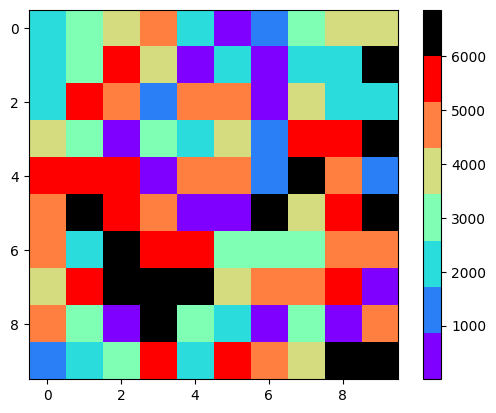

In [70]:
customRange = list(np.linspace(500,5000,7))
full = len(customRange)
top = plt.get_cmap('rainbow', full)
top(np.linspace(0, 1, full))
extended_levels = np.append(customRange, [10000])  # Extend the levels
newcolors = np.vstack((top(np.linspace(0, 1, full)),[0, 0, 0, 1])) # [R, G, B, A]
newcolors

extended_cmap = ListedColormap(newcolors)
extended_cmap
# Create a BoundaryNorm to map data values to colormap levels
norm = BoundaryNorm(extended_levels, extended_cmap.N)
norm
#newcmp = LinearSegmentedColormap.from_list('newcmp',newcolors)
#newcmp
# Create some data
data = np.random.rand(10, 10) * 10000  # Values between 0 and 1.5
# Plot the data with the new colormap and norm
plt.imshow(data, cmap=extended_cmap, ) # norm=norm
plt.colorbar()
plt.show()

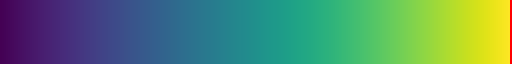

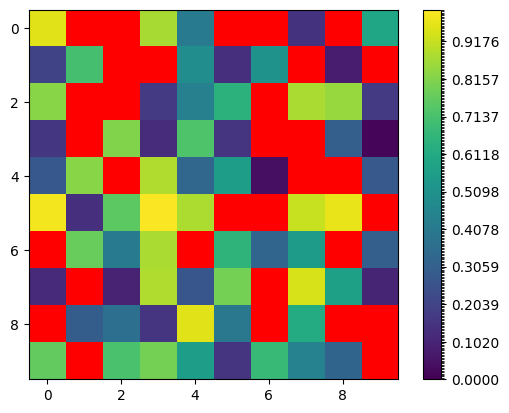

In [58]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import BoundaryNorm, ListedColormap

# Create some data
data = np.random.rand(10, 10) * 1.5  # Values between 0 and 1.5

# Define the color levels and colors
levels = np.linspace(0, 1, 256)
extended_levels = np.append(levels, [1.5])  # Extend the levels

# Define the original colormap
cmap = plt.get_cmap('viridis')  # You can choose any colormap you like

# Get the colors from the colormap
colors = cmap(np.linspace(0, 1, cmap.N))

# Append the color for values above the maximum (e.g., red)
extended_colors = np.vstack((colors, [1, 0, 0, 1]))  # [R, G, B, A]

# Create a new colormap with the appended color
extended_cmap = ListedColormap(extended_colors)
extended_cmap
# Create a BoundaryNorm to map data values to colormap levels
norm = BoundaryNorm(extended_levels, extended_cmap.N)

# Plot the data with the new colormap and norm
plt.imshow(data, cmap=extended_cmap, norm=norm)
plt.colorbar()
plt.show()

(103, 103)

Maximum Value: 7.6089135855841645
Index: 53
Column: 53


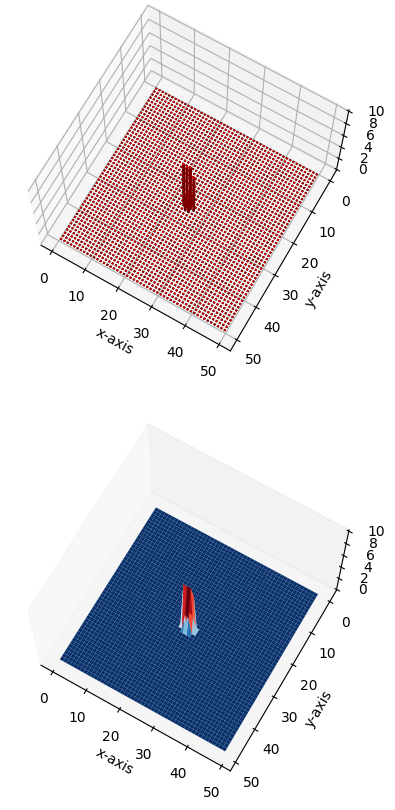

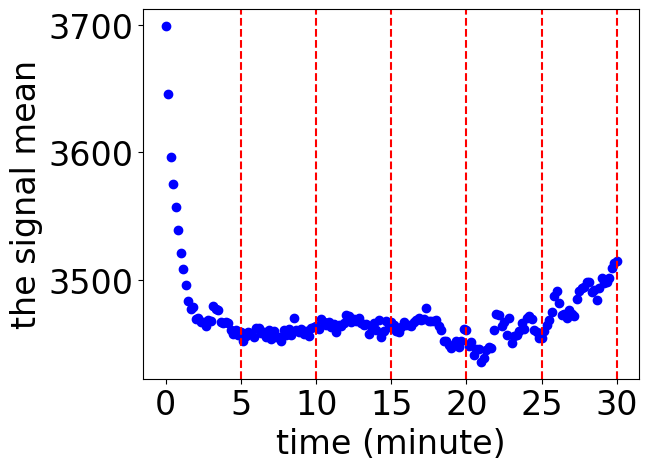

In [38]:
# Example usage
nd2Dir = "C:/Users/yzlco/Desktop/cellsecretionmap/nd2/"
filename="Jurkat T in CNI4004" #CNI4004,CNI4005,CNI4007,CNI4008,CNI4010
### read signal fluorence ###
nd2_fluoro_file = filename+' cell fluoro.nd2'
nd2_fluoro_file = '0925_nd02.nd2' # 0925_nd02.nd2,0925_nd03.nd2,0925_nd04.nd2,0925_nd05.nd2

shift = 0
rank = 1  # CNI4004 1,CNI4005 4,CNI4007 4,CNI4008 14,CNI4010 4
# read nd files
nd2_fluoro_files = nd2.ND2File(nd2Dir+nd2_fluoro_file)
framecnt0 = nd2_fluoro_files.asarray()
nd2_fluoro_files.close()

mtx = pd.DataFrame(framecnt0)
# get coordinate
(mtx_zscore_agg_sub,max_val,max_xcoord,max_ycoord) = get_coord(mtx,zscoreCtf=5,rank =rank)
# plot 3D
mtx_pre = pd.DataFrame(np.zeros([mtx_zscore_agg_sub.shape[0],mtx_zscore_agg_sub.shape[1]]))
(X,Y,Z)=plot_3D(mtx_zscore_agg_sub,previous = mtx_pre,z_max=10,signalCutoff=2)

#########
### read signals from frames ###
nd2_file = "Sun_"+nd2_fluoro_file#filename+'.nd2'
# read nd files
nd2_files = nd2.ND2File(nd2Dir+nd2_file)
framecnts = nd2_files.asarray()
nd2_files.close()
### generate mean values ###
signalmean=[]
for idx in range(0,len(framecnts)):
    frmpd=pd.DataFrame(framecnts[idx]).astype(np.int64)        
    signalmean.append(frmpd.mean().mean())
minValue_idx = signalmean.index(min(signalmean))
signalset=[]
frmpd0=pd.DataFrame(framecnts[0]).astype(np.int64) 
for idx in range(0,len(framecnts)):
    frmpd=pd.DataFrame(framecnts[idx]).astype(np.int64)
    frmpd_min=pd.DataFrame(framecnts[minValue_idx]).astype(np.int64)
    signalset.append(frmpd-frmpd_min)
### plot signal timeline in frames
plotMean_curve(signalmean,size=24)
### get reshape 50*50 grids
timepoints=[0,5*6,10*6,15*6,20*6,25*6,30*6]
timel=5
set_df=pd.DataFrame()
for timepoint in timepoints:
    if timepoint == 0:
        frmpd=pd.DataFrame(signalset[timepoint]).astype(np.int64)
        frmpd_agg=aggregate_by_blocks(frmpd,shift=shift)
        frmpd_agg_sub=truncate_50(frmpd_agg,max_xcoord,max_ycoord)
    else:
        frmpd=pd.DataFrame()
        for idx in range(0,timel):
            frmpdsel=pd.DataFrame(signalset[timepoint-idx]).astype(np.int64)
            if frmpd.shape[0]==0:
                frmpd=frmpdsel
            else:
                frmpd=frmpd+frmpdsel
        frmpd=frmpd/timel
        frmpd_agg=aggregate_by_blocks(frmpd,shift=shift)
        frmpd_agg_sub=truncate_50(frmpd_agg,max_xcoord,max_ycoord)        
    set_df=pd.concat([set_df,frmpd_agg_sub])

In [ ]:
set_df

In [44]:
nd2_fluoro_files = nd2.ND2File(nd2Dir+nd2_fluoro_file)


C:\Users\yzlco\AppData\Local\Temp\ipykernel_984\1399908151.py:1: UserWarning:

ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.



<bound method ND2File.frame_metadata of <ND2File at 0x1ccc1efafd0: 'Jurkat T in CNI4004 cell fluoro.nd2' uint16: mappingproxy({'Y': 512, 'X': 512})>>

In [45]:
nd2_fluoro_files.metadata

Metadata(contents=Contents(channelCount=1, frameCount=1), channels=[Channel(channel=ChannelMeta(name='DAPI', index=0, color=Color(r=0, g=102, b=255, a=1.0), emissionLambdaNm=460.0, excitationLambdaNm=360.0), loops=None, microscope=Microscope(objectiveMagnification=40.0, objectiveName='Plan Fluor 40x DIC M N2', objectiveNumericalAperture=0.75, zoomMagnification=1.0, immersionRefractiveIndex=1.0, projectiveMagnification=1.0, pinholeDiameterUm=None, modalityFlags=['fluorescence']), volume=Volume(axesCalibrated=(True, True, False), axesCalibration=(0.4, 0.4, 1.0), axesInterpretation=('distance', 'distance', 'distance'), bitsPerComponentInMemory=16, bitsPerComponentSignificant=16, cameraTransformationMatrix=(0.9999969963971782, 0.0024509583068528483, -0.0024509583068528483, 0.9999969963971782), componentCount=1, componentDataType='unsigned', voxelCount=(512, 512, 1), componentMaxima=[0.0], componentMinima=[0.0], pixelToStageTransformationMatrix=(0.3999987985588713, 0.0009803833227411394, -1

In [35]:
list(np.linspace(500,5000,7))

[500.0, 1250.0, 2000.0, 2750.0, 3500.0, 4250.0, 5000.0]

In [36]:
customRange = list(np.linspace(500,5000,7))
full = len(customRange)
top = plt.get_cmap('rainbow', full)
newcolors = np.vstack(top(np.linspace(0, 1, full)),)
newcmp = ListedColormap(newcolors, name='newcmp')

In [38]:
customRange

[500.0, 1250.0, 2000.0, 2750.0, 3500.0, 4250.0, 5000.0]

In [34]:
#set_df[set_df>5000] = 5000
set_df = set_df.reset_index(drop=True)

set_df.to_csv(nd2Dir+filename+".txt",sep="\t",index=None,header=None)

In [ ]:
# Example usage
nd2Dir = "C:/Users/yzlco/Desktop/cellsecretionmap/nd2/"
nd2_file = 'Jurkat T in CNI4004 cell fluoro.nd2'
output_csv = 'Jurkat T in CNI4 cell fluorescence.csv'


In [187]:
def Dplot(mtx,mtx_pre):
    ax = fig.add_subplot(211, projection='3d')
    lx,ly= size(mtx,0),size(mtx,1)       # Work out matrix dimensions
    xpos, ypos = np.arange(0,lx,1),np.arange(0,ly,1)    # Set up a mesh of positions
    xpos, ypos = np.meshgrid(xpos+0.25, ypos+0.25)  
    xpos, ypos = xpos.flatten(),ypos.flatten()   # Convert positions to 1D array
    zpos = np.zeros(lx*ly)
    dx = 0.5 * np.ones_like(zpos)
    dy = dx.copy()
    delta_dz = mtx.values.flatten() - mtx_pre.values.flatten()
    delta_dz[delta_dz<0] = 0 # replace the negative values by zero
    #print(delta_dz)
    dz_pre = mtx_pre.values.flatten()
    #cs = ['r', 'g', 'b', 'y', 'c'] * ly   
    #print(xpos.shape)
    #print(ypos.shape)
    #print(dz_pre.shape)
    _zpos = zpos   # the starting zpos for each bar
    
    ax.bar3d(xpos, ypos,_zpos, dx, dy, dz_pre, color='grey', shade=True)
    _zpos += dz_pre
    ax.bar3d(xpos, ypos,_zpos, dx, dy, delta_dz, color='r', shade=True)
    ax.set_zlim(0,z_max)
    azim = 120
    elev = 70
    dist = 10
    if azim is not None:
        ax.azim = azim
    if dist is not None:
        ax.dist = dist
    if elev is not None:
        ax.elev = elev
    ax.set_xlabel('x-axis')
    ax.set_ylabel('y-axis')
    ax.invert_xaxis()

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:28: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(0, -0.015, '-0.015'),
 Text(0, 0.0, '0.0'),
 Text(0, 0.015, '0.015'),
 Text(0, 0.03, '0.03'),
 Text(0, 0.045, '0.045'),
 Text(0, 0.06, '0.06')]

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(-20.0, 0, '-2000'),
 Text(0.0, 0, '0'),
 Text(20.0, 0, '2000'),
 Text(40.0, 0, '4000'),
 Text(60.0, 0, '6000'),
 Text(80.0, 0, '8000'),
 Text(100.0, 0, '10000'),
 Text(120.0, 0, '12000')]

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:30: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(0, -0.015, '-1'),
 Text(0, 0.0, '0'),
 Text(0, 0.015, '1'),
 Text(0, 0.03, '3'),
 Text(0, 0.045, '4'),
 Text(0, 0.06, '6')]

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:45: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(-0.03, 0, '-0.03'),
 Text(0.0, 0, '0.0'),
 Text(0.03, 0, '0.03'),
 Text(0.06, 0, '0.06'),
 Text(0.09, 0, '0.09'),
 Text(0.12, 0, '0.12')]

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:46: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(-0.03, 0, '-3'),
 Text(0.0, 0, '0'),
 Text(0.03, 0, '3'),
 Text(0.06, 0, '6'),
 Text(0.09, 0, '9'),
 Text(0.12, 0, '12')]

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\2655245468.py:47: UserWarning:

FixedFormatter should only be used together with FixedLocator



[Text(0, -20.0, '-2000'),
 Text(0, 0.0, '0'),
 Text(0, 20.0, '2000'),
 Text(0, 40.0, '4000'),
 Text(0, 60.0, '6000'),
 Text(0, 80.0, '8000'),
 Text(0, 100.0, '10000'),
 Text(0, 120.0, '12000')]

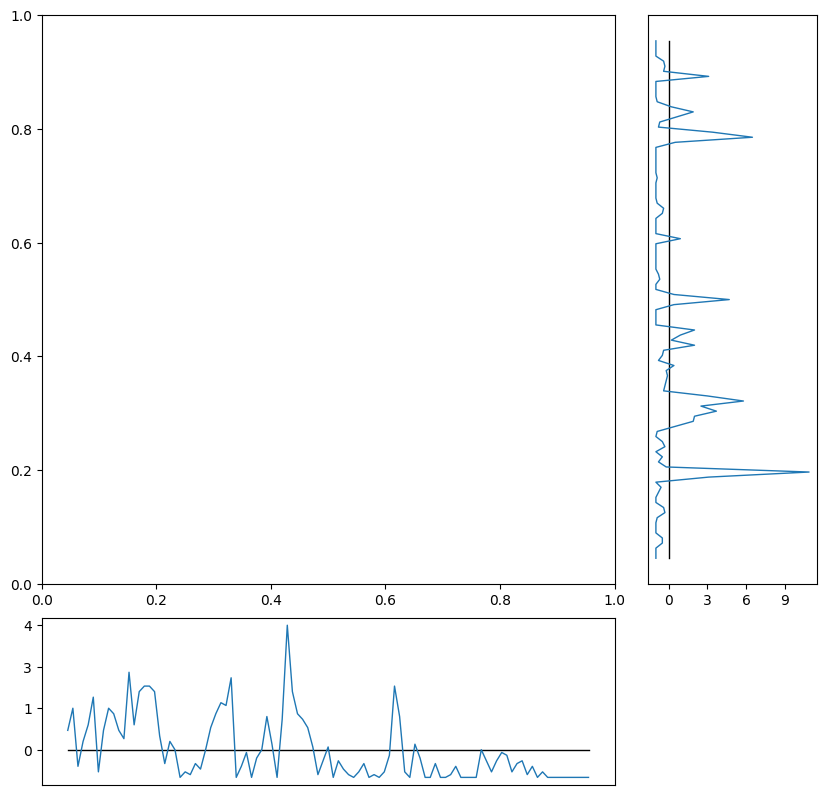

In [188]:
import seaborn as sns
fig = plt.figure(figsize=(10, 10))
#ax = fig.add_subplot(111)
ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
ax1 = plt.subplot2grid((4, 4), (3, 0), colspan=3, rowspan=1)
ax2 = plt.subplot2grid((4, 4), (0, 3),colspan=1, rowspan=3)  
# Set the maximum number of ticks on the x-axis
max_ticks = 3
linewidth = 1
max_ticks = 5
tick_labelsize = 10
labelweight = 3
import matplotlib.ticker as ticker
#sns.heatmap(mtx_zscore, annot=True, cmap='viridis', ax=ax) 
#ax1.plot(np.arange(0,1,1/x_unit),(np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit)),color='Black',linewidth=linewidth)  
ax1.plot(np.arange(0,x_unit,1),(np.arange(0,x_unit,1)-np.arange(0,x_unit,1)),color='Black',linewidth=linewidth)  
ax1.plot(np.arange(0,x_unit,1),x_drvtv,linewidth=linewidth)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_label_position("right")
#ax1.yaxis.tick_right()
ax1.yaxis.set_tick_params(labelsize=tick_labelsize) 
# Set the new tick locations on the x-axis
ax1.yaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
#ax1.set_yticklabels([np.float(i) *100 for i in ax1.get_yticks()])
#ax1.set_yticks(range(len([np.float(i)*100 for i in ax1.get_yticks()])))
# Set tick label font weight
# Optionally, you can format the tick labels if needed
ax1.set_yticklabels(ax1.get_yticks(), rotation=0, weight=labelweight)    
ax1.set_xticklabels(["{}".format(int(tick*100)) for tick in ax1.get_xticks()])
ax1.set_yticklabels(["{}".format(int(tick*100)) for tick in ax1.get_yticks()])

ax2.plot(np.arange(0,y_unit,1)-np.arange(0,y_unit,1),np.arange(0,y_unit,1),color='Black',linewidth=linewidth)
ax2.plot(y_drvtv,np.arange(0,y_unit,1),linewidth=linewidth)
#ax2.plot(y_drvtv,np.arange(0.5,y_unit-0.5,1),linewidth=linewidth)
ax2.invert_yaxis()
ax2.xaxis.set_tick_params(labelsize=tick_labelsize)
ax2.yaxis.set_visible(False)
# Set the new tick locations on the x-axis
ax2.xaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
#ax2.set_xticklabels([np.float(i)*100 for i in ax2.get_xticks()])
#ax2.set_xticks(range(len([np.float(i)*100 for i in ax2.get_xticks()])))

# Set tick label font weight
# Optionally, you can format the tick labels if needed
ax2.set_xticklabels(ax2.get_xticks(), rotation=0, weight=labelweight)
ax2.set_xticklabels(["{}".format(int(tick*100)) for tick in ax2.get_xticks()])   
ax2.set_yticklabels(["{}".format(int(tick*100)) for tick in ax2.get_yticks()])

In [19]:


(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)
(X,Y,Z)=plot_3D(mtx,previous = mtx_pre,z_max=5)
(x_unit,y_unit) = (x_end-x_start+1,y_end-y_start+1)

(x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
    mtx=mtx,top=1,btm=1,previous = mtx_pre,
    x_unit = x_unit,y_unit = y_unit, 
    cmlt_contour_color = cmlt_contour_color[i],
    show_contour = True,
    show_cmlt_contour = True,
    densityYN=False,
    timeline = timeline[i],
    tick_labelsize = 10,
    linewidth= 1,
    labelweight='heavy',#
    framelinewidth = 1,
    fontname='Serif',
    fillcolor=False
)


C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3636927036.py:72: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3636927036.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3636927036.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_19888\3636927036.py:114: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.


KeyboardInterrupt



C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



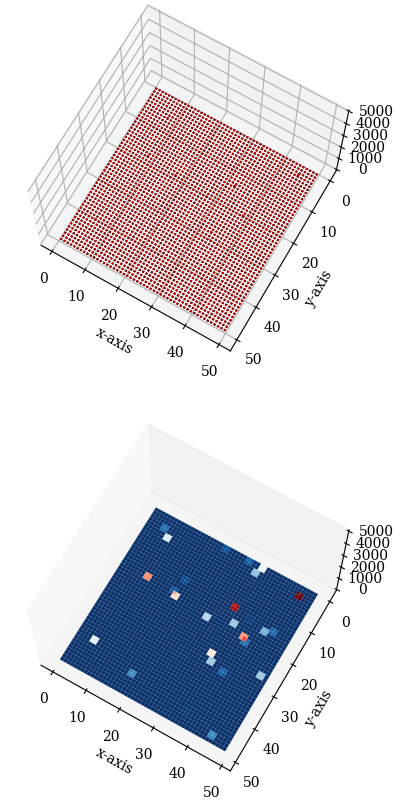

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

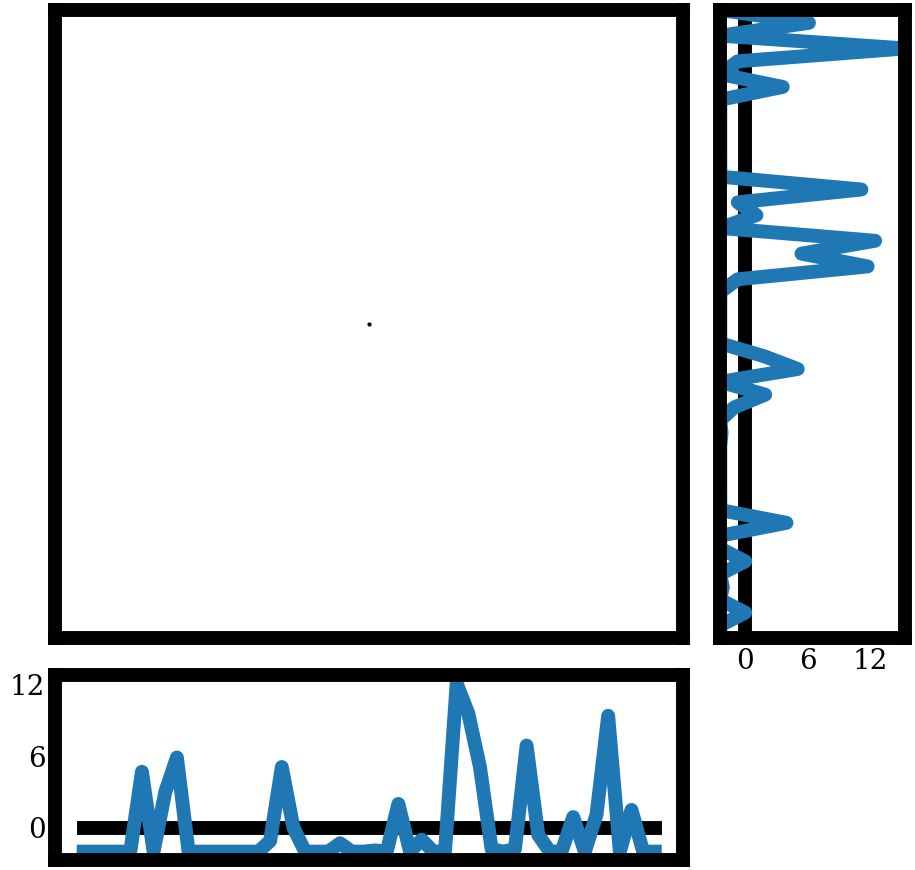

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



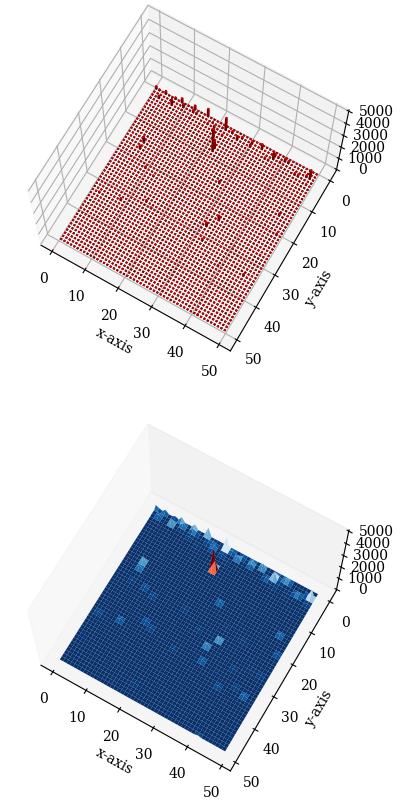

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

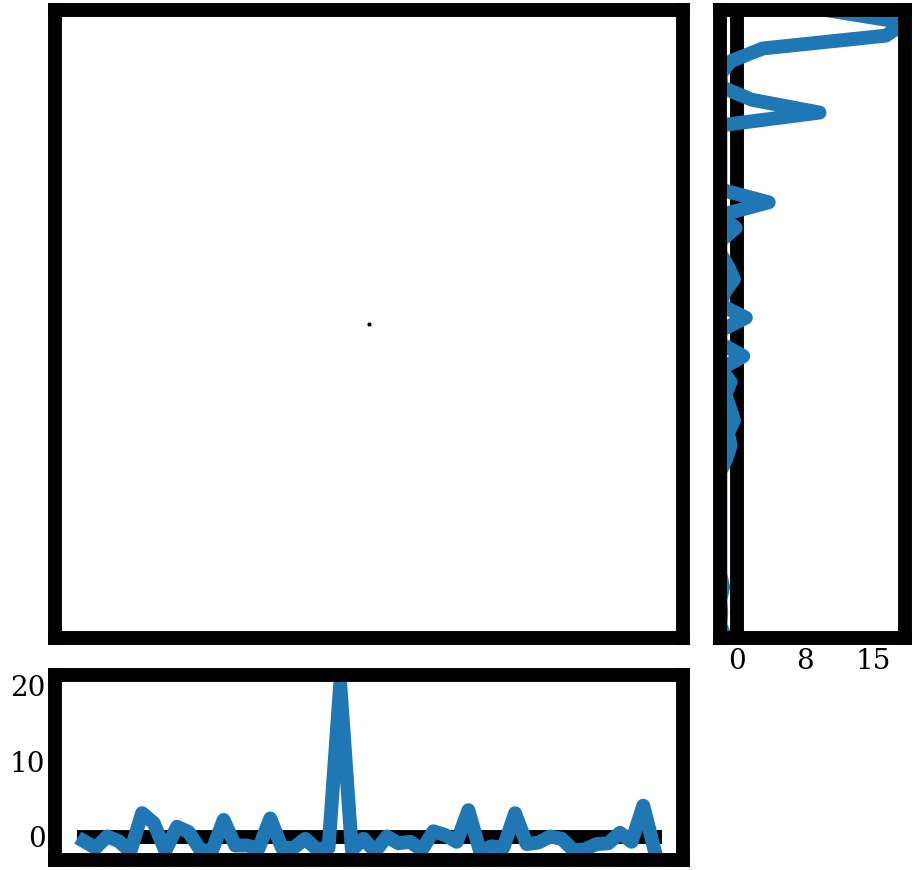

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



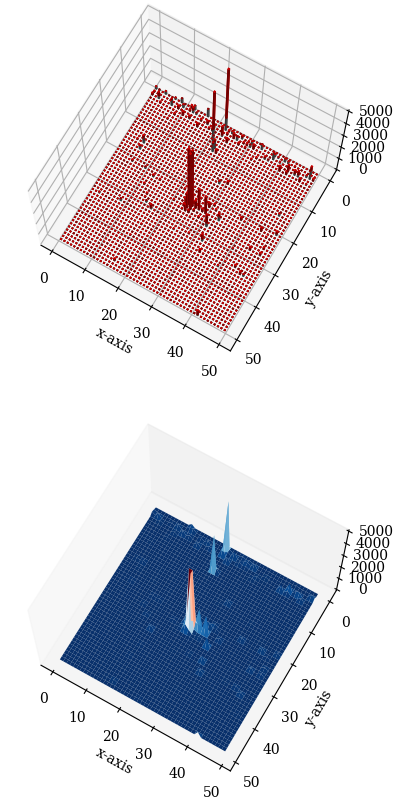

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

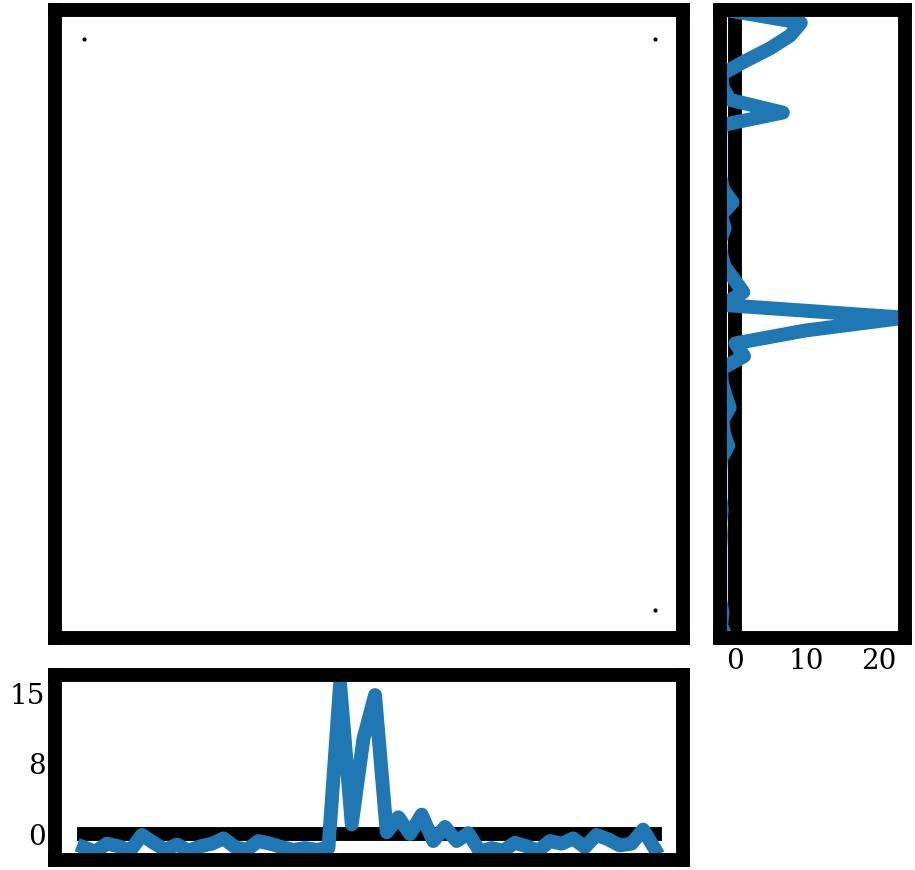

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



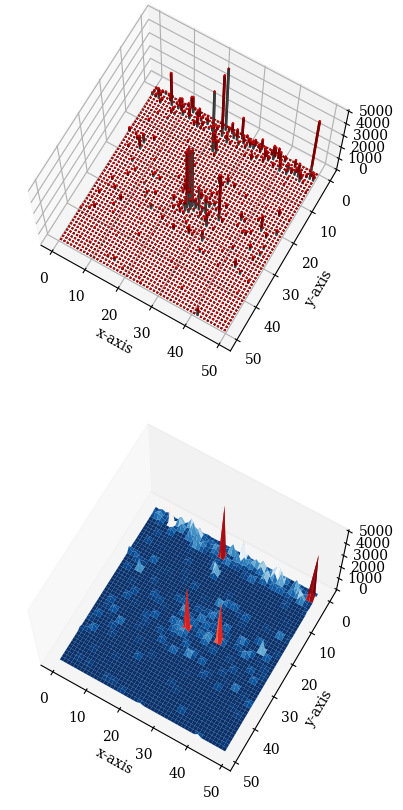

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

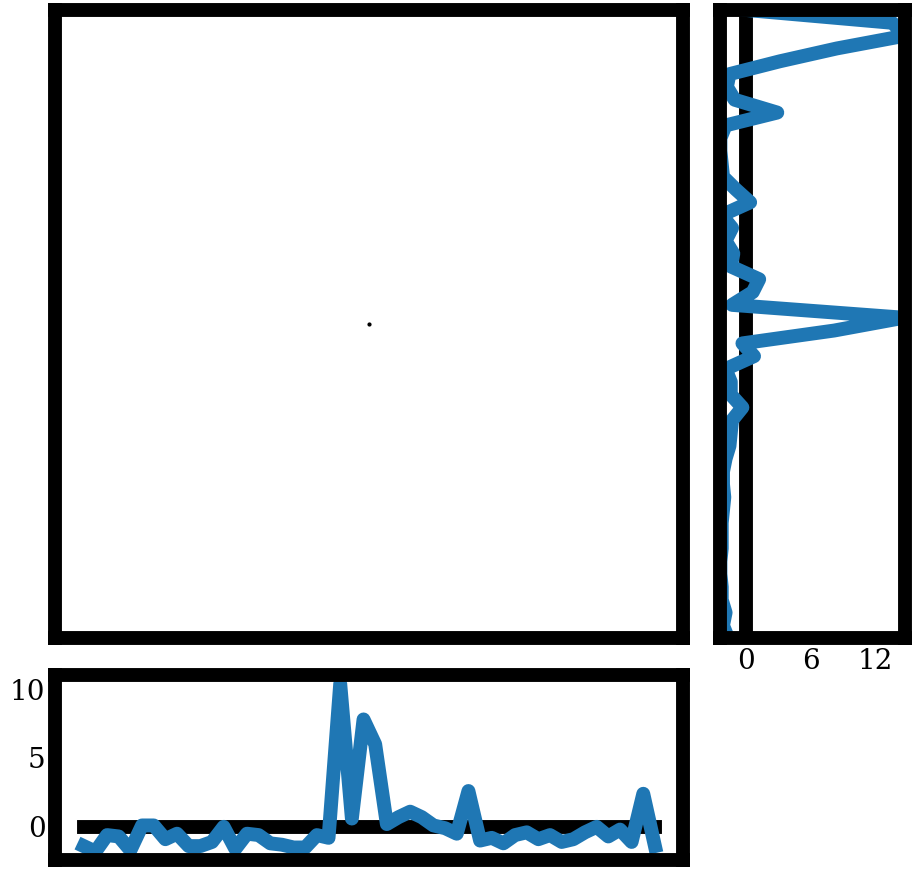

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



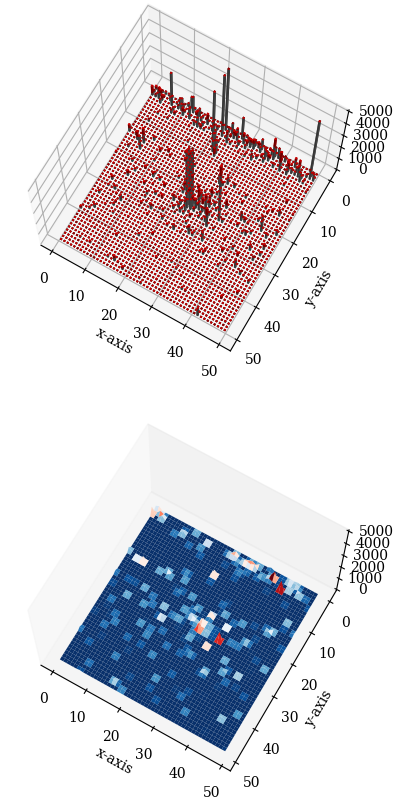

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

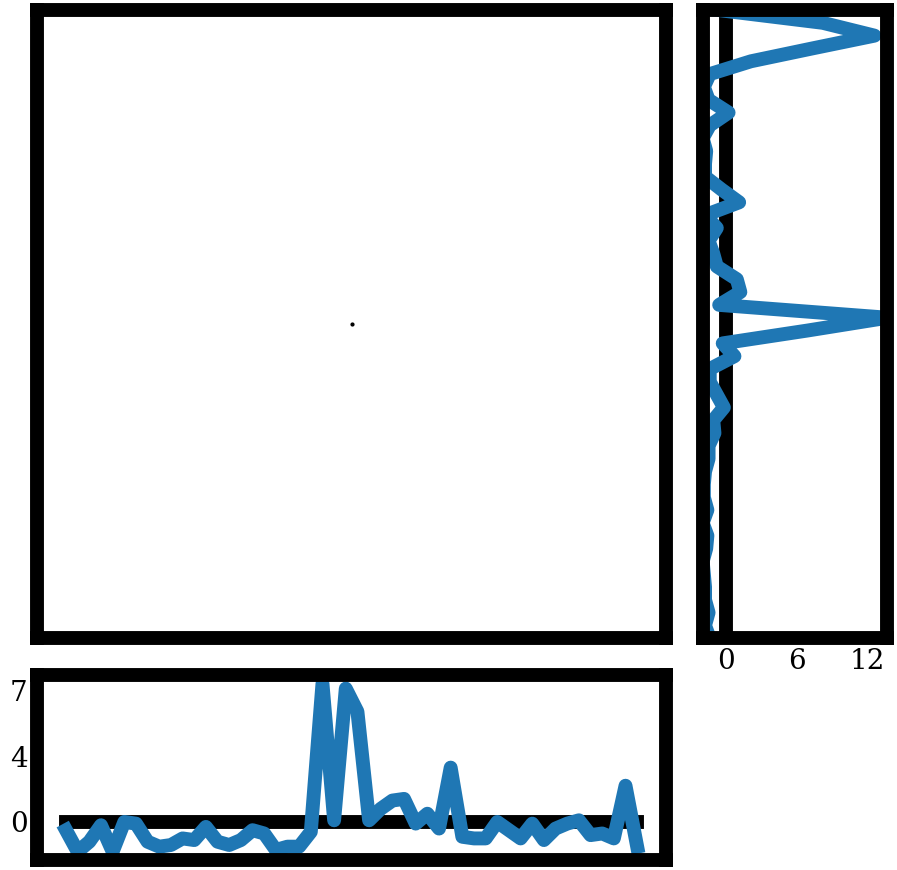

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



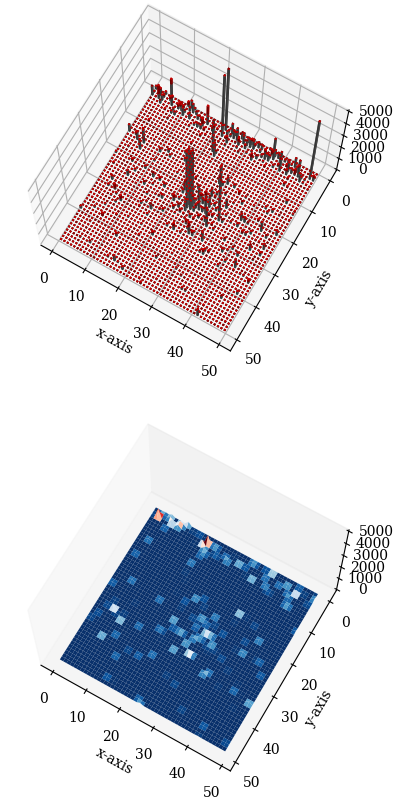

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

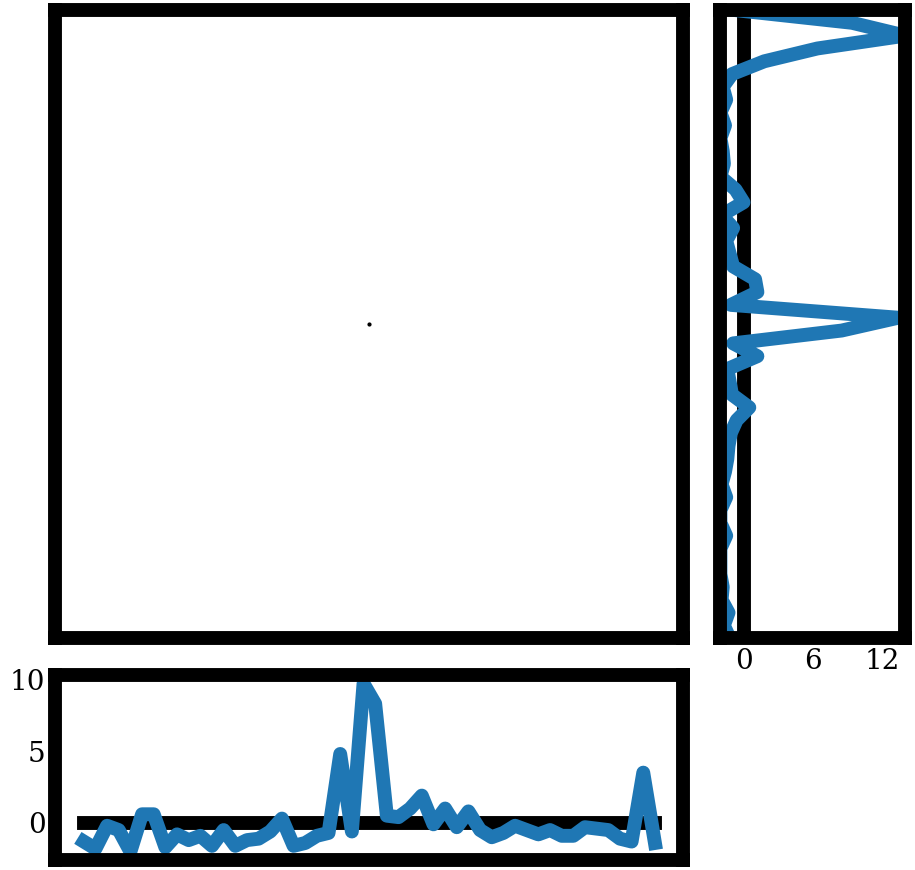

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



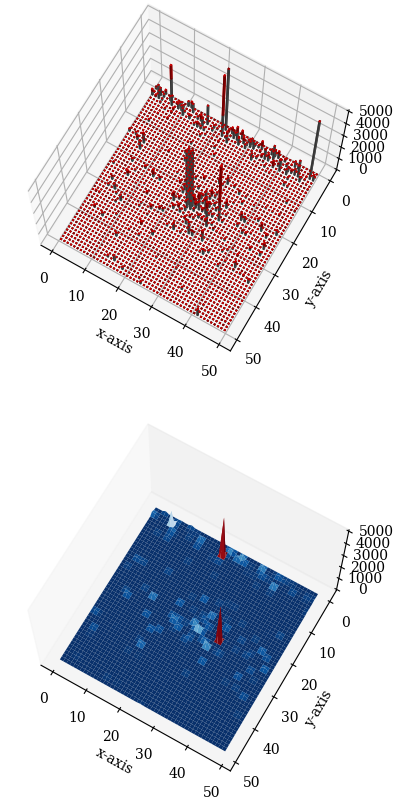

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:310: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:345: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:346: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:347: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:362: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\906712739.py:363: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\yzlco\AppData\Local\Temp\ipykernel_9972\90671

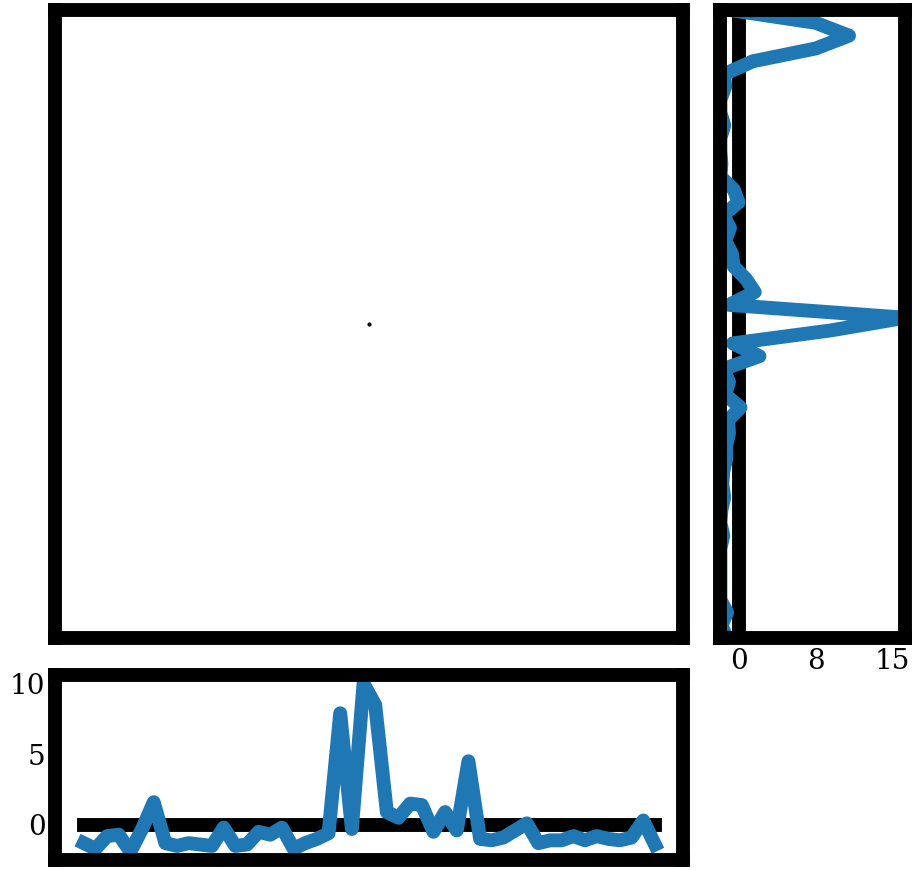

In [52]:
### upload file test 
upload = pd.read_csv("./upload.txt",sep="\t",header = None)
df =data = upload
t_time = np.int32(data.shape[0]/data.shape[1])
cmlt_contour_color = generate_colors(t_time)

contours_dfs = pd.DataFrame()
contours_cmltv_dfs = pd.DataFrame()
mtx_delta_array =[]

dpi_value = 500
linewidth = 10
framelinewidth = 10
fontname = 'Serif'
tick_labelsize = 20
labelweight = 'normal'
hs_set = [1,1,1,1,1,1,1]
hs_btm_set = [1,1,1,1,1,1,1]
densityYN = False
density = 1.0
show_contour = False
show_cmlt_contour = False
cntrlinecml = 1200.0
df_x = np.int32(df.shape[1]/2)
df_y = np.int32(df.shape[1]/2)
col_center_x,col_center_y = df_x,df_y
min_=np.int32(np.min([df_x, df.shape[1]-df_x,df_y,df.shape[1]-df_y]))
col_apothem = min_
(x_start,x_end,y_start,y_end) = (col_center_x-col_apothem,col_center_x+col_apothem,col_center_y-col_apothem,col_center_y+col_apothem)  
rangeVal = df.shape[1]


drvt_index_x_sets,drvt_index_y_sets,col_inequ_set,col_CWSNR_set = [],[],[],[]
for t in range(0,t_time,1):
    #st.write(t)
    mtx = df.iloc[t*rangeVal:(t+1)*rangeVal,0:rangeVal]
    mtx = mtx.iloc[x_start:x_end,y_start:y_end]       
    
    if (t == 0) or (t == 1): 
        #st.write('Yes')
        mtx_pre = pd.DataFrame(np.zeros(shape=(col_apothem*2, col_apothem*2)))
        mtx_pre.columns = list(range(y_start,y_end))
        mtx_pre.index=list(range(x_start,x_end))
        (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
        (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
            mtx=mtx,top=hs_set[t],btm=hs_btm_set[t],previous = mtx_pre,
            x_unit = x_end-x_start,y_unit = y_end-y_start,
            cmlt_contour_color=cmlt_contour_color[t],
            densityYN=densityYN,density=density,
            show_contour=show_cmlt_contour,show_cmlt_contour=show_cmlt_contour,
            cntrlinecml=cntrlinecml,
            timeline = str(t),
            tick_labelsize = tick_labelsize,
            dpi_value = dpi_value,
            linewidth = linewidth,
            labelweight=labelweight,
            framelinewidth=framelinewidth,
            fontname=fontname
        )
    else:
        #st.write(t)
        ## 10 mins interval
        #mtx_pre = df.iloc[(i-2)*50:(i-1)*50,0:50] 
        # 5 mins interval          
        mtx_pre = df.iloc[(t-1)*rangeVal:(t)*rangeVal,0:rangeVal]    
        mtx_pre = mtx_pre.iloc[x_start:x_end,y_start:y_end]                  
        (X,Y,Z) = plot_3D(mtx,previous = mtx_pre)
        (x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
            mtx=mtx,top=hs_set[t],btm=hs_btm_set[t],previous = mtx_pre,
            x_unit = x_end-x_start,y_unit = y_end-y_start,
            cmlt_contour_color=cmlt_contour_color[t],
            densityYN=densityYN,density=density,
            show_contour=show_cmlt_contour,show_cmlt_contour=show_cmlt_contour, 
            cntrlinecml=cntrlinecml,
            timeline = str(t),
            tick_labelsize = tick_labelsize,
            dpi_value = dpi_value,
            linewidth = linewidth,
            labelweight=labelweight,
            framelinewidth=framelinewidth,
            fontname=fontname   
        )
    mtx = mtx.reset_index(drop=True)
    mtx_pre = mtx_pre.reset_index(drop=True)
    mtx_delta=mtx-mtx_pre
    mtx_delta = pd.DataFrame(np.where(mtx_delta<0,0,mtx_delta))
   
    mtx_delta_array.append(mtx_delta)
    ### Derivative index
    drvt_index_x_sets.append(np.sum([np.abs(i) for i in np.array(x_drvtv[0:col_apothem]) - np.array(x_drvtv[-col_apothem:][::-1])])) 
    drvt_index_y_sets.append(np.sum([np.abs(i) for i in np.array(y_drvtv[0:col_apothem]) - np.array(y_drvtv[-col_apothem:][::-1])])) 
    
    ### calculate 
    inequ,CWSNR=calculate_index(mtx_delta,col_apothem*2,col_apothem*2)
    col_inequ_set.append(inequ)
    col_CWSNR_set.append(CWSNR)   

In [41]:
col_apothem

25

In [51]:
pd.DataFrame(np.where(mtx_delta_array[4]<0,0,mtx_delta_array[4]))

#mtx_delta_array = mtx_delta_array.apply(np.where, cond=mtx_delta_array < 0, other=0)

,0,1,2,3,4,...,45,46,47,48,49
0,142.505559,254.899842,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
1,0.000000,0.000000,270.284954,136.394851,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
2,562.942740,0.000000,0.000000,271.953763,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
3,0.000000,0.000000,0.000000,0.000000,0.0,...,278.599059,0.0,94.874143,0.0,0.00000
4,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
...,...,...,...,...,...,...,...,...,...,...,...
45,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
46,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
47,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000
48,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.00000


In [53]:
col_inequ_set
col_CWSNR_set

[0.32656287126478556,
 0.6452885014558535,
 0.2794465114939478,
 0.4747748836348438,
 0.29630987350695887,
 0.3501363531596442,
 0.359781244276415]

[0.2511470358654808,
 0.14269587320064703,
 0.18379075023473518,
 0.14121948498501993,
 0.1878649075278826,
 0.17904779807947743,
 0.18235313225328473]

In [85]:
x_val = np.array([2.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                  0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                  0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                  0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
x_unit = len(x_val)

# lorenz curve
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()/0.5

x_inequ = np.insert(x_inequ,0,0)
x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex

0.994535519125683

0.0

In [87]:
### signal scale ###
x_val = np.array([0,0,0,0,0,0,0,1,0,0])
x_unit = len(x_val)
# lorenz curve
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()*2

x_inequ = np.insert(x_inequ,0,0)
x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex

x_val = np.array([0,0,0,0,0,0,0,0,0,0,   0,0,0,0,1,1,0,0,0,0])
x_unit = len(x_val)
# lorenz curve
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()*2

x_inequ = np.insert(x_inequ,0,0)
x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex


-0.5

0.08

-0.5000000000000001

0.08330127018922193

In [89]:
x_val = np.array([0,0,0,0,0,0,0,0,0,0,0,
                  0,0,0,0,0,0,0,0,0,1])
x_unit=21
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()*2
x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex

x_val = np.array([0,0,0,0,0,0,0,0,0,0,1,
                  0,0,0,0,0,0,0,0,0,0])
x_unit=21
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()*2
x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex

x_val = np.array([0,0,0,0,0,0,0,0,0,0,0,
                  0,0,0,0,0,0,1,0,0,0])
x_unit=21
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit))
x_inequ.mean()*2

x_drvtv = list(DERIVATIVE(x_inequ,1))
coverageIndex = generate_coverageIndex(x_drvtv)
coverageIndex

-0.9523809523809523

0.0

5.2867763077388404e-17

0.04985410737502642

-0.6666666666666666

0.03578231507354101

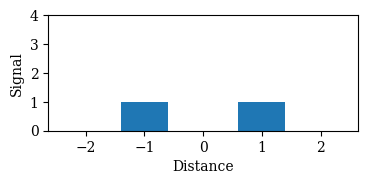

[-0.2, 0.3, -0.2, 0.3, -0.2]

inequality: -0.0
coverageIndex: 0.3464101615137754


In [580]:
########################
### test index trail ###

# input #
x_val = np.array([0,0,1,0,0])
x_val = np.array([0,0,0,1,0])
x_val = np.array([0,0,0,0,1])
x_val = np.array([0,0,3,2,1])
x_val = np.array([0,0,2,2,2])
x_val = np.array([0,0,1,2,3])
x_val = np.array([0,1,1,1,0])
x_val = np.array([1,1,1,1,1])
x_val = np.array([0,1,0,1,0])
#x_val = np.array([1,0,0,0,1])

def barPlot(values):
    fig = plt.figure(figsize=(4, 1.5))
    # Create a bar plot
    x=np.linspace(1,len(values),len(values)).astype(int)-3
    #print(x)
    plt.bar(x, values)
    plt.ylim(0,4)
    # Add labels and title
    plt.xlabel('Distance',)
    plt.ylabel('Signal',)
    #plt.title('Bar Plot Example')
    
    # Show the plot
    plt.show()
   
barPlot(x_val)

x_unit = len(x_val)
radius = 3
# lorenz curve
x_inequ = np.array((x_val/x_val.sum()).cumsum()-(np.arange(0,1,1/x_unit)+1/x_unit)[0:x_unit])
x_inequ_0 = np.insert(x_inequ,0,0)

### derivative of gini curve ###
x_drvtv = list(DERIVATIVE(x_inequ_0,1))
x_drvtv
coverageIndex = generate_coverageIndex(x_drvtv)

print("inequality: %s\ncoverageIndex: %s" %((x_inequ.mean()/0.5).round(3),coverageIndex))
########################

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


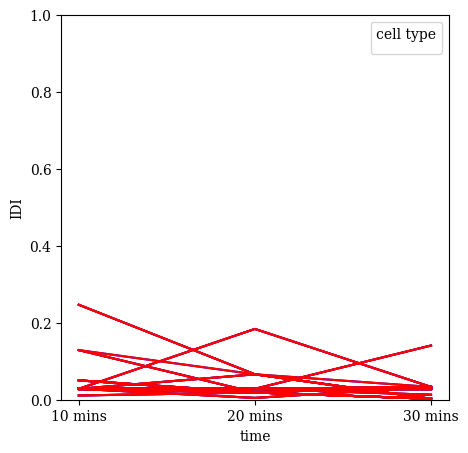

In [260]:
IL6_21_IDI=np.sqrt(np.array(drvt_index_x_sets)**2+np.array(drvt_index_y_sets)**2)
IL6_15_IDI=np.sqrt(np.array(drvt_index_x_sets)**2+np.array(drvt_index_y_sets)**2)
def plot_time(IL6_21_IDI=[],IL6_15_IDI=[],size=18,xlabel = "",ylabel="",selected_option1='',selected_option2=''):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    ax.plot(range(0,len(IL6_21_IDI),1),IL6_21_IDI,color='red',label=selected_option1)#np.repeat(0,len(IDI))
    ax.plot(range(0,len(IL6_15_IDI),1),IL6_15_IDI,color='blue',label=selected_option2)#np.repeat(0,len(IDI))
    ax.set_xlabel(xlabel, fontsize=size)
    ax.set_ylabel(ylabel, fontsize=size)
    #ax.set_ylim(0,2.5)
    fig.show() 
    ax.set_xticks([0,1,2,3,4,5])
    ax.set_xticklabels(['5','10','15','20','25','30'])  
    plt.legend(loc="upper right",title='cell type',fontsize=size-1,title_fontsize=size)
    # Adjust x-axis and y-axis tick size
    plt.tick_params(axis='both', which='major', labelsize=size)  # Change the tick size
    # Adjust the figure size
    fig.set_figwidth(5)  # Set the width in inches
    fig.set_figheight(5)  # Set the height in inches
    st.pyplot(fig)
_end = 3
plot_time(IL6_21_IDI[1:],IL6_15_IDI[1:])


In [8]:
contours.collections#.get_paths()
contours_cmltv.collections#.get_paths()

AttributeError: 'list' object has no attribute 'collections'

In [7]:

contours_df = get_contourline_df(contours)
contours_cmltv_df = get_contourline_df(contours_cmltv)    
contours_df
contours_cmltv_df

AttributeError: 'list' object has no attribute 'collections'

0.8660254037844386

0.8660254037844386

In [29]:
!pip install openpyxl


25

25

(676,)
(676,)
(676,)


/tmp/ipykernel_7120/351033940.py:76: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/tmp/ipykernel_7120/351033940.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:119: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



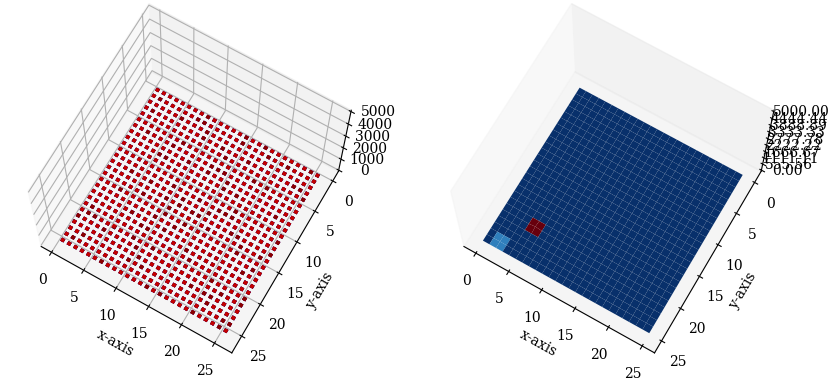

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
/tmp/ipykernel_7120/3254540760.py:179: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:180: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:181: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:195: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:196: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipyke

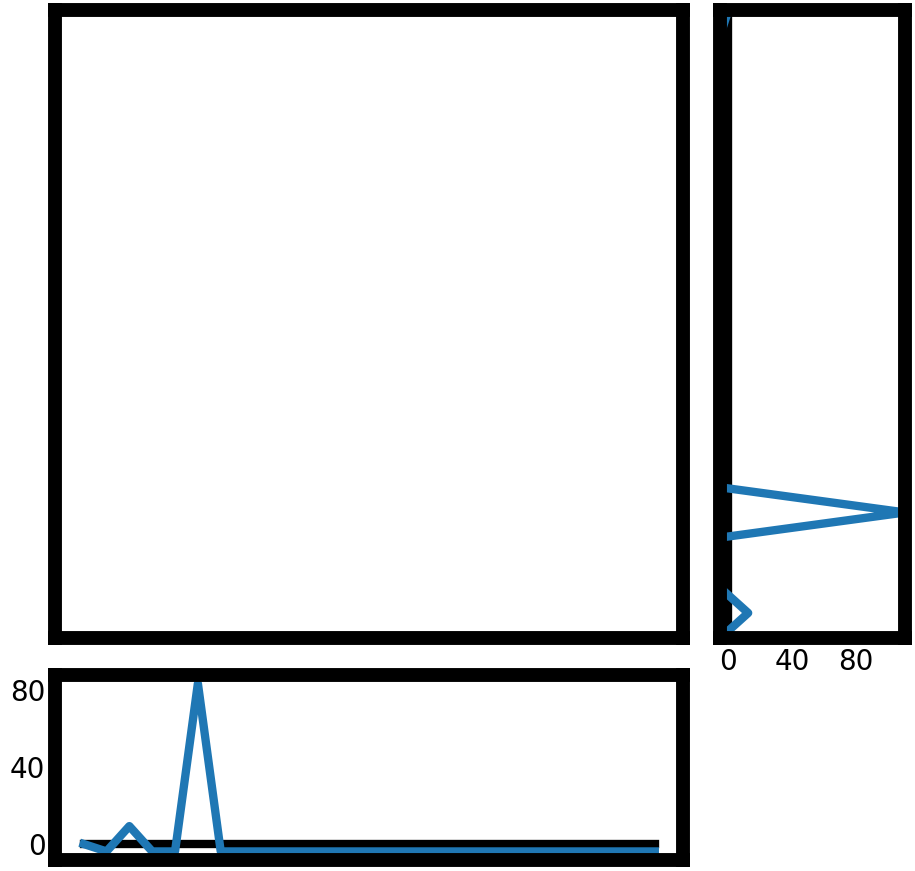

/tmp/ipykernel_7120/351033940.py:76: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/tmp/ipykernel_7120/351033940.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:119: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

findfont: Font family 'Arial' not found.


(676,)
(676,)
(676,)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

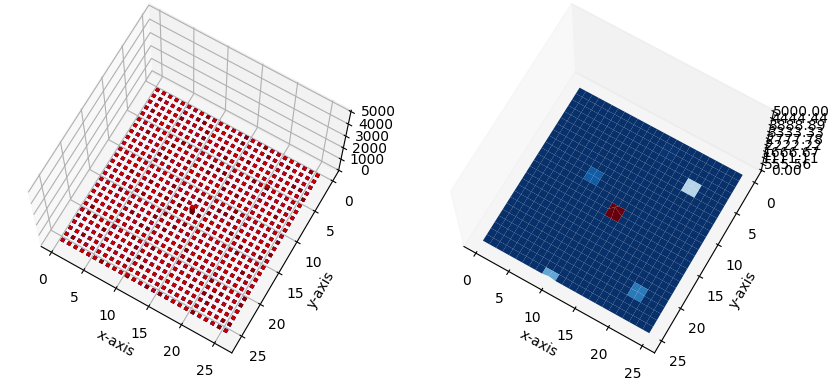

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
/tmp/ipykernel_7120/3254540760.py:179: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:180: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:181: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:195: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:196: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipyke

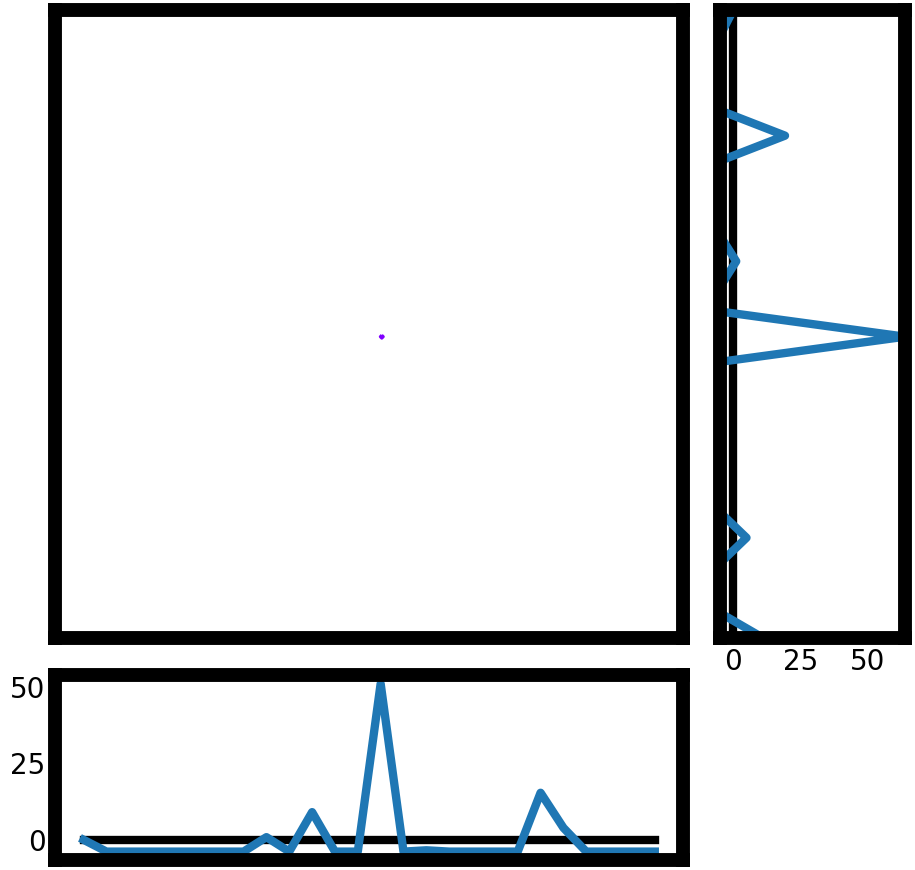

/tmp/ipykernel_7120/351033940.py:76: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/tmp/ipykernel_7120/351033940.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:119: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



(676,)
(676,)
(676,)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

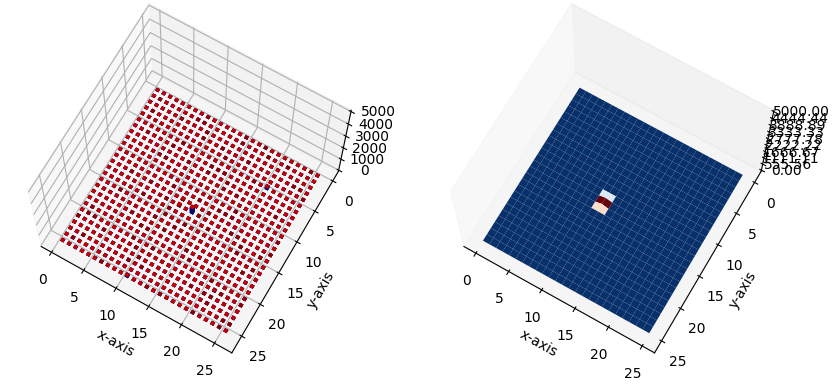

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
/tmp/ipykernel_7120/3254540760.py:179: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:180: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:181: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:195: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:196: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipyke

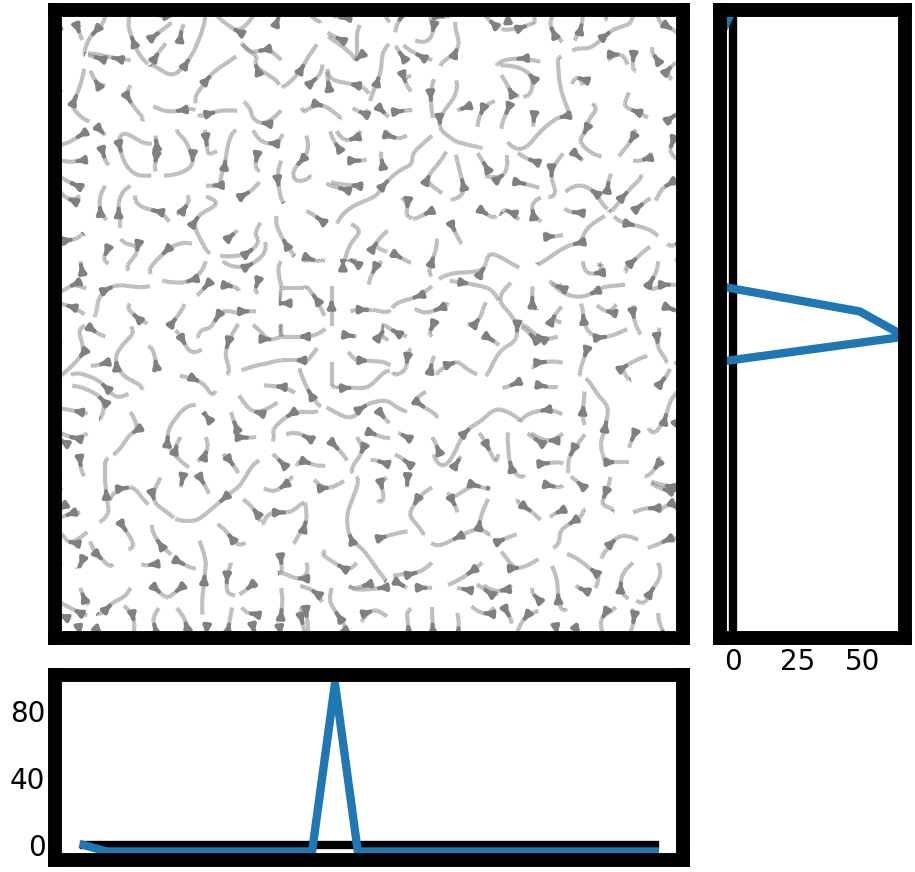

/tmp/ipykernel_7120/351033940.py:76: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/tmp/ipykernel_7120/351033940.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_7120/351033940.py:119: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

findfont: Font family 'Arial' not found.


(676,)
(676,)
(676,)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

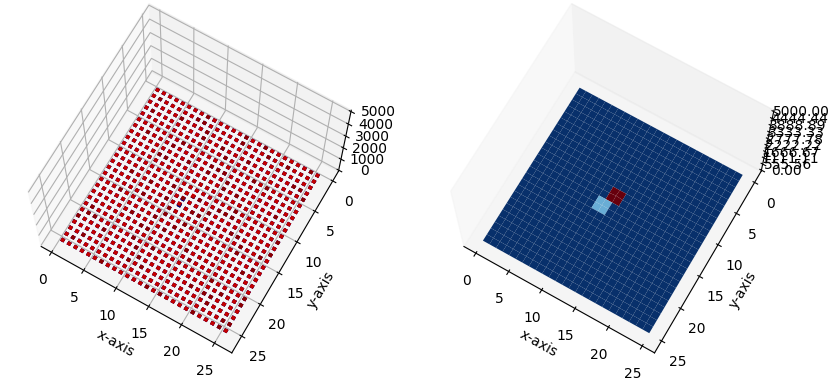

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
/tmp/ipykernel_7120/3254540760.py:179: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:180: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:181: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:195: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_7120/3254540760.py:196: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipyke

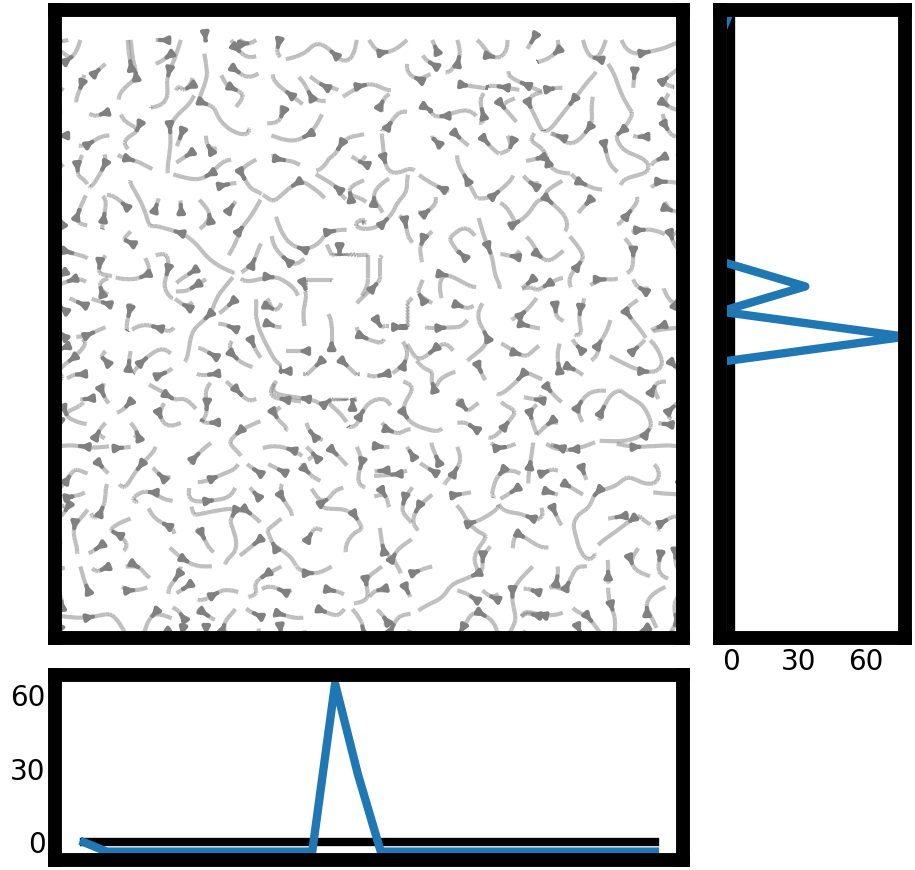

In [9]:
# 2. plot 3D array
cmlt_contour_color = ['blue','','blue','','orange','','red']

df_x,df_y = df.iloc[1,50],df.iloc[1,51]
df_x
df_y

### IL6 sheet 15
(top,btm) = ([0,0,0,0,10,10,10],[1,1,1,1,200,200,200])
diameter = 13
(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)

#### IL6 sheet 21
#(top,btm) = ([0,2,2,2,2,2,3],[1,1,1,1,200,200,200])
#diameter = 15
#(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)
#
#### IL6 sheet 13
#(top,btm) = ([0,2,2,2,2,2,3],[1,1,1,1,200,200,200])
#diameter = 9
#(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)


### IL6 Sheet12
#diameter = 8
#(x_start,x_end,y_start,y_end) = (29-diameter,29+diameter,27-diameter,27+diameter)
#
### IL6 Sheet13
#diameter = 9
#(x_start,x_end,y_start,y_end) = (41-diameter,41+diameter,27-diameter,27+diameter)

###
x_inequ_array = []
y_inequ_array = []
x_value_array = []
y_value_array = []
average_exp = []
mtx_sets = []
mtx_pre_sets = []

x_unit_sets = []
y_unit_sets = []
top_sets = []
btm_sets = []
cmlt_contour_color_sets = []
drvt_index_x_sets = []
drvt_index_y_sets = []

for i in range(0,7,2):
    mtx = df.iloc[i*50:(i+1)*50,0:50]
    mtx = mtx.iloc[x_start:x_end,y_start:y_end] 
    mtx_sets.append(mtx)
    top_sets.append(top[i])
    btm_sets.append(btm[i])
    cmlt_contour_color_sets.append(cmlt_contour_color[i])
    if i == 0:
        mtx_pre = pd.DataFrame(np.zeros(shape=(x_end-x_start, y_end-y_start)))
        mtx_pre.columns = range(y_start,y_end)
        mtx_pre.index=range(x_start,x_end)
        (X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
        (x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(mtx=mtx,top=top[i],btm=btm[i],previous = mtx_pre,
                                                        x_unit = x_end-x_start,y_unit = y_end-y_start,
                                                        cmlt_contour_color=cmlt_contour_color[i])
        mtx_pre_sets.append(mtx_pre)
        x_unit_sets.append(x_end-x_start)
        y_unit_sets.append(y_end-y_start)
    else:
        # 10 mins interval
        mtx_pre = df.iloc[(i-2)*50:(i-1)*50,0:50]      
        mtx_pre = mtx_pre.iloc[x_start:x_end,y_start:y_end]
        (X,Y,Z) = plot_3D(mtx,previous = mtx_pre)
        (x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(mtx=mtx,top=top[i],btm=btm[i],previous = mtx_pre,
                                                        x_unit = x_end-x_start,y_unit = y_end-y_start,
                                                        cmlt_contour_color=cmlt_contour_color[i])
        mtx_pre_sets.append(mtx_pre)
        x_unit_sets.append(x_end-x_start)
        y_unit_sets.append(y_end-y_start)
    ### Derivative index
    drvt_index_x_sets.append(np.sum([np.abs(i) for i in np.array(x_drvtv[0:13]) - np.array(x_drvtv[-13:][::-1])])) 
    drvt_index_y_sets.append(np.sum([np.abs(i) for i in np.array(y_drvtv[0:13]) - np.array(y_drvtv[-13:][::-1])])) 
    
    #x_inequ_array.append(x_inequ)
    #y_inequ_array.append(y_inequ)
    #x_value_array.append(mtx.sum(0))
    #y_value_array.append(mtx.sum(1))       
    #average_exp.append(mtx.mean().mean())
    


/tmp/ipykernel_136262/3390478046.py:90: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.



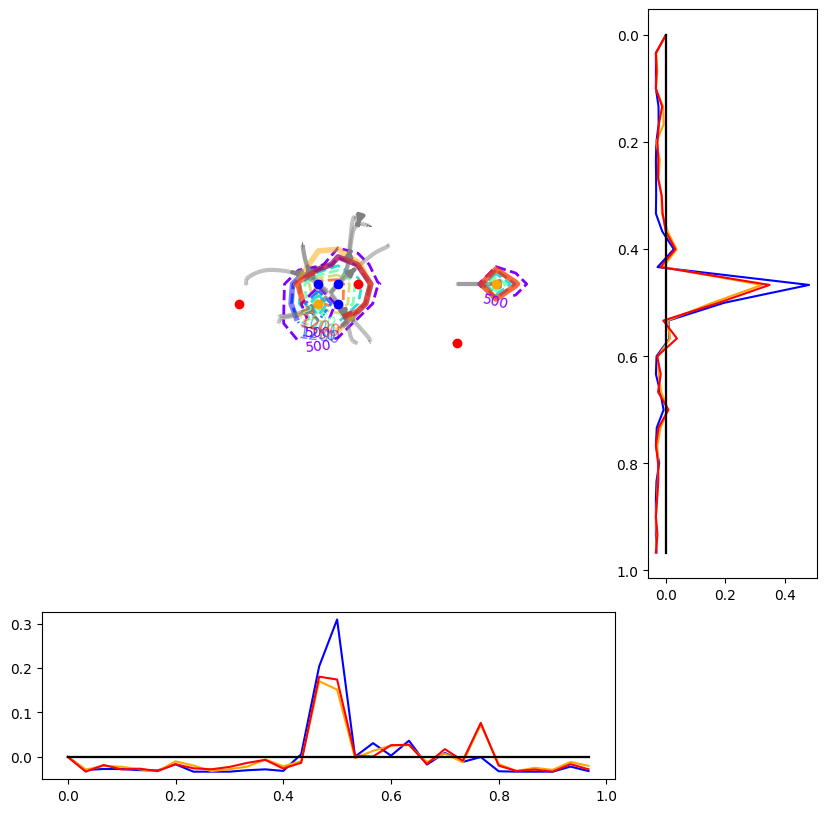

In [83]:
# https://stackoverflow.com/questions/16529892/adding-water-flow-arrows-to-matplotlib-contour-plot
from scipy.interpolate import Rbf
def plotStreamMulti(mtx_sets,lx=50,top_sets=[10],btm_sets=[10], **kwargs):
    cmlt_contour_color = kwargs['cmlt_contour_color'] if 'cmlt_contour_color' in kwargs.keys() else 'red'
    mtx_pre_sets = kwargs['previous'] if 'previous' in kwargs.keys() else pd.DataFrame(np.zeros(shape=(50, 50)))
    x_unit_sets = kwargs['x_unit_sets'] if 'x_unit_sets' in kwargs.keys() else 50 
    y_unit_sets = kwargs['y_unit_sets'] if 'y_unit_sets' in kwargs.keys() else 50
    
    # -- Plot --------------------------
    fig = plt.figure(figsize=(10, 10))
    #ax = fig.add_subplot(111)
    ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
    ax1 = plt.subplot2grid((4, 4), (3, 0), colspan=3, rowspan=1)
    ax2 = plt.subplot2grid((4, 4), (0, 3),colspan=1, rowspan=3)
     
    xpos_sets,ypos_sets,mask_top_sets,new_top_sets,new_cmlt_contour_color_sets=[],[],[],[],[]
    
    rangeidx = range(1,4,1)
    for idx in rangeidx:
        ### set the color 
        mtx,mtx_pre,top,btm,cmlt_contour_color = mtx_sets[idx],mtx_pre_sets[idx],top_sets[idx],btm_sets[idx],cmlt_contour_color_sets[idx]    
        x_unit,y_unit = x_unit_sets[idx],y_unit_sets[idx]
        lx,ly= size(mtx,0),size(mtx,1) # Work out matrix dimensions  
        
        new_top_sets.append(top)
        new_cmlt_contour_color_sets.append(cmlt_contour_color)
        
        ### delta changes ###
        Z = np.array(mtx.reset_index(drop=True).subtract(mtx_pre.reset_index(drop=True)))[:,::-1]
        Z_cmltv = np.array(mtx.reset_index(drop=True))[:,::-1]  
        Z[Z<0] = 0
        Z_cmltv[Z_cmltv<0] = 0
        
        # Interpolate these onto a regular grid
        xi,yi = np.meshgrid(np.arange(0,lx,1),np.arange(0,ly,1)) # Set up a mesh of positions
        
        ### observation ###
        xpos,ypos,z,z_cmltv = xi.flatten(),yi.flatten(),Z.flatten(),Z_cmltv.flatten() # Convert positions to 1D array
        xpos_sets.append(xpos)
        ypos_sets.append(ypos)
        
        (mask,mask_top,mask_btm) = GET_MASK(z=z,top=top,btm=btm)
        (mask_cmltv,mask_top_cmltv,mask_btm_cmltv) = GET_MASK(z=z_cmltv,top=top,btm=btm)
        mask_top_sets.append(mask_top)
        
        func = Rbf(xpos[mask],ypos[mask], z[mask], function='linear')
        func_cmltv = Rbf(xpos[mask_cmltv],ypos[mask_cmltv], z_cmltv[mask_cmltv], function='linear')
        zi_cmltv,zi = func_cmltv(xi, yi),func(xi, yi) 
        

           
        ### Plot flowlines (->) cmltv arrow plot
        # get the positions of the masked culmulative expression
        shape = (lx,ly)
        mask_top_cmltv_pd = pd.DataFrame(mask_top_cmltv.reshape(shape))
        mask_top_cmltv_pd_pstn = np.where(mask_top_cmltv_pd == True)
        
        dy, dx = np.gradient(-zi_cmltv) # Flow goes down gradient (thus -zi)
        stream = ax.streamplot(xi[0,:], yi[:,0], dx, dy, density=1,arrowsize=1,linewidth=3,minlength=0.011,
                               color = 'grey',broken_streamlines=True,
                               start_points=np.column_stack((mask_top_cmltv_pd_pstn[1],mask_top_cmltv_pd_pstn[0]))
                              )#color='0.6',
        # Customize the transparency level
        stream.lines.set_alpha(0.5)
    
        ### Plot contour gridded head observations 
        contours = ax.contour(xi, yi, zi, 
                              linewidths=2,levels=list(np.linspace(500,5000,7)),cmap=newcmp,#list(np.linspace(500,5000,7))
                              linestyles='dashed')
        ax.clabel(contours)
        
        contours_cmltv = ax.contour(xi, yi, zi_cmltv, [1200], colors = cmlt_contour_color,alpha=0.5,linewidths=4) #
        ax.clabel(contours_cmltv,inline=True, fontsize=12)
        
        ### plot inequality ###   
        (x_drvtv,y_drvtv) = GINI_IDX(mtx=mtx,x_val=x_val,y_val=y_val,x_unit=x_unit,y_unit=y_unit)             
        ax1.plot(np.arange(0,1,1/x_unit),x_drvtv,color = cmlt_contour_color)
        ax1.plot(np.arange(0,1,1/x_unit),np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit),color='Black')   
        ax2.plot(y_drvtv,np.arange(0,1,1/y_unit),color = cmlt_contour_color)
        ax2.plot(np.arange(0,1,1/y_unit)-np.arange(0,1,1/y_unit),np.arange(0,1,1/y_unit),color='Black')
        
    for i in range(0,len(xpos_sets)):
        xpos = xpos_sets[i]
        ypos = ypos_sets[i]
        top = new_top_sets[i]
        mask_top = mask_top_sets[i]
        cmlt_contour_color = new_cmlt_contour_color_sets[i]
        ### Plot well locations
        if top != 0:
            ax.plot(xpos[mask_top],ypos[mask_top], 'ko',color=cmlt_contour_color)
            #ax.plot(xpos[mask_top_cmltv],ypos[mask_top_cmltv], 'ko',color='black')
            #ax.plot(xpos[mask_btm],ypos[mask_btm], 'ko',color='blue')     
        
    ax.set_xlabel('x-axis')
    ax.set_ylabel('y-axis')
    ax.invert_xaxis()
    ax.invert_yaxis()
    ax.axis('off')  
    ax2.invert_yaxis()
    plt.show()
    
    return(x_inequ.sum(),y_inequ.sum(),x_drvtv,y_drvtv)


(x_inequ, y_inequ,x_drvtv,y_drvtv) = plotStreamMulti(mtx_sets,top_sets=top_sets,btm_sets=btm_sets,previous = mtx_pre_sets,x_unit_sets = x_unit_sets,y_unit_sets = y_unit_sets, cmlt_contour_color = cmlt_contour_color_sets)


In [ ]:
IL6_21_IDI=np.sqrt(np.array(drvt_index_x_sets)**2+np.array(drvt_index_y_sets)**2)
IL6_15_IDI=np.sqrt(np.array(drvt_index_x_sets)**2+np.array(drvt_index_y_sets)**2)
def plot_time(IL6_21_IDI=[],IL6_15_IDI=[]):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    ax.plot(range(0,len(IL6_21_IDI),1),IL6_21_IDI,color='blue',label="")#np.repeat(0,len(IDI))
    ax.plot(range(0,len(IL6_15_IDI),1),IL6_15_IDI,color='red',label="")#np.repeat(0,len(IDI))
    ax.set_xlabel('time')
    ax.set_ylabel('IDI')
    plt.legend(loc="upper right")
    ax.set_ylim(0,1)
    fig.show() 
    ax.set_xticks([0,1,2])
    ax.set_xticklabels(['10 mins','20 mins','30 mins'])
    plt.legend(loc="upper right",title='cell type')
_start = 0
_end = 3
plot_time(IL6_21_IDI[1:],IL6_15_IDI[1:])

[autoreload of traitlets.traitlets failed: Traceback (most recent call last):
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    m = sys.modules.get(modname, None)
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    "__loader__",
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 302, in update_class
    """Upgrade the code object of a function"""
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 266, in update_function
    # If we've reached this point, we should try to reload the modul

The history saving thread hit an unexpected error (TypeError('super(type, obj): obj must be an instance or subtype of type')).History will not be written to the database.
ERROR! Session/line number was not unique in database. History logging moved to new session 117


Error in atexit._run_exitfuncs:
Traceback (most recent call last):
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/IPython/core/history.py", line 793, in writeout_cache
    self.shell.push(to_main, interactive=False)
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/traitlets/traitlets.py", line 732, in __set__
    self.set(obj, value)
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/traitlets/traitlets.py", line 706, in set
    new_value = self._validate(obj, value)
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/traitlets/traitlets.py", line 738, in _validate
    value = self.validate(obj, value)
  File "/tools/anacondapython-3.8.6/lib/python3.8/site-packages/traitlets/traitlets.py", line 2496, in validate
    if s[:2] == f"b{quote}" and s[-1] == quote:
TypeError: super(type, obj): obj must be an instance or subtype of type


In [ ]:
def plot_longitutional(x_inequ_array,y_inequ_array):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    print(range(_start+1,_end,1))
    ax.plot(range(_start+1,_end+1,1),x_inequ_array,label='x-axis')#y_inequ_array,color='Black')
    ax.plot(range(_start+1,_end+1,1),y_inequ_array,label='y-axis')
    ax.plot(range(_start+1,_end+1,1),np.repeat(0,len(y_inequ_array)),color='Black')
    ax.set_xlabel('time')
    ax.set_ylabel('inequality')
    plt.legend(loc="upper right")
    ax.set_ylim(-8,8)
    fig.show() 
    ax.set_xticks([1,2,3,4])
    ax.set_xticklabels(['0 mins','10 mins','20 mins','30 mins'])
_start = 0
_end = 4
plot_longitutional(x_inequ_array[_start:_end],y_inequ_array[_start:_end])
#plot_longitutional(np.multiply(x_inequ_array,average_exp)[_start:_end],np.multiply(y_inequ_array,average_exp)[_start:_end])

In [ ]:
def plot_value(x_value,y_value):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    ax.plot(x_value.index,x_value)
    #ax = fig.add_subplot(122)
    #ax.plot(y_value.index,y_value)
    plt.show()
    
for i in range(1,4):
    plot_value(x_value_array[i],y_value_array[i])

In [62]:


# #############################################################################
# User input   
T = 10      # Time constant (days)
Q0 = 0.     # Initial condition for outflow rate (mm/day)
days = 300  # Number of days to simulate
# #############################################################################


# List to store results
Q_vals = []

# Vector of initial conditions
y0 = [Q0, ]


# Loop over each day in the R dataset
for step in range(days):
    # We want to find the value of Q at the end of this time step
    t = [0, 1]

    # Get R for this step
    R_t = float(df.ix[step])   

    # Solve the ODEs
    soln = odeint(f, y0, t, args=(R_t,))

    # Extract flow at end of step from soln
    Q = float(soln[1])

    # Append result
    Q_vals.append(Q)

    # Update initial condition for next step
    y0 = [Q, ]

# Add results to df
df['Q'] = Q_vals


## Vector of initial parameter values
#y0 = [x_inequ,]
#
#y0
## Time grid
#t = np.arange(0, x_inequ.shape[0], 1)
#
#t
## solve the ODEs
#soln = odeint(f, y0, t)
#
## Add result to df
#x_inequ['Q'] = soln[:, 0]
#

AttributeError: 'DataFrame' object has no attribute 'ix'

In [42]:
# https://stackoverflow.com/questions/32225472/solve-odes-with-discontinuous-input-forcing-data
from scipy.integrate import odeint
def f(y, t, R_t):
    """ Function to integrate.
    """
    # Unpack parameters
    Q_t = y[0]
    print('Q_t')
    print(Q_t)
    # ODE to solve
    dQ_dt = (R_t - Q_t)/T
    print('dQ_dt')
    print(dQ_dt)
    return dQ_dt

np.random.seed(seed=17)

days = 300 
# Create a fake daily time series for R
# Generale random values from uniform dist
df = pd.DataFrame({'R':np.random.uniform(low=0, high=5, size=days)},
                  index=range(days))

df

# Smooth with a moving window to make more sensible                  
#df['R'] = pd.rolling_mean(df['R'], window=20)

# Chop off the NoData at the start due to moving window
df = df.reset_index(drop=True)

# List to store results
Q_vals = []

# Vector of initial conditions


# Loop over each day in the R dataset
for step in range(days):
    # We want to find the value of Q at the end of this time step
    t = [0, 1]

    # Get R for this step
    R_t = float(df.iloc[step,0])   
    
    # set 
    Q0 = df.iloc[step-1,0] if step > 0 else 0
    y0 = Q0
    
    y0
    R_t
    # Solve the ODEs
    soln = odeint(f, y0, t, args=(R_t,))
    soln
    
    # Extract flow at end of step from soln
    Q = float(soln[1])

    # Append result
    Q_vals.append(Q)

    # Update initial condition for next step
    y0 = [Q, ]

# Add results to df
df['Q'] = Q_vals
df

,R
0,1.473325
1,2.652934
2,0.957604
3,0.339502
4,3.934927
...,...
295,3.546754
296,0.310264
297,4.880146
298,1.508764


0

1.4733250134355487

Q_t
0.0
dQ_dt
0.14733250134355486
Q_t
1.7792870918302965e-05
dQ_dt
0.14733072205646303
Q_t
1.7792656039540555e-05
dQ_dt
0.1473307220779509
Q_t
3.558531208427115e-05
dQ_dt
0.14732894281234643
Q_t
3.55850972081037e-05
dQ_dt
0.14732894283383408
Q_t
0.005234617603389278
dQ_dt
0.14680903958321595
Q_t
0.005234633875219767
dQ_dt
0.1468090379560329
Q_t
0.010415303392874865
dQ_dt
0.14629097100426738
Q_t
0.010415335879216926
dQ_dt
0.14629096775563316
Q_t
0.015577723452142766
dQ_dt
0.1457747289983406
Q_t
0.015577755823895539
dQ_dt
0.1457747257611653
Q_t
0.038598947485838905
dQ_dt
0.143472606594971
Q_t
0.038599211321121304
dQ_dt
0.14347258021144274
Q_t
0.032337377584485086
dQ_dt
0.14409876358510637
Q_t
0.03233751874882173
dQ_dt
0.14409874946867268
Q_t
0.048904775928819325
dQ_dt
0.14244202375067294
Q_t
0.048904620447658434
dQ_dt
0.142442039298789
Q_t
0.04613673814015847
dQ_dt
0.14271882752953902
Q_t
0.04613663996464752
dQ_dt
0.14271883734709012
Q_t
0.059803614794520954
dQ_dt
0.14135213986410278
Q_t

array([[0.       ],
       [0.1402054]])

1.4733250134355487

2.652933778026471

Q_t
1.4733250134355487
dQ_dt
0.11796087645909221
Q_t
1.4733393966263169
dQ_dt
0.11795943814001539
Q_t
1.4733393964509398
dQ_dt
0.1179594381575531
Q_t
1.4733537794663354
dQ_dt
0.11795799985601355
Q_t
1.4733537792909606
dQ_dt
0.11795799987355102
Q_t
1.4794101350665456
dQ_dt
0.11735236429599252
Q_t
1.4794101752897826
dQ_dt
0.11735236027366883
Q_t
1.4854353952915471
dQ_dt
0.11674983827349236
Q_t
1.485435475532035
dQ_dt
0.11674983024944359
Q_t
1.4914297597426966
dQ_dt
0.11615040182837741
Q_t
1.4914298395714667
dQ_dt
0.11615039384550041
Q_t
1.5156675503895736
dQ_dt
0.11372662276368972
Q_t
1.5156680838802294
dQ_dt
0.11372656941462414
Q_t
1.5099647088576034
dQ_dt
0.11429690691688674
Q_t
1.509965023992399
dQ_dt
0.11429687540340719
Q_t
1.5282048406864919
dQ_dt
0.1124728937339979
Q_t
1.5282044823414176
dQ_dt
0.11247292956850533
Q_t
1.5461529140158174
dQ_dt
0.11067808640106533
Q_t
1.5461528825167878
dQ_dt
0.11067808955096829
Q_t
1.563814891734189
dQ_dt
0.10891188862922818
Q_t
1.5638148604508657
dQ

array([[1.47332501],
       [1.58557959]])

2.652933778026471

0.9576039347374743

Q_t
2.652933778026471
dQ_dt
-0.16953298432889966
Q_t
2.6529131053066206
dQ_dt
-0.16953091705691464
Q_t
2.652913105558702
dQ_dt
-0.16953091708212278
Q_t
2.6528924330909276
dQ_dt
-0.16952884983534533
Q_t
2.652892433343006
dQ_dt
-0.16952884986055317
Q_t
2.6441090593720986
dQ_dt
-0.16865051246346244
Q_t
2.644108999966792
dQ_dt
-0.1686505065229318
Q_t
2.635371192806874
dQ_dt
-0.16777672580693997
Q_t
2.635371074303241
dQ_dt
-0.16777671395657667
Q_t
2.626678538616986
dQ_dt
-0.16690746038795118
Q_t
2.62667842072693
dQ_dt
-0.16690744859894555
Q_t
2.591696625515613
dQ_dt
-0.16340926907781386
Q_t
2.5916958450577945
dQ_dt
-0.16340919103203203
Q_t
2.599959872476319
dQ_dt
-0.16423559377388447
Q_t
2.5999594125658576
dQ_dt
-0.16423554778283833
Q_t
2.573667523834077
dQ_dt
-0.16160635890966027
Q_t
2.5736680467257775
dQ_dt
-0.16160641119883032
Q_t
2.5477975063338825
dQ_dt
-0.15901935715964083
Q_t
2.547797552171253
dQ_dt
-0.15901936174337786
Q_t
2.5223411587651143
dQ_dt
-0.156473722402764
Q_t
2.5223412042

array([[2.65293378],
       [2.49160186]])

0.9576039347374743

0.33950179095645683

Q_t
0.9576039347374743
dQ_dt
-0.06181021437810175
Q_t
0.9575963932937275
dQ_dt
-0.06180946023372706
Q_t
0.9575963933857404
dQ_dt
-0.06180946024292836
Q_t
0.9575888520340042
dQ_dt
-0.06180870610775474
Q_t
0.957588852126016
dQ_dt
-0.061808706116955915
Q_t
0.9539493931128968
dQ_dt
-0.061444760215644004
Q_t
0.9539493612852804
dQ_dt
-0.06144475703288236
Q_t
0.9503313643786483
dQ_dt
-0.06108295734221915
Q_t
0.95033130091027
dQ_dt
-0.061082950995381316
Q_t
0.9467346080003091
dQ_dt
-0.06072328170438522
Q_t
0.946734544905375
dQ_dt
-0.06072327539489182
Q_t
0.9327284747992652
dQ_dt
-0.05932266838428084
Q_t
0.9327280840889585
dQ_dt
-0.059322629313250164
Q_t
0.9358452178040851
dQ_dt
-0.05963434268476283
Q_t
0.9358449792057777
dQ_dt
-0.05963431882493209
Q_t
0.9251503797461089
dQ_dt
-0.05856485887896521
Q_t
0.9251506546996607
dQ_dt
-0.05856488637432039
Q_t
0.9146480814619198
dQ_dt
-0.057514629050546294
Q_t
0.9146481077758535
dQ_dt
-0.05751463168193967
Q_t
0.9043338806869597
dQ_dt
-0.05648320897305029

array([[0.95760393],
       [0.89878377]])

0.33950179095645683

3.9349272999995666

Q_t
0.33950179095645683
dQ_dt
0.359542550904311
Q_t
0.3395441800440269
dQ_dt
0.35953831199555397
Q_t
0.33954417954427113
dQ_dt
0.35953831204552955
Q_t
0.3395865681320972
dQ_dt
0.35953407318674696
Q_t
0.3395865676323473
dQ_dt
0.35953407323672193
Q_t
0.3499787918779808
dQ_dt
0.3584948508121586
Q_t
0.34997881367878403
dQ_dt
0.35849484863207826
Q_t
0.3603409776488996
dQ_dt
0.3574586322350667
Q_t
0.3603410211875828
dQ_dt
0.35745862788119837
Q_t
0.3706732335400324
dQ_dt
0.35642540664595346
Q_t
0.37067327695291374
dQ_dt
0.35642540230466524
Q_t
0.4192249399506591
dQ_dt
0.35157023600489073
Q_t
0.4192253333163673
dQ_dt
0.3515701966683199
Q_t
0.4051362245405878
dQ_dt
0.3529791075458979
Q_t
0.4051364245485734
dQ_dt
0.3529790875450993
Q_t
0.4392665993417927
dQ_dt
0.3495660700657774
Q_t
0.4392663819941207
dQ_dt
0.3495660918005446
Q_t
0.43336626927453703
dQ_dt
0.35015610307250294
Q_t
0.4333661342623952
dQ_dt
0.35015611657371715
Q_t
0.46137006807146336
dQ_dt
0.34735572319281033
Q_t
0.46137007446983713

array([[0.33950179],
       [0.68165175]])

3.9349272999995666

3.2816676088792773

Q_t
3.9349272999995666
dQ_dt
-0.06532596911202893
Q_t
3.934919326326305
dQ_dt
-0.06532517174470276
Q_t
3.9349193264236315
dQ_dt
-0.06532517175443542
Q_t
3.9349113528476938
dQ_dt
-0.06532437439684165
Q_t
3.934911352945019
dQ_dt
-0.06532437440657417
Q_t
3.9297782995514146
dQ_dt
-0.06481106906721372
Q_t
3.929778219371394
dQ_dt
-0.06481106104921168
Q_t
3.9246855812556656
dQ_dt
-0.06430179723763882
Q_t
3.9246854215231677
dQ_dt
-0.06430178126438904
Q_t
3.9196328012392723
dQ_dt
-0.0637965192359995
Q_t
3.9196326427606913
dQ_dt
-0.0637965033881414
Q_t
3.9013757693661675
dQ_dt
-0.061970816048689016
Q_t
3.9013749265469135
dQ_dt
-0.06197073176676362
Q_t
3.904853953585254
dQ_dt
-0.06231863447059767
Q_t
3.904853395557958
dQ_dt
-0.06231857866786807
Q_t
3.890415765801034
dQ_dt
-0.06087481569217568
Q_t
3.8904164322103636
dQ_dt
-0.06087488233310863
Q_t
3.8763138266651773
dQ_dt
-0.05946462177859
Q_t
3.8763139040729158
dQ_dt
-0.05946462951936384
Q_t
3.8625380103633855
dQ_dt
-0.05808704014841082
Q_t
3.8625

array([[3.9349273 ],
       [3.87276148]])

3.2816676088792773

3.1876044802181793

Q_t
3.2816676088792773
dQ_dt
-0.0094063128661098
Q_t
3.281666460649002
dQ_dt
-0.00940619804308227
Q_t
3.2816664606630184
dQ_dt
-0.009406198044483904
Q_t
3.2816653124467594
dQ_dt
-0.009406083222858009
Q_t
3.2816653124607758
dQ_dt
-0.009406083224259643
Q_t
3.2803257194285855
dQ_dt
-0.00927212392104062
Q_t
3.2803256500190114
dQ_dt
-0.009272116980083211
Q_t
3.279005205572093
dQ_dt
-0.009140072535391352
Q_t
3.279005067734314
dQ_dt
-0.009140058751613455
Q_t
3.2777034302298906
dQ_dt
-0.009009895001171131
Q_t
3.277703294351696
dQ_dt
-0.009009881413351684
Q_t
3.273685235106716
dQ_dt
-0.00860807548885365
Q_t
3.273684710992103
dQ_dt
-0.008608023077392345
Q_t
3.2698445501601356
dQ_dt
-0.008224006994195631
Q_t
3.26984529027709
dQ_dt
-0.00822408100589107
Q_t
3.270574317152654
dQ_dt
-0.008296983693447446
Q_t
3.270574744730621
dQ_dt
-0.008297026451244171


array([[3.28166761],
       [3.27271638]])

3.1876044802181793

2.87801446876517

Q_t
3.1876044802181793
dQ_dt
-0.030959001145300924
Q_t
3.187600701141588
dQ_dt
-0.030958623237641803
Q_t
3.1876007011877183
dQ_dt
-0.030958623242254825
Q_t
3.187596922157256
dQ_dt
-0.03095824533920859
Q_t
3.1875969222033853
dQ_dt
-0.030958245343821522
Q_t
3.184646030660485
dQ_dt
-0.030663156189531506
Q_t
3.184645962661662
dQ_dt
-0.030663149389649202
Q_t
3.1817232672056694
dQ_dt
-0.030370879844049938
Q_t
3.1817231318530625
dQ_dt
-0.030370866308789247
Q_t
3.1788282960408045
dQ_dt
-0.030081382727563444
Q_t
3.1788281619768277
dQ_dt
-0.030081369321165764
Q_t
3.168884553376984
dQ_dt
-0.029087008461181396
Q_t
3.1688839102558823
dQ_dt
-0.029086944149071224
Q_t
3.170555731897765
dQ_dt
-0.029254126313259476
Q_t
3.1705552821902807
dQ_dt
-0.029254081342511062
Q_t
3.1625092931958205
dQ_dt
-0.028449482443065045
Q_t
3.162509845871977
dQ_dt
-0.028449537710680685
Q_t
3.1546855851995415
dQ_dt
-0.027667111643437138
Q_t
3.154685658029681
dQ_dt
-0.027667118926451108


array([[3.18760448],
       [3.15814314]])

2.87801446876517

0.1953145809443324

Q_t
2.87801446876517
dQ_dt
-0.26826998878208375
Q_t
2.8779817989980936
dQ_dt
-0.26826672180537614
Q_t
2.8779817993959442
dQ_dt
-0.2682667218451612
Q_t
2.8779491300267086
dQ_dt
-0.2682634549082376
Q_t
2.8779491304245544
dQ_dt
-0.2682634549480222
Q_t
2.8657769446219246
dQ_dt
-0.2670462363677592
Q_t
2.865776881542364
dQ_dt
-0.26704623005980316
Q_t
2.853659989181113
dQ_dt
-0.2658345408236781
Q_t
2.853659863307556
dQ_dt
-0.26583452823632236
Q_t
2.841597950561145
dQ_dt
-0.26462833696168125
Q_t
2.8415978252584035
dQ_dt
-0.2646283244314071
Q_t
2.7913831359042014
dQ_dt
-0.2596068554959869
Q_t
2.7913822472915193
dQ_dt
-0.2596067666347187
Q_t
2.8039428886615685
dQ_dt
-0.2608628307717236
Q_t
2.803942384003276
dQ_dt
-0.2608627803058944
Q_t
2.7668221043109735
dQ_dt
-0.2571507523366641
Q_t
2.7668226708597308
dQ_dt
-0.25715080899153986
Q_t
2.730231101602359
dQ_dt
-0.25349165206580265
Q_t
2.730231146892222
dQ_dt
-0.25349165659478895
Q_t
2.694160263550029
dQ_dt
-0.24988456826056965
Q_t
2.694160308626857

array([[2.87801447],
       [2.62272188]])

0.1953145809443324

1.7890680224177447

Q_t
0.1953145809443324
dQ_dt
0.15937534414734122
Q_t
0.19533386530619154
dQ_dt
0.15937341571115532
Q_t
0.19533386507285141
dQ_dt
0.15937341573448932
Q_t
0.1953531492013761
dQ_dt
0.15937148732163686
Q_t
0.1953531489680388
dQ_dt
0.15937148734497059
Q_t
0.20116703623835497
dQ_dt
0.15879009861793897
Q_t
0.20116705568754725
dQ_dt
0.15879009667301974
Q_t
0.20695971432060237
dQ_dt
0.15821083080971424
Q_t
0.20695975314816611
dQ_dt
0.15821082692695784
Q_t
0.21273128000027772
dQ_dt
0.1576336742417467
Q_t
0.2127313186862626
dQ_dt
0.15763367037314818
Q_t
0.23824635314755685
dQ_dt
0.15508216692701876
Q_t
0.23824666294776856
dQ_dt
0.1550821359469976
Q_t
0.23138606174818444
dQ_dt
0.15576819606695602
Q_t
0.2313862289392908
dQ_dt
0.1557681793478454
Q_t
0.24982058620549746
dQ_dt
0.1539247436212247
Q_t
0.24982040160493058
dQ_dt
0.15392476208128142
Q_t
0.2467593313919707
dQ_dt
0.15423086910257738
Q_t
0.24675921449604182
dQ_dt
0.1542308807921703
Q_t
0.2619804775560302
dQ_dt
0.15270875448617144
Q_t
0.261980

array([[0.19531458],
       [0.34698026]])

1.7890680224177447

4.7284159340920375

Q_t
1.7890680224177447
dQ_dt
0.2939347911674293
Q_t
1.7891037055630519
dQ_dt
0.2939312228528986
Q_t
1.789103705129865
dQ_dt
0.29393122289621726
Q_t
1.789139387841996
dQ_dt
0.29392765462500414
Q_t
1.7891393874088146
dQ_dt
0.29392765466832227
Q_t
1.8007342580737813
dQ_dt
0.2927681676018256
Q_t
1.800734303450625
dQ_dt
0.2927681630641413
Q_t
1.8122833890641048
dQ_dt
0.2916132545027933
Q_t
1.8122834796391436
dQ_dt
0.29161324544528944
Q_t
1.8237870061024335
dQ_dt
0.2904628927989604
Q_t
1.8237870963203473
dQ_dt
0.290462883777169
Q_t
1.8736135996235994
dQ_dt
0.2854802334468438
Q_t
1.8736142927931956
dQ_dt
0.2854801641298842
Q_t
1.8605877731782838
dQ_dt
0.28678281609137535
Q_t
1.860588154977007
dQ_dt
0.28678277791150303
Q_t
1.8969234462628692
dQ_dt
0.2831492487829168
Q_t
1.8969230221488753
dQ_dt
0.2831492911943162
Q_t
1.9327975704314315
dQ_dt
0.2795618363660606
Q_t
1.9327975392313812
dQ_dt
0.2795618394860656
Q_t
1.9682175615454143
dQ_dt
0.27601983725466234
Q_t
1.9682175304371408
dQ_dt
0.2760198

array([[1.78906802],
       [2.06878392]])

4.7284159340920375

0.30022340157692673

Q_t
4.7284159340920375
dQ_dt
-0.44281925325151106
Q_t
4.7283620397236605
dQ_dt
-0.4428138638146734
Q_t
4.7283620403795945
dQ_dt
-0.44281386388026683
Q_t
4.728308146667136
dQ_dt
-0.442808474509021
Q_t
4.728308147323062
dQ_dt
-0.44280847457461353
Q_t
4.708944350617934
dQ_dt
-0.4408720949041006
Q_t
4.708944257434691
dQ_dt
-0.4408720855857764
Q_t
4.689665231251371
dQ_dt
-0.4389441829674444
Q_t
4.689665045291478
dQ_dt
-0.43894416437145517
Q_t
4.670470325950909
dQ_dt
-0.43702469243739817
Q_t
4.670470140803766
dQ_dt
-0.43702467392268396
Q_t
4.589806855437471
dQ_dt
-0.42895834538605443
Q_t
4.5898055171564325
dQ_dt
-0.4289582115579506
Q_t
4.610290787891774
dQ_dt
-0.4310067386314847
Q_t
4.610290035631049
dQ_dt
-0.4310066634054122
Q_t
4.5509376558328185
dQ_dt
-0.4250714254255891
Q_t
4.550938497564085
dQ_dt
-0.4250715095987159
Q_t
4.560785626239575
dQ_dt
-0.4260562224662648
Q_t
4.560786158955669
dQ_dt
-0.4260562757378743
Q_t
4.511850880749525
dQ_dt
-0.4211627479172598
Q_t
4.511850865785323
dQ_dt
-

array([[4.72841593],
       [4.30701777]])

0.30022340157692673

4.320210517731055

Q_t
0.30022340157692673
dQ_dt
0.40199871161541284
Q_t
0.30027028412567036
dQ_dt
0.4019940233605384
Q_t
0.30027028357890906
dQ_dt
0.40199402341521456
Q_t
0.30031716558090416
dQ_dt
0.40198933521501506
Q_t
0.30031716503414924
dQ_dt
0.4019893352696905
Q_t
0.3114025666596234
dQ_dt
0.40088079510714314
Q_t
0.3114025878220475
dQ_dt
0.40088079299090074
Q_t
0.3224573987268138
dQ_dt
0.3997753119004241
Q_t
0.3224574409933839
dQ_dt
0.39977530767376707
Q_t
0.33348176666895946
dQ_dt
0.3986728751062095
Q_t
0.3334818088190139
dQ_dt
0.39867287089120407
Q_t
0.3859318804275566
dQ_dt
0.3934278637303498
Q_t
0.3859322720468339
dQ_dt
0.39342782456842207
Q_t
0.3704945508888449
dQ_dt
0.394971596684221
Q_t
0.3704947476720026
dQ_dt
0.39497157700590524
Q_t
0.4071643073833691
dQ_dt
0.39130462103476854
Q_t
0.4071640941523981
dQ_dt
0.39130464235786566
Q_t
0.4007786518228188
dQ_dt
0.3919431865908236
Q_t
0.4007785198406841
dQ_dt
0.3919431997890371
Q_t
0.43083008897580377
dQ_dt
0.3889380428755251
Q_t
0.4308300955367222


array([[0.3002234 ],
       [0.68277574]])

4.320210517731055

4.386452630740151

Q_t
4.320210517731055
dQ_dt
0.0066242113009096215
Q_t
4.320211326351025
dQ_dt
0.006624130438912612
Q_t
4.320211326341154
dQ_dt
0.006624130439899734
Q_t
4.3202121349512534
dQ_dt
0.006624049578889757
Q_t
4.320212134941383
dQ_dt
0.00662404957987679
Q_t
4.3213500387662505
dQ_dt
0.006510259197390056
Q_t
4.321350124934506
dQ_dt
0.006510250580564492
Q_t
4.322468393763692
dQ_dt
0.006398423697645939
Q_t
4.322468564632883
dQ_dt
0.00639840661072677
Q_t
4.323567621223638
dQ_dt
0.0062885009516513435
Q_t
4.323567789163823
dQ_dt
0.006288484157632812
Q_t
4.326793225663572
dQ_dt
0.00596594050765793
Q_t
4.326793809734747
dQ_dt
0.005965882100540387


array([[4.32021052],
       [4.32651422]])

4.386452630740151

0.25596832810226844

Q_t
4.386452630740151
dQ_dt
-0.4130484302637883
Q_t
4.386402357317191
dQ_dt
-0.41304340292149233
Q_t
4.386402357929085
dQ_dt
-0.41304340298268166
Q_t
4.386352085118004
dQ_dt
-0.41303837570157353
Q_t
4.38635208572989
dQ_dt
-0.4130383757627622
Q_t
4.368241759003155
dQ_dt
-0.4112273430900887
Q_t
4.368241671383035
dQ_dt
-0.4112273343280767
Q_t
4.350210840279102
dQ_dt
-0.4094242512176834
Q_t
4.3502106654222
dQ_dt
-0.40942423373199316
Q_t
4.332258893949682
dQ_dt
-0.40762905658474136
Q_t
4.332258719859048
dQ_dt
-0.407629039175678
Q_t
4.256870003544014
dQ_dt
-0.4000901675441746
Q_t
4.256868746915486
dQ_dt
-0.40009004188132175
Q_t
4.275993657911825
dQ_dt
-0.4020025329809557
Q_t
4.275992951022373
dQ_dt
-0.40200246229201053
Q_t
4.220502908062327
dQ_dt
-0.3964534579960059
Q_t
4.220503699213012
dQ_dt
-0.39645353711107434
Q_t
4.229703561607607
dQ_dt
-0.3973735233505339
Q_t
4.229704062478127
dQ_dt
-0.39737357343758584
Q_t
4.183948184692044
dQ_dt
-0.39279798565897756
Q_t
4.183948170721297
dQ_dt
-0.392

array([[4.38645263],
       [3.99338514]])

0.25596832810226844

3.262093077328274

Q_t
0.25596832810226844
dQ_dt
0.30061247492260057
Q_t
0.2560040160159773
dQ_dt
0.3006089061312297
Q_t
0.25600401559229985
dQ_dt
0.3006089061735974
Q_t
0.25603970308234136
dQ_dt
0.3006053374245933
Q_t
0.256039702658669
dQ_dt
0.3006053374669605
Q_t
0.2650663896792676
dQ_dt
0.29970266876490065
Q_t
0.2650664101198084
dQ_dt
0.29970266672084656
Q_t
0.27406597097245056
dQ_dt
0.29880271063558234
Q_t
0.2740660117922449
dQ_dt
0.2988027065536029
Q_t
0.2830385483424662
dQ_dt
0.2979054528985808
Q_t
0.28303858903973134
dQ_dt
0.2979054488288543
Q_t
0.3247802508761377
dQ_dt
0.29373128264521364
Q_t
0.32478061222788757
dQ_dt
0.2937312465100387
Q_t
0.31280961181391675
dQ_dt
0.29492834655143574
Q_t
0.3128097973229212
dQ_dt
0.2949283280005353
Q_t
0.34228372369209414
dQ_dt
0.29198093536361797
Q_t
0.34228352161461906
dQ_dt
0.2919809555713655
Q_t
0.3372195264465973
dQ_dt
0.2924873550881677
Q_t
0.3372194005438874
dQ_dt
0.29248736767843864
Q_t
0.3614269724909096
dQ_dt
0.2900666104837365
Q_t
0.361426978212905
dQ

array([[0.25596833],
       [0.54203891]])

3.262093077328274

2.7587568431743765

Q_t
3.262093077328274
dQ_dt
-0.05033362341538976
Q_t
3.262086933507548
dQ_dt
-0.050333009033317166
Q_t
3.262086933582541
dQ_dt
-0.05033300904081646
Q_t
3.262080789836806
dQ_dt
-0.05033239466624293
Q_t
3.2620807899117974
dQ_dt
-0.050332394673742085
Q_t
3.257973169933072
dQ_dt
-0.049921632675869534
Q_t
3.2579731006918298
dQ_dt
-0.04992162575174532
Q_t
3.253899072753301
dQ_dt
-0.04951422295789243
Q_t
3.253898934833572
dQ_dt
-0.04951420916591953
Q_t
3.2498581558265744
dQ_dt
-0.04911013126521979
Q_t
3.249858019031263
dQ_dt
-0.04911011758568864
Q_t
3.2354009894630917
dQ_dt
-0.04766441462887152
Q_t
3.235400276460574
dQ_dt
-0.04766434332861973
Q_t
3.238092637171419
dQ_dt
-0.04793357939970426
Q_t
3.2380921600327257
dQ_dt
-0.04793353168583492
Q_t
3.226607534721849
dQ_dt
-0.04678506915474725
Q_t
3.2266081075553785
dQ_dt
-0.0467851264381002
Q_t
3.2153991099362194
dQ_dt
-0.045664226676184284
Q_t
3.2153991781561193
dQ_dt
-0.04566423349817428
Q_t
3.2044587337263515
dQ_dt
-0.044570189055197496
Q_t
3.2

array([[3.26209308],
       [3.21419436]])

2.7587568431743765

2.9875662661952553

Q_t
2.7587568431743765
dQ_dt
0.02288094230208788
Q_t
2.7587596362100415
dQ_dt
0.022880662998521383
Q_t
2.7587596361759474
dQ_dt
0.02288066300193079
Q_t
2.7587624291775192
dQ_dt
0.02288038370177361
Q_t
2.7587624291434256
dQ_dt
0.02288038370518297
Q_t
2.7610883692592645
dQ_dt
0.022647789693599086
Q_t
2.7610884302806955
dQ_dt
0.022647783591455983
Q_t
2.763390664054495
dQ_dt
0.022417560214076017
Q_t
2.7633907854802198
dQ_dt
0.022417548071503555
Q_t
2.7656696146215642
dQ_dt
0.022189665157369108
Q_t
2.7656697348144776
dQ_dt
0.022189653138077768
Q_t
2.7733702791718775
dQ_dt
0.021419598702337783
Q_t
2.773370836789585
dQ_dt
0.021419542940567027
Q_t
2.780805496824543
dQ_dt
0.020676076937071252
Q_t
2.7808047520287564
dQ_dt
0.020676151416649892
Q_t
2.779189673610805
dQ_dt
0.02083765925844503
Q_t
2.7791892773316444
dQ_dt
0.02083769888636109
Q_t
2.7848496791917046
dQ_dt
0.020271658700355077
Q_t
2.7848496729067738
dQ_dt
0.020271659328848158


array([[2.75875684],
       [2.78053087]])

2.9875662661952553

2.4176431215500105

Q_t
2.9875662661952553
dQ_dt
-0.056992314464524484
Q_t
2.987559309827032
dQ_dt
-0.056991618827702165
Q_t
2.98755930991194
dQ_dt
-0.05699161883619297
Q_t
2.987552353628623
dQ_dt
-0.056990923207861234
Q_t
2.98755235371353
dQ_dt
-0.05699092321635195
Q_t
2.9831866139290013
dQ_dt
-0.05655434923789908
Q_t
2.9831865491370007
dQ_dt
-0.056554342758699014
Q_t
2.9788543180101774
dQ_dt
-0.056121119646016696
Q_t
2.978854188920593
dQ_dt
-0.05612110673705826
Q_t
2.9745551452127397
dQ_dt
-0.05569120236627292
Q_t
2.9745550171110913
dQ_dt
-0.05569118955610808
Q_t
2.9589176314526084
dQ_dt
-0.0541274509902598
Q_t
2.9589169409189977
dQ_dt
-0.05412738193689872
Q_t
2.9619419934943974
dQ_dt
-0.054429887194438684
Q_t
2.961941539555931
dQ_dt
-0.05442984180059205
Q_t
2.949613125873426
dQ_dt
-0.05319700043234157
Q_t
2.9496136660992884
dQ_dt
-0.0531970544549278
Q_t
2.9375649327113194
dQ_dt
-0.05199218111613089
Q_t
2.9375649944147058
dQ_dt
-0.051992187286469524
Q_t
2.925789158369795
dQ_dt
-0.05081460368197845
Q_t
2

array([[2.98756627],
       [2.93333096]])

2.4176431215500105

1.414940804284956

Q_t
2.4176431215500105
dQ_dt
-0.10027023172650544
Q_t
2.417630886780122
dQ_dt
-0.10026900824951661
Q_t
2.4176308869294085
dQ_dt
-0.10026900826444525
Q_t
2.4176186523088026
dQ_dt
-0.10026778480238466
Q_t
2.4176186524580867
dQ_dt
-0.10026778481731306
Q_t
2.411568864448086
dQ_dt
-0.09966280601631299
Q_t
2.4115688088850313
dQ_dt
-0.09966280046000753
Q_t
2.4055555789619985
dQ_dt
-0.09906147746770425
Q_t
2.405555468170121
dQ_dt
-0.0990614663885165
Q_t
2.3995785203580926
dQ_dt
-0.09846377160731365
Q_t
2.3995784102341897
dQ_dt
-0.09846376059492337
Q_t
2.37644921339067
dQ_dt
-0.0961508409105714
Q_t
2.3764485401183433
dQ_dt
-0.09615077358333872
Q_t
2.3815350076226856
dQ_dt
-0.09665942033377295
Q_t
2.3815345936620855
dQ_dt
-0.09665937893771295
Q_t
2.363820884293037
dQ_dt
-0.0948880080008081
Q_t
2.363821362628447
dQ_dt
-0.09488805583434909
Q_t
2.346432677450052
dQ_dt
-0.0931491873165096
Q_t
2.3464327239944076
dQ_dt
-0.09314919197094515
Q_t
2.329362696698493
dQ_dt
-0.09144218924135368
Q_t
2.3293627

array([[2.41764312],
       [2.32222343]])

1.414940804284956

1.4886285915088582

Q_t
1.414940804284956
dQ_dt
0.007368778722390212
Q_t
1.4149417037910612
dQ_dt
0.0073686887717796965
Q_t
1.4149417037800809
dQ_dt
0.00736868877287773
Q_t
1.4149426032752062
dQ_dt
0.007368598823365202
Q_t
1.414942603264226
dQ_dt
0.007368598824463213
Q_t
1.4158840459510396
dQ_dt
0.007274454555781862
Q_t
1.4158840851212446
dQ_dt
0.007274450638761354
Q_t
1.416813459872701
dQ_dt
0.007181513163615727
Q_t
1.4168135377158935
dQ_dt
0.007181505379296471
Q_t
1.4177310376449193
dQ_dt
0.007089755386393892
Q_t
1.417731114495133
dQ_dt
0.007089747701372518
Q_t
1.420648124434461
dQ_dt
0.006798046707439709
Q_t
1.4206484392643162
dQ_dt
0.006798015224454201
Q_t
1.4234462027224046
dQ_dt
0.006518238878645355
Q_t
1.4234457664745317
dQ_dt
0.006518282503432648
Q_t
1.4228908432298084
dQ_dt
0.0065737748279049765
Q_t
1.422890597483223
dQ_dt
0.006573799402563507


array([[1.4149408 ],
       [1.42195309]])

1.4886285915088582

2.8075445266318058

Q_t
1.4886285915088582
dQ_dt
0.13189159351229476
Q_t
1.488644669014793
dQ_dt
0.13188998576170127
Q_t
1.488644668818809
dQ_dt
0.13188998578129968
Q_t
1.4886607461287649
dQ_dt
0.1318883780503041
Q_t
1.4886607459327834
dQ_dt
0.13188837806990222
Q_t
1.495199149672968
dQ_dt
0.13123453769588378
Q_t
1.4951991901476807
dQ_dt
0.1312345336484125
Q_t
1.5017051388900557
dQ_dt
0.130583938774175
Q_t
1.501705219639326
dQ_dt
0.13058393069924798
Q_t
1.5081789146560955
dQ_dt
0.12993656119757102
Q_t
1.5081789950052964
dQ_dt
0.12993655316265093
Q_t
1.5345957162076713
dQ_dt
0.12729488104241343
Q_t
1.5345962632352226
dQ_dt
0.12729482633965833
Q_t
1.5282859463429939
dQ_dt
0.12792585802888118
Q_t
1.5282862664521437
dQ_dt
0.1279258260179662
Q_t
1.5480828049564863
dQ_dt
0.12594617216753196
Q_t
1.5480824421893704
dQ_dt
0.12594620844424353
Q_t
1.5675723150090441
dQ_dt
0.12399722116227616
Q_t
1.567572283864445
dQ_dt
0.12399722427673607
Q_t
1.586760554243858
dQ_dt
0.12207839723879477
Q_t
1.5867605232943716
dQ_dt
0.

array([[1.48862859],
       [1.61414   ]])

2.8075445266318058

1.9802371802351326

Q_t
2.8075445266318058
dQ_dt
-0.08273073463966732
Q_t
2.807534430035099
dQ_dt
-0.08272972497999664
Q_t
2.8075344301583196
dQ_dt
-0.0827297249923187
Q_t
2.8075243336848303
dQ_dt
-0.08272871534496977
Q_t
2.8075243338080496
dQ_dt
-0.08272871535729169
Q_t
2.8020094235590105
dQ_dt
-0.08217722433238779
Q_t
2.802009361670882
dQ_dt
-0.08217721814357495
Q_t
2.7965312775427753
dQ_dt
-0.08162940973076427
Q_t
2.7965311541776967
dQ_dt
-0.08162939739425641
Q_t
2.7910895889927776
dQ_dt
-0.08108524087576449
Q_t
2.7910894664493995
dQ_dt
-0.08108522862142668
Q_t
2.7705680171825575
dQ_dt
-0.07903308369474249
Q_t
2.7705673062329903
dQ_dt
-0.07903301259978576
Q_t
2.774856296355943
dQ_dt
-0.07946191161208105
Q_t
2.7748558468735003
dQ_dt
-0.07946186666383677
Q_t
2.7589466271917664
dQ_dt
-0.07787094469566339
Q_t
2.758947152667666
dQ_dt
-0.07787099724325335
Q_t
2.743356892616988
dQ_dt
-0.07631197123818552
Q_t
2.7433569473154353
dQ_dt
-0.07631197670803028
Q_t
2.728078816335268
dQ_dt
-0.07478416361001353
Q_t
2.7

array([[2.80754453],
       [2.72881588]])

1.9802371802351326

3.943503548394498

Q_t
1.9802371802351326
dQ_dt
0.19632663681593654
Q_t
1.9802610940872962
dQ_dt
0.1963242454307202
Q_t
1.9802610937960101
dQ_dt
0.19632424545984878
Q_t
1.9802850073568947
dQ_dt
0.19632185410376032
Q_t
1.9802850070656122
dQ_dt
0.19632185413288858
Q_t
1.9893389124904304
dQ_dt
0.19541646359040676
Q_t
1.9893389609662675
dQ_dt
0.19541645874282304
Q_t
1.9983510631937873
dQ_dt
0.19451524852007107
Q_t
1.9983511599224202
dQ_dt
0.19451523884720778
Q_t
2.007321700104576
dQ_dt
0.19361818482899223
Q_t
2.0073217963873753
dQ_dt
0.19361817520071228
Q_t
2.0446244581112114
dQ_dt
0.18988790902832867
Q_t
2.044625139191703
dQ_dt
0.1898878409202795
Q_t
2.0354433513095116
dQ_dt
0.19080601970849864
Q_t
2.035443742247928
dQ_dt
0.190805980614657
Q_t
2.0631577440623285
dQ_dt
0.18803458043321694
Q_t
2.063157303993772
dQ_dt
0.18803462444007263
Q_t
2.0904683841870138
dQ_dt
0.18530351642074844
Q_t
2.090468348203545
dQ_dt
0.18530352001909528
Q_t
2.1173827471808426
dQ_dt
0.18261208012136554
Q_t
2.1173827113818375
dQ_dt


array([[1.98023718],
       [2.16706663]])

3.943503548394498

2.0924219267293847

Q_t
3.943503548394498
dQ_dt
-0.18510816216651133
Q_t
3.943480967978418
dQ_dt
-0.18510590412490333
Q_t
3.943480968253865
dQ_dt
-0.18510590415244804
Q_t
3.9434583881132257
dQ_dt
-0.1851036461383841
Q_t
3.9434583883886694
dQ_dt
-0.18510364616592848
Q_t
3.93315917930526
dQ_dt
-0.18407372525758753
Q_t
3.933159098922754
dQ_dt
-0.1840737172193369
Q_t
3.922917275704557
dQ_dt
-0.18304953489751724
Q_t
3.9229171153855433
dQ_dt
-0.18304951886561588
Q_t
3.9127322785742975
dQ_dt
-0.1820310351844913
Q_t
3.912732119146684
dQ_dt
-0.18203101924172996
Q_t
3.8724882718516764
dQ_dt
-0.17800663451222917
Q_t
3.872487254926197
dQ_dt
-0.17800653281968123
Q_t
3.881688907880899
dQ_dt
-0.17892669811515144
Q_t
3.8816882965987123
dQ_dt
-0.17892663698693276
Q_t
3.8511730900875887
dQ_dt
-0.1758751163358204
Q_t
3.851173790207454
dQ_dt
-0.1758751863478069
Q_t
3.8211796063113423
dQ_dt
-0.17287576795819576
Q_t
3.821179670770813
dQ_dt
-0.17287577440414284
Q_t
3.791697017801709
dQ_dt
-0.16992750910723245
Q_t
3.791697081736

array([[3.94350355],
       [3.76734991]])

2.0924219267293847

0.7195196038766394

Q_t
2.0924219267293847
dQ_dt
-0.13729023228527454
Q_t
2.092405184137523
dQ_dt
-0.13728855802608836
Q_t
2.0924051843416995
dQ_dt
-0.13728855804650603
Q_t
2.092388441954009
dQ_dt
-0.13728688380773696
Q_t
2.092388442158183
dQ_dt
-0.13728688382815438
Q_t
2.085169883712827
dQ_dt
-0.13656502798361875
Q_t
2.0851698334239175
dQ_dt
-0.1365650229547278
Q_t
2.0779892807870017
dQ_dt
-0.13584696769103624
Q_t
2.0779891804729034
dQ_dt
-0.1358469576596264
Q_t
2.0708463836510558
dQ_dt
-0.13513267797744163
Q_t
2.070846283864064
dQ_dt
-0.1351326679987425
Q_t
2.042209658047921
dQ_dt
-0.1322690054171282
Q_t
2.042209002489076
dQ_dt
-0.1322689398612437
Q_t
2.048929327927856
dQ_dt
-0.13294097240512168
Q_t
2.0489289400288677
dQ_dt
-0.13294093361522283
Q_t
2.027366564889286
dQ_dt
-0.13078469610126464
Q_t
2.0273670065644085
dQ_dt
-0.1307847402687769
Q_t
2.0061547427826087
dQ_dt
-0.12866351389059694
Q_t
2.0061547818962153
dQ_dt
-0.1286635178019576
Q_t
1.9852865661705117
dQ_dt
-0.12657669622938722
Q_t
1.9852866050

array([[2.09242193],
       [1.96177304]])

0.7195196038766394

0.7545334721033853

Q_t
0.7195196038766394
dQ_dt
0.0035013868226745903
Q_t
0.7195200312916934
dQ_dt
0.0035013440811691885
Q_t
0.7195200312864759
dQ_dt
0.003501344081690938
Q_t
0.7195204586963126
dQ_dt
0.0035013013407072637
Q_t
0.7195204586910953
dQ_dt
0.0035013013412290017
Q_t
0.7200317790142323
dQ_dt
0.0034501693089152964
Q_t
0.7200318068869679
dQ_dt
0.00345016652164174
Q_t
0.720535631747326
dQ_dt
0.003399784035605924
Q_t
0.7205356870887673
dQ_dt
0.003399778501461803
Q_t
0.7210321536246677
dQ_dt
0.0033501318478717625
Q_t
0.7210322081593823
dQ_dt
0.003350126394400299
Q_t
0.722554864695622
dQ_dt
0.003197860740776326
Q_t
0.7225550722716543
dQ_dt
0.0031978399831731007
Q_t
0.7240090352675557
dQ_dt
0.0030524436835829617
Q_t
0.7240087407525819
dQ_dt
0.003052473135080336
Q_t
0.7237366466605247
dQ_dt
0.0030796825442860553
Q_t
0.7237364751272974
dQ_dt
0.003079699697608784


array([[0.7195196 ],
       [0.72285159]])

0.7545334721033853

0.27620675107911885

Q_t
0.7545334721033853
dQ_dt
-0.04783267210242664
Q_t
0.7545276353151998
dQ_dt
-0.0478320884236081
Q_t
0.7545276353864233
dQ_dt
-0.047832088430730446
Q_t
0.7545217986694597
dQ_dt
-0.04783150475903408
Q_t
0.7545217987406823
dQ_dt
-0.047831504766156344
Q_t
0.7515646092159276
dQ_dt
-0.04753578581368088
Q_t
0.7515645806928917
dQ_dt
-0.04753578296137728
Q_t
0.7486257027339897
dQ_dt
-0.04724189516548708
Q_t
0.7486256458637132
dQ_dt
-0.047241889478459434
Q_t
0.7457049378229201
dQ_dt
-0.046949818674380125
Q_t
0.745704881303974
dQ_dt
-0.04694981302248552
Q_t
0.7344734004282629
dQ_dt
-0.045826664934914406
Q_t
0.7344730592742681
dQ_dt
-0.04582663081951492
Q_t
0.7369132563498405
dQ_dt
-0.04607065052707217
Q_t
0.7369130451585809
dQ_dt
-0.046070629407946206
Q_t
0.7282855631040545
dQ_dt
-0.04520788120249356
Q_t
0.7282858078147797
dQ_dt
-0.045207905673566084
Q_t
0.7198200957089359
dQ_dt
-0.044361334462981704
Q_t
0.7198201199179599
dQ_dt
-0.044361336883884106
Q_t
0.7115129392668662
dQ_dt
-0.04353061881

array([[0.75453347],
       [0.70901469]])

0.27620675107911885

3.5901859685182287

Q_t
0.27620675107911885
dQ_dt
0.33139792174391103
Q_t
0.2762459063798196
dQ_dt
0.3313940062138409
Q_t
0.2762459059171922
dQ_dt
0.3313940062601036
Q_t
0.2762850607552765
dQ_dt
0.3313900907762952
Q_t
0.27628506029265454
dQ_dt
0.33139009082255744
Q_t
0.2859698946594743
dQ_dt
0.33042160738587545
Q_t
0.2859699154299088
dQ_dt
0.33042160530883197
Q_t
0.2956264251569926
dQ_dt
0.3294559543361236
Q_t
0.29562646663724934
dQ_dt
0.3294559501880979
Q_t
0.30525475524331747
dQ_dt
0.32849312132749114
Q_t
0.30525479660239285
dQ_dt
0.3284931171915836
Q_t
0.350367720582378
dQ_dt
0.32398182479358506
Q_t
0.3503680931473884
dQ_dt
0.323981787537084
Q_t
0.337321005235353
dQ_dt
0.32528649632828754
Q_t
0.337321195193975
dQ_dt
0.3252864773324254
Q_t
0.36907481464535696
dQ_dt
0.3221111153872872
Q_t
0.3690746080762999
dQ_dt
0.3221111360441929
Q_t
0.36359494540253084
dQ_dt
0.3226591023115698
Q_t
0.36359481697594537
dQ_dt
0.3226591151542283
Q_t
0.3896562181279081
dQ_dt
0.3200529750390321
Q_t
0.389656224142827
dQ_dt
0

array([[0.27620675],
       [0.59157355]])

3.5901859685182287

1.4615867725206928

Q_t
3.5901859685182287
dQ_dt
-0.2128599195997536
Q_t
3.5901600125009248
dQ_dt
-0.2128573239980232
Q_t
3.590160012817431
dQ_dt
-0.21285732402967383
Q_t
3.5901340571166256
dQ_dt
-0.21285472845959327
Q_t
3.590134057433128
dQ_dt
-0.2128547284912435
Q_t
3.579102995824986
dQ_dt
-0.2117516223304293
Q_t
3.5791029211776024
dQ_dt
-0.21175161486569097
Q_t
3.5681291023834416
dQ_dt
-0.2106542329862749
Q_t
3.5681289534745226
dQ_dt
-0.21065421809538298
Q_t
3.5572120063806136
dQ_dt
-0.20956252338599207
Q_t
3.557211858242907
dQ_dt
-0.20956250857222142
Q_t
3.5132812964533295
dQ_dt
-0.20516945239326367
Q_t
3.513280315887267
dQ_dt
-0.20516935433665742
Q_t
3.5236571477191485
dQ_dt
-0.20620703751984557
Q_t
3.523656569845616
dQ_dt
-0.2062069797324923
Q_t
3.4906378096651847
dQ_dt
-0.2029051037144492
Q_t
3.4906384666916113
dQ_dt
-0.20290516941709186
Q_t
3.4581489836858466
dQ_dt
-0.19965622111651538
Q_t
3.4581490412921885
dQ_dt
-0.19965622687714957
Q_t
3.4261797873130098
dQ_dt
-0.19645930147923168
Q_t
3.4261798

array([[3.59018597],
       [3.38762304]])

1.4615867725206928

0.9938693610017152

Q_t
1.4615867725206928
dQ_dt
-0.046771741151897764
Q_t
1.4615810641025464
dQ_dt
-0.04677117031008312
Q_t
1.4615810641722167
dQ_dt
-0.04677117031705015
Q_t
1.4615753558237392
dQ_dt
-0.0467705994822024
Q_t
1.4615753558934088
dQ_dt
-0.04677059948916936
Q_t
1.4583155614722823
dQ_dt
-0.046444620047056705
Q_t
1.4583155214659191
dQ_dt
-0.046444616046420396
Q_t
1.4550784872870628
dQ_dt
-0.04612091262853476
Q_t
1.4550784075521914
dQ_dt
-0.046120904655047625
Q_t
1.4518639351129987
dQ_dt
-0.045799457411128355
Q_t
1.451863855933377
dQ_dt
-0.04579944949316618
Q_t
1.4398804783056118
dQ_dt
-0.044601111730389664
Q_t
1.4398800295965568
dQ_dt
-0.04460106685948416
Q_t
1.4423253932556865
dQ_dt
-0.044845603225397136
Q_t
1.4423251060085318
dQ_dt
-0.04484557450068166
Q_t
1.432984633928542
dQ_dt
-0.043911527292682676
Q_t
1.4329849715932366
dQ_dt
-0.043911561059152136
Q_t
1.423839323144904
dQ_dt
-0.042996996214318885
Q_t
1.4238393593597802
dQ_dt
-0.0429969998358065
Q_t
1.4148841927717486
dQ_dt
-0.0421014831770

array([[1.46158677],
       [1.41707761]])

0.9938693610017152

4.1568196115526055

Q_t
0.9938693610017152
dQ_dt
0.316295025055089
Q_t
0.9939074944576912
dQ_dt
0.3162912117094914
Q_t
0.9939074939979431
dQ_dt
0.31629121175546626
Q_t
0.9939456269941821
dQ_dt
0.31628739845584236
Q_t
0.9939456265344395
dQ_dt
0.3162873985018166
Q_t
1.0048359481708893
dQ_dt
0.3151983663381716
Q_t
1.0048359806158453
dQ_dt
0.315198363093676
Q_t
1.0156887724363182
dQ_dt
0.31411308391162873
Q_t
1.0156888372147097
dQ_dt
0.3141130774337896
Q_t
1.0265042608304324
dQ_dt
0.3130315350722173
Q_t
1.0265043253858768
dQ_dt
0.3130315286166729
Q_t
1.0750459108196104
dQ_dt
0.30817737007329954
Q_t
1.0750464438543972
dQ_dt
0.30817731676982085
Q_t
1.0617317246729503
dQ_dt
0.30950878868796555
Q_t
1.0617320080655903
dQ_dt
0.30950876034870156
Q_t
1.0965636127513039
dQ_dt
0.3060255998801302
Q_t
1.0965633011714153
dQ_dt
0.306025631038119
Q_t
1.090718042736034
dQ_dt
0.30661015688165716
Q_t
1.090717846407138
dQ_dt
0.30661017651454675
Q_t
1.119432221116171
dQ_dt
0.30373873904364346
Q_t
1.1194322285822669
dQ_dt
0.30373

array([[0.99386936],
       [1.29486385]])

4.1568196115526055

2.8399555986231553

Q_t
4.1568196115526055
dQ_dt
-0.131686401292945
Q_t
4.156803541770261
dQ_dt
-0.13168479431471053
Q_t
4.156803541966362
dQ_dt
-0.13168479433432062
Q_t
4.156787472380112
dQ_dt
-0.1316831873756957
Q_t
4.156787472576211
dQ_dt
-0.13168318739530555
Q_t
4.148467395107621
dQ_dt
-0.1308511796484466
Q_t
4.148467311278083
dQ_dt
-0.1308511712654928
Q_t
4.140199886528154
dQ_dt
-0.13002442879049986
Q_t
4.1401997193970494
dQ_dt
-0.1300244120773894
Q_t
4.131984531123659
dQ_dt
-0.12920289325005035
Q_t
4.1319843650477
dQ_dt
-0.12920287664245445
Q_t
4.100569971045849
dQ_dt
-0.1260614372422694
Q_t
4.100568979966521
dQ_dt
-0.1260613381343366
Q_t
4.107319722385423
dQ_dt
-0.12673641237622676
Q_t
4.107319105124098
dQ_dt
-0.1267363506500943
Q_t
4.083123887216226
dQ_dt
-0.1243168288593071
Q_t
4.083124604245721
dQ_dt
-0.12431690056225655
Q_t
4.059391899160381
dQ_dt
-0.12194363005372252
Q_t
4.059391971146532
dQ_dt
-0.12194363725233766
Q_t
4.036112338101666
dQ_dt
-0.11961567394785107
Q_t
4.036112409320612
dQ_dt
-0

array([[4.15681961],
       [4.0315035 ]])

2.8399555986231553

0.41169874606240386

Q_t
2.8399555986231553
dQ_dt
-0.24282568525607515
Q_t
2.8399260158669994
dQ_dt
-0.24282272698045956
Q_t
2.839926016227398
dQ_dt
-0.2428227270164994
Q_t
2.839896433831631
dQ_dt
-0.24281976877692274
Q_t
2.839896434192025
dQ_dt
-0.24281976881296213
Q_t
2.8285449568363927
dQ_dt
-0.2416846210773989
Q_t
2.8285448943788034
dQ_dt
-0.24168461483163997
Q_t
2.817246546308658
dQ_dt
-0.2405547800246254
Q_t
2.8172464216847737
dQ_dt
-0.24055476756223698
Q_t
2.8060008922149824
dQ_dt
-0.23943021461525787
Q_t
2.8060007681733574
dQ_dt
-0.23943020221109537
Q_t
2.7595395015922737
dQ_dt
-0.234784075552987
Q_t
2.7595386353988403
dQ_dt
-0.23478398893364366
Q_t
2.7710161901675794
dQ_dt
-0.23593174441051756
Q_t
2.7710156941375703
dQ_dt
-0.23593169480751666
Q_t
2.7365411664216825
dQ_dt
-0.23248424203592788
Q_t
2.736541724811275
dQ_dt
-0.2324842978748871
Q_t
2.7025714287935885
dQ_dt
-0.22908726827311848
Q_t
2.7025714743717706
dQ_dt
-0.2290872728309367
Q_t
2.669097549789666
dQ_dt
-0.22573988037272624
Q_t
2.6690975

array([[2.8399556 ],
       [2.60887646]])

0.41169874606240386

2.724992869653602

Q_t
0.41169874606240386
dQ_dt
0.2313294123591198
Q_t
0.41172661289037416
dQ_dt
0.23132662567632276
Q_t
0.4117266125546797
dQ_dt
0.2313266257098922
Q_t
0.4117544790469635
dQ_dt
0.23132383906066384
Q_t
0.411754478711273
dQ_dt
0.23132383909423287
Q_t
0.41963384312914076
dQ_dt
0.2305359026524461
Q_t
0.41963386610106745
dQ_dt
0.23053590035525345
Q_t
0.42748636873731405
dQ_dt
0.2297506500916288
Q_t
0.427486414603054
dQ_dt
0.22975064550505478
Q_t
0.4353121698875578
dQ_dt
0.2289680699766044
Q_t
0.435312215597136
dQ_dt
0.2289680654056466
Q_t
0.47053502988749296
dQ_dt
0.22544578397661091
Q_t
0.47053540947764416
dQ_dt
0.22544574601759576
Q_t
0.46083867901225667
dQ_dt
0.22641541906413454
Q_t
0.46083888026380854
dQ_dt
0.22641539893897936
Q_t
0.4860812177483216
dQ_dt
0.22389116519052804
Q_t
0.48608099664973653
dQ_dt
0.22389118730038654
Q_t
0.48183675599772774
dQ_dt
0.2243156113655874
Q_t
0.481836616809186
dQ_dt
0.2243156252844416
Q_t
0.5026396147896179
dQ_dt
0.2222353254863984
Q_t
0.5026396201676504

array([[0.41169875],
       [0.63183777]])

2.724992869653602

0.7947937228363772

Q_t
2.724992869653602
dQ_dt
-0.19301991468172247
Q_t
2.7249693391907455
dQ_dt
-0.19301756163543682
Q_t
2.7249693394775982
dQ_dt
-0.1930175616641221
Q_t
2.7249458093015875
dQ_dt
-0.19301520864652102
Q_t
2.7249458095884367
dQ_dt
-0.19301520867520594
Q_t
2.7153051952867493
dQ_dt
-0.1920511472450372
Q_t
2.715305134705655
dQ_dt
-0.19205114118692776
Q_t
2.7057127336825944
dQ_dt
-0.1910919010846217
Q_t
2.7057126128222335
dQ_dt
-0.19109188899858562
Q_t
2.696168123833152
dQ_dt
-0.19013744009967745
Q_t
2.6961680035760818
dQ_dt
-0.19013742807397044
Q_t
2.65739577213146
dQ_dt
-0.18626020492950826
Q_t
2.6573949606998455
dQ_dt
-0.18626012378634682
Q_t
2.6667042960782115
dQ_dt
-0.18719105732418342
Q_t
2.666703822766767
dQ_dt
-0.187191009993039
Q_t
2.637695604529922
dQ_dt
-0.18429018816935447
Q_t
2.6376961407115687
dQ_dt
-0.18429024178751913
Q_t
2.6091379151143106
dQ_dt
-0.18143441922779333
Q_t
2.609137960940966
dQ_dt
-0.18143442381045888
Q_t
2.5810222850532467
dQ_dt
-0.17862285622168694
Q_t
2.5810223

array([[2.72499287],
       [2.54131019]])

0.7947937228363772

3.383811928514802

Q_t
0.7947937228363772
dQ_dt
0.2589018205678425
Q_t
0.7948250033289912
dQ_dt
0.2588986925185811
Q_t
0.7948250029510606
dQ_dt
0.25889869255637415
Q_t
0.7948562830657532
dQ_dt
0.25889556454490487
Q_t
0.7948562826878272
dQ_dt
0.25889556458269747
Q_t
0.8040567999320728
dQ_dt
0.2579755128582729
Q_t
0.8040568291365061
dQ_dt
0.2579755099378296
Q_t
0.813224620676908
dQ_dt
0.2570587307837894
Q_t
0.8132246789821738
dQ_dt
0.2570587249532628
Q_t
0.8223598902709119
dQ_dt
0.256145203824389
Q_t
0.8223599483690668
dQ_dt
0.2561451980145735
Q_t
0.8630226975366788
dQ_dt
0.2520789230978123
Q_t
0.8630231692855653
dQ_dt
0.25207887592292366
Q_t
0.85198952394449
dQ_dt
0.2531822404570312
Q_t
0.8519897768120365
dQ_dt
0.25318221517027656
Q_t
0.8812771851959119
dQ_dt
0.25025347433188905
Q_t
0.8812769065393073
dQ_dt
0.2502535021975495
Q_t
0.8763901502012028
dQ_dt
0.25074217783135994
Q_t
0.876389974142987
dQ_dt
0.2507421954371815
Q_t
0.9005550100646889
dQ_dt
0.24832569184501133
Q_t
0.9005550164412027
dQ_dt
0.248325

array([[0.79479372],
       [1.04117136]])

3.383811928514802

0.5923613243953824

Q_t
3.383811928514802
dQ_dt
-0.279145060411942
Q_t
3.3837779220185786
dQ_dt
-0.27914165976231964
Q_t
3.3837779224328584
dQ_dt
-0.2791416598037476
Q_t
3.383743916350905
dQ_dt
-0.27913825919555224
Q_t
3.3837439167651797
dQ_dt
-0.2791382592369797
Q_t
3.370724625246166
dQ_dt
-0.27783633008507835
Q_t
3.3707245539424098
dQ_dt
-0.27783632295470273
Q_t
3.357766057356594
dQ_dt
-0.27654047329612114
Q_t
3.357765915080871
dQ_dt
-0.27654045906854885
Q_t
3.344867858735101
dQ_dt
-0.27525065343397187
Q_t
3.3448677171225807
dQ_dt
-0.2752506392727198
Q_t
3.291547664852036
dQ_dt
-0.26991863404566535
Q_t
3.2915466747795814
dQ_dt
-0.2699185350384199
Q_t
3.304731386058889
dQ_dt
-0.27123700616635066
Q_t
3.304730819452326
dQ_dt
-0.2712369495056944
Q_t
3.2651784548802816
dQ_dt
-0.2672817130484899
Q_t
3.2651790925829154
dQ_dt
-0.2672817768187533
Q_t
3.2262040457133616
dQ_dt
-0.26338427213179794
Q_t
3.22620409768184
dQ_dt
-0.2633842773286458
Q_t
3.187797387484397
dQ_dt
-0.25954360630890144
Q_t
3.187797439186409


array([[3.38381193],
       [3.11817034]])

0.5923613243953824

2.224980330600344

Q_t
0.5923613243953824
dQ_dt
0.16326190062049614
Q_t
0.5923811499217467
dQ_dt
0.16325991806785972
Q_t
0.5923811496809976
dQ_dt
0.16325991809193463
Q_t
0.5924009749666188
dQ_dt
0.1632579355633725
Q_t
0.5924009747258727
dQ_dt
0.1632579355874471
Q_t
0.5989003751009419
dQ_dt
0.1626079955499402
Q_t
0.5989004010076655
dQ_dt
0.16260799295926784
Q_t
0.6053739008538664
dQ_dt
0.16196064297464777
Q_t
0.6053739525643832
dQ_dt
0.1619606378035961
Q_t
0.6118216808490106
dQ_dt
0.16131586497513334
Q_t
0.6118217323537667
dQ_dt
0.16131585982465774
Q_t
0.63968282737122
dQ_dt
0.1585297503229124
Q_t
0.6396832211849406
dQ_dt
0.15852971094154034
Q_t
0.632423805620791
dQ_dt
0.15925565249795529
Q_t
0.6324240230546548
dQ_dt
0.1592556307545689
Q_t
0.652763475513007
dQ_dt
0.1572216855087337
Q_t
0.6527632338036224
dQ_dt
0.15722170967967214
Q_t
0.6728427053380368
dQ_dt
0.1552137625262307
Q_t
0.6728426874460474
dQ_dt
0.15521376431542966
Q_t
0.6926657144972569
dQ_dt
0.1532314616103087
Q_t
0.6926656966600135
dQ_dt
0.15

array([[0.59236132],
       [0.74772554]])

2.224980330600344

4.439912170785995

Q_t
2.224980330600344
dQ_dt
0.22149318401856508
Q_t
2.2250073048337518
dQ_dt
0.2214904865952243
Q_t
2.22500730450525
dQ_dt
0.22149048662807447
Q_t
2.225034278410164
dQ_dt
0.22148778923758305
Q_t
2.2250342780816665
dQ_dt
0.22148778927043283
Q_t
2.235108218079853
dQ_dt
0.22048039527061417
Q_t
2.235108270537841
dQ_dt
0.2204803900248154
Q_t
2.245136338488122
dQ_dt
0.21947758322978728
Q_t
2.2451364431660474
dQ_dt
0.21947757276199473
Q_t
2.2551189000485357
dQ_dt
0.2184793270737459
Q_t
2.255119004250624
dQ_dt
0.2184793166535371
Q_t
2.2967799318416167
dQ_dt
0.2143132238944378
Q_t
2.2967806743657513
dQ_dt
0.21431314964202436
Q_t
2.286468665291819
dQ_dt
0.21534435054941756
Q_t
2.286469089931434
dQ_dt
0.21534430808545607
Q_t
2.3173698811263943
dQ_dt
0.21225422896596005
Q_t
2.317369403715929
dQ_dt
0.21225427670700658
Q_t
2.347826367404128
dQ_dt
0.20920858033818668
Q_t
2.347826328730951
dQ_dt
0.2092085842055044
Q_t
2.3778462551957835
dQ_dt
0.20620659155902113
Q_t
2.377846216712791
dQ_dt
0.206206595

array([[2.22498033],
       [2.43575892]])

4.439912170785995

3.9863386499765507

Q_t
4.439912170785995
dQ_dt
-0.0453573520809444
Q_t
4.439906634185093
dQ_dt
-0.04535679842085418
Q_t
4.439906634252676
dQ_dt
-0.04535679842761251
Q_t
4.439901097719355
dQ_dt
-0.04535624477428044
Q_t
4.4399010977869375
dQ_dt
-0.04535624478103868
Q_t
4.435746756872387
dQ_dt
-0.044940810689583624
Q_t
4.435746668527703
dQ_dt
-0.044940801855115266
Q_t
4.431630467867181
dQ_dt
-0.044529181789062997
Q_t
4.431630291983252
dQ_dt
-0.04452916420067012
Q_t
4.427551794287131
dQ_dt
-0.044121314431058066
Q_t
4.42755162001235
dQ_dt
-0.04412129700357994
Q_t
4.413394474727287
dQ_dt
-0.04270558247507363
Q_t
4.413393620649754
dQ_dt
-0.04270549706732032
Q_t
4.415840426530568
dQ_dt
-0.04295017765540177
Q_t
4.415839836026432
dQ_dt
-0.04295011860498814
Q_t
4.404438115841077
dQ_dt
-0.04180994658645263
Q_t
4.404438837014715
dQ_dt
-0.04181001870381644
Q_t
4.393340361090765
dQ_dt
-0.04070017111142139
Q_t
4.393340453704699
dQ_dt
-0.04070018037281482


array([[4.43991217],
       [4.396749  ]])

3.9863386499765507

0.33989364131813193

Q_t
3.9863386499765507
dQ_dt
-0.3646445008658419
Q_t
3.986294256196841
dQ_dt
-0.3646400614878709
Q_t
3.986294256737315
dQ_dt
-0.3646400615419183
Q_t
3.986249863498066
dQ_dt
-0.3646356222179934
Q_t
3.986249864038533
dQ_dt
-0.3646356222720401
Q_t
3.97000760780496
dQ_dt
-0.3630113966486828
Q_t
3.970007526695333
dQ_dt
-0.3630113885377201
Q_t
3.953837701114827
dQ_dt
-0.36139440597966954
Q_t
3.9538375392560576
dQ_dt
-0.36139438979379257
Q_t
3.9377397407639654
dQ_dt
-0.35978460994458333
Q_t
3.937739579625776
dQ_dt
-0.3597845938307644
Q_t
3.8704073673837516
dQ_dt
-0.35305137260656194
Q_t
3.870406213681163
dQ_dt
-0.3530512572363031
Q_t
3.88737747521375
dQ_dt
-0.3547483833895618
Q_t
3.8873768233659525
dQ_dt
-0.35474831820478203
Q_t
3.8377181966676437
dQ_dt
-0.3497824555349512
Q_t
3.8377189272403256
dQ_dt
-0.34978252859221937
Q_t
3.788756076116557
dQ_dt
-0.3448862434798425
Q_t
3.7887561337680458
dQ_dt
-0.3448862492449914
Q_t
3.7404786712606044
dQ_dt
-0.3400585029942472
Q_t
3.740478728656916
dQ_dt

array([[3.98633865],
       [3.6393336 ]])

0.33989364131813193

4.803938782333891

Q_t
0.33989364131813193
dQ_dt
0.4464045141015759
Q_t
0.3399453403598868
dQ_dt
0.44639934419740035
Q_t
0.3399453397611494
dQ_dt
0.4463993442572741
Q_t
0.3399970382041807
dQ_dt
0.446394174412971
Q_t
0.3399970376054502
dQ_dt
0.4463941744728441
Q_t
0.352004620146497
dQ_dt
0.44519341621873937
Q_t
0.3520046419549858
dQ_dt
0.4451934140378905
Q_t
0.3639799033635432
dQ_dt
0.4439958878970347
Q_t
0.3639799469219375
dQ_dt
0.4439958835411953
Q_t
0.3759229959181675
dQ_dt
0.4428015786415723
Q_t
0.3759230393594332
dQ_dt
0.4428015742974457
Q_t
0.4331182789945293
dQ_dt
0.43708205033393616
Q_t
0.4331186880034857
dQ_dt
0.4370820094330405
Q_t
0.4161603629262771
dQ_dt
0.43877784194076136
Q_t
0.41616056717672345
dQ_dt
0.43877782151571676
Q_t
0.45603271482235075
dQ_dt
0.43479060675115394
Q_t
0.4560324938253571
dQ_dt
0.43479062885085334
Q_t
0.44906355096091705
dQ_dt
0.4354875231372974
Q_t
0.4490634144223762
dQ_dt
0.43548753679115143
Q_t
0.4817195236407614
dQ_dt
0.43222192586931296
Q_t
0.4817195305907293
dQ_dt


array([[0.33989364],
       [0.76470368]])

4.803938782333891

3.2960269618801084

Q_t
4.803938782333891
dQ_dt
-0.15079118204537822
Q_t
4.803920381392513
dQ_dt
-0.15078934195124044
Q_t
4.803920381617059
dQ_dt
-0.15078934197369503
Q_t
4.803901980900221
dQ_dt
-0.1507875019020113
Q_t
4.803901981124764
dQ_dt
-0.1507875019244656
Q_t
4.794429288718671
dQ_dt
-0.1498402326838563
Q_t
4.794429194368762
dQ_dt
-0.14984022324886537
Q_t
4.7850161057525895
dQ_dt
-0.14889891438724812
Q_t
4.785015917643615
dQ_dt
-0.14889889557635066
Q_t
4.775661964319382
dQ_dt
-0.14796350024392738
Q_t
4.7756617773912104
dQ_dt
-0.14796348155111022
Q_t
4.739839743617822
dQ_dt
-0.1443812781737714
Q_t
4.73983862473364
dQ_dt
-0.14438116628535314
Q_t
4.747558968581483
dQ_dt
-0.14515320067013748
Q_t
4.747558272835583
dQ_dt
-0.14515313109554748
Q_t
4.71998762275204
dQ_dt
-0.14239606608719316
Q_t
4.719988430413069
dQ_dt
-0.14239614685329602
Q_t
4.692942141232778
dQ_dt
-0.13969151793526696
Q_t
4.69294222200423
dQ_dt
-0.13969152601241214
Q_t
4.66640964523567
dQ_dt
-0.13703826833555616
Q_t
4.666409725156032
dQ_d

array([[4.80393878],
       [4.66044208]])

3.2960269618801084

3.593880416122173

Q_t
3.2960269618801084
dQ_dt
0.029785345424206477
Q_t
3.296030597703881
dQ_dt
0.029784981841829206
Q_t
3.2960305976594997
dQ_dt
0.029784981846267343
Q_t
3.296034233438892
dQ_dt
0.029784618268328122
Q_t
3.296034233394511
dQ_dt
0.029784618272766218
Q_t
3.29893429500205
dQ_dt
0.02949461211201232
Q_t
3.29893436475577
dQ_dt
0.029494605136640307
Q_t
3.3018061186763874
dQ_dt
0.029207429744578572
Q_t
3.30180625750799
dQ_dt
0.029207415861418305
Q_t
3.304650048789711
dQ_dt
0.02892303673324621
Q_t
3.3046501862711786
dQ_dt
0.028923022985099456
Q_t
3.3143703148545094
dQ_dt
0.027951010126766374
Q_t
3.3143709677149094
dQ_dt
0.027950944840726376
Q_t
3.3127667905259788
dQ_dt
0.028111362559619435
Q_t
3.3127672504311736
dQ_dt
0.028111316569099952
Q_t
3.3206571576287107
dQ_dt
0.02732232584934624
Q_t
3.3206565902157084
dQ_dt
0.027322382590646475
Q_t
3.3283246117835787
dQ_dt
0.026555580433859437
Q_t
3.3283245358010642
dQ_dt
0.02655558803211089


array([[3.29602696],
       [3.32437142]])

3.593880416122173

3.7178838256704827

Q_t
3.593880416122173
dQ_dt
0.012400340954830957
Q_t
3.5938819298321247
dQ_dt
0.012400189583835796
Q_t
3.593881929813647
dQ_dt
0.012400189585683563
Q_t
3.5938834435051215
dQ_dt
0.012400038216536124
Q_t
3.593883443486644
dQ_dt
0.012400038218383891
Q_t
3.595533239745107
dQ_dt
0.012235058592537573
Q_t
3.5955333142423105
dQ_dt
0.012235051142817222
Q_t
3.597161084850029
dQ_dt
0.012072274082045364
Q_t
3.597161232859952
dQ_dt
0.012072259281053066
Q_t
3.5987673448812374
dQ_dt
0.01191164807892453
Q_t
3.5987674909251757
dQ_dt
0.011911633474530703
Q_t
3.6038185987124245
dQ_dt
0.011406522695805821
Q_t
3.6038191838648177
dQ_dt
0.0114064641805665
Q_t
3.608657536763091
dQ_dt
0.010922628890739184
Q_t
3.608656720247454
dQ_dt
0.010922710542302871
Q_t
3.607713440895377
dQ_dt
0.011017038477510566
Q_t
3.607712976258732
dQ_dt
0.011017084941175082


array([[3.59388042],
       [3.60568083]])

3.7178838256704827

4.438681759428185

Q_t
3.7178838256704827
dQ_dt
0.07207979337577024
Q_t
3.717892623458125
dQ_dt
0.072078913597006
Q_t
3.7178926233507426
dQ_dt
0.07207891360774425
Q_t
3.717901421031005
dQ_dt
0.072078033839718
Q_t
3.717901420923624
dQ_dt
0.07207803385045612
Q_t
3.723302096086468
dQ_dt
0.07153796633417171
Q_t
3.7233021727496967
dQ_dt
0.07153795866784884
Q_t
3.728662304402127
dQ_dt
0.07100194550260581
Q_t
3.7286624571563305
dQ_dt
0.07100193022718546
Q_t
3.7339824254648577
dQ_dt
0.07046993339633274
Q_t
3.7339825770755697
dQ_dt
0.07046991823526154
Q_t
3.7534672766001016
dQ_dt
0.06852144828280834
Q_t
3.753468105308954
dQ_dt
0.06852136541192314
Q_t
3.749668118630412
dQ_dt
0.06890136407977732
Q_t
3.749668661266706
dQ_dt
0.06890130981614791
Q_t
3.765006322709542
dQ_dt
0.06736754367186433
Q_t
3.765005678416959
dQ_dt
0.0673676081011226
Q_t
3.7800013915197406
dQ_dt
0.06586803679084445
Q_t
3.780001318706405
dQ_dt
0.06586804407217799
Q_t
3.7946632312406128
dQ_dt
0.06440185281875724
Q_t
3.7946631594954936
dQ_dt
0.06440

array([[3.71788383],
       [3.78647676]])

4.438681759428185

0.6697283378789648

Q_t
4.438681759428185
dQ_dt
-0.37689534215492204
Q_t
4.4386358617126405
dQ_dt
-0.37689075238336756
Q_t
4.438635862271576
dQ_dt
-0.37689075243926107
Q_t
4.438589965114953
dQ_dt
-0.37688616272359876
Q_t
4.438589965673881
dQ_dt
-0.3768861627794916
Q_t
4.421499140675041
dQ_dt
-0.3751770802796076
Q_t
4.4214990522097475
dQ_dt
-0.37517707143307827
Q_t
4.404485818605043
dQ_dt
-0.37347574807260775
Q_t
4.404485642074708
dQ_dt
-0.3734757304195743
Q_t
4.387549559739989
dQ_dt
-0.37178212218610246
Q_t
4.387549384009723
dQ_dt
-0.37178210461307576
Q_t
4.317032617555821
dQ_dt
-0.3647304279676856
Q_t
4.317031370947355
dQ_dt
-0.364730303306839
Q_t
4.334674627586271
dQ_dt
-0.3664946289707306
Q_t
4.334673919731285
dQ_dt
-0.366494558185232
Q_t
4.282549535105903
dQ_dt
-0.3612821197226938
Q_t
4.282550329728909
dQ_dt
-0.3612821991849944
Q_t
4.23116797539596
dQ_dt
-0.3561439637516995
Q_t
4.231168038892081
dQ_dt
-0.3561439701013116
Q_t
4.180516458561695
dQ_dt
-0.351078812068273
Q_t
4.1805165217597064
dQ_dt
-0.35

array([[4.43868176],
       [4.0800185 ]])

0.6697283378789648

3.884872903027901

Q_t
0.6697283378789648
dQ_dt
0.32151445651489363
Q_t
0.6697668773314192
dQ_dt
0.3215106025696482
Q_t
0.6697668768694526
dQ_dt
0.32151060261584485
Q_t
0.6698054158599513
dQ_dt
0.32150674871679497
Q_t
0.6698054153979903
dQ_dt
0.32150674876299107
Q_t
0.6801843537689741
dQ_dt
0.32046885492589267
Q_t
0.6801843809412944
dQ_dt
0.32046885220866067
Q_t
0.6905297865775962
dQ_dt
0.3194343116450305
Q_t
0.6905298408346608
dQ_dt
0.319434306219324
Q_t
0.7008418491160758
dQ_dt
0.31840310539118255
Q_t
0.7008419031980574
dQ_dt
0.3184030999829844
Q_t
0.7479122786548665
dQ_dt
0.3136960624373034
Q_t
0.747912740740238
dQ_dt
0.3136960162287663
Q_t
0.7347218971461867
dQ_dt
0.31501510058817145
Q_t
0.7347221387817914
dQ_dt
0.31501507642461096
Q_t
0.768242175507494
dQ_dt
0.31166307275204075
Q_t
0.7682419110299892
dQ_dt
0.3116630991997912
Q_t
0.762552450948927
dQ_dt
0.3122320452078974
Q_t
0.76255228519794
dQ_dt
0.31223206178299606
Q_t
0.7901365574043651
dQ_dt
0.3094736345623536
Q_t
0.7901365643011158
dQ_dt
0.3094

array([[0.66972834],
       [0.97568978]])

3.884872903027901

4.189957560976626

Q_t
3.884872903027901
dQ_dt
0.030508465794872475
Q_t
3.884876627138073
dQ_dt
0.030508093383855295
Q_t
3.884876627092613
dQ_dt
0.03050809338840126
Q_t
3.8848803511573267
dQ_dt
0.030507720981929907
Q_t
3.884880351111868
dQ_dt
0.030507720986475785
Q_t
3.887955431844279
dQ_dt
0.030200212913234693
Q_t
3.887955511150376
dQ_dt
0.03020020498262497
Q_t
3.890999515942662
dQ_dt
0.029895804503396396
Q_t
3.8909996737595436
dQ_dt
0.029895788721708217
Q_t
3.8940129947637416
dQ_dt
0.02959445662128841
Q_t
3.894013150991874
dQ_dt
0.02959444099847519
Q_t
3.904218626870382
dQ_dt
0.028573893410624374
Q_t
3.9042193550037925
dQ_dt
0.028573820597283327
Q_t
3.914074663003015
dQ_dt
0.027588289797361075
Q_t
3.9140736916994947
dQ_dt
0.027588386927713104
Q_t
3.9119259070887016
dQ_dt
0.027803165388792416
Q_t
3.9119253913885856
dQ_dt
0.02780321695880401
Q_t
3.9194236227683623
dQ_dt
0.027053393820826343
Q_t
3.9194236151101745
dQ_dt
0.02705339458664513


array([[3.8848729 ],
       [3.91390546]])

4.189957560976626

4.146523819542141

Q_t
4.189957560976626
dQ_dt
-0.004343374143448475
Q_t
4.189957030779082
dQ_dt
-0.00434332112369411
Q_t
4.189957030785554
dQ_dt
-0.004343321124341326
Q_t
4.189956500594483
dQ_dt
-0.004343268105234177
Q_t
4.189956500600955
dQ_dt
-0.004343268105881393
Q_t
4.189106081798168
dQ_dt
-0.004258226225602702
Q_t
4.189105997822765
dQ_dt
-0.004258217828062438
Q_t
4.188272315991474
dQ_dt
-0.004174849644933332
Q_t
4.18827214966849
dQ_dt
-0.0041748330126348595
Q_t
4.187454793902444
dQ_dt
-0.004093097436030302
Q_t
4.187454630828198
dQ_dt
-0.004093081128605736
Q_t
4.185140658388307
dQ_dt
-0.003861683884616607
Q_t
4.185140131571714
dQ_dt
-0.0038616312029573054


array([[4.18995756],
       [4.18582432]])

4.146523819542141

0.14578498259904427

Q_t
4.146523819542141
dQ_dt
-0.40007388369430963
Q_t
4.146475129230675
dQ_dt
-0.400069014663163
Q_t
4.146475129823252
dQ_dt
-0.40006901472242085
Q_t
4.1464264401043485
dQ_dt
-0.40006414575053045
Q_t
4.146426440696918
dQ_dt
-0.40006414580978744
Q_t
4.128964389326714
dQ_dt
-0.39831794067276693
Q_t
4.1289643056086245
dQ_dt
-0.398317932300958
Q_t
4.111578556909486
dQ_dt
-0.3965793574310442
Q_t
4.111578389837922
dQ_dt
-0.39657934072388773
Q_t
4.0942685272255845
dQ_dt
-0.39484835446265404
Q_t
4.094268360882858
dQ_dt
-0.3948483378283814
Q_t
4.02149152122387
dQ_dt
-0.38757065386248263
Q_t
4.021490317710345
dQ_dt
-0.3875705335111301
Q_t
4.039986754627882
dQ_dt
-0.38942017720288374
Q_t
4.039986078472451
dQ_dt
-0.38942010958734063
Q_t
3.986449168353689
dQ_dt
-0.3840664185754645
Q_t
3.9864499248036496
dQ_dt
-0.3840664942204605
Q_t
3.995336565287938
dQ_dt
-0.3849551582688894
Q_t
3.995337043920379
dQ_dt
-0.38495520613213347
Q_t
3.9511999470154944
dQ_dt
-0.38054149644164503
Q_t
3.951199933504684
dQ_d

array([[4.14652382],
       [3.76580324]])

0.14578498259904427

1.9518724563829226

Q_t
0.14578498259904427
dQ_dt
0.18060874737838783
Q_t
0.14580676069552548
dQ_dt
0.18060656956873972
Q_t
0.14580676043292165
dQ_dt
0.1806065695950001
Q_t
0.14582853826680536
dQ_dt
0.18060439181161173
Q_t
0.1458285380042047
dQ_dt
0.18060439183787177
Q_t
0.15206021801504083
dQ_dt
0.1799812238367882
Q_t
0.15206023665961393
dQ_dt
0.17998122197233085
Q_t
0.158270395806714
dQ_dt
0.17936020605762087
Q_t
0.158270433031639
dQ_dt
0.17936020233512834
Q_t
0.16445916418454282
dQ_dt
0.17874132921983799
Q_t
0.16445920128108005
dQ_dt
0.17874132551018426
Q_t
0.19221998880829297
dQ_dt
0.17596524675746297
Q_t
0.19222029477176697
dQ_dt
0.17596521616111555
Q_t
0.1846111026151917
dQ_dt
0.1767261353767731
Q_t
0.18461126537213657
dQ_dt
0.1767261191010786
Q_t
0.20453633573744495
dQ_dt
0.17473361206454777
Q_t
0.20453615676500378
dQ_dt
0.1747336299617919
Q_t
0.2011937068351569
dQ_dt
0.17506787495477658
Q_t
0.20119359404298284
dQ_dt
0.175067886233994
Q_t
0.21762032502234593
dQ_dt
0.1734252131360577
Q_t
0.217620329

array([[0.14578498],
       [0.31765692]])

1.9518724563829226

2.1862599608402045

Q_t
1.9518724563829226
dQ_dt
0.023438750445728185
Q_t
1.9518753174720476
dQ_dt
0.02343846433681569
Q_t
1.9518753174371233
dQ_dt
0.023438464340308118
Q_t
1.9518781784913248
dQ_dt
0.023438178234887964
Q_t
1.951878178456401
dQ_dt
0.023438178238380347
Q_t
1.9540600126060406
dQ_dt
0.02321999482341639
Q_t
1.9540600605423386
dQ_dt
0.023219990029786586
Q_t
1.9562215358540027
dQ_dt
0.023003842498620176
Q_t
1.956221631282461
dQ_dt
0.02300383295577435
Q_t
1.9583629849927093
dQ_dt
0.022789697584749514
Q_t
1.9583630795338636
dQ_dt
0.02278968813063409
Q_t
1.965769853388412
dQ_dt
0.022049010745179242
Q_t
1.9657703133517948
dQ_dt
0.022048964748840973
Q_t
1.9645088696077733
dQ_dt
0.02217510912324312
Q_t
1.9645091895586588
dQ_dt
0.022175077128154565
Q_t
1.970489991447411
dQ_dt
0.021576996939279346
Q_t
1.9704895995157021
dQ_dt
0.021577036132450232
Q_t
1.9763087859478305
dQ_dt
0.02099511748923739
Q_t
1.9763087349535555
dQ_dt
0.020995122588664893


array([[1.95187246],
       [1.97417734]])

2.1862599608402045

2.603175317556659

Q_t
2.1862599608402045
dQ_dt
0.04169153567164545
Q_t
2.186265049710001
dQ_dt
0.04169102678466578
Q_t
2.1862650496478864
dQ_dt
0.04169102679087726
Q_t
2.18627013845557
dQ_dt
0.041690517910108894
Q_t
2.186270138393456
dQ_dt
0.04169051791632028
Q_t
2.1895587295142773
dQ_dt
0.041361658804238165
Q_t
2.189558781282635
dQ_dt
0.041361653627402406
Q_t
2.1928213794786404
dQ_dt
0.041035393807801857
Q_t
2.1928214826086228
dQ_dt
0.04103538349480362
Q_t
2.1960583444829
dQ_dt
0.040711697307375914
Q_t
2.196058446800181
dQ_dt
0.04071168707564778
Q_t
2.2077544514520744
dQ_dt
0.03954208661045846
Q_t
2.2077549955499887
dQ_dt
0.03954203220066703
Q_t
2.205541186533322
dQ_dt
0.03976341310233371
Q_t
2.205541547914485
dQ_dt
0.03976337696421739
Q_t
2.2148042501151277
dQ_dt
0.038837106744153124
Q_t
2.2148038180526832
dQ_dt
0.038837149950397575
Q_t
2.223850399405246
dQ_dt
0.037932491815141314
Q_t
2.2238503489066153
dQ_dt
0.03793249686500437
Q_t
2.2326862004624957
dQ_dt
0.037048911709416335
Q_t
2.232686150771148
d

array([[2.18625996],
       [2.22593466]])

2.603175317556659

2.464363370828421

Q_t
2.603175317556659
dQ_dt
-0.013881194672823805
Q_t
2.6031736230852554
dQ_dt
-0.01388102522568344
Q_t
2.6031736231059397
dQ_dt
-0.013881025227751875
Q_t
2.6031719286552195
dQ_dt
-0.013880855782679858
Q_t
2.6031719286759034
dQ_dt
-0.013880855784748247
Q_t
2.6015300798138927
dQ_dt
-0.013716670898547178
Q_t
2.601530021350812
dQ_dt
-0.013716665052239119
Q_t
2.5999076516870923
dQ_dt
-0.013554428085867131
Q_t
2.5999075354483088
dQ_dt
-0.013554416461988784
Q_t
2.5983043564523736
dQ_dt
-0.013394098562395262
Q_t
2.5983042415864595
dQ_dt
-0.013394087075803852
Q_t
2.5931032881124536
dQ_dt
-0.012873991728403266
Q_t
2.5931027977126884
dQ_dt
-0.012873942688426742
Q_t
2.5881026022451974
dQ_dt
-0.012373923141677646
Q_t
2.5881032729116926
dQ_dt
-0.012373990208327168
Q_t
2.589131531086801
dQ_dt
-0.01247681602583799
Q_t
2.5891319006374123
dQ_dt
-0.012476852980899133


array([[2.60317532],
       [2.58996567]])

2.464363370828421

0.6521464110430952

Q_t
2.464363370828421
dQ_dt
-0.18122169597853258
Q_t
2.4643412792152297
dQ_dt
-0.18121948681721345
Q_t
2.4643412794845347
dQ_dt
-0.18121948684414396
Q_t
2.464319188140642
dQ_dt
-0.18121727770975465
Q_t
2.464319188409944
dQ_dt
-0.18121727773668486
Q_t
2.4552962691579268
dQ_dt
-0.18031498581148314
Q_t
2.4552962128152123
dQ_dt
-0.1803149801772117
Q_t
2.4463182758547477
dQ_dt
-0.17941718648116525
Q_t
2.446318163449151
dQ_dt
-0.17941717524060558
Q_t
2.4373849286064555
dQ_dt
-0.17852385175633603
Q_t
2.437384816760186
dQ_dt
-0.17852384057170906
Q_t
2.401066461099817
dQ_dt
-0.1748920050056722
Q_t
2.4010657051864768
dQ_dt
-0.17489192941433815
Q_t
2.4097978771820374
dQ_dt
-0.17576514661389422
Q_t
2.40979743664059
dQ_dt
-0.17576510255974948
Q_t
2.3826357870104435
dQ_dt
-0.17304893759673484
Q_t
2.382636285916292
dQ_dt
-0.1730489874873197
Q_t
2.355894807723436
dQ_dt
-0.17037483966803407
Q_t
2.355894850271324
dQ_dt
-0.1703748439228229
Q_t
2.329566613366761
dQ_dt
-0.1677420202323666
Q_t
2.32956665565

array([[2.46436337],
       [2.29190817]])

0.6521464110430952

4.921917654972361

Q_t
0.6521464110430952
dQ_dt
0.4269771243929267
Q_t
0.6521968743538162
dQ_dt
0.42697207806185455
Q_t
0.6521968737574035
dQ_dt
0.4269720781214958
Q_t
0.6522473364717261
dQ_dt
0.4269670318500635
Q_t
0.6522473358753205
dQ_dt
0.4269670319097041
Q_t
0.6647452297572497
dQ_dt
0.42571724252151116
Q_t
0.6647452566461401
dQ_dt
0.42571723983262216
Q_t
0.677206540559834
dQ_dt
0.4244711114412527
Q_t
0.6772065942590227
dQ_dt
0.42447110607133387
Q_t
0.6896314022165675
dQ_dt
0.42322862527557936
Q_t
0.6896314557586289
dQ_dt
0.4232286199213732
Q_t
0.7478230127931889
dQ_dt
0.41740946421791725
Q_t
0.7478234946954917
dQ_dt
0.41740941602768694
Q_t
0.7310021595963596
dQ_dt
0.4190915495376002
Q_t
0.7310024054008964
dQ_dt
0.4190915249571465
Q_t
0.7719692641381739
dQ_dt
0.4149948390834187
Q_t
0.7719689968132813
dQ_dt
0.41499486581590805
Q_t
0.764901217379778
dQ_dt
0.41570164375925833
Q_t
0.764901051159934
dQ_dt
0.41570166038124273
Q_t
0.7985254956018427
dQ_dt
0.41233921593705186
Q_t
0.7985255033734566
dQ_dt
0.4

array([[0.65214641],
       [1.05846885]])

4.921917654972361

0.3285116095904267

Q_t
4.921917654972361
dQ_dt
-0.4593406045381935
Q_t
4.921861750969626
dQ_dt
-0.4593350141379199
Q_t
4.921861751650005
dQ_dt
-0.45933501420595785
Q_t
4.921805848327632
dQ_dt
-0.45932942387372055
Q_t
4.9218058490080026
dQ_dt
-0.4593294239417576
Q_t
4.901742352298667
dQ_dt
-0.457323074270824
Q_t
4.901742255967634
dQ_dt
-0.45732306463772077
Q_t
4.881766493309938
dQ_dt
-0.4553254883719511
Q_t
4.881766301067724
dQ_dt
-0.45532546914772976
Q_t
4.861877793116615
dQ_dt
-0.4533366183526188
Q_t
4.861877601713657
dQ_dt
-0.45333659921232305
Q_t
4.7782746691020686
dQ_dt
-0.44497630595116416
Q_t
4.778273284793433
dQ_dt
-0.4449761675203006
Q_t
4.799514890046603
dQ_dt
-0.4471003280456176
Q_t
4.799514112158805
dQ_dt
-0.44710025025683786
Q_t
4.7380075163917645
dQ_dt
-0.4409495906801338
Q_t
4.73800838671107
dQ_dt
-0.44094967771206434
Q_t
4.748215959719659
dQ_dt
-0.44197043501292327
Q_t
4.748216510451209
dQ_dt
-0.4419704900860782
Q_t
4.697507481951101
dQ_dt
-0.4368995872360674
Q_t
4.6975074664348
dQ_dt
-0.4

array([[4.92191765],
       [4.48479734]])

0.3285116095904267

2.89642038872035

Q_t
0.3285116095904267
dQ_dt
0.2567908779129923
Q_t
0.3285423865047736
dQ_dt
0.25678780022155767
Q_t
0.3285423861359059
dQ_dt
0.2567878002584444
Q_t
0.328573162681394
dQ_dt
0.2567847226038956
Q_t
0.3285731623125308
dQ_dt
0.2567847226407819
Q_t
0.3368522062129123
dQ_dt
0.2559568182507438
Q_t
0.3368522278325109
dQ_dt
0.2559568160887839
Q_t
0.34510455742437945
dQ_dt
0.25513158312959705
Q_t
0.34510460059398496
dQ_dt
0.25513157881263654
Q_t
0.3533303235924702
dQ_dt
0.254309006512788
Q_t
0.35333036662294776
dQ_dt
0.25430900220974023
Q_t
0.39089014205980127
dQ_dt
0.2505530246660549
Q_t
0.3908905099669876
dQ_dt
0.25055298787533625
Q_t
0.3803605175823274
dQ_dt
0.2516059871138023
Q_t
0.38036070990725285
dQ_dt
0.25160596788130973
Q_t
0.4071039958480349
dQ_dt
0.24893163928723153
Q_t
0.4071037853607563
dQ_dt
0.2489316603359594
Q_t
0.4025635667125741
dQ_dt
0.24938568220077761
Q_t
0.40256343481174084
dQ_dt
0.24938569539086092
Q_t
0.4245702279022283
dQ_dt
0.24718501608181218
Q_t
0.4245702333996285
dQ_

array([[0.32851161],
       [0.57288042]])

2.89642038872035

2.9038741254336395

Q_t
2.89642038872035
dQ_dt
0.0007453736713289416
Q_t
2.896420479708464
dQ_dt
0.0007453645725175484
Q_t
2.8964204797073534
dQ_dt
0.0007453645726286151
Q_t
2.8964205706943567
dQ_dt
0.0007453554739282886
Q_t
2.896420570693246
dQ_dt
0.0007453554740393554
Q_t
2.8966574106864726
dQ_dt
0.0007216714747166897
Q_t
2.8966574734618913
dQ_dt
0.0007216651971748255
Q_t
2.896886722956886
dQ_dt
0.0006987402476753335
Q_t
2.896886846545735
dQ_dt
0.0006987278887904402
Q_t
2.8971088085917143
dQ_dt
0.0006765316841925273
Q_t
2.89710892826882
dQ_dt
0.0006765197164819714
Q_t
2.8976575019623247
dQ_dt
0.0006216623471314797
Q_t
2.897657794073866
dQ_dt
0.0006216331359773619


array([[2.89642039],
       [2.89712976]])

2.9038741254336395

4.771689327784621

Q_t
2.9038741254336395
dQ_dt
0.18678152023509814
Q_t
2.9038968998895838
dQ_dt
0.18677924278950372
Q_t
2.9038968996118926
dQ_dt
0.18677924281727284
Q_t
2.9039196737901527
dQ_dt
0.18677696539944683
Q_t
2.903919673512465
dQ_dt
0.1867769654272156
Q_t
2.913499296911414
dQ_dt
0.18581900308732072
Q_t
2.913499360399583
dQ_dt
0.18581899673850383
Q_t
2.92302978695282
dQ_dt
0.18486595408318013
Q_t
2.9230299136043714
dQ_dt
0.18486594141802498
Q_t
2.932511458965564
dQ_dt
0.1839177868819057
Q_t
2.9325115849679464
dQ_dt
0.18391777428166747
Q_t
2.970860501913849
dQ_dt
0.1800828825870772
Q_t
2.9708613444509964
dQ_dt
0.18008279833336246
Q_t
2.9618333204194895
dQ_dt
0.18098560073651315
Q_t
2.9618338179678605
dQ_dt
0.18098555098167607
Q_t
2.99068921858661
dQ_dt
0.17810001091980113
Q_t
2.9906886528747445
dQ_dt
0.17810006749098767
Q_t
3.0190835101926825
dQ_dt
0.17526058175919385
Q_t
3.0190834605011636
dQ_dt
0.17526058672834574
Q_t
3.0470256106682334
dQ_dt
0.17246637171163876
Q_t
3.0470255613161137
dQ_dt
0.1

array([[2.90387413],
       [3.08162019]])

4.771689327784621

0.9872188875683763

Q_t
4.771689327784621
dQ_dt
-0.37844704402162443
Q_t
4.771643229565794
dQ_dt
-0.3784424341997418
Q_t
4.771643230127311
dQ_dt
-0.37844243425589347
Q_t
4.771597132469989
dQ_dt
-0.3784378244901612
Q_t
4.7715971330314995
dQ_dt
-0.3784378245463123
Q_t
4.754117481090307
dQ_dt
-0.37668985935219307
Q_t
4.754117387211257
dQ_dt
-0.376689849964288
Q_t
4.736718566289269
dQ_dt
-0.37494996787208923
Q_t
4.736718378963777
dQ_dt
-0.37494994913954
Q_t
4.719399922046114
dQ_dt
-0.3732181034477738
Q_t
4.719399735585361
dQ_dt
-0.37321808480169844
Q_t
4.647627861758006
dQ_dt
-0.36604089741896295
Q_t
4.647626551543929
dQ_dt
-0.36604076639755523
Q_t
4.665446690800295
dQ_dt
-0.3678227803231919
Q_t
4.66544594301003
dQ_dt
-0.36782270554416535
Q_t
4.612271149258168
dQ_dt
-0.3625052261689792
Q_t
4.612271990122795
dQ_dt
-0.36250531025544186
Q_t
4.559866659623447
dQ_dt
-0.35726477720550703
Q_t
4.559866727684065
dQ_dt
-0.3572647840115689
Q_t
4.508218994214822
dQ_dt
-0.3521000106646445
Q_t
4.508219061936747
dQ_dt
-0.35

array([[4.77168933],
       [4.41154943]])

0.9872188875683763

0.4166270031520253

Q_t
0.9872188875683763
dQ_dt
-0.0570591884416351
Q_t
0.9872119251957853
dQ_dt
-0.057058492204376
Q_t
0.9872119252807403
dQ_dt
-0.0570584922128715
Q_t
0.9872049629931022
dQ_dt
-0.05705779598410769
Q_t
0.9872049630780562
dQ_dt
-0.05705779599260309
Q_t
0.9837375706449165
dQ_dt
-0.05671105674928913
Q_t
0.9837375383379648
dQ_dt
-0.05671105351859396
Q_t
0.9802912496927905
dQ_dt
-0.05636642465407652
Q_t
0.9802911852746157
dQ_dt
-0.05636641821225904
Q_t
0.976865839959769
dQ_dt
-0.056023883680774364
Q_t
0.9768657759327658
dQ_dt
-0.05602387727807405
Q_t
0.9636350486432974
dQ_dt
-0.054700804549127215
Q_t
0.9636346586627019
dQ_dt
-0.05470076555106766
Q_t
0.9665340066528207
dQ_dt
-0.054990700350079545
Q_t
0.9665337663935915
dQ_dt
-0.05499067632415662
Q_t
0.9563919808965377
dQ_dt
-0.05397649777445124
Q_t
0.9563922587430416
dQ_dt
-0.05397652555910163
Q_t
0.946437750176795
dQ_dt
-0.05298107470247697
Q_t
0.9464377773445768
dQ_dt
-0.05298107741925515
Q_t
0.9366668539003583
dQ_dt
-0.0520039850748333
Q_t


array([[0.98721889],
       [0.93291992]])

0.4166270031520253

4.419321088666186

Q_t
0.4166270031520253
dQ_dt
0.400269408551416
Q_t
0.4166740233339644
dQ_dt
0.4002647065332221
Q_t
0.4166740227816121
dQ_dt
0.40026470658845736
Q_t
0.4167210424112118
dQ_dt
0.40026000462549743
Q_t
0.4167210418588659
dQ_dt
0.400260004680732
Q_t
0.42809452528759095
dQ_dt
0.3991226563378595
Q_t
0.42809454834397276
dQ_dt
0.3991226540322213
Q_t
0.43943569062646876
dQ_dt
0.39798853980397164
Q_t
0.4394357366738108
dQ_dt
0.3979885351992375
Q_t
0.45074465273207925
dQ_dt
0.39685764359341064
Q_t
0.4507446986486231
dQ_dt
0.39685763900175625
Q_t
0.5041254646502448
dQ_dt
0.3915195624015941
Q_t
0.504125884503522
dQ_dt
0.39151952041626636
Q_t
0.48855478416420617
dQ_dt
0.3930766304501979
Q_t
0.4885549967248073
dQ_dt
0.39307660919413784
Q_t
0.5260053309722997
dQ_dt
0.3893315757693886
Q_t
0.5260051002270274
dQ_dt
0.3893315988439158
Q_t
0.519513639246484
dQ_dt
0.38998074494197016
Q_t
0.5195134961001618
dQ_dt
0.38998075925660236
Q_t
0.5502281602924816
dQ_dt
0.3869092928373704
Q_t
0.5502281671983094
dQ_dt
0

array([[0.416627  ],
       [0.79753369]])

4.419321088666186

0.07848096475471855

Q_t
4.419321088666186
dQ_dt
-0.4340840123911467
Q_t
4.419268268998174
dQ_dt
-0.4340787304243455
Q_t
4.419268269640887
dQ_dt
-0.43407873048861684
Q_t
4.419215450615573
dQ_dt
-0.43407344858608543
Q_t
4.419215451258278
dQ_dt
-0.43407344865035596
Q_t
4.400456620163544
dQ_dt
-0.4321975655408825
Q_t
4.400456532006846
dQ_dt
-0.4321975567252127
Q_t
4.381778857238832
dQ_dt
-0.4303297892484113
Q_t
4.381778681305587
dQ_dt
-0.4303297716550868
Q_t
4.363181724172462
dQ_dt
-0.4284700759417744
Q_t
4.363181548999117
dQ_dt
-0.42847005842443986
Q_t
4.284795207444947
dQ_dt
-0.4206314242690229
Q_t
4.284793933516827
dQ_dt
-0.4206312968762108
Q_t
4.304796515846331
dQ_dt
-0.42263155510916117
Q_t
4.30479580211149
dQ_dt
-0.4226314837356771
Q_t
4.2472047236461465
dQ_dt
-0.4168723758891428
Q_t
4.247205521440697
dQ_dt
-0.4168724556685978
Q_t
4.256790187168127
dQ_dt
-0.41783092224134083
Q_t
4.25679069133598
dQ_dt
-0.41783097265812613
Q_t
4.209330866941673
dQ_dt
-0.4130849902186954
Q_t
4.209330852340397
dQ_dt
-0.413

array([[4.41932109],
       [4.0062356 ]])

0.07848096475471855

3.977973236767622

Q_t
0.07848096475471855
dQ_dt
0.3899492272012903
Q_t
0.07852572972591511
dQ_dt
0.3899447507041707
Q_t
0.07852572921202701
dQ_dt
0.38994475075555945
Q_t
0.07857049366934729
dQ_dt
0.3899402743098275
Q_t
0.0785704931554651
dQ_dt
0.3899402743612157
Q_t
0.08877772756138098
dQ_dt
0.38891955092062414
Q_t
0.08877774511540476
dQ_dt
0.3889195491652217
Q_t
0.09895824305147696
dQ_dt
0.3879014993716145
Q_t
0.09895827811363496
dQ_dt
0.3879014958653987
Q_t
0.10911212709753414
dQ_dt
0.3868861109670088
Q_t
0.109112162067942
dQ_dt
0.386886107469968
Q_t
0.15809016687311855
dQ_dt
0.38198830698945035
Q_t
0.15809050095342747
dQ_dt
0.3819882735814194
Q_t
0.14345323667053977
dQ_dt
0.38345200000970825
Q_t
0.1434534023788624
dQ_dt
0.383451983438876
Q_t
0.177490029297928
dQ_dt
0.38004832074696937
Q_t
0.177489850285695
dQ_dt
0.38004833864819265
Q_t
0.171517312510507
dQ_dt
0.3806455924257115
Q_t
0.17151720212771493
dQ_dt
0.3806456034639907
Q_t
0.19937560410284114
dQ_dt
0.3778597632664781
Q_t
0.1993756098622037
dQ_

array([[0.07848096],
       [0.4495667 ]])

3.977973236767622

3.840952197141561

Q_t
3.977973236767622
dQ_dt
-0.013702103962606094
Q_t
3.9779715641516677
dQ_dt
-0.013701936701010674
Q_t
3.977971564172085
dQ_dt
-0.01370193670305242
Q_t
3.9779698915765485
dQ_dt
-0.013701769443498745
Q_t
3.977969891596966
dQ_dt
-0.01370176944554049
Q_t
3.976158649567697
dQ_dt
-0.013520645242613583
Q_t
3.9761585688415497
dQ_dt
-0.013520637169998873
Q_t
3.974371351488854
dQ_dt
-0.013341915434729313
Q_t
3.9743711910965267
dQ_dt
-0.01334189939549657
Q_t
3.972607600627034
dQ_dt
-0.013165540348547288
Q_t
3.9726074423514586
dQ_dt
-0.013165524520989758
Q_t
3.9670533666113936
dQ_dt
-0.012610116946983264
Q_t
3.9670527306203036
dQ_dt
-0.012610053347874262
Q_t
3.9617314013873686
dQ_dt
-0.012077920424580757
Q_t
3.9617322876778576
dQ_dt
-0.012078009053629657
Q_t
3.9627763058469845
dQ_dt
-0.012182410870542348
Q_t
3.9627768082702097
dQ_dt
-0.012182461112864872


array([[3.97797324],
       [3.96493404]])

3.840952197141561

4.3602189297658525

Q_t
3.840952197141561
dQ_dt
0.05192667326242915
Q_t
3.8409585354904165
dQ_dt
0.05192603942754359
Q_t
3.8409585354130487
dQ_dt
0.05192603943528038
Q_t
3.8409648736845377
dQ_dt
0.051925405608131484
Q_t
3.8409648736071706
dQ_dt
0.051925405615868184
Q_t
3.845339838573566
dQ_dt
0.051487909119228625
Q_t
3.8453399172106995
dQ_dt
0.0514879012555153
Q_t
3.8496779416922258
dQ_dt
0.05105409880736267
Q_t
3.849678098306752
dQ_dt
0.05105408314591005
Q_t
3.8539795718575944
dQ_dt
0.0506239357908258
Q_t
3.853979727153952
dQ_dt
0.050623920261190045
Q_t
3.869255164229575
dQ_dt
0.04909637655362773
Q_t
3.8692559613986988
dQ_dt
0.04909629683671537
Q_t
3.8664786667681326
dQ_dt
0.049374026299771986
Q_t
3.866479206029127
dQ_dt
0.04937397237367254
Q_t
3.8786708041991536
dQ_dt
0.04815481255666989
Q_t
3.8786701534472643
dQ_dt
0.048154877631858814
Q_t
3.8905601907466614
dQ_dt
0.04696587390191911
Q_t
3.8905601113544885
dQ_dt
0.04696588184113639


array([[3.8409522],
       [3.8903669]])

4.3602189297658525

4.580550431947776

Q_t
4.3602189297658525
dQ_dt
0.022033150218192344
Q_t
4.360221619340165
dQ_dt
0.022032881260761084
Q_t
4.3602216193073335
dQ_dt
0.022032881264044235
Q_t
4.3602243088488155
dQ_dt
0.02203261230989604
Q_t
4.360224308815984
dQ_dt
0.02203261231317919
Q_t
4.362775021059088
dQ_dt
0.021777541088868802
Q_t
4.362775108035296
dQ_dt
0.021777532391247956
Q_t
4.365296202731748
dQ_dt
0.02152542292160282
Q_t
4.3652963756831475
dQ_dt
0.021525405626462834
Q_t
4.367788282202205
dQ_dt
0.021276214974557117
Q_t
4.36778845315423
dQ_dt
0.02127619787935462
Q_t
4.375922721325402
dQ_dt
0.020462771062237373
Q_t
4.3759234604052635
dQ_dt
0.020462697154251242
Q_t
4.383748541987638
dQ_dt
0.019680188996013825
Q_t
4.383747534522149
dQ_dt
0.019680289742562706
Q_t
4.382131393679324
dQ_dt
0.019841903826845187
Q_t
4.382130839949919
dQ_dt
0.01984195919978573


array([[4.36021893],
       [4.38118616]])

4.580550431947776

1.3690659645889214

Q_t
4.580550431947776
dQ_dt
-0.32114844673588544
Q_t
4.580511293959531
dQ_dt
-0.3211445329370609
Q_t
4.580511294436501
dQ_dt
-0.321144532984758
Q_t
4.5804721569252145
dQ_dt
-0.3211406192336293
Q_t
4.580472157402179
dQ_dt
-0.3211406192813257
Q_t
4.564981486027447
dQ_dt
-0.31959155214385254
Q_t
4.564981395263369
dQ_dt
-0.31959154306744475
Q_t
4.549565536532993
dQ_dt
-0.3180499571944071
Q_t
4.5495653554415885
dQ_dt
-0.3180499390852667
Q_t
4.534223857938391
dQ_dt
-0.31651578933494695
Q_t
4.534223677719982
dQ_dt
-0.31651577131310604
Q_t
4.471344642663116
dQ_dt
-0.3102278678074194
Q_t
4.471343404445415
dQ_dt
-0.31022774398564934
Q_t
4.4866709312593285
dQ_dt
-0.3117604966670407
Q_t
4.486670215976546
dQ_dt
-0.31176042513876245
Q_t
4.439830261906906
dQ_dt
-0.3070764297317984
Q_t
4.439831069485893
dQ_dt
-0.3070765104896972
Q_t
4.393695556993089
dQ_dt
-0.3024629592404168
Q_t
4.393695624365521
dQ_dt
-0.30246296597766
Q_t
4.34825325982605
dQ_dt
-0.29791872952371284
Q_t
4.348253326817093
dQ_dt
-0.29

array([[4.58055043],
       [4.27493736]])

1.3690659645889214

1.1819056319129972

Q_t
1.3690659645889214
dQ_dt
-0.018716033267592413
Q_t
1.3690636799852098
dQ_dt
-0.018715804807221258
Q_t
1.3690636800130973
dQ_dt
-0.018715804810010006
Q_t
1.3690613954372723
dQ_dt
-0.01871557635242751
Q_t
1.3690613954651594
dQ_dt
-0.018715576355216212
Q_t
1.367316253803501
dQ_dt
-0.018541062189050384
Q_t
1.367316215331659
dQ_dt
-0.018541058341866166
Q_t
1.3655873851479
dQ_dt
-0.018368175323490266
Q_t
1.3655873085612604
dQ_dt
-0.018368167664826317
Q_t
1.3638745994616854
dQ_dt
-0.018196896754868817
Q_t
1.3638745235883527
dQ_dt
-0.018196889167535545
Q_t
1.3579573081170253
dQ_dt
-0.017605167620402807
Q_t
1.3579569398251874
dQ_dt
-0.017605130791219014
Q_t
1.3589671786403703
dQ_dt
-0.017706154672737305
Q_t
1.3589669227118308
dQ_dt
-0.017706129079883358
Q_t
1.3541913210843595
dQ_dt
-0.01722856891713622
Q_t
1.3541916345186427
dQ_dt
-0.017228600260564542
Q_t
1.3495450844360153
dQ_dt
-0.016763945252301803
Q_t
1.3495451251565156
dQ_dt
-0.016763949324351834


array([[1.36906596],
       [1.35125533]])

1.1819056319129972

1.5525992182269381

Q_t
1.1819056319129972
dQ_dt
0.037069358631394086
Q_t
1.1819101563341619
dQ_dt
0.03706890618927763
Q_t
1.18191015627894
dQ_dt
0.037068906194799814
Q_t
1.1819146806448841
dQ_dt
0.0370684537582054
Q_t
1.181914680589663
dQ_dt
0.03706845376372751
Q_t
1.1845960031029485
dQ_dt
0.03680032151239896
Q_t
1.1845960385611063
dQ_dt
0.03680031796658319
Q_t
1.187257930186667
dQ_dt
0.03653412880402711
Q_t
1.187258000847432
dQ_dt
0.036534121737950606
Q_t
1.1899006374695693
dQ_dt
0.036269858075736884
Q_t
1.1899007076196748
dQ_dt
0.03626985106072633
Q_t
1.1996694852697836
dQ_dt
0.03529297329571546
Q_t
1.199669875995681
dQ_dt
0.03529293422312572
Q_t
1.1977266325358908
dQ_dt
0.03548725856910473
Q_t
1.1977268859059707
dQ_dt
0.03548723323209675
Q_t
1.2053845371215877
dQ_dt
0.034721468110535045
Q_t
1.2053842376627177
dQ_dt
0.03472149805642204
Q_t
1.2128764011427735
dQ_dt
0.033972281708416464
Q_t
1.2128763680740984
dQ_dt
0.03397228501528397
Q_t
1.2202068651569613
dQ_dt
0.03323923530699768
Q_t
1.220206832544889

array([[1.18190563],
       [1.21718176]])

1.5525992182269381

3.5782162945923703

Q_t
1.5525992182269381
dQ_dt
0.20256170763654321
Q_t
1.55262386754071
dQ_dt
0.20255924270516604
Q_t
1.5526238672407577
dQ_dt
0.20255924273516124
Q_t
1.5526485162545844
dQ_dt
0.2025567778337786
Q_t
1.5526485159546357
dQ_dt
0.20255677786377344
Q_t
1.5614294309374481
dQ_dt
0.20167868636549224
Q_t
1.5614294724614324
dQ_dt
0.20167868221309382
Q_t
1.5701722801324018
dQ_dt
0.20080440144599682
Q_t
1.570172363000754
dQ_dt
0.2008043931591616
Q_t
1.5788772699915175
dQ_dt
0.1999339024600853
Q_t
1.5788773525008264
dQ_dt
0.1999338942091544
Q_t
1.6156647136201536
dQ_dt
0.19625515809722166
Q_t
1.615665316697895
dQ_dt
0.19625509778944755
Q_t
1.6063850243194249
dQ_dt
0.19718312702729454
Q_t
1.6063853648485549
dQ_dt
0.19718309297438155
Q_t
1.6335153503616193
dQ_dt
0.1944700944230751
Q_t
1.6335149691225133
dQ_dt
0.1944701325469857
Q_t
1.6602713443443196
dQ_dt
0.19179449502480508
Q_t
1.6602713144481678
dQ_dt
0.19179449801442025
Q_t
1.6866595580032708
dQ_dt
0.18915567365890995
Q_t
1.6866595282332137
dQ_dt
0

array([[1.55259922],
       [1.74536213]])

3.5782162945923703

0.41367744626701675

Q_t
3.5782162945923703
dQ_dt
-0.31645388483253534
Q_t
3.578177756870578
dQ_dt
-0.3164500310603561
Q_t
3.57817775733989
dQ_dt
-0.31645003110728737
Q_t
3.578139220087398
dQ_dt
-0.3164461773820381
Q_t
3.578139220556704
dQ_dt
-0.31644617742896874
Q_t
3.5637769494747356
dQ_dt
-0.3150099503207719
Q_t
3.5637768750055816
dQ_dt
-0.3150099428738565
Q_t
3.549479863538723
dQ_dt
-0.3135802417271706
Q_t
3.549479714937632
dQ_dt
-0.31358022686706155
Q_t
3.5352475925955855
dQ_dt
-0.3121570146328569
Q_t
3.535247444668556
dQ_dt
-0.31215699984015394
Q_t
3.476002075740779
dQ_dt
-0.3062324629473762
Q_t
3.476001026829159
dQ_dt
-0.30623235805621424
Q_t
3.49081896026919
dQ_dt
-0.30771415140021735
Q_t
3.490818364530404
dQ_dt
-0.3077140918263387
Q_t
3.4470208626503123
dQ_dt
-0.3033343416383295
Q_t
3.4470215314656447
dQ_dt
-0.3033344085198628
Q_t
3.403847992709699
dQ_dt
-0.2990170546442682
Q_t
3.403848046184664
dQ_dt
-0.2990170599917647
Q_t
3.361288998071029
dQ_dt
-0.29476115518040125
Q_t
3.3612890512942424
dQ_dt

array([[3.57821629],
       [3.27707067]])

0.41367744626701675

3.3774322150221323

Q_t
0.41367744626701675
dQ_dt
0.2963754768755115
Q_t
0.4137128551732849
dQ_dt
0.29637193598488476
Q_t
0.4137128547502436
dQ_dt
0.29637193602718886
Q_t
0.4137482632334805
dQ_dt
0.2963683951788652
Q_t
0.4137482628104443
dQ_dt
0.29636839522116876
Q_t
0.42304876899593974
dQ_dt
0.29543834460261925
Q_t
0.4230487920021532
dQ_dt
0.2954383423019979
Q_t
0.4323200886585055
dQ_dt
0.29451121263636265
Q_t
0.4323201345988489
dQ_dt
0.29451120804232833
Q_t
0.44156233636055614
dQ_dt
0.2935869878661576
Q_t
0.44156238215678795
dQ_dt
0.29358698328653443
Q_t
0.48406373577706124
dQ_dt
0.2893368479245071
Q_t
0.4840641329889216
dQ_dt
0.2893368082033211
Q_t
0.47204418773340073
dQ_dt
0.29053880272887317
Q_t
0.472044393949212
dQ_dt
0.29053878210729206
Q_t
0.5022101866135964
dQ_dt
0.2875222028408536
Q_t
0.5022099613328781
dQ_dt
0.28752222536892547
Q_t
0.4970649899697242
dQ_dt
0.2880367225052408
Q_t
0.4970648491114653
dQ_dt
0.28803673659106666
Q_t
0.5218698278385535
dQ_dt
0.2855562387183579
Q_t
0.5218698339142106
d

array([[0.41367745],
       [0.69571598]])

3.3774322150221323

4.292623344387636

Q_t
3.3774322150221323
dQ_dt
0.09151911293655032
Q_t
3.3774433843625804
dQ_dt
0.09151799600250551
Q_t
3.3774433842262654
dQ_dt
0.09151799601613701
Q_t
3.377454553430402
dQ_dt
0.09151687909572334
Q_t
3.377454553294089
dQ_dt
0.09151687910935466
Q_t
3.3836338326326003
dQ_dt
0.09089895117550353
Q_t
3.383633903782143
dQ_dt
0.09089894406054926
Q_t
3.3897713885921426
dQ_dt
0.09028519557954931
Q_t
3.3897715304124536
dQ_dt
0.0902851813975182
Q_t
3.395867573806723
dQ_dt
0.08967557705809126
Q_t
3.39586771467026
dQ_dt
0.08967556297173758
Q_t
3.4188131260315098
dQ_dt
0.08738102183561258
Q_t
3.41881393997029
dQ_dt
0.08738094044173454
Q_t
3.414076666882923
dQ_dt
0.08785466775047124
Q_t
3.4140771847885456
dQ_dt
0.087854615959909
Q_t
3.431917591926352
dQ_dt
0.08607057524612838
Q_t
3.431916985060913
dQ_dt
0.08607063593267225
Q_t
3.449394607320069
dQ_dt
0.08432287370675665
Q_t
3.4493945432802953
dQ_dt
0.08432288011073404
Q_t
3.4665172598214165
dQ_dt
0.08261060845662191
Q_t
3.4665171965634203
dQ_dt
0.0826

array([[3.37743222],
       [3.46452411]])

4.292623344387636

3.4644844205825303

Q_t
4.292623344387636
dQ_dt
-0.08281389238051054
Q_t
4.292613236494032
dQ_dt
-0.08281288159115015
Q_t
4.292613236617404
dQ_dt
-0.08281288160348739
Q_t
4.292603128847169
dQ_dt
-0.08281187082646388
Q_t
4.29260312897054
dQ_dt
-0.08281187083880096
Q_t
4.286447123597424
dQ_dt
-0.08219627030148935
Q_t
4.286447037592828
dQ_dt
-0.08219626170102981
Q_t
4.280336880906874
dQ_dt
-0.08158524603243436
Q_t
4.280336709534627
dQ_dt
-0.08158522889520965
Q_t
4.274271975018502
dQ_dt
-0.08097875544359719
Q_t
4.274271804919009
dQ_dt
-0.08097873843364792
Q_t
4.252038585839242
dQ_dt
-0.07875541652567115
Q_t
4.252037654199877
dQ_dt
-0.07875532336173467
Q_t
4.256414167833573
dQ_dt
-0.0791929747251043
Q_t
4.256413560549674
dQ_dt
-0.07919291399671433
Q_t
4.2389483193402775
dQ_dt
-0.07744638987577472
Q_t
4.238949039165825
dQ_dt
-0.07744646185832949
Q_t
4.221869567026386
dQ_dt
-0.07573851464438555
Q_t
4.221869647619781
dQ_dt
-0.07573852270372505
Q_t
4.205166836958616
dQ_dt
-0.07406824163760861
Q_t
4.205166916392524

array([[4.29262334],
       [4.21381557]])

3.4644844205825303

3.9254184563196475

Q_t
3.4644844205825303
dQ_dt
0.04609340357371172
Q_t
3.4644900469261746
dQ_dt
0.04609284093934729
Q_t
3.464490046857497
dQ_dt
0.04609284094621504
Q_t
3.4644956731324656
dQ_dt
0.046092278318718184
Q_t
3.464495673063789
dQ_dt
0.04609227832558584
Q_t
3.4684286854209594
dQ_dt
0.04569897708986881
Q_t
3.4684287579403588
dQ_dt
0.04569896983792887
Q_t
3.47232813711849
dQ_dt
0.04530903192011575
Q_t
3.47232828154115
dQ_dt
0.045309017477849746
Q_t
3.4761943867457235
dQ_dt
0.0449224069573924
Q_t
3.476194529937347
dQ_dt
0.04492239263823006
Q_t
3.489878073636017
dQ_dt
0.04355403826836306
Q_t
3.4898788036851935
dQ_dt
0.04355396526344539
Q_t
3.4874107387298108
dQ_dt
0.04380077175898367
Q_t
3.4874112343333517
dQ_dt
0.043800722198629585
Q_t
3.498348550996515
dQ_dt
0.042706990532313235
Q_t
3.4983479518263083
dQ_dt
0.042707050449333914
Q_t
3.5090116776750104
dQ_dt
0.0416406778644637
Q_t
3.5090116039731774
dQ_dt
0.041640685234647014


array([[3.46448442],
       [3.50834804]])

3.9254184563196475

1.7664062589030975

Q_t
3.9254184563196475
dQ_dt
-0.215901219741655
Q_t
3.9253921264393012
dQ_dt
-0.21589858675362036
Q_t
3.925392126760403
dQ_dt
-0.21589858678573054
Q_t
3.9253657972011506
dQ_dt
-0.2158959538298053
Q_t
3.9253657975222485
dQ_dt
-0.2158959538619151
Q_t
3.9139658579314838
dQ_dt
-0.21475595990283863
Q_t
3.9139657778352386
dQ_dt
-0.21475595189321411
Q_t
3.90262611378944
dQ_dt
-0.21362198548863423
Q_t
3.9026259540187582
dQ_dt
-0.21362196951156606
Q_t
3.891346167357792
dQ_dt
-0.21249399084546944
Q_t
3.891346008430191
dQ_dt
-0.21249397495270936
Q_t
3.8461725163655895
dQ_dt
-0.2079766257462492
Q_t
3.8461714745735853
dQ_dt
-0.20797652156704877
Q_t
3.8567523191432214
dQ_dt
-0.2090346060240124
Q_t
3.856751701980256
dQ_dt
-0.20903454430771587
Q_t
3.8227197813409033
dQ_dt
-0.20563135224378057
Q_t
3.8227204843660227
dQ_dt
-0.20563142254629252
Q_t
3.7892432259261604
dQ_dt
-0.20228369670230628
Q_t
3.789243288366098
dQ_dt
-0.20228370294630005
Q_t
3.756311049940101
dQ_dt
-0.19899047910370035
Q_t
3.75631111

array([[3.92541846],
       [3.71996135]])

1.7664062589030975

1.1009603452186871

Q_t
1.7664062589030975
dQ_dt
-0.06654459136844104
Q_t
1.7663981381225409
dQ_dt
-0.06654377929038538
Q_t
1.766398138221643
dQ_dt
-0.06654377930029558
Q_t
1.766390017540186
dQ_dt
-0.06654296723214989
Q_t
1.766390017639287
dQ_dt
-0.06654296724205999
Q_t
1.7621013874323308
dQ_dt
-0.06611410422136436
Q_t
1.7621013424636238
dQ_dt
-0.06611409972449367
Q_t
1.7578403973251406
dQ_dt
-0.06568800521064536
Q_t
1.757840307676605
dQ_dt
-0.06568799624579177
Q_t
1.7536068243528553
dQ_dt
-0.06526464791341682
Q_t
1.7536067352816318
dQ_dt
-0.06526463900629446
Q_t
1.7375010194596745
dQ_dt
-0.06365406742409874
Q_t
1.7375004934327505
dQ_dt
-0.06365401482140634
Q_t
1.7409264710447954
dQ_dt
-0.06399661258261083
Q_t
1.7409261416028614
dQ_dt
-0.06399657963841743
Q_t
1.7284914839191694
dQ_dt
-0.06275311387004823
Q_t
1.7284918675026881
dQ_dt
-0.0627531522284001
Q_t
1.7162991388732127
dQ_dt
-0.06153387936545256
Q_t
1.7162991779032208
dQ_dt
-0.06153388326845337
Q_t
1.7043433515990278
dQ_dt
-0.06033830063803407
Q_t
1

array([[1.76640626],
       [1.70308075]])

1.1009603452186871

1.22686195229875

Q_t
1.1009603452186871
dQ_dt
0.012590160708006292
Q_t
1.1009618820779457
dQ_dt
0.01259000702208044
Q_t
1.1009618820591855
dQ_dt
0.012590007023956452
Q_t
1.1009634188996842
dQ_dt
0.012589853339906587
Q_t
1.1009634188809243
dQ_dt
0.012589853341782576
Q_t
1.1022499248440853
dQ_dt
0.012461202745466471
Q_t
1.1022499589510049
dQ_dt
0.01246119933477452
Q_t
1.1035232841751637
dQ_dt
0.012333866812358641
Q_t
1.1035233520422776
dQ_dt
0.012333860025647247
Q_t
1.1047836651531697
dQ_dt
0.012207828714558033
Q_t
1.1047837323276586
dQ_dt
0.012207821997109148
Q_t
1.1090366865225096
dQ_dt
0.011782526577624042
Q_t
1.1090369972960832
dQ_dt
0.011782495500266688
Q_t
1.113142539919933
dQ_dt
0.0113719412378817
Q_t
1.1131421245003945
dQ_dt
0.011371982779835555
Q_t
1.1122520017863697
dQ_dt
0.011460995051238033
Q_t
1.1122517804688694
dQ_dt
0.011461017182988064
Q_t
1.1153788584380173
dQ_dt
0.011148309386073274
Q_t
1.1153788547908183
dQ_dt
0.011148309750793173


array([[1.10096035],
       [1.11294143]])

1.22686195229875

3.6370625778711547

Q_t
1.22686195229875
dQ_dt
0.24102006255724046
Q_t
1.2268912029036998
dQ_dt
0.2410171374967455
Q_t
1.2268912025487095
dQ_dt
0.24101713753224452
Q_t
1.2269204527986775
dQ_dt
0.24101421250724772
Q_t
1.2269204524436914
dQ_dt
0.24101421254274635
Q_t
1.2363441491833258
dQ_dt
0.24007184286878286
Q_t
1.2363441854137363
dQ_dt
0.24007183924574185
Q_t
1.245730998966339
dQ_dt
0.23913315789048156
Q_t
1.245731071285777
dQ_dt
0.23913315065853777
Q_t
1.2550811820255143
dQ_dt
0.23819813958456404
Q_t
1.25508125406232
dQ_dt
0.23819813238088344
Q_t
1.2956742367790761
dQ_dt
0.23413883410920783
Q_t
1.2956747928588457
dQ_dt
0.2341387785012309
Q_t
1.2850277436114654
dQ_dt
0.23520348342596895
Q_t
1.2850280491912873
dQ_dt
0.23520345286798677
Q_t
1.3145987422468728
dQ_dt
0.23224638356242816
Q_t
1.3145984030382314
dQ_dt
0.23224641748329233
Q_t
1.3437970208902614
dQ_dt
0.22932655569808932
Q_t
1.3437969960856608
dQ_dt
0.22932655817854938
Q_t
1.3726285203134279
dQ_dt
0.2264434057557727
Q_t
1.3726284955789783
dQ_dt


array([[1.22686195],
       [1.45622284]])

3.6370625778711547

0.32063886451104473

Q_t
3.6370625778711547
dQ_dt
-0.331642371336011
Q_t
3.637022197274195
dQ_dt
-0.33163833327631503
Q_t
3.637022197765867
dQ_dt
-0.33163833332548226
Q_t
3.6369818176605673
dQ_dt
-0.33163429531495225
Q_t
3.636981818152233
dQ_dt
-0.3316342953641188
Q_t
3.6220999146745774
dQ_dt
-0.3301461050163533
Q_t
3.6220998392470647
dQ_dt
-0.330146097473602
Q_t
3.607284793245481
dQ_dt
-0.32866459287344363
Q_t
3.6072846427281706
dQ_dt
-0.3286645778217126
Q_t
3.592536078923295
dQ_dt
-0.32718972144122505
Q_t
3.592535929081045
dQ_dt
-0.327189706457
Q_t
3.530963190959025
dQ_dt
-0.321032432644798
Q_t
3.530962122223034
dQ_dt
-0.32103232577119895
Q_t
3.546434546184701
dQ_dt
-0.32257956816736566
Q_t
3.5464339410992483
dQ_dt
-0.3225795076588204
Q_t
3.5009807543916156
dQ_dt
-0.3180341889880571
Q_t
3.500981433004479
dQ_dt
-0.3180342568493434
Q_t
3.4561693008114798
dQ_dt
-0.3135530436300435
Q_t
3.4561693546408496
dQ_dt
-0.3135530490129805
Q_t
3.4119886433255937
dQ_dt
-0.3091349778814549
Q_t
3.4119886969107536
dQ_dt
-

array([[3.63706258],
       [3.3214632 ]])

0.32063886451104473

2.2686873097110345

Q_t
0.32063886451104473
dQ_dt
0.19480484451999897
Q_t
0.3206623898678797
dQ_dt
0.19480249198431548
Q_t
0.32066238958377874
dQ_dt
0.19480249201272556
Q_t
0.32068591465651963
dQ_dt
0.1948001395054515
Q_t
0.3206859143724221
dQ_dt
0.19480013953386124
Q_t
0.32755741919550363
dQ_dt
0.19411298905155308
Q_t
0.32755744068474507
dQ_dt
0.19411298690262896
Q_t
0.3344046849566529
dQ_dt
0.19342826247543815
Q_t
0.3344047278594678
dQ_dt
0.1934282581851567
Q_t
0.34122781861010154
dQ_dt
0.1927459491100933
Q_t
0.3412278613616449
dQ_dt
0.19274594483493895
Q_t
0.371657949416809
dQ_dt
0.18970293602942254
Q_t
0.371658297922055
dQ_dt
0.18970290117889793
Q_t
0.3633800932472538
dQ_dt
0.19053072164637808
Q_t
0.3633802796948807
dQ_dt
0.1905307030016154
Q_t
0.38527833886062274
dQ_dt
0.18834089708504118
Q_t
0.3852781335095045
dQ_dt
0.18834091762015298
Q_t
0.3816193724723515
dQ_dt
0.18870679372386828
Q_t
0.38161924281184645
dQ_dt
0.18870680668991882
Q_t
0.39968360443016354
dQ_dt
0.1869003705280871
Q_t
0.399683609181

array([[0.32063886],
       [0.50602017]])

2.2686873097110345

2.4383866473427416

Q_t
2.2686873097110345
dQ_dt
0.016969933763170707
Q_t
2.2686893812109328
dQ_dt
0.01696972661318088
Q_t
2.2686893811856463
dQ_dt
0.016969726615709523
Q_t
2.268691452660258
dQ_dt
0.01696951946824834
Q_t
2.2686914526349717
dQ_dt
0.016969519470776982
Q_t
2.2705098609926697
dQ_dt
0.016787678635007186
Q_t
2.270509914045995
dQ_dt
0.01678767332967466
Q_t
2.2723087832007622
dQ_dt
0.016607786414197932
Q_t
2.2723088887419918
dQ_dt
0.01660777586007498
Q_t
2.2740884808474147
dQ_dt
0.01642981664953269
Q_t
2.274088585259199
dQ_dt
0.016429806208354235
Q_t
2.2800185702555993
dQ_dt
0.015836807708714228
Q_t
2.280019041034785
dQ_dt
0.015836760630795643
Q_t
2.2857361387044457
dQ_dt
0.015265050863829588
Q_t
2.2857355047927324
dQ_dt
0.015265114255000923
Q_t
2.284518280415559
dQ_dt
0.015386836692718254
Q_t
2.284517938661957
dQ_dt
0.01538687086807844
Q_t
2.2888890470771956
dQ_dt
0.014949760026554593
Q_t
2.2888890395025268
dQ_dt
0.014949760784021483


array([[2.26868731],
       [2.28483628]])

2.4383866473427416

3.204374147222474

Q_t
2.4383866473427416
dQ_dt
0.07659874998797322
Q_t
2.4383959954688703
dQ_dt
0.07659781517536035
Q_t
2.4383959953547856
dQ_dt
0.07659781518676882
Q_t
2.4384053433668327
dQ_dt
0.07659688038556411
Q_t
2.4384053432527493
dQ_dt
0.07659688039697246
Q_t
2.4434693452981637
dQ_dt
0.076090480192431
Q_t
2.443469401187353
dQ_dt
0.07609047460351208
Q_t
2.4484998676502157
dQ_dt
0.07558742795722581
Q_t
2.4484999790603275
dQ_dt
0.07558741681621464
Q_t
2.4534971873598557
dQ_dt
0.07508769598626182
Q_t
2.4534972980340153
dQ_dt
0.07508768491884585
Q_t
2.4724108967402776
dQ_dt
0.07319632504821963
Q_t
2.4724115434584806
dQ_dt
0.07319626037639933
Q_t
2.468463493660576
dQ_dt
0.0735910653561898
Q_t
2.468463902794331
dQ_dt
0.07359102444281426
Q_t
2.4831327406418997
dQ_dt
0.07212414065805742
Q_t
2.483132262450263
dQ_dt
0.07212418847722106
Q_t
2.49750830888115
dQ_dt
0.0706865838341324
Q_t
2.4975082591185855
dQ_dt
0.07068658881038883
Q_t
2.511597755038606
dQ_dt
0.06927763921838678
Q_t
2.511597705860252
dQ_dt
0.0

array([[2.43838665],
       [2.51127995]])

3.204374147222474

0.5308442618166936

Q_t
3.204374147222474
dQ_dt
-0.267352988540578
Q_t
3.2043415771008337
dQ_dt
-0.267349731528414
Q_t
3.204341577497617
dQ_dt
-0.26734973156809233
Q_t
3.204309007772751
dQ_dt
-0.26734647459560573
Q_t
3.20430900816953
dQ_dt
-0.2673464746352836
Q_t
3.1918340340491027
dQ_dt
-0.2660989772232409
Q_t
3.1918339656641566
dQ_dt
-0.2660989703847463
Q_t
3.1794172712197097
dQ_dt
-0.2648573009403016
Q_t
3.1794171347681686
dQ_dt
-0.26485728729514746
Q_t
3.1670583798266594
dQ_dt
-0.2636214118009966
Q_t
3.1670582440114607
dQ_dt
-0.2636213982194767
Q_t
3.1159735284225487
dQ_dt
-0.2585129266605855
Q_t
3.115972579103664
dQ_dt
-0.258512831728697
Q_t
3.128602118886006
dQ_dt
-0.2597757857069312
Q_t
3.1286015755332035
dQ_dt
-0.259775731371651
Q_t
3.0907051962304877
dQ_dt
-0.2559860934413794
Q_t
3.0907058077873915
dQ_dt
-0.25598615459706975
Q_t
3.0533627988166807
dQ_dt
-0.2522518536999987
Q_t
3.053362848670335
dQ_dt
-0.2522518586853641
Q_t
3.0165645980301723
dQ_dt
-0.24857203362134786
Q_t
3.016564647627849
dQ_dt

array([[3.20437415],
       [2.9499542 ]])

0.5308442618166936

2.8680496890051876

Q_t
0.5308442618166936
dQ_dt
0.2337205427188494
Q_t
0.530872465382412
dQ_dt
0.23371772236227759
Q_t
0.5308724650420734
dQ_dt
0.23371772239631144
Q_t
0.5309006682674614
dQ_dt
0.23371490207377263
Q_t
0.530900667927127
dQ_dt
0.23371490210780607
Q_t
0.539051024183292
dQ_dt
0.23289986648218958
Q_t
0.5390510490933489
dQ_dt
0.23289986399118384
Q_t
0.5471729575576065
dQ_dt
0.2320876731447581
Q_t
0.5471730072910033
dQ_dt
0.23208766817141843
Q_t
0.5552665920365442
dQ_dt
0.23127830969686433
Q_t
0.5552666415965807
dQ_dt
0.2312783047408607
Q_t
0.5914712443059825
dQ_dt
0.22765784446992052
Q_t
0.5914716507710607
dQ_dt
0.22765780382341266
Q_t
0.5815838339487704
dQ_dt
0.22864658550564174
Q_t
0.5815840507614568
dQ_dt
0.2286465638243731
Q_t
0.60760227023174
dQ_dt
0.22604474187734475
Q_t
0.6076020316355124
dQ_dt
0.22604476573696752
Q_t
0.6032458142292674
dQ_dt
0.22648038747759203
Q_t
0.6032456637248679
dQ_dt
0.22648040252803198
Q_t
0.6247020519734171
dQ_dt
0.22433476370317704
Q_t
0.6247020575877362
dQ_dt


array([[0.53084426],
       [0.75325875]])

2.8680496890051876

4.801728970120222

Q_t
2.8680496890051876
dQ_dt
0.19336792811150344
Q_t
2.8680732640794044
dQ_dt
0.19336557060408177
Q_t
2.8680732637919815
dQ_dt
0.19336557063282406
Q_t
2.8680968385787824
dQ_dt
0.19336321315414398
Q_t
2.868096838291363
dQ_dt
0.1933632131828859
Q_t
2.877870730841843
dQ_dt
0.1923858239278379
Q_t
2.877870793749045
dQ_dt
0.19238581763711773
Q_t
2.88759521916986
dQ_dt
0.1914133750950362
Q_t
2.887595344667095
dQ_dt
0.19141336254531272
Q_t
2.897270615749006
dQ_dt
0.19044583543712162
Q_t
2.8972707406122917
dQ_dt
0.19044582295079304
Q_t
2.936552409366087
dQ_dt
0.1865176560754135
Q_t
2.9365532507590695
dQ_dt
0.18651757193611526
Q_t
2.927247248362425
dQ_dt
0.18744817217577975
Q_t
2.927247743295245
dQ_dt
0.18744812268249772
Q_t
2.9567535462906815
dQ_dt
0.18449754238295407
Q_t
2.9567529843530798
dQ_dt
0.18449759857671424
Q_t
2.985793857607065
dQ_dt
0.1815935112513157
Q_t
2.9857938087287095
dQ_dt
0.18159351613915126
Q_t
3.0143775615538564
dQ_dt
0.17873514085663658
Q_t
3.014377512997373
dQ_dt
0.178735

array([[2.86804969],
       [3.05206355]])

4.801728970120222

2.5784029009876996

Q_t
4.801728970120222
dQ_dt
-0.22233260691325224
Q_t
4.801701849780684
dQ_dt
-0.22232989487929838
Q_t
4.8017018501115
dQ_dt
-0.22232989491238003
Q_t
4.80167473010277
dQ_dt
-0.222327182911507
Q_t
4.801674730433582
dQ_dt
-0.22232718294458825
Q_t
4.789399162844846
dQ_dt
-0.2210996261857146
Q_t
4.7893990685058
dQ_dt
-0.22109961675181
Q_t
4.777191374067013
dQ_dt
-0.21987884730793134
Q_t
4.777191185908359
dQ_dt
-0.21987882849206594
Q_t
4.765050895782672
dQ_dt
-0.21866479947949718
Q_t
4.765050708662201
dQ_dt
-0.21866478076745016
Q_t
4.716985283596559
dQ_dt
-0.21385823826088593
Q_t
4.716984085228084
dQ_dt
-0.21385811842403846
Q_t
4.728013678507063
dQ_dt
-0.21496107775193632
Q_t
4.728012959700891
dQ_dt
-0.2149610058713191
Q_t
4.691601609888109
dQ_dt
-0.21131987089004095
Q_t
4.691602432490111
dQ_dt
-0.21131995315024113
Q_t
4.655808542963408
dQ_dt
-0.20774056419757084
Q_t
4.655808618301242
dQ_dt
-0.2077405717313542
Q_t
4.620621017673667
dQ_dt
-0.2042218116685967
Q_t
4.620621092409272
dQ_dt
-0.204

array([[4.80172897],
       [4.5901516 ]])

2.5784029009876996

2.849125229474234

Q_t
2.5784029009876996
dQ_dt
0.027072232848653455
Q_t
2.5784062056133563
dQ_dt
0.02707190238608779
Q_t
2.578406205573018
dQ_dt
0.027071902390121628
Q_t
2.5784095101583366
dQ_dt
0.027071571931589756
Q_t
2.5784095101179987
dQ_dt
0.02707157193562355
Q_t
2.5809702734801845
dQ_dt
0.026815495599404972
Q_t
2.5809703315870864
dQ_dt
0.026815489788714775
Q_t
2.583506813429997
dQ_dt
0.02656184160442372
Q_t
2.58350692909678
dQ_dt
0.026561830037745437
Q_t
2.586019416943581
dQ_dt
0.026310581253065336
Q_t
2.5860195315175316
dQ_dt
0.026310569795670258
Q_t
2.594673294414997
dQ_dt
0.025445193505923714
Q_t
2.5946738470524977
dQ_dt
0.02544513824217365
Q_t
2.5932162534304353
dQ_dt
0.02559089760437989
Q_t
2.593216639580582
dQ_dt
0.02559085898936524
Q_t
2.600217413124561
dQ_dt
0.02489078163496732
Q_t
2.6002169389065113
dQ_dt
0.02489082905677229
Q_t
2.6070258236909085
dQ_dt
0.02420994057833257
Q_t
2.6070257613523116
dQ_dt
0.02420994681219226


array([[2.5784029],
       [2.6041655]])

2.849125229474234

4.9400333078571315

Q_t
2.849125229474234
dQ_dt
0.20909080783828973
Q_t
2.8491507157125047
dQ_dt
0.20908825921446267
Q_t
2.849150715401851
dQ_dt
0.20908825924552804
Q_t
2.8491762013294752
dQ_dt
0.20908571065276563
Q_t
2.8491762010188255
dQ_dt
0.20908571068383058
Q_t
2.8594570294990924
dQ_dt
0.2080576278358039
Q_t
2.85945709210145
dQ_dt
0.20805762157556815
Q_t
2.8696873064236863
dQ_dt
0.20703460014334452
Q_t
2.869687431321343
dQ_dt
0.20703458765357885
Q_t
2.879867342807744
dQ_dt
0.20601659650493875
Q_t
2.87986746709165
dQ_dt
0.20601658407654813
Q_t
2.9214969032581948
dQ_dt
0.20185364045989368
Q_t
2.9214977530821984
dQ_dt
0.2018535554774933
Q_t
2.9115189295679116
dQ_dt
0.20285143782892198
Q_t
2.911519425777395
dQ_dt
0.20285138820797366
Q_t
2.9426857421888064
dQ_dt
0.1997347565668325
Q_t
2.942685180293262
dQ_dt
0.19973481275638694
Q_t
2.973372167099378
dQ_dt
0.19666611407577536
Q_t
2.9733721191246407
dQ_dt
0.19666611887324909
Q_t
3.0035876331365072
dQ_dt
0.19364456747206243
Q_t
3.0035875854559175
dQ_dt
0.193

array([[2.84912523],
       [3.04810139]])

4.9400333078571315

4.164354675345313

Q_t
4.9400333078571315
dQ_dt
-0.07756786325118181
Q_t
4.940023839918717
dQ_dt
-0.07756691645734035
Q_t
4.940023840034282
dQ_dt
-0.07756691646889688
Q_t
4.940014372211431
dQ_dt
-0.07756596968661178
Q_t
4.940014372326996
dQ_dt
-0.07756596969816823
Q_t
4.933891847042141
dQ_dt
-0.0769537171696828
Q_t
4.933891750534422
dQ_dt
-0.07695370751891088
Q_t
4.92781764953458
dQ_dt
-0.07634629741892666
Q_t
4.927817457277873
dQ_dt
-0.07634627819325593
Q_t
4.9217913022006
dQ_dt
-0.0757436626855287
Q_t
4.921791111459943
dQ_dt
-0.07574364361146299
Q_t
4.900042055620264
dQ_dt
-0.07356873802749506
Q_t
4.900041043645413
dQ_dt
-0.07356863683001
Q_t
4.904174325225322
dQ_dt
-0.07398196498800083
Q_t
4.904173654346445
dQ_dt
-0.07398189790011314
Q_t
4.886965050736581
dQ_dt
-0.07226103753912679
Q_t
4.886965852416217
dQ_dt
-0.07226111770709034
Q_t
4.8701581809297725
dQ_dt
-0.07058035055844591
Q_t
4.8701582743288885
dQ_dt
-0.07058035989835751
Q_t
4.853741547016152
dQ_dt
-0.06893868716708385
Q_t
4.853741638927988
dQ_

array([[4.94003331],
       [4.8662178 ]])

4.164354675345313

2.490718410519981

Q_t
4.164354675345313
dQ_dt
-0.16736362648253325
Q_t
4.164334255908402
dQ_dt
-0.16736158453884215
Q_t
4.164334256157533
dQ_dt
-0.1673615845637552
Q_t
4.164313836969745
dQ_dt
-0.1673595426449764
Q_t
4.164313837218872
dQ_dt
-0.16735954266988912
Q_t
4.1545441158349234
dQ_dt
-0.16638257053149424
Q_t
4.154544031868591
dQ_dt
-0.166382562134861
Q_t
4.144831426322078
dQ_dt
-0.16541130158020972
Q_t
4.144831258878137
dQ_dt
-0.16541128483581558
Q_t
4.135175352026836
dQ_dt
-0.16444569415068555
Q_t
4.135175185559649
dQ_dt
-0.1644456775039668
Q_t
4.097489777284653
dQ_dt
-0.1606771366764672
Q_t
4.0974887417745585
dQ_dt
-0.16067703312545775
Q_t
4.105911061748284
dQ_dt
-0.16151926512283027
Q_t
4.105910430909482
dQ_dt
-0.16151920203895012
Q_t
4.077165633183797
dQ_dt
-0.1586447222663816
Q_t
4.077166359450948
dQ_dt
-0.15864479489309674
Q_t
4.04893373581513
dQ_dt
-0.15582153252951486
Q_t
4.048933804912372
dQ_dt
-0.15582153943923913
Q_t
4.0212036155106405
dQ_dt
-0.15304852049906598
Q_t
4.0212036839825105
dQ

array([[4.16435468],
       [4.0050872 ]])

2.490718410519981

0.40075668932014974

Q_t
2.490718410519981
dQ_dt
-0.20899617211998311
Q_t
2.4906929438624426
dQ_dt
-0.20899362545422928
Q_t
2.4906929441727597
dQ_dt
-0.208993625485261
Q_t
2.490667477825531
dQ_dt
-0.2089910788505381
Q_t
2.490667478135844
dQ_dt
-0.20899107888156943
Q_t
2.480718279604554
dQ_dt
-0.20799615902844043
Q_t
2.4807182228290263
dQ_dt
-0.20799615335088767
Q_t
2.4708164453522437
dQ_dt
-0.20700597560320938
Q_t
2.4708163320708265
dQ_dt
-0.20700596427506768
Q_t
2.460961693254579
dQ_dt
-0.2060205003934429
Q_t
2.4609615805121274
dQ_dt
-0.20602048911919776
Q_t
2.4204351757441662
dQ_dt
-0.20196784864240164
Q_t
2.4204343958288326
dQ_dt
-0.2019677706508683
Q_t
2.4303689773133517
dQ_dt
-0.2029612287993202
Q_t
2.430368528425959
dQ_dt
-0.20296118391058093
Q_t
2.4002291806292044
dQ_dt
-0.19994724913090547
Q_t
2.4002296868083697
dQ_dt
-0.199947299748822
Q_t
2.370538343264457
dQ_dt
-0.19697816539443075
Q_t
2.370538385107633
dQ_dt
-0.19697816957874834
Q_t
2.341287947511871
dQ_dt
-0.19405312581917214
Q_t
2.34128798912

array([[2.49071841],
       [2.29183231]])

0.40075668932014974

4.355234970324812

Q_t
0.40075668932014974
dQ_dt
0.3954478281004662
Q_t
0.4008031460314946
dQ_dt
0.39544318242933174
Q_t
0.400803145485727
dQ_dt
0.39544318248390853
Q_t
0.40084960165131706
dQ_dt
0.3954385368673495
Q_t
0.4008496011055559
dQ_dt
0.3954385369219256
Q_t
0.41208928584015175
dQ_dt
0.394314568448466
Q_t
0.41208930863832216
dQ_dt
0.394314566168649
Q_t
0.4232970235696456
dQ_dt
0.39319379467551663
Q_t
0.42329706910127834
dQ_dt
0.39319379012235334
Q_t
0.4344729278642009
dQ_dt
0.3920762042460611
Q_t
0.4344729732664634
dQ_dt
0.39207619970583485
Q_t
0.487221663398671
dQ_dt
0.3868013306926141
Q_t
0.4872220784855805
dQ_dt
0.3868012891839231
Q_t
0.47183666236144134
dQ_dt
0.38833983079633705
Q_t
0.4718368725237954
dQ_dt
0.38833980978010163
Q_t
0.5088449707418821
dQ_dt
0.384638999958293
Q_t
0.5088447425960899
dQ_dt
0.3846390227728722
Q_t
0.5024302161636023
dQ_dt
0.385280475416121
Q_t
0.5024300746268847
dQ_dt
0.3852804895697927
Q_t
0.5327822574824522
dQ_dt
0.38224527128423597
Q_t
0.5327822643086605
dQ_dt
0.3

array([[0.40075669],
       [0.77707503]])

4.355234970324812

3.565432044937122

Q_t
4.355234970324812
dQ_dt
-0.078980292538769
Q_t
4.355225330211622
dQ_dt
-0.07897932852745004
Q_t
4.3552253303292865
dQ_dt
-0.07897932853921645
Q_t
4.355215690333759
dQ_dt
-0.07897836453966374
Q_t
4.3552156904514225
dQ_dt
-0.07897836455143006
Q_t
4.349228324249195
dQ_dt
-0.07837962793120727
Q_t
4.3492282372333975
dQ_dt
-0.07837961922962755
Q_t
4.343286349056558
dQ_dt
-0.07778543041194359
Q_t
4.343286175682109
dQ_dt
-0.07778541307449868
Q_t
4.337389334068576
dQ_dt
-0.07719572891314544
Q_t
4.337389162007241
dQ_dt
-0.07719571170701194
Q_t
4.31588153293813
dQ_dt
-0.07504494880010082
Q_t
4.315880600293897
dQ_dt
-0.07504485553567752
Q_t
4.3200665921379535
dQ_dt
-0.07546345472008316
Q_t
4.320065980833837
dQ_dt
-0.0754633935896715
Q_t
4.3031307104196275
dQ_dt
-0.07376986654825055
Q_t
4.303131436905967
dQ_dt
-0.0737699391968845
Q_t
4.286576816184222
dQ_dt
-0.07211447712470997
Q_t
4.286576898591414
dQ_dt
-0.07211448536542919
Q_t
4.27039378151296
dQ_dt
-0.07049617365758376
Q_t
4.270393862693958

array([[4.35523497],
       [4.28007535]])

3.565432044937122

3.66056021767317

Q_t
3.565432044937122
dQ_dt
0.009512817273604802
Q_t
3.5654332061686906
dQ_dt
0.009512701150447934
Q_t
3.5654332061545153
dQ_dt
0.009512701151865467
Q_t
3.565434367371909
dQ_dt
0.009512585030126086
Q_t
3.5654343673577342
dQ_dt
0.009512585031543574
Q_t
3.5668130373355926
dQ_dt
0.009374718033757733
Q_t
3.566813111342048
dQ_dt
0.009374710633112215
Q_t
3.5681717250091456
dQ_dt
0.009238849266402439
Q_t
3.5681718719573556
dQ_dt
0.009238834571581433
Q_t
3.5695107934817782
dQ_dt
0.009104942419139173
Q_t
3.569510938304081
dQ_dt
0.009104927936908914
Q_t
3.573625834390047
dQ_dt
0.008693438328312287
Q_t
3.5736263879485795
dQ_dt
0.008693382972459052
Q_t
3.5775566803086947
dQ_dt
0.00830035373644753
Q_t
3.5775558959950455
dQ_dt
0.008300432167812444
Q_t
3.5768178669317363
dQ_dt
0.008374235074143366
Q_t
3.576817410992051
dQ_dt
0.008374280668111878


array([[3.56543204],
       [3.57448462]])

3.66056021767317

4.118099935100076

Q_t
3.66056021767317
dQ_dt
0.04575397174269065
Q_t
3.660565802612943
dQ_dt
0.04575341324871336
Q_t
3.6605658025447707
dQ_dt
0.045753413255530576
Q_t
3.660571387416373
dQ_dt
0.04575285476837036
Q_t
3.660571387348201
dQ_dt
0.045752854775187535
Q_t
3.6645411780003125
dQ_dt
0.04535587570997639
Q_t
3.6645412537003086
dQ_dt
0.04535586813997679
Q_t
3.6684765237205634
dQ_dt
0.0449623411379513
Q_t
3.668476674466615
dQ_dt
0.04496232606334614
Q_t
3.6723777987553374
dQ_dt
0.0445722136344739
Q_t
3.6723779481948386
dQ_dt
0.04457219869052378
Q_t
3.6861247706452716
dQ_dt
0.04319751644548049
Q_t
3.6861255257486323
dQ_dt
0.04319744093514442
Q_t
3.6836723743805315
dQ_dt
0.04344275607195449
Q_t
3.68367288938852
dQ_dt
0.04344270457115562
Q_t
3.6946823189905005
dQ_dt
0.042341761610957596
Q_t
3.6946816948300865
dQ_dt
0.042341824026999
Q_t
3.7054116213489863
dQ_dt
0.04126883137510902
Q_t
3.7054115437383004
dQ_dt
0.041268839136177606


array([[3.66056022],
       [3.70410082]])

4.118099935100076

3.724896056084032

Q_t
4.118099935100076
dQ_dt
-0.039320387901604456
Q_t
4.118095135383431
dQ_dt
-0.03931990792993991
Q_t
4.11809513544202
dQ_dt
-0.03931990793579878
Q_t
4.118090335783962
dQ_dt
-0.039319427969993014
Q_t
4.11809033584255
dQ_dt
-0.03931942797585179
Q_t
4.114389910996529
dQ_dt
-0.03894938549124971
Q_t
4.114389827886208
dQ_dt
-0.038949377180217584
Q_t
4.110724312326144
dQ_dt
-0.038582825624211205
Q_t
4.1107241468839515
dQ_dt
-0.03858280907999197
Q_t
4.107093129343574
dQ_dt
-0.038219707325954214
Q_t
4.107092965456566
dQ_dt
-0.038219690937253414
Q_t
4.094578658345995
dQ_dt
-0.0369682602261963
Q_t
4.094577866762183
dQ_dt
-0.03696818106781512
Q_t
4.096700736357788
dQ_dt
-0.037180468027375645
Q_t
4.096700184832694
dQ_dt
-0.037180412874866245
Q_t
4.0865892388307135
dQ_dt
-0.03616931827466816
Q_t
4.086589915267481
dQ_dt
-0.036169385918344954
Q_t
4.076754460381586
dQ_dt
-0.035185840429755456
Q_t
4.076754548790797
dQ_dt
-0.035185849270676514


array([[4.11809994],
       [4.08068169]])

3.724896056084032

2.0653131404792884

Q_t
3.724896056084032
dQ_dt
-0.16595829156047434
Q_t
3.724875809962221
dQ_dt
-0.16595626694829324
Q_t
3.724875810209214
dQ_dt
-0.16595626697299254
Q_t
3.7248555643343897
dQ_dt
-0.16595424238551013
Q_t
3.7248555645813797
dQ_dt
-0.16595424241020912
Q_t
3.7154234975774245
dQ_dt
-0.16501103570981362
Q_t
3.7154234207524723
dQ_dt
-0.1650110280273184
Q_t
3.7060450384917534
dQ_dt
-0.1640731898012465
Q_t
3.706044885277239
dQ_dt
-0.16407317447979505
Q_t
3.696719806030912
dQ_dt
-0.16314066655516238
Q_t
3.6967196536865807
dQ_dt
-0.16314065132072925
Q_t
3.6600739075963333
dQ_dt
-0.1594760767117045
Q_t
3.6600729465850472
dQ_dt
-0.15947598061057588
Q_t
3.668368397064837
dQ_dt
-0.16030552565855488
Q_t
3.6683678159606887
dQ_dt
-0.16030546754814004
Q_t
3.640507927362366
dQ_dt
-0.15751947868830776
Q_t
3.640508594429785
dQ_dt
-0.15751954539504967
Q_t
3.6131334582497074
dQ_dt
-0.15478203177704192
Q_t
3.613133520566204
dQ_dt
-0.15478203800869156
Q_t
3.586234136342849
dQ_dt
-0.15209209958635608
Q_t
3.5862341

array([[3.72489606],
       [3.56696593]])

2.0653131404792884

2.5735266693780794

Q_t
2.0653131404792884
dQ_dt
0.0508213528898791
Q_t
2.0653193434133237
dQ_dt
0.05082073259647557
Q_t
2.0653193433376145
dQ_dt
0.050820732604046494
Q_t
2.0653255461959423
dQ_dt
0.050820112318213706
Q_t
2.065325546120234
dQ_dt
0.05082011232578454
Q_t
2.0690314953241136
dQ_dt
0.050449517405396584
Q_t
2.0690315451372454
dQ_dt
0.050449512424083395
Q_t
2.072710419312666
dQ_dt
0.05008162500654132
Q_t
2.0727105185770127
dQ_dt
0.05008161508010667
Q_t
2.0763625647977166
dQ_dt
0.04971641045803628
Q_t
2.0763626633388563
dQ_dt
0.04971640060392231
Q_t
2.0898341541081775
dQ_dt
0.04836925152699019
Q_t
2.08983470059998
dQ_dt
0.04836919687780994
Q_t
2.087166952715212
dQ_dt
0.04863597166628675
Q_t
2.0871673078865047
dQ_dt
0.04863593614915747
Q_t
2.097737621629306
dQ_dt
0.04757890477487732
Q_t
2.0977372014125373
dQ_dt
0.04757894679655421
Q_t
2.108077439607968
dQ_dt
0.04654492297701114
Q_t
2.1080773929561953
dQ_dt
0.046544927642188406
Q_t
2.118192906850767
dQ_dt
0.04553337625273124
Q_t
2.1181928608522846
d

array([[2.06531314],
       [2.11367601]])

2.5735266693780794

4.232707475585251

Q_t
2.5735266693780794
dQ_dt
0.16591808062071714
Q_t
2.5735469012809324
dQ_dt
0.16591605743043183
Q_t
2.5735469010342262
dQ_dt
0.16591605745510246
Q_t
2.5735671326903793
dQ_dt
0.16591403428948714
Q_t
2.573567132443676
dQ_dt
0.16591403431415747
Q_t
2.5821620426071767
dQ_dt
0.1650545432978074
Q_t
2.582162100721831
dQ_dt
0.16505453748634197
Q_t
2.590712427916694
dQ_dt
0.1641995047668557
Q_t
2.590712543845734
dQ_dt
0.16419949317395166
Q_t
2.5992185769929534
dQ_dt
0.16334888985922974
Q_t
2.5992186923218297
dQ_dt
0.1633488783263421
Q_t
2.6335325800279876
dQ_dt
0.15991748955572632
Q_t
2.6335333471297133
dQ_dt
0.15991741284555375
Q_t
2.6254902503045723
dQ_dt
0.16072172252806785
Q_t
2.6254907045213973
dQ_dt
0.16072167710638535
Q_t
2.6513407729661336
dQ_dt
0.15813667026191172
Q_t
2.6513402560139467
dQ_dt
0.1581367219571304
Q_t
2.6767741133431087
dQ_dt
0.1555933362242142
Q_t
2.6767740676289753
dQ_dt
0.15559334079562753
Q_t
2.7017988585448465
dQ_dt
0.15309086170404043
Q_t
2.7017988131507082
dQ_dt


array([[2.57352667],
       [2.73141855]])

4.232707475585251

4.2943102842344825

Q_t
4.232707475585251
dQ_dt
0.006160280864923174
Q_t
4.232708227573119
dQ_dt
0.006160205666136331
Q_t
4.23270822756394
dQ_dt
0.006160205667054264
Q_t
4.232708979542629
dQ_dt
0.006160130469185354
Q_t
4.23270897953345
dQ_dt
0.006160130470103287
Q_t
4.233786877345362
dQ_dt
0.0060523406889120505
Q_t
4.233786962076775
dQ_dt
0.006052332215770751
Q_t
4.234845912637342
dQ_dt
0.005946437159714079
Q_t
4.234846080630739
dQ_dt
0.005946420360374382
Q_t
4.235886499501042
dQ_dt
0.005842378473344035
Q_t
4.235886664561269
dQ_dt
0.005842361967321352
Q_t
4.238924782755294
dQ_dt
0.005538550147918819
Q_t
4.238925350953331
dQ_dt
0.005538493328115113


array([[4.23270748],
       [4.2385697 ]])

4.2943102842344825

1.5525180697159575

Q_t
4.2943102842344825
dQ_dt
-0.2741792214518525
Q_t
4.294276859838886
dQ_dt
-0.2741758790122929
Q_t
4.294276860246353
dQ_dt
-0.2741758790530396
Q_t
4.294243436258214
dQ_dt
-0.2741725366542257
Q_t
4.294243436665677
dQ_dt
-0.27417253669497194
Q_t
4.280546591979797
dQ_dt
-0.27280285222638395
Q_t
4.280546505876384
dQ_dt
-0.2728028436160426
Q_t
4.2669181730884675
dQ_dt
-0.271440010337251
Q_t
4.266918001310707
dQ_dt
-0.2714399931594749
Q_t
4.253357752264649
dQ_dt
-0.27008396825486913
Q_t
4.253357581344504
dQ_dt
-0.27008395116285466
Q_t
4.198274962854711
dQ_dt
-0.2645756893138754
Q_t
4.198273809689591
dQ_dt
-0.26457557399736337
Q_t
4.211498200411542
dQ_dt
-0.26589801306955846
Q_t
4.211497527729332
dQ_dt
-0.2658979458013374
Q_t
4.170285375231217
dQ_dt
-0.2617767305515259
Q_t
4.170286137280507
dQ_dt
-0.2617768067564549
Q_t
4.129713401503581
dQ_dt
-0.2577195331787624
Q_t
4.129713466643536
dQ_dt
-0.25771953969275785
Q_t
4.089769569738924
dQ_dt
-0.2537251500022967
Q_t
4.0897696344726535
dQ_dt
-0.

array([[4.29431028],
       [4.03339433]])

1.5525180697159575

0.5969319698927666

Q_t
1.5525180697159575
dQ_dt
-0.09555860998231909
Q_t
1.5525064129971387
dQ_dt
-0.0955574443104372
Q_t
1.5525064131393331
dQ_dt
-0.09555744432465665
Q_t
1.5524947565627054
dQ_dt
-0.09555627866699387
Q_t
1.5524947567048981
dQ_dt
-0.09555627868121315
Q_t
1.5471776169236575
dQ_dt
-0.09502456470308909
Q_t
1.5471775754190897
dQ_dt
-0.09502456055263231
Q_t
1.541890064101168
dQ_dt
-0.09449580942084013
Q_t
1.541889981322335
dQ_dt
-0.09449580114295683
Q_t
1.536631892212215
dQ_dt
-0.09396999223194484
Q_t
1.5366318098936778
dQ_dt
-0.09396998400009111
Q_t
1.5158556369062102
dQ_dt
-0.09189236670134435
Q_t
1.5158551118480896
dQ_dt
-0.0918923141955323
Q_t
1.5206053794932355
dQ_dt
-0.09236734096004688
Q_t
1.52060506387054
dQ_dt
-0.09236730939777733
Q_t
1.5048512387870316
dQ_dt
-0.0907919268894265
Q_t
1.5048516002818015
dQ_dt
-0.0907919630389035
Q_t
1.4893667754745825
dQ_dt
-0.08924348055818158
Q_t
1.4893668087586642
dQ_dt
-0.08924348388658976
Q_t
1.4741460834359703
dQ_dt
-0.08772141135432036
Q_t
1.474

array([[1.55251807],
       [1.46158207]])

0.5969319698927666

2.6047974066525037

Q_t
0.5969319698927666
dQ_dt
0.2007865436759737
Q_t
0.596956288531439
dQ_dt
0.20078411181210648
Q_t
0.5969562882368993
dQ_dt
0.20078411184156045
Q_t
0.596980606581039
dQ_dt
0.20078168000714647
Q_t
0.5969806062865028
dQ_dt
0.2007816800366001
Q_t
0.6044495223940123
dQ_dt
0.20003478842584915
Q_t
0.6044495483773347
dQ_dt
0.20003478582751688
Q_t
0.6118906546408387
dQ_dt
0.1992906752011665
Q_t
0.6118907065110084
dQ_dt
0.19929067001414952
Q_t
0.6193041323163256
dQ_dt
0.1985493274336178
Q_t
0.6193041839936321
dQ_dt
0.19854932226588717
Q_t
0.6519110019797395
dQ_dt
0.1952886404672764
Q_t
0.6519114115604202
dQ_dt
0.19528859950920835
Q_t
0.6432041077942691
dQ_dt
0.19615932988582346
Q_t
0.6432043299594018
dQ_dt
0.19615930766931017
Q_t
0.6668170675111702
dQ_dt
0.19379803391413336
Q_t
0.6668168218500493
dQ_dt
0.19379805848024545
Q_t
0.6901451013855714
dQ_dt
0.19146523052669323
Q_t
0.690145084018589
dQ_dt
0.19146523226339146
Q_t
0.7131925505803529
dQ_dt
0.18916048560721507
Q_t
0.7131925332517438
dQ_dt

array([[0.59693197],
       [0.78800561]])

2.6047974066525037

2.244750341485142

Q_t
2.6047974066525037
dQ_dt
-0.03600470651673615
Q_t
2.6047930117602167
dQ_dt
-0.036004267027507454
Q_t
2.6047930118138627
dQ_dt
-0.03600426703287205
Q_t
2.604788616975221
dQ_dt
-0.03600382754900786
Q_t
2.6047886170288663
dQ_dt
-0.03600382755437241
Q_t
2.601682522004501
dQ_dt
-0.03569321805193586
Q_t
2.6016824634522426
dQ_dt
-0.035693212196710046
Q_t
2.598603224155929
dQ_dt
-0.03538528826707869
Q_t
2.598603107554349
dQ_dt
-0.0353852766069207
Q_t
2.5955504339932274
dQ_dt
-0.03508000925080852
Q_t
2.5955503183965036
dQ_dt
-0.03507999769113614
Q_t
2.584786126802742
dQ_dt
-0.03400357853175997
Q_t
2.5847855418628054
dQ_dt
-0.03400352003776632
Q_t
2.586721158241549
dQ_dt
-0.034197081675640686
Q_t
2.5867207606122213
dQ_dt
-0.034197041912707914
Q_t
2.578112892477854
dQ_dt
-0.03333625509927116
Q_t
2.578113373714244
dQ_dt
-0.03333630322291019
Q_t
2.569722561798066
dQ_dt
-0.03249722203129237
Q_t
2.569722621236368
dQ_dt
-0.0324972279751226


array([[2.60479741],
       [2.57053444]])

2.244750341485142

4.486436374659045

Q_t
2.244750341485142
dQ_dt
0.22416860331739033
Q_t
2.2447776407806836
dQ_dt
0.22416587338783617
Q_t
2.2447776404482322
dQ_dt
0.22416587342108132
Q_t
2.2448049394113303
dQ_dt
0.2241631435247715
Q_t
2.244804939078883
dQ_dt
0.22416314355801625
Q_t
2.254980601282638
dQ_dt
0.22314557733764073
Q_t
2.2549806540623374
dQ_dt
0.2231455720596708
Q_t
2.265110071843136
dQ_dt
0.22213263028159097
Q_t
2.2651101771634923
dQ_dt
0.2221326197495553
Q_t
2.2751936131045474
dQ_dt
0.2211242761554498
Q_t
2.275193717947083
dQ_dt
0.22112426567119625
Q_t
2.3172976064098756
dQ_dt
0.21691387682491697
Q_t
2.3172983542731256
dQ_dt
0.21691380203859198
Q_t
2.3068685068873567
dQ_dt
0.21795678677716887
Q_t
2.306868934357799
dQ_dt
0.21795674403012466
Q_t
2.338090973781343
dQ_dt
0.21483454008777025
Q_t
2.338090493272298
dQ_dt
0.21483458813867476
Q_t
2.3688648607879226
dQ_dt
0.2117571513871123
Q_t
2.3688648219152246
dQ_dt
0.21175715527438208
Q_t
2.3991983547744806
dQ_dt
0.20872380198845647
Q_t
2.399198316091811
dQ_dt
0.208

array([[2.24475034],
       [2.45807493]])

4.486436374659045

2.4655116929326333

Q_t
4.486436374659045
dQ_dt
-0.2020924681726412
Q_t
4.486411721855116
dQ_dt
-0.20209000289224824
Q_t
4.486411722155849
dQ_dt
-0.2020900029223216
Q_t
4.486387069652646
dQ_dt
-0.20208753767200127
Q_t
4.486387069953376
dQ_dt
-0.20208753770207427
Q_t
4.475081368889247
dQ_dt
-0.20095696759566134
Q_t
4.475081279679298
dQ_dt
-0.20095695867466645
Q_t
4.4638389175877835
dQ_dt
-0.19983272246551503
Q_t
4.463838739665564
dQ_dt
-0.19983270467329312
Q_t
4.4526592732355805
dQ_dt
-0.19871475803029473
Q_t
4.452659096308045
dQ_dt
-0.19871474033754116
Q_t
4.408547057736069
dQ_dt
-0.19430353648034354
Q_t
4.408545932397545
dQ_dt
-0.1943034239464912
Q_t
4.418606274451383
dQ_dt
-0.19530945815187498
Q_t
4.418605596972148
dQ_dt
-0.19530939040395143
Q_t
4.385134770569789
dQ_dt
-0.1919623077637156
Q_t
4.3851355469562385
dQ_dt
-0.19196238540236052
Q_t
4.352238984298054
dQ_dt
-0.18867272913654204
Q_t
4.352239056046946
dQ_dt
-0.18867273631143125
Q_t
4.31990624434819
dQ_dt
-0.1854394551415557
Q_t
4.319906315506018
d

array([[4.48643637],
       [4.29412004]])

2.4655116929326333

2.5223875899579555

Q_t
2.4655116929326333
dQ_dt
0.005687589702532225
Q_t
2.4655123872184546
dQ_dt
0.005687520273950098
Q_t
2.4655123872099796
dQ_dt
0.005687520274797598
Q_t
2.465513081487326
dQ_dt
0.005687450847062969
Q_t
2.465513081478851
dQ_dt
0.005687450847910469
Q_t
2.466404960388471
dQ_dt
0.005598262956948474
Q_t
2.4664050165398277
dQ_dt
0.005598257341812784
Q_t
2.467282852390952
dQ_dt
0.005510473756700352
Q_t
2.4672829638201432
dQ_dt
0.0055104626137812305
Q_t
2.4681470325577193
dQ_dt
0.005424055740023625
Q_t
2.468147142242929
dQ_dt
0.005424044771502645
Q_t
2.470746680645745
dQ_dt
0.005164090931221032
Q_t
2.4707470820082054
dQ_dt
0.005164050794975017
Q_t
2.473223029231704
dQ_dt
0.004916456072625142
Q_t
2.4732224521343933
dQ_dt
0.004916513782356224
Q_t
2.4727740048267477
dQ_dt
0.004961358513120784
Q_t
2.472773662684702
dQ_dt
0.004961392727325364


array([[2.46551169],
       [2.4709241 ]])

2.5223875899579555

1.8256182469520303

Q_t
2.5223875899579555
dQ_dt
-0.06967693430059252
Q_t
2.522379086125325
dQ_dt
-0.06967608391732946
Q_t
2.5223790862291113
dQ_dt
-0.0696760839277081
Q_t
2.522370582500265
dQ_dt
-0.06967523355482345
Q_t
2.52237058260405
dQ_dt
-0.06967523356520196
Q_t
2.517578836352483
dQ_dt
-0.06919605894004528
Q_t
2.5175787791034705
dQ_dt
-0.06919605321514402
Q_t
2.5128200445758964
dQ_dt
-0.0687201797623866
Q_t
2.5128199304702252
dQ_dt
-0.06872016835181949
Q_t
2.508093923580924
dQ_dt
-0.06824756766288935
Q_t
2.5080938102593144
dQ_dt
-0.0682475563307284
Q_t
2.4904143452188197
dQ_dt
-0.06647960982667893
Q_t
2.4904136984852205
dQ_dt
-0.06647954515331903
Q_t
2.494047699888671
dQ_dt
-0.06684294529366408
Q_t
2.4940472874214183
dQ_dt
-0.0668429040469388
Q_t
2.4802893101169996
dQ_dt
-0.06546710631649692
Q_t
2.48028979417065
dQ_dt
-0.06546715472186197
Q_t
2.4668153927291967
dQ_dt
-0.06411971457771663
Q_t
2.466815444181545
dQ_dt
-0.06411971972295145
Q_t
2.453618374056005
dQ_dt
-0.06280001271039745
Q_t
2.453618424

array([[2.52238759],
       [2.45608127]])

1.8256182469520303

3.9150306054607036

Q_t
1.8256182469520303
dQ_dt
0.20894123585086732
Q_t
1.8256436830608234
dQ_dt
0.208938692239988
Q_t
1.825643682751169
dQ_dt
0.20893869227095346
Q_t
1.8256691185503153
dQ_dt
0.20893614869103883
Q_t
1.8256691182406648
dQ_dt
0.2089361487220039
Q_t
1.8349416904580846
dQ_dt
0.2080088915002619
Q_t
1.83494173642171
dQ_dt
0.20800888690389935
Q_t
1.84417311085797
dQ_dt
0.20708574946027336
Q_t
1.844173202581689
dQ_dt
0.20708574028790147
Q_t
1.853363607935033
dQ_dt
0.20616669975256707
Q_t
1.8533636992519082
dQ_dt
0.20616669062087953
Q_t
1.8919656176980866
dQ_dt
0.20230649877626172
Q_t
1.8919662769141763
dQ_dt
0.20230643285465275
Q_t
1.882317521465985
dQ_dt
0.20327130839947186
Q_t
1.8823178960144467
dQ_dt
0.2032712709446257
Q_t
1.9108659466515217
dQ_dt
0.20041646588091816
Q_t
1.9108655264708185
dQ_dt
0.20041650789898852
Q_t
1.9390122712632953
dQ_dt
0.19760183341974083
Q_t
1.9390122377861807
dQ_dt
0.1976018367674523
Q_t
1.9667636847247192
dQ_dt
0.19482669207359843
Q_t
1.966763651400109
dQ_dt
0.1948

array([[1.82561825],
       [2.02445208]])

3.9150306054607036

4.739615096042828

Q_t
3.9150306054607036
dQ_dt
0.0824584490582124
Q_t
3.9150406697861984
dQ_dt
0.08245744262566293
Q_t
3.9150406696633597
dQ_dt
0.08245744263794678
Q_t
3.9150507338660194
dQ_dt
0.08245643621768081
Q_t
3.9150507337431826
dQ_dt
0.0824564362299645
Q_t
3.921040155250854
dQ_dt
0.08185749407919736
Q_t
3.921040235124483
dQ_dt
0.08185748609183445
Q_t
3.9269860705729767
dQ_dt
0.0812629025469851
Q_t
3.9269862297421745
dQ_dt
0.08126288663006531
Q_t
3.9328888753181244
dQ_dt
0.08067262207247032
Q_t
3.9328890333322044
dQ_dt
0.08067260627106232
Q_t
3.954684813336377
dQ_dt
0.07849302827064508
Q_t
3.954685691488117
dQ_dt
0.07849294045547106
Q_t
3.9503600327952215
dQ_dt
0.07892550632476061
Q_t
3.950360602897694
dQ_dt
0.07892544931451337
Q_t
3.967454557085182
dQ_dt
0.07721605389576455
Q_t
3.9674538829170842
dQ_dt
0.07721612131257434
Q_t
3.9841770561010392
dQ_dt
0.07554380399417884
Q_t
3.9841769814491785
dQ_dt
0.07554381145936491
Q_t
4.00053796739567
dQ_dt
0.07390771286471579
Q_t
4.000537893782102
dQ_dt
0.0

array([[3.91503061],
       [3.99350013]])

4.739615096042828

0.650075065368772

Q_t
4.739615096042828
dQ_dt
-0.4089540030674056
Q_t
4.739565301072469
dQ_dt
-0.4089490235703697
Q_t
4.739565301678781
dQ_dt
-0.40894902363100094
Q_t
4.739515507314721
dQ_dt
-0.4089440441945949
Q_t
4.739515507921026
dQ_dt
-0.4089440442552254
Q_t
4.721141399490371
dQ_dt
-0.4071066334121599
Q_t
4.721141306128845
dQ_dt
-0.40710662407600734
Q_t
4.702849847483925
dQ_dt
-0.40527747821151533
Q_t
4.702849661179407
dQ_dt
-0.4052774595810635
Q_t
4.684640387815479
dQ_dt
-0.4034565322446707
Q_t
4.68464020234757
dQ_dt
-0.40345651369787977
Q_t
4.6086437621154825
dQ_dt
-0.39585686967467104
Q_t
4.608642440136171
dQ_dt
-0.3958567374767399
Q_t
4.627729484456365
dQ_dt
-0.39776544190875934
Q_t
4.627728735731207
dQ_dt
-0.3977653670362435
Q_t
4.57161908404689
dQ_dt
-0.39215440186781186
Q_t
4.571619923848653
dQ_dt
-0.39215448584798807
Q_t
4.516302503002776
dQ_dt
-0.3866227437634004
Q_t
4.516302569676573
dQ_dt
-0.3866227504307801
Q_t
4.461765460830217
dQ_dt
-0.38116903954614456
Q_t
4.461765527200279
dQ_dt
-0.3

array([[4.7396151 ],
       [4.35044399]])

0.650075065368772

3.3055633676303535

Q_t
0.650075065368772
dQ_dt
0.26554883022615816
Q_t
0.6501070692560161
dQ_dt
0.26554562983743374
Q_t
0.650107068870306
dQ_dt
0.2655456298760047
Q_t
0.6501390723718493
dQ_dt
0.26554242952585044
Q_t
0.6501390719861438
dQ_dt
0.265542429564421
Q_t
0.6592385212024089
dQ_dt
0.26463248464279443
Q_t
0.6592385480531053
dQ_dt
0.2646324819577248
Q_t
0.6683067888779555
dQ_dt
0.26372565787523977
Q_t
0.6683068424874965
dQ_dt
0.2637256525142857
Q_t
0.6773440086690723
dQ_dt
0.2628219358961281
Q_t
0.6773440620949859
dQ_dt
0.26282193055353675
Q_t
0.7179553532284811
dQ_dt
0.25876080144018726
Q_t
0.7179557954870835
dQ_dt
0.258760757214327
Q_t
0.7067982804794957
dQ_dt
0.2598765087150858
Q_t
0.7067985153203421
dQ_dt
0.25987648523100115
Q_t
0.7359231743737751
dQ_dt
0.2569640193256578
Q_t
0.7359229162630199
dQ_dt
0.2569640451367333
Q_t
0.7310311701114018
dQ_dt
0.25745321975189517
Q_t
0.7310310075397815
dQ_dt
0.25745323600905723
Q_t
0.7550375342831807
dQ_dt
0.2550525833347173
Q_t
0.7550375405095484
dQ_dt
0.255

array([[0.65007507],
       [0.90277817]])

3.3055633676303535

0.8186615424508387

Q_t
3.3055633676303535
dQ_dt
-0.2486901825179515
Q_t
3.3055330604165047
dQ_dt
-0.2486871517965666
Q_t
3.3055330607858506
dQ_dt
-0.2486871518335012
Q_t
3.305502753941339
dQ_dt
-0.24868412114905003
Q_t
3.3055027543106803
dQ_dt
-0.24868412118598418
Q_t
3.293521800751019
dQ_dt
-0.24748602583001805
Q_t
3.2935217307236306
dQ_dt
-0.24748601882727922
Q_t
3.2815985686448026
dQ_dt
-0.2462937026193964
Q_t
3.2815984289265834
dQ_dt
-0.24629368864757448
Q_t
3.269732710043539
dQ_dt
-0.24510711675927005
Q_t
3.269732570998041
dQ_dt
-0.24510710285472026
Q_t
3.2210842398793877
dQ_dt
-0.24024226974285492
Q_t
3.2210832839398824
dQ_dt
-0.2402421741489044
Q_t
3.2329481403044764
dQ_dt
-0.2414286597853638
Q_t
3.2329475882738903
dQ_dt
-0.24142860458230517
Q_t
3.196713940709739
dQ_dt
-0.23780523982589002
Q_t
3.19671456389887
dQ_dt
-0.23780530214480314
Q_t
3.1610252533977476
dQ_dt
-0.23423637109469092
Q_t
3.161025305343166
dQ_dt
-0.23423637628923272
Q_t
3.1258716146400194
dQ_dt
-0.23072100721891808
Q_t
3.12587166

array([[3.30556337],
       [3.06890343]])

0.8186615424508387

1.5446938220372397

Q_t
0.8186615424508387
dQ_dt
0.0726032279586401
Q_t
0.8186703981072592
dQ_dt
0.07260234239299805
Q_t
0.8186703979992438
dQ_dt
0.07260234240379959
Q_t
0.8186792535476516
dQ_dt
0.07260145684895881
Q_t
0.8186792534396375
dQ_dt
0.07260145685976022
Q_t
0.8226337946587564
dQ_dt
0.07220600273784833
Q_t
0.8226338242321111
dQ_dt
0.07220599978051287
Q_t
0.8265667956578847
dQ_dt
0.0718127026379355
Q_t
0.8265668546439514
dQ_dt
0.07181269673932883
Q_t
0.8304784032591698
dQ_dt
0.071421541877807
Q_t
0.8304784619241624
dQ_dt
0.07142153601130773
Q_t
0.8460524760429422
dQ_dt
0.06986413459942975
Q_t
0.8460528560075046
dQ_dt
0.06986409660297352
Q_t
0.8424827852145754
dQ_dt
0.07022110368226643
Q_t
0.8424830132598992
dQ_dt
0.07022108087773406
Q_t
0.8542860935454554
dQ_dt
0.06904077284917844
Q_t
0.8542858326852082
dQ_dt
0.06904079893520315
Q_t
0.8658902981437016
dQ_dt
0.06788035238935382
Q_t
0.8658902742856336
dQ_dt
0.0678803547751606
Q_t
0.8772996893840067
dQ_dt
0.0667394132653233
Q_t
0.8772996657139586
dQ_

array([[0.81866154],
       [0.88775262]])

1.5446938220372397

4.833150771362902

Q_t
1.5446938220372397
dQ_dt
0.32884569493256627
Q_t
1.5447336333407178
dQ_dt
0.3288417138022185
Q_t
1.544733632858747
dQ_dt
0.3288417138504155
Q_t
1.544773443680266
dQ_dt
0.3288377327682636
Q_t
1.5447734431983011
dQ_dt
0.3288377328164601
Q_t
1.556894897450383
dQ_dt
0.3276255873912519
Q_t
1.5568949388550095
dQ_dt
0.3276255832507893
Q_t
1.5689716700429845
dQ_dt
0.3264179101319918
Q_t
1.5689717526998972
dQ_dt
0.3264179018663005
Q_t
1.5810039670087426
dQ_dt
0.325214680435416
Q_t
1.5810040493611095
dQ_dt
0.3252146722001793
Q_t
1.6340521946448803
dQ_dt
0.3199098576718022
Q_t
1.6340528505069094
dQ_dt
0.3199097920855993
Q_t
1.6198411198702822
dQ_dt
0.321330965149262
Q_t
1.619841474780304
dQ_dt
0.3213309296582598
Q_t
1.658215558209558
dQ_dt
0.3174935213153344
Q_t
1.6582151660360467
dQ_dt
0.31749356053268557
Q_t
1.6961306274517178
dQ_dt
0.31370201439111844
Q_t
1.6961305998980123
dQ_dt
0.313702017146489
Q_t
1.7335932691310851
dQ_dt
0.30995575022318167
Q_t
1.7335932416352395
dQ_dt
0.3099557529727

array([[1.54469382],
       [1.85763184]])

4.833150771362902

2.4142733733272315

Q_t
4.833150771362902
dQ_dt
-0.2418877398035671
Q_t
4.833121269367029
dQ_dt
-0.2418847896039798
Q_t
4.833121269726853
dQ_dt
-0.24188478963996213
Q_t
4.833091768090794
dQ_dt
-0.24188183947635628
Q_t
4.833091768450613
dQ_dt
-0.24188183951233816
Q_t
4.820082019450924
dQ_dt
-0.24058086461236922
Q_t
4.8200819245963515
dQ_dt
-0.24058085512691202
Q_t
4.807142244619926
dQ_dt
-0.23928688712926943
Q_t
4.8071420554195825
dQ_dt
-0.23928686820923512
Q_t
4.7942719729933705
dQ_dt
-0.2379998599666139
Q_t
4.794271784809969
dQ_dt
-0.23799984114827377
Q_t
4.742972759408322
dQ_dt
-0.23286993860810906
Q_t
4.742971537638127
dQ_dt
-0.23286981643108953
Q_t
4.754886600073553
dQ_dt
-0.23406132267463212
Q_t
4.75488587256362
dQ_dt
-0.2340612499236389
Q_t
4.716150785430305
dQ_dt
-0.23018774121030733
Q_t
4.716151615721537
dQ_dt
-0.23018782423943054
Q_t
4.678058272871757
dQ_dt
-0.2263784899544526
Q_t
4.678058347556965
dQ_dt
-0.2263784974229733
Q_t
4.640595407392106
dQ_dt
-0.22263220340648746
Q_t
4.640595481515968
dQ

array([[4.83315077],
       [4.60296424]])

2.4142733733272315

2.7037372259714654

Q_t
2.4142733733272315
dQ_dt
0.02894638526442339
Q_t
2.414276906699145
dQ_dt
0.028946031927232017
Q_t
2.414276906656015
dQ_dt
0.028946031931545057
Q_t
2.414280439984799
dQ_dt
0.028945678598666636
Q_t
2.414280439941669
dQ_dt
0.02894567860297963
Q_t
2.4169170644662366
dQ_dt
0.028682016150522884
Q_t
2.4169171199150496
dQ_dt
0.028682010605641572
Q_t
2.4195296718107318
dQ_dt
0.028420755416073362
Q_t
2.4195297822056028
dQ_dt
0.02842074437658626
Q_t
2.422118535948907
dQ_dt
0.028161869002255858
Q_t
2.422118645339345
dQ_dt
0.02816185806321205
Q_t
2.4311245323709785
dQ_dt
0.02726126936004869
Q_t
2.4311250708439487
dQ_dt
0.02726121551275167
Q_t
2.4295685157036444
dQ_dt
0.027416871026782096
Q_t
2.429568887991471
dQ_dt
0.027416833797999418
Q_t
2.436822550604114
dQ_dt
0.026691467536735125
Q_t
2.436822096092868
dQ_dt
0.02669151298785972
Q_t
2.4438834897782167
dQ_dt
0.02598537361932487
Q_t
2.4438834314614755
dQ_dt
0.02598537945099899


array([[2.41427337],
       [2.44181946]])

2.7037372259714654

3.5558656753440943

Q_t
2.7037372259714654
dQ_dt
0.08521284493726289
Q_t
2.7037476251916543
dQ_dt
0.08521180501524399
Q_t
2.7037476250647443
dQ_dt
0.08521180502793499
Q_t
2.703758024158026
dQ_dt
0.08521076511860684
Q_t
2.703758024031117
dQ_dt
0.0852107651312977
Q_t
2.709331542730609
dQ_dt
0.08465341326134852
Q_t
2.7093316029340775
dQ_dt
0.08465340724100168
Q_t
2.7148686054174154
dQ_dt
0.08409970699266789
Q_t
2.714868725431866
dQ_dt
0.0840996949912228
Q_t
2.7203695105563908
dQ_dt
0.08354961647877035
Q_t
2.7203696297864832
dQ_dt
0.0835496045557611
Q_t
2.7412476597265325
dQ_dt
0.08146180156175617
Q_t
2.7412483604234628
dQ_dt
0.08146173149206315
Q_t
2.7368661469018183
dQ_dt
0.0818999528442276
Q_t
2.736866588888007
dQ_dt
0.08189990864560874
Q_t
2.7530384073630327
dQ_dt
0.08028272679810615
Q_t
2.7530378914323603
dQ_dt
0.0802827783911734
Q_t
2.768889953069437
dQ_dt
0.07869757222746573
Q_t
2.768889899758702
dQ_dt
0.07869757755853923
Q_t
2.7844289556962454
dQ_dt
0.07714367196478489
Q_t
2.7844289029989224
dQ_dt
0.0

array([[2.70373723],
       [2.78482792]])

3.5558656753440943

3.4371587203314933

Q_t
3.5558656753440943
dQ_dt
-0.011870695501260098
Q_t
3.555864226287617
dQ_dt
-0.01187055059561235
Q_t
3.5558642263053053
dQ_dt
-0.011870550597381202
Q_t
3.5558627772665163
dQ_dt
-0.011870405693502306
Q_t
3.555862777284205
dQ_dt
-0.011870405695271157
Q_t
3.5542649031627565
dQ_dt
-0.011710618283126317
Q_t
3.5542648292880976
dQ_dt
-0.011710610895660434
Q_t
3.5526885390100653
dQ_dt
-0.011552981867857203
Q_t
3.5526883922483843
dQ_dt
-0.011552967191689101
Q_t
3.551133321879639
dQ_dt
-0.011397460154814576
Q_t
3.5511331770902137
dQ_dt
-0.011397445675872041
Q_t
3.546259540428064
dQ_dt
-0.010910082009657086
Q_t
3.5462589643786657
dQ_dt
-0.010910024404717245
Q_t
3.5415923132904816
dQ_dt
-0.010443359295898836
Q_t
3.541593118600726
dQ_dt
-0.010443439826923261
Q_t
3.5425014849344785
dQ_dt
-0.01053427646029852
Q_t
3.5425019435623772
dQ_dt
-0.010534322323088397


array([[3.55586568],
       [3.54456928]])

3.4371587203314933

0.18484573782519054

Q_t
3.4371587203314933
dQ_dt
-0.3252312982506303
Q_t
3.4371191254125497
dQ_dt
-0.32522733875873594
Q_t
3.4371191258945935
dQ_dt
-0.3252273388069403
Q_t
3.437079531457682
dQ_dt
-0.3252233793632492
Q_t
3.43707953193972
dQ_dt
-0.32522337941145296
Q_t
3.422603922169876
dQ_dt
-0.32377581843446857
Q_t
3.422603849993284
dQ_dt
-0.3237758112168093
Q_t
3.408192743292344
dQ_dt
-0.3223347005467153
Q_t
3.408192599259698
dQ_dt
-0.32233468614345073
Q_t
3.393845636508387
dQ_dt
-0.3208999898683197
Q_t
3.393845493116471
dQ_dt
-0.3208999755291281
Q_t
3.3338248261665404
dQ_dt
-0.314897908834135
Q_t
3.3338237991169173
dQ_dt
-0.3148978061291727
Q_t
3.348956921832009
dQ_dt
-0.31641111840068187
Q_t
3.348956341667431
dQ_dt
-0.31641106038422406
Q_t
3.304694366598326
dQ_dt
-0.31198486287731353
Q_t
3.304695016785952
dQ_dt
-0.3119849278960761
Q_t
3.2610527820084365
dQ_dt
-0.3076207044183246
Q_t
3.2610528332889936
dQ_dt
-0.3076207095463803
Q_t
3.2180210932828257
dQ_dt
-0.3033175355457635
Q_t
3.2180211443369884
dQ_d

array([[3.43715872],
       [3.12766028]])

0.18484573782519054

4.440852829779286

Q_t
0.18484573782519054
dQ_dt
0.42560070919540954
Q_t
0.18489463241131127
dQ_dt
0.4255958197367974
Q_t
0.18489463184959215
dQ_dt
0.42559581979296934
Q_t
0.18494352587400664
dQ_dt
0.42559093039052787
Q_t
0.18494352531229397
dQ_dt
0.4255909304466992
Q_t
0.19610836437532667
dQ_dt
0.4244744465403959
Q_t
0.19610838366056565
dQ_dt
0.42447444461187206
Q_t
0.20724391384640278
dQ_dt
0.42336089159328827
Q_t
0.20724395236635526
dQ_dt
0.423360887741293
Q_t
0.21835026982323988
dQ_dt
0.42225025599560456
Q_t
0.21835030824217322
dQ_dt
0.42225025215371126
Q_t
0.2718916531958217
dQ_dt
0.4168961176583464
Q_t
0.27189201979174077
dQ_dt
0.41689608099875447
Q_t
0.25590107708692755
dQ_dt
0.4184951752692358
Q_t
0.2559012590220422
dQ_dt
0.4184951570757244
Q_t
0.29311849809008794
dQ_dt
0.4147734331689198
Q_t
0.2931183015236401
dQ_dt
0.41477345282556455
Q_t
0.2865896917771986
dQ_dt
0.4154263138002087
Q_t
0.2865895705512715
dQ_dt
0.41542632592280143
Q_t
0.31705283710086385
dQ_dt
0.4123799992678422
Q_t
0.3170528434

array([[0.18484574],
       [0.58985835]])

4.440852829779286

0.9429210401656579

Q_t
4.440852829779286
dQ_dt
-0.34979317896136275
Q_t
4.440810218331497
dQ_dt
-0.3497889178165839
Q_t
4.440810218850585
dQ_dt
-0.34978891786849264
Q_t
4.440767607921871
dQ_dt
-0.3497846567756213
Q_t
4.440767608440953
dQ_dt
-0.34978465682752946
Q_t
4.424505239358945
dQ_dt
-0.3481584199193287
Q_t
4.424505150861798
dQ_dt
-0.348158411069614
Q_t
4.408318478536348
dQ_dt
-0.346539743837069
Q_t
4.408318301952538
dQ_dt
-0.346539726178688
Q_t
4.39220688615655
dQ_dt
-0.34492858459908915
Q_t
4.392206710393247
dQ_dt
-0.3449285670227589
Q_t
4.3255485588572515
dQ_dt
-0.33826275186915933
Q_t
4.325547327991975
dQ_dt
-0.3382626287826317
Q_t
4.342052352719242
dQ_dt
-0.3399131312553584
Q_t
4.342051648934705
dQ_dt
-0.33991306087690465
Q_t
4.292624957525052
dQ_dt
-0.3349703917359394
Q_t
4.292625749384685
dQ_dt
-0.3349704709219027
Q_t
4.243918461771248
dQ_dt
-0.330099742160559
Q_t
4.243918526159066
dQ_dt
-0.3300997485993408
Q_t
4.195919482856783
dQ_dt
-0.3252998442691125
Q_t
4.195919546917652
dQ_dt
-0.3252998

array([[4.44085283],
       [4.10798069]])

0.9429210401656579

3.9101387901402234

Q_t
0.9429210401656579
dQ_dt
0.29672177499745656
Q_t
0.9429568459857757
dQ_dt
0.2967181944154448
Q_t
0.942956845553702
dQ_dt
0.29671819445865216
Q_t
0.9429926509417564
dQ_dt
0.2967146139198467
Q_t
0.942992650509688
dQ_dt
0.29671461396305354
Q_t
0.9533389800412445
dQ_dt
0.2956799810098979
Q_t
0.9533390116566365
dQ_dt
0.2956799778483587
Q_t
0.9636492321915635
dQ_dt
0.294648955794866
Q_t
0.9636492953122988
dQ_dt
0.29464894948279247
Q_t
0.9739235643220977
dQ_dt
0.29362152258181257
Q_t
0.973923627222829
dQ_dt
0.29362151629173944
Q_t
1.019884163680657
dQ_dt
0.28902546264595663
Q_t
1.0198846795861707
dQ_dt
0.28902541105540525
Q_t
1.0073320064081737
dQ_dt
0.290280678373205
Q_t
1.0073322815905652
dQ_dt
0.29028065085496585
Q_t
1.0403611618153172
dQ_dt
0.2869777628324906
Q_t
1.0403608589870252
dQ_dt
0.2869777931153198
Q_t
1.034830752372154
dQ_dt
0.2875308037768069
Q_t
1.0348305613523245
dQ_dt
0.2875308228787899
Q_t
1.0620683423176247
dQ_dt
0.2848070447822598
Q_t
1.0620683494443723
dQ_dt
0.2848070

array([[0.94292104],
       [1.22528912]])

3.9101387901402234

3.219630609860692

Q_t
3.9101387901402234
dQ_dt
-0.06905081802795313
Q_t
3.9101303619076777
dQ_dt
-0.06904997520469855
Q_t
3.9101303620105514
dQ_dt
-0.06904997521498593
Q_t
3.910121933880877
dQ_dt
-0.06904913240201846
Q_t
3.910121933983749
dQ_dt
-0.0690491324123057
Q_t
3.9048039885864383
dQ_dt
-0.06851733787257461
Q_t
3.904803908805047
dQ_dt
-0.06851732989443549
Q_t
3.8995270009364322
dQ_dt
-0.06798963910757401
Q_t
3.8995268419857156
dQ_dt
-0.06798962321250235
Q_t
3.8942905761076614
dQ_dt
-0.06746599662469692
Q_t
3.894290418379959
dQ_dt
-0.06746598085192668
Q_t
3.8752706432408863
dQ_dt
-0.06556400333801941
Q_t
3.8752697954287827
dQ_dt
-0.06556391855680906
Q_t
3.878937584795445
dQ_dt
-0.06593069749347528
Q_t
3.878937026623424
dQ_dt
-0.06593064167627319
Q_t
3.863932274894754
dQ_dt
-0.0644301665034062
Q_t
3.8639329396508426
dQ_dt
-0.06443023297901504
Q_t
3.849270213437108
dQ_dt
-0.0629639603576416
Q_t
3.849270289634728
dQ_dt
-0.06296396797740358
Q_t
3.834941253958011
dQ_dt
-0.061531064409731905
Q_t
3.834941

array([[3.91013879],
       [3.84442831]])

3.219630609860692

2.4269949305094856

Q_t
3.219630609860692
dQ_dt
-0.07926356793512065
Q_t
3.219620935826209
dQ_dt
-0.07926260053167233
Q_t
3.2196209359442793
dQ_dt
-0.07926260054347938
Q_t
3.219611262027864
dQ_dt
-0.07926163315183783
Q_t
3.219611262145933
dQ_dt
-0.07926163316364473
Q_t
3.2140658961389588
dQ_dt
-0.07870709656294732
Q_t
3.2140658275607095
dQ_dt
-0.07870708970512239
Q_t
3.2085593275482833
dQ_dt
-0.07815643970387978
Q_t
3.208559190869887
dQ_dt
-0.07815642603604016
Q_t
3.2030912165920613
dQ_dt
-0.07760962860825757
Q_t
3.203091080869072
dQ_dt
-0.07760961503595865
Q_t
3.182726893836464
dQ_dt
-0.07557319633269785
Q_t
3.1827261262407864
dQ_dt
-0.0755731195731301
Q_t
3.1868730958374023
dQ_dt
-0.07598781653279167
Q_t
3.1868726039276503
dQ_dt
-0.07598776734181648
Q_t
3.170992388509715
dQ_dt
-0.07439974580002295
Q_t
3.1709929670356582
dQ_dt
-0.07439980365261727
Q_t
3.1554451011050553
dQ_dt
-0.07284501705955697
Q_t
3.1554451633103473
dQ_dt
-0.07284502328008617
Q_t
3.140222215027944
dQ_dt
-0.07132272845184584
Q_t
3.1402

array([[3.21963061],
       [3.14420141]])

2.4269949305094856

4.645224725495979

Q_t
2.4269949305094856
dQ_dt
0.22182297949864932
Q_t
2.427021951997954
dQ_dt
0.22182027734980245
Q_t
2.4270219516687903
dQ_dt
0.22182027738271884
Q_t
2.4270489728281035
dQ_dt
0.22181757526678753
Q_t
2.4270489724989437
dQ_dt
0.2218175752997035
Q_t
2.4373386396963284
dQ_dt
0.22078860857996502
Q_t
2.4373386954385867
dQ_dt
0.2207886030057392
Q_t
2.4475805749564197
dQ_dt
0.21976441505395589
Q_t
2.4475806861829623
dQ_dt
0.21976440393130164
Q_t
2.4577750553130664
dQ_dt
0.21874496701829121
Q_t
2.45777516602395
dQ_dt
0.21874495594720286
Q_t
2.500102320733
dQ_dt
0.21451224047629786
Q_t
2.500103101455082
dQ_dt
0.21451216240408968
Q_t
2.4897092413760493
dQ_dt
0.21555154841199292
Q_t
2.4897096902057156
dQ_dt
0.2155515035290263
Q_t
2.521178590298007
dQ_dt
0.21240461351979717
Q_t
2.521178084795582
dQ_dt
0.21240466407003966
Q_t
2.5521871217958543
dQ_dt
0.20930376037001244
Q_t
2.5521870802986237
dQ_dt
0.20930376451973548
Q_t
2.5827434133998044
dQ_dt
0.20624813120961744
Q_t
2.58274337211899
dQ_dt
0.2062

array([[2.42699493],
       [2.63808736]])

4.645224725495979

1.3494070634758137

Q_t
4.645224725495979
dQ_dt
-0.3295817662020165
Q_t
4.6451845616854355
dQ_dt
-0.32957774982096216
Q_t
4.645184562174884
dQ_dt
-0.329577749869907
Q_t
4.645144398853777
dQ_dt
-0.3295737335377963
Q_t
4.645144399343219
dQ_dt
-0.3295737335867405
Q_t
4.629322837036793
dQ_dt
-0.3279915773560979
Q_t
4.629322745220118
dQ_dt
-0.3279915681744304
Q_t
4.613577228383378
dQ_dt
-0.32641701649075644
Q_t
4.613577045189741
dQ_dt
-0.32641699817139275
Q_t
4.597907117158812
dQ_dt
-0.3248500053682998
Q_t
4.59790693484409
dQ_dt
-0.32484998713682767
Q_t
4.533603241302004
dQ_dt
-0.31841961778261907
Q_t
4.533601985569637
dQ_dt
-0.31841949220938226
Q_t
4.549308995336722
dQ_dt
-0.31999019318609084
Q_t
4.549308270901862
dQ_dt
-0.3199901207426048
Q_t
4.501435710311878
dQ_dt
-0.31520286468360637
Q_t
4.501436527852696
dQ_dt
-0.3152029464376882
Q_t
4.454280882377536
dQ_dt
-0.3104873818901722
Q_t
4.454280950354393
dQ_dt
-0.31048738868785797
Q_t
4.407830775524349
dQ_dt
-0.3058423712048536
Q_t
4.407830843121629
dQ_dt
-0.3

array([[4.64522473],
       [4.33158629]])

1.3494070634758137

4.070894929873172

Q_t
1.3494070634758137
dQ_dt
0.27214878663973585
Q_t
1.3494400641385143
dQ_dt
0.27214548657346577
Q_t
1.3494400637383495
dQ_dt
0.2721454866134823
Q_t
1.349473064000895
dQ_dt
0.2721421865872277
Q_t
1.349473063600735
dQ_dt
0.2721421866272437
Q_t
1.3598763170639512
dQ_dt
0.2711018612809221
Q_t
1.3598763552894595
dQ_dt
0.2711018574583713
Q_t
1.3702398015804986
dQ_dt
0.2700655128292674
Q_t
1.3702398778856686
dQ_dt
0.27006550519875033
Q_t
1.3805637073296397
dQ_dt
0.2690331222543533
Q_t
1.3805637833432551
dQ_dt
0.26903311465299173
Q_t
1.4256491830805376
dQ_dt
0.2645245746792635
Q_t
1.4256497769111065
dQ_dt
0.2645245152962066
Q_t
1.4137270371182282
dQ_dt
0.2657167892754944
Q_t
1.4137273615219592
dQ_dt
0.2657167568351213
Q_t
1.4464825534019075
dQ_dt
0.26244123764712646
Q_t
1.446482193935888
dQ_dt
0.2624412735937284
Q_t
1.4788332894326717
dQ_dt
0.25920616404405006
Q_t
1.478833263546149
dQ_dt
0.2592061666327023
Q_t
1.510785566458882
dQ_dt
0.256010936341429
Q_t
1.5107855406382094
dQ_dt
0.256010938

array([[1.34940706],
       [1.60839084]])

4.070894929873172

3.475210367020594

Q_t
4.070894929873172
dQ_dt
-0.05956845628525782
Q_t
4.070887658825297
dQ_dt
-0.05956772918047033
Q_t
4.0708876589140495
dQ_dt
-0.05956772918934554
Q_t
4.070880387954924
dQ_dt
-0.059567002093433
Q_t
4.070880388043675
dQ_dt
-0.05956700210230812
Q_t
4.066010588505393
dQ_dt
-0.05908002214847992
Q_t
4.066010506125643
dQ_dt
-0.0590800139105049
Q_t
4.0611806018660905
dQ_dt
-0.05859702348454965
Q_t
4.061180437777292
dQ_dt
-0.058597007075669796
Q_t
4.056390020589457
dQ_dt
-0.05811796535688627
Q_t
4.056389857840774
dQ_dt
-0.05811794908201797
Q_t
4.039258615763772
dQ_dt
-0.05640482487431777
Q_t
4.039257768276409
dQ_dt
-0.05640474012558148
Q_t
4.0424446834356775
dQ_dt
-0.05672343164150835
Q_t
4.04244411601793
dQ_dt
-0.0567233748997336
Q_t
4.028832232388314
dQ_dt
-0.05536218653677203
Q_t
4.028832913777748
dQ_dt
-0.05536225467571541
Q_t
4.015548223347969
dQ_dt
-0.05403378563273753
Q_t
4.015548304590297
dQ_dt
-0.05403379375697028
Q_t
4.002582396086439
dQ_dt
-0.05273720290658446
Q_t
4.002582475958465

array([[4.07089493],
       [4.01420811]])

3.475210367020594

1.1776559594720615

Q_t
3.475210367020594
dQ_dt
-0.22975544075485327
Q_t
3.475182357554348
dQ_dt
-0.22975263980822866
Q_t
3.4751823578958114
dQ_dt
-0.22975263984237498
Q_t
3.47515434877102
dQ_dt
-0.22974983892989584
Q_t
3.475154349112479
dQ_dt
-0.22974983896404172
Q_t
3.463643541339859
dQ_dt
-0.22859875818677974
Q_t
3.463643468558001
dQ_dt
-0.22859875090859397
Q_t
3.452190404787411
dQ_dt
-0.22745344453153496
Q_t
3.452190259587426
dQ_dt
-0.22745343001153645
Q_t
3.4407945779110256
dQ_dt
-0.2263138618438964
Q_t
3.44079443343806
dQ_dt
-0.22631384739659985
Q_t
3.3945386385491996
dQ_dt
-0.22168826790771382
Q_t
3.3945376652800037
dQ_dt
-0.2216881705807942
Q_t
3.405628835862332
dQ_dt
-0.22279728763902704
Q_t
3.4056282676635
dQ_dt
-0.22279723081914385
Q_t
3.371007790668786
dQ_dt
-0.21933518311967246
Q_t
3.3710084345353772
dQ_dt
-0.21933524750633157
Q_t
3.3369264826623293
dQ_dt
-0.21592705231902679
Q_t
3.3369265378101765
dQ_dt
-0.2159270578338115
Q_t
3.3033741792090767
dQ_dt
-0.21257182197370153
Q_t
3.3033742340103

array([[3.47521037],
       [3.25656922]])

1.1776559594720615

4.7665134592051785

Q_t
1.1776559594720615
dQ_dt
0.3588857499733117
Q_t
1.177699185739137
dQ_dt
0.35888142734660416
Q_t
1.177699185218495
dQ_dt
0.35888142739866835
Q_t
1.177742410964941
dQ_dt
0.35887710482402374
Q_t
1.1777424104443053
dQ_dt
0.3588771048760873
Q_t
1.1899433255374414
dQ_dt
0.3576570133667737
Q_t
1.1899433609735584
dQ_dt
0.35765700982316206
Q_t
1.2021027604803536
dQ_dt
0.35644106987248253
Q_t
1.2021028312323188
dQ_dt
0.356441062797286
Q_t
1.214220891671679
dQ_dt
0.35522925675335
Q_t
1.2142209621832074
dQ_dt
0.3552292497021971
Q_t
1.2687900322309884
dQ_dt
0.34977234269741897
Q_t
1.2687906183751825
dQ_dt
0.34977228408299965
Q_t
1.2537583229480362
dQ_dt
0.35127551362571424
Q_t
1.253758633558652
dQ_dt
0.35127548256465263
Q_t
1.2928566424677268
dQ_dt
0.3473656816737452
Q_t
1.2928563012712457
dQ_dt
0.34736571579339326
Q_t
1.2862801414222749
dQ_dt
0.34802333177829037
Q_t
1.286279926662805
dQ_dt
0.34802335325423733
Q_t
1.318500126704681
dQ_dt
0.3448013332500498
Q_t
1.3185001350256134
dQ_dt
0.3448013

array([[1.17765596],
       [1.51918088]])

4.7665134592051785

2.92717854269863

Q_t
4.7665134592051785
dQ_dt
-0.18393349165065484
Q_t
4.766491017770279
dQ_dt
-0.18393124750716489
Q_t
4.766491018044083
dQ_dt
-0.1839312475345453
Q_t
4.766468576882982
dQ_dt
-0.18392900341843518
Q_t
4.766468577156783
dQ_dt
-0.18392900344581534
Q_t
4.755674860483524
dQ_dt
-0.18284963177848942
Q_t
4.755674766728948
dQ_dt
-0.18284962240303176
Q_t
4.744944486367665
dQ_dt
-0.18177659436690347
Q_t
4.744944299407076
dQ_dt
-0.18177657567084463
Q_t
4.7342769896036545
dQ_dt
-0.18070984469050244
Q_t
4.734276803739426
dQ_dt
-0.18070982610407954
Q_t
4.69270043688169
dQ_dt
-0.17655218941830603
Q_t
4.692699283891566
dQ_dt
-0.17655207411929363
Q_t
4.701967485923873
dQ_dt
-0.17747889432252434
Q_t
4.7019667824795555
dQ_dt
-0.17747882397809253
Q_t
4.670233512779374
dQ_dt
-0.1743054970080744
Q_t
4.670234323105969
dQ_dt
-0.17430557804073393
Q_t
4.639069132874669
dQ_dt
-0.17118905901760387
Q_t
4.639069210247612
dQ_dt
-0.17118906675489823
Q_t
4.608461245379293
dQ_dt
-0.1681282702680663
Q_t
4.608461322043972

array([[4.76651346],
       [4.59147768]])

2.92717854269863

2.9153323433767664

Q_t
2.92717854269863
dQ_dt
-0.0011846199321863704
Q_t
2.927178398091523
dQ_dt
-0.0011846054714756526
Q_t
2.927178398093288
dQ_dt
-0.001184605471652178
Q_t
2.9271782534879462
dQ_dt
-0.001184591011117986
Q_t
2.9271782534897115
dQ_dt
-0.0011845910112945114
Q_t
2.9268539511974634
dQ_dt
-0.0011521607820697
Q_t
2.926853887830151
dQ_dt
-0.0011521544453384712
Q_t
2.926538529000976
dQ_dt
-0.001120618562420983
Q_t
2.926538403976723
dQ_dt
-0.0011206060599956657
Q_t
2.926231681208231
dQ_dt
-0.0010899337831464795
Q_t
2.9262315595951827
dQ_dt
-0.0010899216218416274
Q_t
2.925440649119877
dQ_dt
-0.0010108305743110613
Q_t
2.9254403250101904
dQ_dt
-0.0010107981633423967


array([[2.92717854],
       [2.92605118]])

2.9153323433767664

0.7860477121697229

Q_t
2.9153323433767664
dQ_dt
-0.21292846312070432
Q_t
2.9153063894504
dQ_dt
-0.2129258677280677
Q_t
2.9153063897667533
dQ_dt
-0.212925867759703
Q_t
2.915280436156733
dQ_dt
-0.21292327239870099
Q_t
2.9152804364730827
dQ_dt
-0.21292327243033596
Q_t
2.9048149070461164
dQ_dt
-0.21187671948763934
Q_t
2.90481484336786
dQ_dt
-0.21187671311981368
Q_t
2.8944008177332434
dQ_dt
-0.21083531055635207
Q_t
2.894400690688946
dQ_dt
-0.2108352978519223
Q_t
2.884037852173368
dQ_dt
-0.20979901400036455
Q_t
2.8840377257531316
dQ_dt
-0.20979900135834084
Q_t
2.8417678466728313
dQ_dt
-0.20557201345031081
Q_t
2.841766986511145
dQ_dt
-0.20557192743414224
Q_t
2.8519874727740664
dQ_dt
-0.20659397606043434
Q_t
2.8519869732763126
dQ_dt
-0.206593926110659
Q_t
2.8204252009131023
dQ_dt
-0.2034377488743379
Q_t
2.8204257658788565
dQ_dt
-0.20343780537091333
Q_t
2.7893466591936726
dQ_dt
-0.20032989470239498
Q_t
2.789346706945656
dQ_dt
-0.20032989947759328
Q_t
2.75874239652967
dQ_dt
-0.1972694684359947
Q_t
2.75874244399672

array([[2.91533234],
       [2.71270418]])

0.7860477121697229

2.12620232043293

Q_t
0.7860477121697229
dQ_dt
0.1340154608263207
Q_t
0.786064025640628
dQ_dt
0.1340138294792302
Q_t
0.786064025442047
dQ_dt
0.1340138294990883
Q_t
0.786080338714376
dQ_dt
0.13401219817185542
Q_t
0.7860803385157974
dQ_dt
0.13401219819171328
Q_t
0.7919989516001462
dQ_dt
0.1334203368832784
Q_t
0.7919989806536054
dQ_dt
0.13342033397793246
Q_t
0.7978914251586492
dQ_dt
0.13283108952742811
Q_t
0.7978914831375384
dQ_dt
0.13283108372953917
Q_t
0.8037579036261251
dQ_dt
0.1322444416806805
Q_t
0.8037579613490932
dQ_dt
0.1322444359083837
Q_t
0.828429607986494
dQ_dt
0.1297772712446436
Q_t
0.8284300257611139
dQ_dt
0.12977722946718162
Q_t
0.8222513678782114
dQ_dt
0.13039509525547185
Q_t
0.8222516049405688
dQ_dt
0.13039507154923613
Q_t
0.8404869344861791
dQ_dt
0.12857153859467513
Q_t
0.8404866686549358
dQ_dt
0.12857156517779944
Q_t
0.8584667499903245
dQ_dt
0.12677355704426058
Q_t
0.8584667288802339
dQ_dt
0.1267735591552696
Q_t
0.876195366980375
dQ_dt
0.1250006953452555
Q_t
0.87619534596496
dQ_dt
0.12500

array([[0.78604771],
       [0.91358026]])

2.12620232043293

1.1751095716062014

Q_t
2.12620232043293
dQ_dt
-0.09510927488267287
Q_t
2.126190715768157
dQ_dt
-0.09510811441619556
Q_t
2.12619071590975
dQ_dt
-0.09510811443035486
Q_t
2.126179111386567
dQ_dt
-0.09510695397803656
Q_t
2.1261791115281587
dQ_dt
-0.09510695399219574
Q_t
2.1205094741936934
dQ_dt
-0.09453999025874919
Q_t
2.1205094233681265
dQ_dt
-0.09453998517619251
Q_t
2.114873635730062
dQ_dt
-0.09397640641238607
Q_t
2.114873534381006
dQ_dt
-0.09397639627748045
Q_t
2.109271343973868
dQ_dt
-0.09341617723676668
Q_t
2.1092712432285383
dQ_dt
-0.0934161671622337
Q_t
2.0875246725722776
dQ_dt
-0.09124151009660761
Q_t
2.087524052730208
dQ_dt
-0.09124144811240065
Q_t
2.0923348531531416
dQ_dt
-0.09172252815469402
Q_t
2.0923344733233127
dQ_dt
-0.09172249017171112
Q_t
2.0757042688186753
dQ_dt
-0.09005946972124738
Q_t
2.075704707123403
dQ_dt
-0.09005951355172015
Q_t
2.059376395993255
dQ_dt
-0.08842668243870536
Q_t
2.0593764382944464
dQ_dt
-0.0884266866688245
Q_t
2.0433441707160993
dQ_dt
-0.08682345991098979
Q_t
2.04334421

array([[2.12620232],
       [2.03569392]])

1.1751095716062014

3.002536633098681

Q_t
1.1751095716062014
dQ_dt
0.18274270614924798
Q_t
1.1751318007791658
dQ_dt
0.18274048323195152
Q_t
1.1751318005087659
dQ_dt
0.18274048325899153
Q_t
1.175154029411337
dQ_dt
0.18273826036873442
Q_t
1.1751540291409404
dQ_dt
0.18273826039577407
Q_t
1.1829269305993473
dQ_dt
0.18196097024993338
Q_t
1.182926965983627
dQ_dt
0.1819609667115054
Q_t
1.1906667693195063
dQ_dt
0.18118698637791747
Q_t
1.1906668399378773
dQ_dt
0.18118697931608038
Q_t
1.1983737212462686
dQ_dt
0.18041629118524125
Q_t
1.1983737915644188
dQ_dt
0.18041628415342623
Q_t
1.231105107002365
dQ_dt
0.1771431526096316
Q_t
1.2311056261571898
dQ_dt
0.17714310069414912
Q_t
1.2227876470820842
dQ_dt
0.1779748986016597
Q_t
1.2227879387578766
dQ_dt
0.17797486943408045
Q_t
1.246872090334695
dQ_dt
0.1755664542763986
Q_t
1.2468717643177485
dQ_dt
0.17556648687809326
Q_t
1.2706297142632745
dQ_dt
0.17319069188354067
Q_t
1.270629689023692
dQ_dt
0.1731906944074989
Q_t
1.2940661413296883
dQ_dt
0.17084704917689927
Q_t
1.294066116189822
dQ_dt
0.

array([[1.17510957],
       [1.34901222]])

3.002536633098681

1.8030421125210188

Q_t
3.002536633098681
dQ_dt
-0.11994945205776623
Q_t
3.0025219973832296
dQ_dt
-0.11994798848622108
Q_t
3.002521997561808
dQ_dt
-0.11994798850407892
Q_t
3.0025073620249314
dQ_dt
-0.11994652495039126
Q_t
3.002507362203508
dQ_dt
-0.11994652496824894
Q_t
2.9953210905285115
dQ_dt
-0.11922789780074927
Q_t
2.995321025456213
dQ_dt
-0.1192278912935194
Q_t
2.988177873847932
dQ_dt
-0.11851357613269134
Q_t
2.988177744092021
dQ_dt
-0.11851356315710024
Q_t
2.9810773893279423
dQ_dt
-0.11780352768069235
Q_t
2.9810772603488482
dQ_dt
-0.11780351478278295
Q_t
2.953550665560182
dQ_dt
-0.11505085530391632
Q_t
2.953549874086413
dQ_dt
-0.1150507761565394
Q_t
2.9596244180615225
dQ_dt
-0.11565823055405038
Q_t
2.9596239323806066
dQ_dt
-0.11565818198595879
Q_t
2.9385606462732934
dQ_dt
-0.11355185337522747
Q_t
2.9385612070384712
dQ_dt
-0.11355190945174524
Q_t
2.917881993053675
dQ_dt
-0.1114839880532656
Q_t
2.917882047358201
dQ_dt
-0.11148399348371822
Q_t
2.8975794298953756
dQ_dt
-0.1094537317374357
Q_t
2.89757948

array([[3.00253663],
       [2.88838969]])

1.8030421125210188

0.844367241764718

Q_t
1.8030421125210188
dQ_dt
-0.09586748707563007
Q_t
1.8030304167700766
dQ_dt
-0.09586631750053586
Q_t
1.8030304169127638
dQ_dt
-0.09586631751480458
Q_t
1.8030187213045052
dQ_dt
-0.09586514795397873
Q_t
1.8030187214471907
dQ_dt
-0.09586514796824727
Q_t
1.7975217860913169
dQ_dt
-0.09531545443265989
Q_t
1.7975217405157629
dQ_dt
-0.09531544987510449
Q_t
1.7920563705841024
dQ_dt
-0.09476891288193844
Q_t
1.7920562796935724
dQ_dt
-0.09476890379288544
Q_t
1.7866222487423031
dQ_dt
-0.09422550069775851
Q_t
1.7866221583725694
dQ_dt
-0.09422549166078514
Q_t
1.7653160352134134
dQ_dt
-0.09209487934486954
Q_t
1.7653154677778848
dQ_dt
-0.09209482260131668
Q_t
1.7701182471053198
dQ_dt
-0.09257510053406018
Q_t
1.7701179031410752
dQ_dt
-0.09257506613763572
Q_t
1.7539022748667263
dQ_dt
-0.09095350331020083
Q_t
1.7539026700911873
dQ_dt
-0.09095354283264692
Q_t
1.7379714143088516
dQ_dt
-0.08936041725441336
Q_t
1.7379714514541194
dQ_dt
-0.08936042096894013
Q_t
1.7223192462295358
dQ_dt
-0.08779520044648179


array([[1.80304211],
       [1.71181218]])

0.844367241764718

1.736232245086159

Q_t
0.844367241764718
dQ_dt
0.08918650033214409
Q_t
0.844378116096465
dQ_dt
0.08918541289896939
Q_t
0.8443781159638764
dQ_dt
0.08918541291222826
Q_t
0.844388990163038
dQ_dt
0.08918432549231209
Q_t
0.8443889900304511
dQ_dt
0.08918432550557079
Q_t
0.8489470579096733
dQ_dt
0.08872851871764856
Q_t
0.8489470879045831
dQ_dt
0.08872851571815758
Q_t
0.8534818300811069
dQ_dt
0.0882750415005052
Q_t
0.8534818899180209
dQ_dt
0.0882750355168138
Q_t
0.857993455525015
dQ_dt
0.08782387895611439
Q_t
0.857993515056307
dQ_dt
0.08782387300298519
Q_t
0.8762577430985035
dQ_dt
0.08599745019876555
Q_t
0.8762581419097953
dQ_dt
0.08599741031763636
Q_t
0.8719518315825571
dQ_dt
0.08642804135036018
Q_t
0.8719520668718114
dQ_dt
0.08642801782143475
Q_t
0.8856890741560197
dQ_dt
0.08505431709301392
Q_t
0.8856888067250276
dQ_dt
0.08505434383611313
Q_t
0.8992072451667318
dQ_dt
0.08370249999194271
Q_t
0.8992072217315839
dQ_dt
0.08370250233545751
Q_t
0.9125107986741773
dQ_dt
0.08237214464119816
Q_t
0.9125107753976963
dQ_d

array([[0.84436724],
       [0.92923939]])

1.736232245086159

1.0725850984288754

Q_t
1.736232245086159
dQ_dt
-0.06636471466572835
Q_t
1.7362241462958947
dQ_dt
-0.06636390478670193
Q_t
1.7362241463947279
dQ_dt
-0.06636390479658524
Q_t
1.7362160477032946
dQ_dt
-0.06636309492744193
Q_t
1.7362160478021267
dQ_dt
-0.06636309493732513
Q_t
1.7319507260151692
dQ_dt
-0.06593656275862939
Q_t
1.7319506815367387
dQ_dt
-0.06593655831078633
Q_t
1.7277128188029736
dQ_dt
-0.06551277203740982
Q_t
1.7277127301310615
dQ_dt
-0.06551276317021862
Q_t
1.7235021056265036
dQ_dt
-0.06509170071976282
Q_t
1.7235020175240519
dQ_dt
-0.06509169190951765
Q_t
1.7074718863951541
dQ_dt
-0.06348867879662787
Q_t
1.707471365337904
dQ_dt
-0.06348862669090286
Q_t
1.7108860879196655
dQ_dt
-0.06383009894907901
Q_t
1.7108857618402578
dQ_dt
-0.06383006634113823
Q_t
1.6985136009884472
dQ_dt
-0.06259285025595718
Q_t
1.698513980533714
dQ_dt
-0.06259288821048385
Q_t
1.6863819468938055
dQ_dt
-0.06137968484649301
Q_t
1.6863819854414874
dQ_dt
-0.061379688701261204
Q_t
1.6744851019513305
dQ_dt
-0.06019000035224551
Q_

array([[1.73623225],
       [1.67307791]])

1.0725850984288754

3.972641464982629

Q_t
1.0725850984288754
dQ_dt
0.2900056366553754
Q_t
1.0726201580035222
dQ_dt
0.2900021306979107
Q_t
1.0726201575796774
dQ_dt
0.2900021307402952
Q_t
1.0726552167304897
dQ_dt
0.28999862482521394
Q_t
1.07265521630665
dQ_dt
0.2899986248675979
Q_t
1.0830659731068666
dQ_dt
0.28895754918757627
Q_t
1.083066006830937
dQ_dt
0.28895754581516925
Q_t
1.0934393558647255
dQ_dt
0.2879202109117903
Q_t
1.0934394231920177
dQ_dt
0.2879202041790611
Q_t
1.103775532414845
dQ_dt
0.28688659325677845
Q_t
1.103775599500545
dQ_dt
0.2868865865482084
Q_t
1.1496621132797484
dQ_dt
0.28229793517028806
Q_t
1.1496626550924713
dQ_dt
0.28229788098901576
Q_t
1.1372551751830893
dQ_dt
0.28353862897995397
Q_t
1.1372554663699173
dQ_dt
0.2835385998612712
Q_t
1.1703449960608892
dQ_dt
0.280229646892174
Q_t
1.1703446749371953
dQ_dt
0.2802296790045434
Q_t
1.1648337681313454
dQ_dt
0.2807807696851284
Q_t
1.1648335650652164
dQ_dt
0.2807807899917413
Q_t
1.1921434204387924
dQ_dt
0.27804980445438365
Q_t
1.1921434276741463
dQ_dt
0.2780498

array([[1.0725851 ],
       [1.34856193]])

3.972641464982629

3.958546590482268

Q_t
3.972641464982629
dQ_dt
-0.0014094874500361065
Q_t
3.9726412929258386
dQ_dt
-0.0014094702443570473
Q_t
3.9726412929279387
dQ_dt
-0.001409470244567057
Q_t
3.972641120873248
dQ_dt
-0.0014094530390980076
Q_t
3.9726411208753483
dQ_dt
-0.0014094530393080173
Q_t
3.9722472986427784
dQ_dt
-0.0013700708160510277
Q_t
3.972247218413011
dQ_dt
-0.0013700627930743003
Q_t
3.9718644826655947
dQ_dt
-0.0013317892183326574
Q_t
3.9718643244155944
dQ_dt
-0.0013317733933326358
Q_t
3.971492286192761
dQ_dt
-0.0012945695710492977
Q_t
3.971492132349277
dQ_dt
-0.0012945541867008803
Q_t
3.9705383585155354
dQ_dt
-0.001199176803326729
Q_t
3.9705379534035874
dQ_dt
-0.0011991362921319304


array([[3.97264146],
       [3.9713001 ]])

3.958546590482268

0.8227017843221429

Q_t
3.958546590482268
dQ_dt
-0.3135844806160125
Q_t
3.9585083873963227
dQ_dt
-0.31358066030741794
Q_t
3.9585083878617398
dQ_dt
-0.31358066035395965
Q_t
3.9584701852412
dQ_dt
-0.3135768400919057
Q_t
3.958470185706611
dQ_dt
-0.31357684013844683
Q_t
3.9438112843984356
dQ_dt
-0.3121109500076293
Q_t
3.943811203746951
dQ_dt
-0.31211094194248085
Q_t
3.929220910017352
dQ_dt
-0.31065191256952096
Q_t
3.9292207490905224
dQ_dt
-0.31065189647683794
Q_t
3.914698661751739
dQ_dt
-0.30919968774295964
Q_t
3.914698501576762
dQ_dt
-0.3091996717254619
Q_t
3.8546996099552
dQ_dt
-0.30319978256330565
Q_t
3.8546984914235582
dQ_dt
-0.30319967071014153
Q_t
3.869520454671928
dQ_dt
-0.30468186703497857
Q_t
3.869519814143242
dQ_dt
-0.30468180298210995
Q_t
3.8250004170261467
dQ_dt
-0.30022986327040035
Q_t
3.825001138078863
dQ_dt
-0.300229935375672
Q_t
3.7811328771042705
dQ_dt
-0.2958431092782128
Q_t
3.7811329359587935
dQ_dt
-0.29584311516366507
Q_t
3.7379056610498487
dQ_dt
-0.29152038767277055
Q_t
3.7379057196005023

array([[3.95854659],
       [3.66013157]])

0.8227017843221429

3.751820242561312

Q_t
0.8227017843221429
dQ_dt
0.29291184582391694
Q_t
0.8227370872633173
dQ_dt
0.29290831552979946
Q_t
0.8227370868378318
dQ_dt
0.29290831557234803
Q_t
0.8227723893535308
dQ_dt
0.2929047853207781
Q_t
0.8227723889280504
dQ_dt
0.29290478536332615
Q_t
0.8328142404123144
dQ_dt
0.2919006002148997
Q_t
0.8328142700720725
dQ_dt
0.2919005972489239
Q_t
0.8428216646408161
dQ_dt
0.2908998577920496
Q_t
0.8428217238588224
dQ_dt
0.2908998518702489
Q_t
0.85279480925236
dQ_dt
0.28990254333089516
Q_t
0.852794868267432
dQ_dt
0.289902537429388
Q_t
0.8976064231394006
dQ_dt
0.28542138194219113
Q_t
0.8976069115418553
dQ_dt
0.2854213331019456
Q_t
0.88529739040074
dQ_dt
0.28665228521605723
Q_t
0.8852976497758229
dQ_dt
0.28665225927854887
Q_t
0.9174363557551404
dQ_dt
0.28343838868061716
Q_t
0.9174360706694626
dQ_dt
0.28343841718918494
Q_t
0.9120385469106296
dQ_dt
0.2839781695650682
Q_t
0.9120383673415859
dQ_dt
0.28397818752197257
Q_t
0.9385296233367332
dQ_dt
0.2813290619224579
Q_t
0.9385296302092793
dQ_dt
0.2813

array([[0.82270178],
       [1.10144424]])

3.751820242561312

0.2794830942300669

Q_t
3.751820242561312
dQ_dt
-0.3472337148331245
Q_t
3.7517779682955115
dQ_dt
-0.34722948740654447
Q_t
3.7517779688101833
dQ_dt
-0.34722948745801163
Q_t
3.751735695059042
dQ_dt
-0.3472252600828975
Q_t
3.751735695573707
dQ_dt
-0.34722526013436406
Q_t
3.7362651015037547
dQ_dt
-0.34567820072736877
Q_t
3.736265024208898
dQ_dt
-0.3456781929978831
Q_t
3.7208634368887847
dQ_dt
-0.3441380342658718
Q_t
3.7208632826426866
dQ_dt
-0.344138018841262
Q_t
3.7055303174887944
dQ_dt
-0.34260472232587275
Q_t
3.7055301639295566
dQ_dt
-0.342604706969949
Q_t
3.6414010958923444
dQ_dt
-0.33619180016622774
Q_t
3.6413999965947057
dQ_dt
-0.3361916902364639
Q_t
3.65756224176825
dQ_dt
-0.33780791475381833
Q_t
3.6575616206164003
dQ_dt
-0.33780785263863333
Q_t
3.610263881476567
dQ_dt
-0.33307807872465
Q_t
3.6102645776616336
dQ_dt
-0.3330781483431567
Q_t
3.5636296823784037
dQ_dt
-0.32841465881483367
Q_t
3.5636297373258765
dQ_dt
-0.328414664309581
Q_t
3.517647788353976
dQ_dt
-0.32381646941239095
Q_t
3.5176478430580356


array([[3.75182024],
       [3.42138374]])

0.2794830942300669

1.1623521280086009

Q_t
0.2794830942300669
dQ_dt
0.0882869033778534
Q_t
0.27949384588856685
dQ_dt
0.0882858282120034
Q_t
0.2794938457576322
dQ_dt
0.08828582822509687
Q_t
0.27950459728520066
dQ_dt
0.08828475307234003
Q_t
0.2795045971542676
dQ_dt
0.08828475308543333
Q_t
0.28351382623538235
dQ_dt
0.08788383017732185
Q_t
0.2835138470476641
dQ_dt
0.08788382809609367
Q_t
0.2875048483205029
dQ_dt
0.0874847279688098
Q_t
0.2875048898507682
dQ_dt
0.08748472381578327
Q_t
0.29147776685788196
dQ_dt
0.08708743611507189
Q_t
0.29147780819965485
dQ_dt
0.08708743198089461
Q_t
0.3080649944868735
dQ_dt
0.08542871335217274
Q_t
0.30806528932277477
dQ_dt
0.08542868386858261
Q_t
0.3039570330460258
dQ_dt
0.08583950949625752
Q_t
0.3039572015892327
dQ_dt
0.08583949264193683
Q_t
0.3162579888717988
dQ_dt
0.08460941391368021
Q_t
0.31625779940962906
dQ_dt
0.08460943285989718
Q_t
0.3283821509949855
dQ_dt
0.08339699770136152
Q_t
0.32838213566346824
dQ_dt
0.08339699923451327
Q_t
0.34033274720701706
dQ_dt
0.08220193808015838
Q_t
0.34033273

array([[0.27948309],
       [0.36349917]])

1.1623521280086009

3.2504821574743445

Q_t
1.1623521280086009
dQ_dt
0.20881300294657437
Q_t
1.162377499884809
dQ_dt
0.2088104657589535
Q_t
1.1623774995765275
dQ_dt
0.2088104657897817
Q_t
1.1624028711444616
dQ_dt
0.2088079286329883
Q_t
1.1624028708361838
dQ_dt
0.2088079286638161
Q_t
1.1708828525393857
dQ_dt
0.2079599304934959
Q_t
1.1708828877184656
dQ_dt
0.2079599269755879
Q_t
1.1793283957090128
dQ_dt
0.20711537617653314
Q_t
1.1793284659245964
dQ_dt
0.2071153691549748
Q_t
1.1877396753134277
dQ_dt
0.20627424821609167
Q_t
1.1877397452440004
dQ_dt
0.20627424122303442
Q_t
1.2238966922143177
dQ_dt
0.20265854652600268
Q_t
1.2238972213103367
dQ_dt
0.2026584936164008
Q_t
1.214545792533753
dQ_dt
0.20359363649405915
Q_t
1.2145460861917041
dQ_dt
0.20359360712826408
Q_t
1.2410044467540795
dQ_dt
0.20094777107202652
Q_t
1.2410041197832824
dQ_dt
0.20094780376910623
Q_t
1.2671183470892629
dQ_dt
0.19833638103850817
Q_t
1.2671183225571225
dQ_dt
0.1983363834917222
Q_t
1.292893180634382
dQ_dt
0.19575889768399626
Q_t
1.2928931561837202
dQ_dt
0.1

array([[1.16235213],
       [1.36106394]])

3.2504821574743445

3.591208819624322

Q_t
3.2504821574743445
dQ_dt
0.03407266621499776
Q_t
3.2504863166071436
dQ_dt
0.03407225030171786
Q_t
3.2504863165563744
dQ_dt
0.03407225030679477
Q_t
3.250490475638406
dQ_dt
0.034071834398591606
Q_t
3.250490475587638
dQ_dt
0.034071834403668434
Q_t
3.253652214519488
dQ_dt
0.0337556605104834
Q_t
3.253652283545798
dQ_dt
0.0337556536078524
Q_t
3.25678461305182
dQ_dt
0.033442420657250206
Q_t
3.256784750466897
dQ_dt
0.0334424069157425
Q_t
3.2598880121690557
dQ_dt
0.03313208074552665
Q_t
3.2598881483104445
dQ_dt
0.03313206713138776
Q_t
3.2706309978675505
dQ_dt
0.03205778217567716
Q_t
3.27063166134606
dQ_dt
0.03205771582782622
Q_t
3.2687980922572017
dQ_dt
0.03224107273671204
Q_t
3.268798553364273
dQ_dt
0.03224102662600492
Q_t
3.2774699669444427
dQ_dt
0.03137388526798794
Q_t
3.2774694023783204
dQ_dt
0.031373941724600174
Q_t
3.2859071488532474
dQ_dt
0.030530167077107474
Q_t
3.2859070755464472
dQ_dt
0.03053017440778749


array([[3.25048216],
       [3.28290654]])

3.591208819624322

2.4002473175027728

Q_t
3.591208819624322
dQ_dt
-0.11909615021215494
Q_t
3.591194286389899
dQ_dt
-0.11909469688871263
Q_t
3.5911942865672475
dQ_dt
-0.11909469690644747
Q_t
3.5911797535101684
dQ_dt
-0.11909324360073956
Q_t
3.5911797536875145
dQ_dt
-0.11909324361847418
Q_t
3.5836942255499498
dQ_dt
-0.1183446908047177
Q_t
3.5836941509141598
dQ_dt
-0.1183446833411387
Q_t
3.5762557476817824
dQ_dt
-0.11760084301790097
Q_t
3.576255598877837
dQ_dt
-0.11760082813750641
Q_t
3.568863949945206
dQ_dt
-0.11686166324424332
Q_t
3.568863802075825
dQ_dt
-0.11686164845730525
Q_t
3.540560496271523
dQ_dt
-0.11403131787687504
Q_t
3.540559611424235
dQ_dt
-0.1140312293921462
Q_t
3.546657917867447
dQ_dt
-0.11464106003646743
Q_t
3.546657367570827
dQ_dt
-0.11464100500680541
Q_t
3.5248721709511712
dQ_dt
-0.11246248534483985
Q_t
3.5248728098050397
dQ_dt
-0.1124625492302267
Q_t
3.5035021336472054
dQ_dt
-0.11032548161444326
Q_t
3.5035021975592637
dQ_dt
-0.11032548800564909
Q_t
3.482537620034455
dQ_dt
-0.10822903025316824
Q_t
3.48253768

array([[3.59120882],
       [3.47787391]])

2.4002473175027728

1.6880733382868822

Q_t
2.4002473175027728
dQ_dt
-0.07121739792158906
Q_t
2.400238625867662
dQ_dt
-0.07121652875807798
Q_t
2.400238625973738
dQ_dt
-0.07121652876868559
Q_t
2.4002299344447007
dQ_dt
-0.07121565961578184
Q_t
2.4002299345507754
dQ_dt
-0.07121565962638932
Q_t
2.395424291420629
dQ_dt
-0.0707350953133747
Q_t
2.3954242361541356
dQ_dt
-0.07073508978672534
Q_t
2.3906510772148373
dQ_dt
-0.0702577738927955
Q_t
2.3906509670535225
dQ_dt
-0.07025776287666403
Q_t
2.385910018018101
dQ_dt
-0.0697836679731219
Q_t
2.385909908599532
dQ_dt
-0.06978365703126496
Q_t
2.3680870673537684
dQ_dt
-0.06800137290668862
Q_t
2.368086436615535
dQ_dt
-0.0680013098328653
Q_t
2.3717874033076667
dQ_dt
-0.06837140650207844
Q_t
2.3717870031741577
dQ_dt
-0.06837136648872755
Q_t
2.3579493803568488
dQ_dt
-0.06698760420699665
Q_t
2.357949848836851
dQ_dt
-0.06698765105499689
Q_t
2.344392674233479
dQ_dt
-0.06563193359465966
Q_t
2.344392723400238
dQ_dt
-0.06563193851133557
Q_t
2.3311099253112215
dQ_dt
-0.06430365870243393
Q_t
2.3311099

array([[2.40024732],
       [2.33247505]])

1.6880733382868822

1.9485314466086567

Q_t
1.6880733382868822
dQ_dt
0.02604581083217745
Q_t
1.6880765175620511
dQ_dt
0.02604549290466056
Q_t
1.6880765175232433
dQ_dt
0.026045492908541346
Q_t
1.6880796967596055
dQ_dt
0.026045174984905127
Q_t
1.6880796967207983
dQ_dt
0.026045174988785846
Q_t
1.6903493879391218
dQ_dt
0.025818205866953492
Q_t
1.6903494316007779
dQ_dt
0.025818201500787886
Q_t
1.6925992996867272
dQ_dt
0.025593214692192955
Q_t
1.6925993866312237
dQ_dt
0.025593205997743305
Q_t
1.6948296478078657
dQ_dt
0.025370179880079103
Q_t
1.6948297339955114
dQ_dt
0.025370171261314533
Q_t
1.7026796991819366
dQ_dt
0.024585174742672012
Q_t
1.7026801336592254
dQ_dt
0.02458513129494313
Q_t
1.7012832017887616
dQ_dt
0.024724824481989517
Q_t
1.7012834984773113
dQ_dt
0.024724794813134544
Q_t
1.7075734993296265
dQ_dt
0.02409579472790302
Q_t
1.7075731395286788
dQ_dt
0.02409583070799779
Q_t
1.7137028358299036
dQ_dt
0.023482861077875318
Q_t
1.7137027909651548
dQ_dt
0.023482865564350197


array([[1.68807334],
       [1.71285917]])

1.9485314466086567

4.293985969225017

Q_t
1.9485314466086567
dQ_dt
0.234545452261636
Q_t
1.9485599875265038
dQ_dt
0.23454259816985132
Q_t
1.9485599871792005
dQ_dt
0.23454259820458162
Q_t
1.9485885277497528
dQ_dt
0.2345397441475264
Q_t
1.9485885274024537
dQ_dt
0.23453974418225632
Q_t
1.9587477720774191
dQ_dt
0.23352381971475977
Q_t
1.958747820042187
dQ_dt
0.233523814918283
Q_t
1.9688630111016228
dQ_dt
0.23251229581233943
Q_t
1.9688631068238482
dQ_dt
0.23251228624011686
Q_t
1.978934482950931
dQ_dt
0.2315051486274086
Q_t
1.9789345782587533
dQ_dt
0.23150513909662634
Q_t
2.0215056147462467
dQ_dt
0.22724803544787703
Q_t
2.0215063116666685
dQ_dt
0.22724796575583484
Q_t
2.0107636307074412
dQ_dt
0.22832223385175757
Q_t
2.010764024141719
dQ_dt
0.2283221945083298
Q_t
2.0421563621940497
dQ_dt
0.2251829607030967
Q_t
2.0421559217553527
dQ_dt
0.22518300474696643
Q_t
2.0731162553119473
dQ_dt
0.22208697139130695
Q_t
2.073116220792161
dQ_dt
0.22208697484328557
Q_t
2.1036508802925495
dQ_dt
0.21903350889324674
Q_t
2.103650845917967
dQ_dt
0.21

array([[1.94853145],
       [2.17173091]])

4.293985969225017

2.5569280556439984

Q_t
4.293985969225017
dQ_dt
-0.17370579135810185
Q_t
4.2939647762824915
dQ_dt
-0.17370367206384932
Q_t
4.293964776541055
dQ_dt
-0.1737036720897057
Q_t
4.2939435838570885
dQ_dt
-0.173701552821309
Q_t
4.29394358411565
dQ_dt
-0.17370155284716512
Q_t
4.283845369985068
dQ_dt
-0.17269173143410693
Q_t
4.283845283911436
dQ_dt
-0.17269172282674378
Q_t
4.2738058627564675
dQ_dt
-0.1716877807112469
Q_t
4.273805691108129
dQ_dt
-0.17168776354641307
Q_t
4.263824635306212
dQ_dt
-0.17068965796622132
Q_t
4.263824464655036
dQ_dt
-0.17068964090110375
Q_t
4.224828530285531
dQ_dt
-0.1667900474641532
Q_t
4.224827466448845
dQ_dt
-0.16678994108048467
Q_t
4.233559972714375
dQ_dt
-0.1676631917070377
Q_t
4.23355932536187
dQ_dt
-0.1676631269717872
Q_t
4.203829959719922
dQ_dt
-0.16469019040759236
Q_t
4.203830704662786
dQ_dt
-0.16469026490187874
Q_t
4.1746291213443385
dQ_dt
-0.16177010657003402
Q_t
4.174629192019882
dQ_dt
-0.16177011363758836
Q_t
4.145945391270597
dQ_dt
-0.15890173356265982
Q_t
4.145945461312148
dQ_

array([[4.29398597],
       [4.12868313]])

2.5569280556439984

4.373450071579113

Q_t
2.5569280556439984
dQ_dt
0.1816522015935115
Q_t
2.5569502011533802
dQ_dt
0.18164998704257332
Q_t
2.5569502008834006
dQ_dt
0.18164998706957128
Q_t
2.55697234612281
dQ_dt
0.18164777254563033
Q_t
2.556972345852834
dQ_dt
0.18164777257262793
Q_t
2.5660891512690647
dQ_dt
0.18073609203100488
Q_t
2.566089209117264
dQ_dt
0.18073608624618495
Q_t
2.5751601996311106
dQ_dt
0.17982898719480028
Q_t
2.575160315037903
dQ_dt
0.179828975654121
Q_t
2.584185778296788
dQ_dt
0.17892642932823252
Q_t
2.5841858931247224
dQ_dt
0.1789264178454391
Q_t
2.6208972392645986
dQ_dt
0.17525528323145148
Q_t
2.620898015946318
dQ_dt
0.17525520556327953
Q_t
2.6121744347829705
dQ_dt
0.1761275636796143
Q_t
2.612174890782309
dQ_dt
0.17612751807968047
Q_t
2.639726663634405
dQ_dt
0.17337234079447086
Q_t
2.6397261462566943
dQ_dt
0.1733723925322419
Q_t
2.666846477279975
dQ_dt
0.1706603594299138
Q_t
2.6668464324919228
dQ_dt
0.17066036390871905
Q_t
2.693542523128016
dQ_dt
0.16799075484510975
Q_t
2.69354247862962
dQ_dt
0.167990759

array([[2.55692806],
       [2.72979293]])

4.373450071579113

4.73219277077276

Q_t
4.373450071579113
dQ_dt
0.03587426991936464
Q_t
4.373454450670565
dQ_dt
0.03587383201021952
Q_t
4.37345445061711
dQ_dt
0.03587383201556502
Q_t
4.373458829655108
dQ_dt
0.035873394111765225
Q_t
4.373458829601653
dQ_dt
0.03587339411711064
Q_t
4.376995741983865
dQ_dt
0.035519702878889434
Q_t
4.376995829228522
dQ_dt
0.035519694154423756
Q_t
4.380497781559583
dQ_dt
0.03516949892131764
Q_t
4.380497955192998
dQ_dt
0.03516948155797621
Q_t
4.3839653789842945
dQ_dt
0.034822739178846526
Q_t
4.383965550907882
dQ_dt
0.034822721986487795
Q_t
4.395777987749468
dQ_dt
0.0336414783023292
Q_t
4.39577879866139
dQ_dt
0.033641397211136945
Q_t
4.407192498819215
dQ_dt
0.03250002719535452
Q_t
4.407191420661983
dQ_dt
0.032500135011077715
Q_t
4.404683407434511
dQ_dt
0.032750936333824844
Q_t
4.404682838151359
dQ_dt
0.03275099326214006
Q_t
4.413351227950962
dQ_dt
0.03188415428217981
Q_t
4.4133512209868
dQ_dt
0.03188415497859598


array([[4.37345007],
       [4.40758885]])

4.73219277077276

4.678668557024117

Q_t
4.73219277077276
dQ_dt
-0.005352421374864314
Q_t
4.732192117400444
dQ_dt
-0.005352356037632777
Q_t
4.73219211740842
dQ_dt
-0.005352356038430361
Q_t
4.73219146404408
dQ_dt
-0.0053522907019963204
Q_t
4.732191464052056
dQ_dt
-0.005352290702793905
Q_t
4.731180570560101
dQ_dt
-0.0052512013535984
Q_t
4.731180477779172
dQ_dt
-0.005251192075505529
Q_t
4.730188771702637
dQ_dt
-0.00515202146785203
Q_t
4.730188587876274
dQ_dt
-0.005152003085215728
Q_t
4.729215614873894
dQ_dt
-0.005054705784977731
Q_t
4.729215434511362
dQ_dt
-0.005054687748724529
Q_t
4.726433588053869
dQ_dt
-0.004776503102975216
Q_t
4.7264329934611
dQ_dt
-0.004776443643698336


array([[4.73219277],
       [4.72709931]])

4.678668557024117

2.4651896596855147

Q_t
4.678668557024117
dQ_dt
-0.2213478897338602
Q_t
4.678641557485947
dQ_dt
-0.22134518978004322
Q_t
4.678641557815282
dQ_dt
-0.2213451898129767
Q_t
4.678614558606438
dQ_dt
-0.22134248989209232
Q_t
4.678614558935768
dQ_dt
-0.22134248992502537
Q_t
4.66646217536662
dQ_dt
-0.22012725156811053
Q_t
4.666462083027385
dQ_dt
-0.22012724233418704
Q_t
4.6543765126298355
dQ_dt
-0.2189186852944321
Q_t
4.654376328456939
dQ_dt
-0.21891866687714243
Q_t
4.6423571123168905
dQ_dt
-0.21771674526313758
Q_t
4.642356929154468
dQ_dt
-0.21771672694689537
Q_t
4.59470178205007
dQ_dt
-0.2129512122364555
Q_t
4.594700605568732
dQ_dt
-0.21295109458832168
Q_t
4.605664821556117
dQ_dt
-0.21404751618706025
Q_t
4.605664116988447
dQ_dt
-0.21404744573029327
Q_t
4.569588773628199
dQ_dt
-0.21043991139426846
Q_t
4.56958957945737
dQ_dt
-0.2104399919771855
Q_t
4.534122936080706
dQ_dt
-0.20689332763951915
Q_t
4.5341230095968665
dQ_dt
-0.20689333499113519
Q_t
4.499254108825601
dQ_dt
-0.20340644491400858
Q_t
4.499254181761738
dQ_

array([[4.67866856],
       [4.46802827]])

2.4651896596855147

3.002591377789115

Q_t
2.4651896596855147
dQ_dt
0.05374017181036002
Q_t
2.4651962189848624
dQ_dt
0.05373951588042525
Q_t
2.4651962189048024
dQ_dt
0.05373951588843125
Q_t
2.465202778124092
dQ_dt
0.053738859966502295
Q_t
2.465202778044033
dQ_dt
0.0537388599745082
Q_t
2.469209366699804
dQ_dt
0.05333820110893108
Q_t
2.4692094230080106
dQ_dt
0.05333819547811043
Q_t
2.47318608315673
dQ_dt
0.05294052946323848
Q_t
2.4731861953549057
dQ_dt
0.05294051824342092
Q_t
2.4771332062356755
dQ_dt
0.05254581715534394
Q_t
2.477133317598116
dQ_dt
0.05254580601909988
Q_t
2.491608377681147
dQ_dt
0.05109830001079678
Q_t
2.4916089880113095
dQ_dt
0.05109823897778054
Q_t
2.488778013639948
dQ_dt
0.05138133641491667
Q_t
2.4887784127340837
dQ_dt
0.05138129650550312
Q_t
2.5001659740886892
dQ_dt
0.05024254037004257
Q_t
2.5001655005392784
dQ_dt
0.05024258772498365
Q_t
2.5113002934776834
dQ_dt
0.049129108431143154
Q_t
2.511300240134639
dQ_dt
0.049129113765447575
Q_t
2.522188260884842
dQ_dt
0.04804031169042729
Q_t
2.5221882083177802
dQ_dt

array([[2.46518966],
       [2.51633015]])

3.002591377789115

1.0358505007009078

Q_t
3.002591377789115
dQ_dt
-0.19667408770882072
Q_t
3.0025673986208767
dQ_dt
-0.1966716897919969
Q_t
3.002567398913239
dQ_dt
-0.19667168982123312
Q_t
3.0025434200373557
dQ_dt
-0.1966692919336448
Q_t
3.0025434203297143
dQ_dt
-0.19666929196288066
Q_t
2.992545351766285
dQ_dt
-0.1956694851065377
Q_t
2.9925452866724793
dQ_dt
-0.19566947859715716
Q_t
2.9825981106739277
dQ_dt
-0.194674760997302
Q_t
2.9825979808163883
dQ_dt
-0.19467474801154805
Q_t
2.9727013737299406
dQ_dt
-0.1936850873029033
Q_t
2.972701244532139
dQ_dt
-0.1936850743831231
Q_t
2.932679851240417
dQ_dt
-0.18968293505395092
Q_t
2.9326789874420713
dQ_dt
-0.18968284867411636
Q_t
2.942213796221684
dQ_dt
-0.1906363295520776
Q_t
2.9422132898819497
dQ_dt
-0.1906362789181042
Q_t
2.912204579797408
dQ_dt
-0.18763540790965
Q_t
2.912205154389918
dQ_dt
-0.18763546536890102
Q_t
2.882669318173708
dQ_dt
-0.18468188174728004
Q_t
2.8826693678871913
dQ_dt
-0.18468188671862834
Q_t
2.8535984595991137
dQ_dt
-0.1817747958898206
Q_t
2.853598508987949


array([[3.00259138],
       [2.81543129]])

1.0358505007009078

4.780941360225571

Q_t
1.0358505007009078
dQ_dt
0.3745090859524663
Q_t
1.0358954627683055
dQ_dt
0.37450458974572653
Q_t
1.0358954622285088
dQ_dt
0.3745045897997062
Q_t
1.0359404237561227
dQ_dt
0.3745000936469448
Q_t
1.0359404232163325
dQ_dt
0.37450009370092385
Q_t
1.048215216856238
dQ_dt
0.37327261433693326
Q_t
1.0482152499860677
dQ_dt
0.37327261102395026
Q_t
1.06044977793845
dQ_dt
0.3720491582287121
Q_t
1.0604498440897012
dQ_dt
0.3720491516135869
Q_t
1.0726442714072861
dQ_dt
0.3708297088818284
Q_t
1.0726443373418055
dQ_dt
0.37082970228837653
Q_t
1.1280859720009653
dQ_dt
0.3652855388224605
Q_t
1.1280865308327905
dQ_dt
0.365285482939278
Q_t
1.1126269148094758
dQ_dt
0.3668314445416095
Q_t
1.1126272081759832
dQ_dt
0.36683141520495877
Q_t
1.1521793598259817
dQ_dt
0.3628762000399589
Q_t
1.1521790383935695
dQ_dt
0.3628762321832001
Q_t
1.1454834148963224
dQ_dt
0.36354579453292485
Q_t
1.1454832131968757
dQ_dt
0.3635458147028695
Q_t
1.1780449277249296
dQ_dt
0.3602896432500641
Q_t
1.178044935949934
dQ_dt
0.3602896

array([[1.0358505 ],
       [1.39224299]])

4.780941360225571

4.934052295906736

Q_t
4.780941360225571
dQ_dt
0.015311093568116529
Q_t
4.780943229251426
dQ_dt
0.015310906665531032
Q_t
4.78094322922861
dQ_dt
0.015310906667812586
Q_t
4.780945098231651
dQ_dt
0.015310719767508463
Q_t
4.780945098208837
dQ_dt
0.015310719769789927
Q_t
4.78299502641836
dQ_dt
0.015105726948837628
Q_t
4.782995120169327
dQ_dt
0.01510571757374093
Q_t
4.785017507197512
dQ_dt
0.01490347887092236
Q_t
4.785017693452727
dQ_dt
0.014903460245400879
Q_t
4.787013001188527
dQ_dt
0.01470392947182093
Q_t
4.787013184954144
dQ_dt
0.014703911095259148
Q_t
4.793277568128476
dQ_dt
0.014077472777826028
Q_t
4.793278301853961
dQ_dt
0.014077399405277458
Q_t
4.79927760210156
dQ_dt
0.013477469380517615
Q_t
4.799276577150277
dQ_dt
0.01347757187564591
Q_t
4.798110090510171
dQ_dt
0.013594220539656466
Q_t
4.798109506355775
dQ_dt
0.013594278955096063


array([[4.78094136],
       [4.79551171]])

4.934052295906736

4.146894216767265

Q_t
4.934052295906736
dQ_dt
-0.07871580791394708
Q_t
4.934042687876245
dQ_dt
-0.07871484711089796
Q_t
4.93404268799352
dQ_dt
-0.07871484712262547
Q_t
4.934033080080302
dQ_dt
-0.07871388633130368
Q_t
4.934033080197576
dQ_dt
-0.07871388634303109
Q_t
4.927852216371461
dQ_dt
-0.07809579996041957
Q_t
4.927852119959586
dQ_dt
-0.07809579031923208
Q_t
4.921719887407089
dQ_dt
-0.07748256706398235
Q_t
4.921719695337393
dQ_dt
-0.07748254785701283
Q_t
4.915635616149546
dQ_dt
-0.07687413993822804
Q_t
4.915635425586568
dQ_dt
-0.07687412088193027
Q_t
4.8936474447157545
dQ_dt
-0.07467532279484894
Q_t
4.893646430882387
dQ_dt
-0.0746752214115122
Q_t
4.897838164841865
dQ_dt
-0.07509439480745997
Q_t
4.897837493715648
dQ_dt
-0.07509432769483829
Q_t
4.880450703944595
dQ_dt
-0.07335564871773297
Q_t
4.880451505343832
dQ_dt
-0.07335572885765673
Q_t
4.863467927270232
dQ_dt
-0.07165737105029671
Q_t
4.8634680203160725
dQ_dt
-0.07165738035488074
Q_t
4.84687765593054
dQ_dt
-0.0699983439163275
Q_t
4.846877747507481


array([[4.9340523 ],
       [4.85914437]])

4.146894216767265

2.689447298459009

Q_t
4.146894216767265
dQ_dt
-0.1457446918308256
Q_t
4.146876432772672
dQ_dt
-0.14574291343136628
Q_t
4.146876432989675
dQ_dt
-0.1457429134530666
Q_t
4.14685864921208
dQ_dt
-0.14574113507530706
Q_t
4.14685864942908
dQ_dt
-0.14574113509700712
Q_t
4.137961035979137
dQ_dt
-0.1448513737520128
Q_t
4.1379609523049
dQ_dt
-0.14485136538458915
Q_t
4.129117743686939
dQ_dt
-0.14396704452279296
Q_t
4.129117576847736
dQ_dt
-0.14396702783887266
Q_t
4.120328357493159
dQ_dt
-0.14308810590341503
Q_t
4.1203281916717485
dQ_dt
-0.14308808932127395
Q_t
4.086419391420825
dQ_dt
-0.1396972092961816
Q_t
4.08641838386465
dQ_dt
-0.13969710854056414
Q_t
4.093832074585507
dQ_dt
-0.14043847761264977
Q_t
4.093831453050381
dQ_dt
-0.1404384154591372
Q_t
4.067824545884144
dQ_dt
-0.1378377247425135
Q_t
4.067825265031231
dQ_dt
-0.13783779665722218
Q_t
4.04230057039343
dQ_dt
-0.13528532719344213
Q_t
4.042300640932099
dQ_dt
-0.13528533424730904
Q_t
4.0172486136063785
dQ_dt
-0.13278013151473694
Q_t
4.0172486834435395
dQ_dt
-

array([[4.14689422],
       [4.00819988]])

2.689447298459009

0.4176881019300588

Q_t
2.689447298459009
dQ_dt
-0.22717591965289502
Q_t
2.6894196194092137
dQ_dt
-0.2271731517479155
Q_t
2.6894196197464546
dQ_dt
-0.2271731517816396
Q_t
2.6893919410338913
dQ_dt
-0.22717038391038327
Q_t
2.689391941371128
dQ_dt
-0.2271703839441069
Q_t
2.6786776090518263
dQ_dt
-0.22609895071217675
Q_t
2.6786775490429724
dQ_dt
-0.22609894471129138
Q_t
2.6680138104154545
dQ_dt
-0.2250325708485396
Q_t
2.6680136906801053
dQ_dt
-0.22503255887500467
Q_t
2.657400247253748
dQ_dt
-0.22397121453236896
Q_t
2.65740012808279
dQ_dt
-0.22397120261527315
Q_t
2.6136493022939464
dQ_dt
-0.2195961200363888
Q_t
2.613648473920137
dQ_dt
-0.21959603719900783
Q_t
2.6244160699063013
dQ_dt
-0.22067279679762425
Q_t
2.6244155943636573
dQ_dt
-0.22067274924335986
Q_t
2.591916205878456
dQ_dt
-0.21742281039483974
Q_t
2.591916741646485
dQ_dt
-0.21742286397164262
Q_t
2.5598964520466283
dQ_dt
-0.21422083501165695
Q_t
2.559896496049086
dQ_dt
-0.21422083941190273
Q_t
2.5283477774287113
dQ_dt
-0.21106596754986526
Q_t
2.52834782

array([[2.6894473 ],
       [2.47326088]])

0.4176881019300588

1.5694374450096482

Q_t
0.4176881019300588
dQ_dt
0.11517493430795893
Q_t
0.41770211521965755
dQ_dt
0.11517353297899906
Q_t
0.4177021150491584
dQ_dt
0.11517353299604897
Q_t
0.4177161281682622
dQ_dt
0.1151721316841386
Q_t
0.41771612799776514
dQ_dt
0.11517213170118831
Q_t
0.4226700431474318
dQ_dt
0.11467674018622165
Q_t
0.4226700662097003
dQ_dt
0.1146767378799948
Q_t
0.42760264985255936
dQ_dt
0.11418347951570888
Q_t
0.42760269587811295
dQ_dt
0.11418347491315353
Q_t
0.4325140627808811
dQ_dt
0.11369233822287672
Q_t
0.4325141086085706
dQ_dt
0.11369233364010775
Q_t
0.4533121359784566
dQ_dt
0.11161253090311915
Q_t
0.4533124723296622
dQ_dt
0.1116124972679986
Q_t
0.44804983614600746
dQ_dt
0.11213876088636407
Q_t
0.4480500256756665
dQ_dt
0.11213874193339816
Q_t
0.4633738931478163
dQ_dt
0.1106063551861832
Q_t
0.46337368110208055
dQ_dt
0.11060637639075677
Q_t
0.4784879600663205
dQ_dt
0.10909494849433277
Q_t
0.47848794352566987
dQ_dt
0.10909495014839783
Q_t
0.49339568627488267
dQ_dt
0.10760417587347655
Q_t
0.4933956698

array([[0.4176881 ],
       [0.52729152]])

1.5694374450096482

0.5305672461479027

Q_t
1.5694374450096482
dQ_dt
-0.10388701988617455
Q_t
1.5694247738249174
dQ_dt
-0.10388575276770147
Q_t
1.569424773979469
dQ_dt
-0.10388575278315662
Q_t
1.5694121029492858
dQ_dt
-0.1038844856801383
Q_t
1.5694121031038353
dQ_dt
-0.10388448569559325
Q_t
1.56377745484907
dQ_dt
-0.10332102087011671
Q_t
1.563777413067293
dQ_dt
-0.10332101669193902
Q_t
1.5581733689028254
dQ_dt
-0.10276061227549227
Q_t
1.5581732855652768
dQ_dt
-0.1027606039417374
Q_t
1.5525996378258788
dQ_dt
-0.10220323916779761
Q_t
1.5525995549400435
dQ_dt
-0.10220323087921408
Q_t
1.5304313840706207
dQ_dt
-0.0999864137922718
Q_t
1.5304308482930118
dQ_dt
-0.0999863602145109
Q_t
1.53555993044271
dQ_dt
-0.10049926842948073
Q_t
1.5355596106629839
dQ_dt
-0.10049923645150811
Q_t
1.5188033439903994
dQ_dt
-0.09882360978424967
Q_t
1.5188037092657087
dQ_dt
-0.0988236463117806
Q_t
1.502327133442049
dQ_dt
-0.09717598872941462
Q_t
1.50232716648919
dQ_dt
-0.09717599203412872
Q_t
1.48612530119921
dQ_dt
-0.09555580550513072
Q_t
1.4861253339

array([[1.56943745],
       [1.47057591]])

0.5305672461479027

1.0245432289693506

Q_t
0.5305672461479027
dQ_dt
0.04939759828214478
Q_t
0.5305732729980045
dQ_dt
0.049396995597134605
Q_t
0.5305732729244728
dQ_dt
0.04939699560448778
Q_t
0.5305792997010446
dQ_dt
0.0493963929268306
Q_t
0.5305792996275137
dQ_dt
0.049396392934183686
Q_t
0.5334667996727571
dQ_dt
0.04910764292965934
Q_t
0.533466824557914
dQ_dt
0.04910764044114365
Q_t
0.5363374204924463
dQ_dt
0.048820580847690434
Q_t
0.5363374701177201
dQ_dt
0.048820575885163045
Q_t
0.5391912855691686
dQ_dt
0.0485351943400182
Q_t
0.5391913349045659
dQ_dt
0.04853518940647846
Q_t
0.550346136509165
dQ_dt
0.04741970924601856
Q_t
0.5503464442941745
dQ_dt
0.047419678467517615
Q_t
0.5478716077841774
dQ_dt
0.04766716211851731
Q_t
0.5478717960735023
dQ_dt
0.047667143289584823
Q_t
0.5563972587513581
dQ_dt
0.04681459702179924
Q_t
0.5563970417517731
dQ_dt
0.04681461872175775
Q_t
0.5647698390117057
dQ_dt
0.045977338995764484
Q_t
0.5647698182046692
dQ_dt
0.045977341076468135
Q_t
0.5729928670468203
dQ_dt
0.04515503619225303
Q_t
0.5729928464

array([[0.53056725],
       [0.57757525]])

1.0245432289693506

1.6275919815614004

Q_t
1.0245432289693506
dQ_dt
0.060304875259204985
Q_t
1.0245505871503193
dQ_dt
0.06030413944110811
Q_t
1.0245505870605376
dQ_dt
0.06030413945008628
Q_t
1.0245579451517266
dQ_dt
0.06030340364096738
Q_t
1.0245579450619458
dQ_dt
0.060303403649945464
Q_t
1.0281781664719258
dQ_dt
0.059941381508947456
Q_t
1.0281781993866566
dQ_dt
0.05994137821747438
Q_t
1.0317766542453555
dQ_dt
0.05958153273160449
Q_t
1.031776719877816
dQ_dt
0.059581526168358434
Q_t
1.03535357167477
dQ_dt
0.05922384098866305
Q_t
1.0353536369135108
dQ_dt
0.05922383446478896
Q_t
1.049237575539335
dQ_dt
0.057835440602206536
Q_t
1.0492379768237485
dQ_dt
0.05783540047376519
Q_t
1.046196647683585
dQ_dt
0.05813953338778155
Q_t
1.0461968949540519
dQ_dt
0.05813950866073485
Q_t
1.0568419541129
dQ_dt
0.05707500274485004
Q_t
1.0568416683032247
dQ_dt
0.05707503132581757
Q_t
1.0672915800980833
dQ_dt
0.05603004014633171
Q_t
1.0672915522018682
dQ_dt
0.05603004293595322
Q_t
1.0775501345590246
dQ_dt
0.05500418470023758
Q_t
1.0775501069340463


array([[1.02454323],
       [1.08193088]])

1.6275919815614004

2.5080449362755934

Q_t
1.6275919815614004
dQ_dt
0.0880452954714193
Q_t
1.6276027232635104
dQ_dt
0.0880442213012083
Q_t
1.6276027231324595
dQ_dt
0.0880442213143134
Q_t
1.6276134647035216
dQ_dt
0.08804314715720718
Q_t
1.6276134645724722
dQ_dt
0.08804314717031211
Q_t
1.632696351907648
dQ_dt
0.08753485843679454
Q_t
1.6326963946302429
dQ_dt
0.08753485416453506
Q_t
1.637749894583667
dQ_dt
0.08702950416919264
Q_t
1.6377499797829274
dQ_dt
0.08702949564926661
Q_t
1.6427743046142325
dQ_dt
0.08652706316613609
Q_t
1.6427743893219762
dQ_dt
0.08652705469536173
Q_t
1.6624771998663221
dQ_dt
0.08455677364092713
Q_t
1.6624777318330128
dQ_dt
0.08455672044425806
Q_t
1.6580806235153913
dQ_dt
0.08499643127602022
Q_t
1.6580809478511478
dQ_dt
0.08499639884244456
Q_t
1.6731171658520203
dQ_dt
0.08349277704235732
Q_t
1.6731167925656578
dQ_dt
0.08349281437099357
Q_t
1.6878866964710393
dQ_dt
0.08201582398045541
Q_t
1.6878866609751386
dQ_dt
0.08201582753004548
Q_t
1.7023952833169078
dQ_dt
0.08056496529586857
Q_t
1.7023952481390658
dQ

array([[1.62759198],
       [1.71137812]])

2.5080449362755934

4.3915937690545706

Q_t
2.5080449362755934
dQ_dt
0.1883548832778977
Q_t
2.508067895774308
dQ_dt
0.18835258732802623
Q_t
2.5080678954944435
dQ_dt
0.1883525873560127
Q_t
2.5080908547133007
dQ_dt
0.188350291434127
Q_t
2.5080908544334397
dQ_dt
0.18835029146211307
Q_t
2.517388055645926
dQ_dt
0.18742057134086446
Q_t
2.5173881127006585
dQ_dt
0.1874205656353912
Q_t
2.526639364451512
dQ_dt
0.18649544046030586
Q_t
2.526639478280046
dQ_dt
0.18649542907745245
Q_t
2.5358450642971007
dQ_dt
0.185574870475747
Q_t
2.535845177564109
dQ_dt
0.18557485914904617
Q_t
2.573452180486025
dQ_dt
0.18181415885685456
Q_t
2.5734529533915564
dQ_dt
0.1818140815663014
Q_t
2.5644530668644285
dQ_dt
0.1827140702190142
Q_t
2.564453518629227
dQ_dt
0.18271402504253437
Q_t
2.592621425246189
dQ_dt
0.17989723438083813
Q_t
2.5926209134902574
dQ_dt
0.1798972855564313
Q_t
2.6203541295094794
dQ_dt
0.1771239639545091
Q_t
2.6203540857015817
dQ_dt
0.1771239683352989
Q_t
2.6476597607072367
dQ_dt
0.17439340083473337
Q_t
2.6476597171706926
dQ_dt
0.174393405

array([[2.50804494],
       [2.68728826]])

4.3915937690545706

1.3050447168056452

Q_t
4.3915937690545706
dQ_dt
-0.30865490522489253
Q_t
4.391556152993324
dQ_dt
-0.3086511436187679
Q_t
4.391556153451755
dQ_dt
-0.308651143664611
Q_t
4.391518537848928
dQ_dt
-0.30864738210432824
Q_t
4.391518538307353
dQ_dt
-0.3086473821501708
Q_t
4.3766045769398785
dQ_dt
-0.3071559860134233
Q_t
4.376604489249264
dQ_dt
-0.30715597724436183
Q_t
4.3617626808376695
dQ_dt
-0.3056717964032024
Q_t
4.361762505879136
dQ_dt
-0.30567177890734903
Q_t
4.346992414296215
dQ_dt
-0.304194769749057
Q_t
4.346992240182578
dQ_dt
-0.3041947523376933
Q_t
4.286482083707221
dQ_dt
-0.2981437366901576
Q_t
4.286480888512101
dQ_dt
-0.29814361717064564
Q_t
4.301219954411187
dQ_dt
-0.29961752376055417
Q_t
4.301219263647017
dQ_dt
-0.29961745468413714
Q_t
4.256134139514146
dQ_dt
-0.2951089422708501
Q_t
4.25613491953975
dQ_dt
-0.2951090202734105
Q_t
4.211728894612035
dQ_dt
-0.290668417780639
Q_t
4.211728959764552
dQ_dt
-0.2906684242958907
Q_t
4.167991129744497
dQ_dt
-0.28629464129388515
Q_t
4.167991194526363
dQ_dt
-0.28

array([[4.39159377],
       [4.09786987]])

1.3050447168056452

2.650683862764292

Q_t
1.3050447168056452
dQ_dt
0.13456391459586467
Q_t
1.3050611151671676
dQ_dt
0.13456227475971244
Q_t
1.3050611149673323
dQ_dt
0.13456227477969596
Q_t
1.3050775131290242
dQ_dt
0.13456063496352677
Q_t
1.3050775129291914
dQ_dt
0.13456063498351006
Q_t
1.311537442362847
dQ_dt
0.1339146420401445
Q_t
1.3115374798537593
dQ_dt
0.13391463829105327
Q_t
1.3179663590630468
dQ_dt
0.1332717503701245
Q_t
1.317966433865321
dQ_dt
0.1332717428898971
Q_t
1.3243644493168334
dQ_dt
0.13263194134474585
Q_t
1.3243645237602149
dQ_dt
0.1326319339004077
Q_t
1.3506923155031563
dQ_dt
0.12999915472611356
Q_t
1.35069283102026
dQ_dt
0.1299991031744032
Q_t
1.344318329873202
dQ_dt
0.130636553289109
Q_t
1.3443186289627373
dQ_dt
0.13063652338015547
Q_t
1.3639729224503003
dQ_dt
0.12867109403139915
Q_t
1.3639725845305026
dQ_dt
0.12867112782337892
Q_t
1.3833308851929218
dQ_dt
0.12673529775713702
Q_t
1.3833308568029206
dQ_dt
0.12673530059613713
Q_t
1.4023979146728596
dQ_dt
0.12482859480914324
Q_t
1.4023978864460493
dQ_dt
0.1

array([[1.30504472],
       [1.43309918]])

2.650683862764292

4.219313210584402

Q_t
2.650683862764292
dQ_dt
0.15686293478201102
Q_t
2.6507029934447583
dQ_dt
0.15686102171396438
Q_t
2.6507029932114445
dQ_dt
0.15686102173729574
Q_t
2.650722123658603
dQ_dt
0.1568591086925799
Q_t
2.650722123425292
dQ_dt
0.15685910871591102
Q_t
2.659059861682479
dQ_dt
0.15602533489019227
Q_t
2.6590599210490375
dQ_dt
0.15602532895353644
Q_t
2.667353280947849
dQ_dt
0.15519599296365533
Q_t
2.6673533993662506
dQ_dt
0.15519598112181515
Q_t
2.6756026760076854
dQ_dt
0.15437105345767166
Q_t
2.6756027937970592
dQ_dt
0.15437104167873428
Q_t
2.708657975515911
dQ_dt
0.15106552350684913
Q_t
2.708658748368197
dQ_dt
0.1510654462216205
Q_t
2.700998048510388
dQ_dt
0.1518315162074014
Q_t
2.700998509312361
dQ_dt
0.1518314701272041
Q_t
2.7259770463673374
dQ_dt
0.14933361642170645
Q_t
2.725976520569016
dQ_dt
0.1493336690015386
Q_t
2.7505436721442496
dQ_dt
0.14687695384401525
Q_t
2.750543624836891
dQ_dt
0.14687695857475108
Q_t
2.7747066157274096
dQ_dt
0.14446065948569925
Q_t
2.7747065687723094
dQ_dt
0.14446

array([[2.65068386],
       [2.79995863]])

4.219313210584402

0.682822432023083

Q_t
4.219313210584402
dQ_dt
-0.3536490778561319
Q_t
4.2192701392343155
dQ_dt
-0.35364477072112327
Q_t
4.219270139758887
dQ_dt
-0.3536447707735804
Q_t
4.219227068933358
dQ_dt
-0.3536404636910275
Q_t
4.219227069457922
dQ_dt
-0.3536404637434839
Q_t
4.20307001738916
dQ_dt
-0.3520247585366077
Q_t
4.203069932492808
dQ_dt
-0.3520247500469725
Q_t
4.18698678371313
dQ_dt
-0.3504164351690047
Q_t
4.18698661430741
dQ_dt
-0.3504164182284327
Q_t
4.17097694646437
dQ_dt
-0.3488154514441287
Q_t
4.170976777832187
dQ_dt
-0.34881543458091036
Q_t
4.104444218834937
dQ_dt
-0.34216217868118537
Q_t
4.10444302719628
dQ_dt
-0.3421620595173197
Q_t
4.121037805102838
dQ_dt
-0.3438215373079755
Q_t
4.121037127051669
dQ_dt
-0.34382146950285863
Q_t
4.071811573140896
dQ_dt
-0.3388989141117813
Q_t
4.071812334824455
dQ_dt
-0.3388989902801372
Q_t
4.023292218428469
dQ_dt
-0.33404697864053856
Q_t
4.02329227961154
dQ_dt
-0.3340469847588457
Q_t
3.975466827656537
dQ_dt
-0.3292644395633454
Q_t
3.975466888545397
dQ_dt
-0.329264445

array([[4.21931321],
       [3.88277169]])

0.682822432023083

2.001120051446498

Q_t
0.682822432023083
dQ_dt
0.1318297619423415
Q_t
0.6828384753911507
dQ_dt
0.13182815760553473
Q_t
0.6828384751959068
dQ_dt
0.13182815762505912
Q_t
0.6828545183687352
dQ_dt
0.13182655330777626
Q_t
0.6828545181734936
dQ_dt
0.13182655332730042
Q_t
0.6885937964135025
dQ_dt
0.13125262550329955
Q_t
0.6885938237883377
dQ_dt
0.13125262276581603
Q_t
0.6943080876752862
dQ_dt
0.1306811963771212
Q_t
0.6943081423060365
dQ_dt
0.13068119091404612
Q_t
0.6999975280597778
dQ_dt
0.13011225233867202
Q_t
0.6999975824528136
dQ_dt
0.13011224689936843
Q_t
0.7240143291627527
dQ_dt
0.12771057222837454
Q_t
0.7240147258323852
dQ_dt
0.12771053256141127
Q_t
0.7179661808478236
dQ_dt
0.12831538705986745
Q_t
0.7179664050823356
dQ_dt
0.12831536463641624
Q_t
0.7356873660388743
dQ_dt
0.12654326854076237
Q_t
0.7356871149045824
dQ_dt
0.12654329365419156
Q_t
0.7531631205171115
dQ_dt
0.12479569309293863
Q_t
0.7531631007663739
dQ_dt
0.1247956950680124
Q_t
0.7703977566804957
dQ_dt
0.12307222947660024
Q_t
0.770397737014268
dQ

array([[0.68282243],
       [0.80827501]])

2.001120051446498

2.8424264327789865

Q_t
2.001120051446498
dQ_dt
0.08413063813324886
Q_t
2.0011303172802295
dQ_dt
0.08412961154987571
Q_t
2.001130317154963
dQ_dt
0.08412961156240235
Q_t
2.0011405828634317
dQ_dt
0.08412858499155548
Q_t
2.001140582738167
dQ_dt
0.08412858500408196
Q_t
2.0062939395601305
dQ_dt
0.0836132493218856
Q_t
2.0062939883503086
dQ_dt
0.0836132444428678
Q_t
2.0114157288254297
dQ_dt
0.08310107039535568
Q_t
2.011415826107837
dQ_dt
0.08310106066711494
Q_t
2.016506192547351
dQ_dt
0.08259202402316354
Q_t
2.0165062892343033
dQ_dt
0.08259201435446832
Q_t
2.036161154949183
dQ_dt
0.08062652778298034
Q_t
2.0361617433343073
dQ_dt
0.08062646894446793
Q_t
2.031898249890185
dQ_dt
0.08105281828888015
Q_t
2.0318986144444957
dQ_dt
0.08105278183344908
Q_t
2.0470045662829386
dQ_dt
0.0795421866496048
Q_t
2.047004143958296
dQ_dt
0.07954222888206904
Q_t
2.0618282075299317
dQ_dt
0.07805982252490548
Q_t
2.0618281657523836
dQ_dt
0.07805982670266029
Q_t
2.076375955600325
dQ_dt
0.07660504771786614
Q_t
2.0763759142459075
dQ_dt
0.0

array([[2.00112005],
       [2.0811809 ]])

2.8424264327789865

0.930206062800279

Q_t
2.8424264327789865
dQ_dt
-0.19122203699787077
Q_t
2.842403119066886
dQ_dt
-0.19121970562666074
Q_t
2.842403119351126
dQ_dt
-0.1912197056550847
Q_t
2.842379805923258
dQ_dt
-0.19121737431229793
Q_t
2.8423798062074943
dQ_dt
-0.19121737434072156
Q_t
2.832699914867301
dQ_dt
-0.1902493852067022
Q_t
2.832699852377793
dQ_dt
-0.19024937895775143
Q_t
2.823069025822593
dQ_dt
-0.1892862963022314
Q_t
2.8230689011591097
dQ_dt
-0.18928628383588308
Q_t
2.8134868286776107
dQ_dt
-0.18832807658773318
Q_t
2.813486704644806
dQ_dt
-0.18832806418445275
Q_t
2.7746952979764656
dQ_dt
-0.18444892351761868
Q_t
2.774694466885589
dQ_dt
-0.18444884040853102
Q_t
2.783953544212861
dQ_dt
-0.1853747481412582
Q_t
2.783953057618769
dQ_dt
-0.18537469948184904
Q_t
2.754881917918789
dQ_dt
-0.18246758551185102
Q_t
2.7548824698735603
dQ_dt
-0.18246764070732815
Q_t
2.7262677115960803
dQ_dt
-0.17960616487958014
Q_t
2.726267759211447
dQ_dt
-0.1796061696411168
Q_t
2.6981017425142424
dQ_dt
-0.17678956797139636
Q_t
2.69810178982

array([[2.84242643],
       [2.66045466]])

0.930206062800279

0.06857966646515667

Q_t
0.930206062800279
dQ_dt
-0.08616263963351223
Q_t
0.9301955553498539
dQ_dt
-0.08616158888846973
Q_t
0.9301955554779913
dQ_dt
-0.08616158890128346
Q_t
0.9301850481557002
dQ_dt
-0.08616053816905436
Q_t
0.930185048283836
dQ_dt
-0.08616053818186793
Q_t
0.9256629423502186
dQ_dt
-0.08570832758850619
Q_t
0.9256629109611806
dQ_dt
-0.08570832444960239
Q_t
0.9211645706977776
dQ_dt
-0.08525849042326208
Q_t
0.9211645080840114
dQ_dt
-0.08525848416188547
Q_t
0.9166897774497783
dQ_dt
-0.08481101109846216
Q_t
0.9166897151644232
dQ_dt
-0.08481100486992665
Q_t
0.8987414306855803
dQ_dt
-0.08301617642204237
Q_t
0.8987410211091917
dQ_dt
-0.0830161354644035
Q_t
0.9029565073248574
dQ_dt
-0.08343768408597008
Q_t
0.9029562650980313
dQ_dt
-0.08343765986328747
Q_t
0.8894448814456531
dQ_dt
-0.08208652149804965
Q_t
0.8894451572026802
dQ_dt
-0.08208654907375236
Q_t
0.876152805977637
dQ_dt
-0.08075731395124804
Q_t
0.876152830367415
dQ_dt
-0.08075731639022583
Q_t
0.8630757244812967
dQ_dt
-0.079449605801614
Q_t
0.8

array([[0.93020606],
       [0.8482115 ]])

0.06857966646515667

2.963945278738149

Q_t
0.06857966646515667
dQ_dt
0.2895365612272992
Q_t
0.0686137802513547
dQ_dt
0.2895331498486794
Q_t
0.06861377984941913
dQ_dt
0.28953314988887296
Q_t
0.06864789323369108
dQ_dt
0.2895297385504458
Q_t
0.06864789283176026
dQ_dt
0.28952973859063885
Q_t
0.07699048372984751
dQ_dt
0.28869547950083013
Q_t
0.07699050112137183
dQ_dt
0.2886954777616777
Q_t
0.08530903600290618
dQ_dt
0.2878636242735243
Q_t
0.08530907073591462
dQ_dt
0.28786362080022343
Q_t
0.09360363628322854
dQ_dt
0.287034164245492
Q_t
0.0936036709161923
dQ_dt
0.2870341607821957
Q_t
0.13261246533786386
dQ_dt
0.2831332813400285
Q_t
0.13261277967226623
dQ_dt
0.2831332499065883
Q_t
0.12128206111095378
dQ_dt
0.2842663217627195
Q_t
0.12128222080915992
dQ_dt
0.2842663057928989
Q_t
0.1486940715127259
dQ_dt
0.2815251207225423
Q_t
0.14869389800323027
dQ_dt
0.2815251380734919
Q_t
0.14395283936682288
dQ_dt
0.2819992439371326
Q_t
0.14395273161221714
dQ_dt
0.2819992547125932
Q_t
0.166442437191529
dQ_dt
0.27975028415466197
Q_t
0.166442442315077

array([[0.06857967],
       [0.34411012]])

2.963945278738149

0.07857616044907645

Q_t
2.963945278738149
dQ_dt
-0.2885369118289073
Q_t
2.9639101498423956
dQ_dt
-0.28853339893933194
Q_t
2.963910150270084
dQ_dt
-0.28853339898210073
Q_t
2.9638750218020093
dQ_dt
-0.2885298861352933
Q_t
2.9638750222296926
dQ_dt
-0.28852988617806163
Q_t
2.9510029898741754
dQ_dt
-0.28724268294250993
Q_t
2.9510029253955485
dQ_dt
-0.28724267649464724
Q_t
2.938188383129227
dQ_dt
-0.285961222268015
Q_t
2.9381882544589826
dQ_dt
-0.28596120940099057
Q_t
2.9254308814679275
dQ_dt
-0.2846854721018851
Q_t
2.9254307533713937
dQ_dt
-0.2846854592922317
Q_t
2.872091396663097
dQ_dt
-0.2793515236214021
Q_t
2.872090480256906
dQ_dt
-0.27935143198078294
Q_t
2.8855262805506285
dQ_dt
-0.28069501201015523
Q_t
2.885525762553891
dQ_dt
-0.28069496021048146
Q_t
2.8461794534353064
dQ_dt
-0.27676032929862304
Q_t
2.8461800340717227
dQ_dt
-0.27676038736226466
Q_t
2.8073857694827518
dQ_dt
-0.2728809609033675
Q_t
2.8073858153519815
dQ_dt
-0.2728809654902905
Q_t
2.7691353426494434
dQ_dt
-0.2690559182200367
Q_t
2.7691353883

array([[2.96394528],
       [2.68936616]])

0.07857616044907645

2.9299686178606077

Q_t
0.07857616044907645
dQ_dt
0.2851392457411531
Q_t
0.07860981146202957
dQ_dt
0.2851358806398578
Q_t
0.07860981106489354
dQ_dt
0.2851358806795714
Q_t
0.07864346168072
dQ_dt
0.2851325156179888
Q_t
0.07864346128358866
dQ_dt
0.2851325156577019
Q_t
0.08692691294575822
dQ_dt
0.28430417049148493
Q_t
0.0869269304998027
dQ_dt
0.2843041687360805
Q_t
0.09518630010693054
dQ_dt
0.28347823177536774
Q_t
0.09518633516409752
dQ_dt
0.283478228269651
Q_t
0.10342171020626374
dQ_dt
0.2826546907654344
Q_t
0.10342174516162227
dQ_dt
0.28265468726989856
Q_t
0.14206879777202194
dQ_dt
0.2787899820088586
Q_t
0.14206911365254388
dQ_dt
0.27878995042080634
Q_t
0.13087155242886073
dQ_dt
0.2799097065431747
Q_t
0.13087171324411917
dQ_dt
0.2799096904616488
Q_t
0.15805530644770954
dQ_dt
0.2771913311412898
Q_t
0.15805513163553242
dQ_dt
0.27719134862250755
Q_t
0.15335965137222307
dQ_dt
0.2776608966488385
Q_t
0.15335954273968885
dQ_dt
0.2776609075120919
Q_t
0.17566670022413094
dQ_dt
0.2754301917636477
Q_t
0.17566670534469

array([[0.07857616],
       [0.34992201]])

2.9299686178606077

2.0433145065786236

Q_t
2.9299686178606077
dQ_dt
-0.08866541112819841
Q_t
2.929957797185661
dQ_dt
-0.08866432906070373
Q_t
2.9299577973177158
dQ_dt
-0.08866432907390923
Q_t
2.9299469767748207
dQ_dt
-0.08866324701961972
Q_t
2.9299469769068742
dQ_dt
-0.08866324703282506
Q_t
2.9241098353343764
dQ_dt
-0.08807953287557528
Q_t
2.9241097714545807
dQ_dt
-0.08807952648759572
Q_t
2.9183111229836713
dQ_dt
-0.08749966164050478
Q_t
2.918310995643238
dQ_dt
-0.08749964890646145
Q_t
2.912550523181738
dQ_dt
-0.08692360166031143
Q_t
2.912550396678962
dQ_dt
-0.08692358901003386
Q_t
2.8907558425717803
dQ_dt
-0.08474413359931568
Q_t
2.890755103805518
dQ_dt
-0.08474405972268943
Q_t
2.895340206829122
dQ_dt
-0.08520257002504983
Q_t
2.8953397413903166
dQ_dt
-0.0852025234811693
Q_t
2.8784692277382873
dQ_dt
-0.08351547211596637
Q_t
2.878469771046941
dQ_dt
-0.08351552644683173
Q_t
2.8619337554154414
dQ_dt
-0.08186192488368178
Q_t
2.8619338114965363
dQ_dt
-0.08186193049179127
Q_t
2.8457252102024295
dQ_dt
-0.0802410703623806
Q_t
2.845

array([[2.92996862],
       [2.84559238]])

2.0433145065786236

1.1431197093935248

Q_t
2.0433145065786236
dQ_dt
-0.09001947971850988
Q_t
2.0433035226623897
dQ_dt
-0.09001838132688648
Q_t
2.0433035227964123
dQ_dt
-0.09001838134028875
Q_t
2.0432925390141974
dQ_dt
-0.09001728296206726
Q_t
2.043292539148218
dQ_dt
-0.09001728297546933
Q_t
2.0378759308414316
dQ_dt
-0.08947562214479068
Q_t
2.037875881363876
dQ_dt
-0.08947561719703515
Q_t
2.032491916180433
dQ_dt
-0.08893722067869084
Q_t
2.032491817522143
dQ_dt
-0.08893721081286184
Q_t
2.027140249707701
dQ_dt
-0.08840205403141761
Q_t
2.0271401516426217
dQ_dt
-0.08840204422490969
Q_t
2.0064165155581826
dQ_dt
-0.08632968061646577
Q_t
2.0064159151577643
dQ_dt
-0.08632962057642395
Q_t
2.010979454722541
dQ_dt
-0.0867859745329016
Q_t
2.010979085846291
dQ_dt
-0.0867859376452766
Q_t
1.9951129741416322
dQ_dt
-0.08519932647481074
Q_t
1.9951134002517348
dQ_dt
-0.085199369085821
Q_t
1.9795377114498693
dQ_dt
-0.08364180020563446
Q_t
1.9795377528361344
dQ_dt
-0.08364180434426097
Q_t
1.9642468121484202
dQ_dt
-0.08211271027548954
Q_t
1.96424

array([[2.04331451],
       [1.95764969]])

1.1431197093935248

0.9494186893536077

Q_t
1.1431197093935248
dQ_dt
-0.019370102003991706
Q_t
1.1431173449726144
dQ_dt
-0.01936986556190067
Q_t
1.1431173450014758
dQ_dt
-0.019369865564786804
Q_t
1.1431149806094263
dQ_dt
-0.019369629125581857
Q_t
1.1431149806382874
dQ_dt
-0.019369629128467968
Q_t
1.141387659342578
dQ_dt
-0.01919689699889703
Q_t
1.1413876245356769
dQ_dt
-0.019196893518206914
Q_t
1.1396757420550325
dQ_dt
-0.019025705270142478
Q_t
1.1396756727502286
dQ_dt
-0.01902569833966209
Q_t
1.1379790567510852
dQ_dt
-0.01885603673974775
Q_t
1.1379789880636333
dQ_dt
-0.018856029871002555
Q_t
1.1320482185664027
dQ_dt
-0.018262952921279496
Q_t
1.1320478770925775
dQ_dt
-0.018262918773896974
Q_t
1.1330914735918525
dQ_dt
-0.018367278423824473
Q_t
1.1330912392798718
dQ_dt
-0.018367254992626404
Q_t
1.1283298635144579
dQ_dt
-0.01789111741608501
Q_t
1.1283301485053092
dQ_dt
-0.01789114591517015
Q_t
1.123692428883212
dQ_dt
-0.017427373952960422
Q_t
1.1236924648517799
dQ_dt
-0.017427377549817213


array([[1.14311971],
       [1.12468664]])

0.9494186893536077

4.56651459982363

Q_t
0.9494186893536077
dQ_dt
0.3617095910470022
Q_t
0.949462102428347
dQ_dt
0.3617052497395282
Q_t
0.9494621019072951
dQ_dt
0.36170524979163343
Q_t
0.9495055144609948
dQ_dt
0.36170090853626347
Q_t
0.9495055139399491
dQ_dt
0.36170090858836806
Q_t
0.961326902637044
dQ_dt
0.3605187697186586
Q_t
0.96132693436051
dQ_dt
0.360518766546312
Q_t
0.9731096556539227
dQ_dt
0.3593404944169707
Q_t
0.9731097189973438
dQ_dt
0.3593404880826286
Q_t
0.9848539309349279
dQ_dt
0.35816606688887015
Q_t
0.9848539940714095
dQ_dt
0.35816606057522204
Q_t
1.0382887911244103
dQ_dt
0.35282258086992196
Q_t
1.0382893270541926
dQ_dt
0.35282252727694374
Q_t
1.0233752649942824
dQ_dt
0.3543139334829347
Q_t
1.0233755461314769
dQ_dt
0.3543139053692153
Q_t
1.061483150904205
dQ_dt
0.35050314489194245
Q_t
1.0614828429317005
dQ_dt
0.3505031756891929
Q_t
1.0550285382714464
dQ_dt
0.35114860615521837
Q_t
1.0550283450641915
dQ_dt
0.35114862547594383
Q_t
1.0863983635994932
dQ_dt
0.34801162362241367
Q_t
1.0863983715085779
dQ_dt
0.3480

array([[0.94941869],
       [1.29363085]])

4.56651459982363

2.951101859426339

Q_t
4.56651459982363
dQ_dt
-0.16154127403972907
Q_t
4.5664948887024694
dQ_dt
-0.16153930292761304
Q_t
4.566494888942983
dQ_dt
-0.16153930295166438
Q_t
4.566475178062331
dQ_dt
-0.16153733186359917
Q_t
4.566475178302841
dQ_dt
-0.16153733188765024
Q_t
4.556693209615008
dQ_dt
-0.16055913501886693
Q_t
4.556693119117655
dQ_dt
-0.16055912596913163
Q_t
4.546970476645778
dQ_dt
-0.1595868617219439
Q_t
4.546970296197413
dQ_dt
-0.15958684367710743
Q_t
4.5373065304613105
dQ_dt
-0.15862046710349714
Q_t
4.537306351104835
dQ_dt
-0.15862044916784962
Q_t
4.499945044818895
dQ_dt
-0.15488431853925558
Q_t
4.49994395035298
dQ_dt
-0.15488420909266415
Q_t
4.508145543044123
dQ_dt
-0.15570436836177842
Q_t
4.508144869430181
dQ_dt
-0.15570430100038418
Q_t
4.479518607046565
dQ_dt
-0.15284167476202257
Q_t
4.47951938573278
dQ_dt
-0.1528417526306441
Q_t
4.451420075627813
dQ_dt
-0.15003182162014742
Q_t
4.451420151585145
dQ_dt
-0.1500318292158806
Q_t
4.423837438679711
dQ_dt
-0.1472735579253372
Q_t
4.42383751389422
dQ_d

array([[4.5665146 ],
       [4.41278783]])

2.951101859426339

0.8559717364054553

Q_t
2.951101859426339
dQ_dt
-0.20951301230208835
Q_t
2.9510763199549834
dQ_dt
-0.2095104583549528
Q_t
2.9510763202663077
dQ_dt
-0.20951045838608523
Q_t
2.9510507811062685
dQ_dt
-0.2095079044700813
Q_t
2.951050781417589
dQ_dt
-0.20950790450121337
Q_t
2.940666293230403
dQ_dt
-0.20846945568249478
Q_t
2.940666228971178
dQ_dt
-0.20846944925657224
Q_t
2.9303332772127924
dQ_dt
-0.20743615408073374
Q_t
2.9303331490120565
dQ_dt
-0.2074361412606601
Q_t
2.9200514141345817
dQ_dt
-0.20640796777291265
Q_t
2.9200512865688943
dQ_dt
-0.20640795501634387
Q_t
2.878202200117778
dQ_dt
-0.20222304637123223
Q_t
2.878201335938474
dQ_dt
-0.20222295995330192
Q_t
2.8882831700810048
dQ_dt
-0.20323114336755496
Q_t
2.8882826670760293
dQ_dt
-0.20323109306705742
Q_t
2.8570023435738454
dQ_dt
-0.20010306071683903
Q_t
2.8570029129685324
dQ_dt
-0.20010311765630773
Q_t
2.8262045341694257
dQ_dt
-0.19702327977639705
Q_t
2.8262045825768722
dQ_dt
-0.1970232846171417
Q_t
2.7958802315545817
dQ_dt
-0.19399084951491263
Q_t
2.7958

array([[2.95110186],
       [2.75172392]])

0.8559717364054553

3.572372388703215

Q_t
0.8559717364054553
dQ_dt
0.271640065229776
Q_t
0.8560045460860283
dQ_dt
0.27163678426171867
Q_t
0.8560045456897409
dQ_dt
0.2716367843013474
Q_t
0.8560373549740361
dQ_dt
0.2716335033729179
Q_t
0.8560373545777535
dQ_dt
0.27163350341254616
Q_t
0.8656440543858459
dQ_dt
0.2706728334317369
Q_t
0.8656440845857835
dQ_dt
0.27067283041174317
Q_t
0.8752167786457477
dQ_dt
0.26971556100574673
Q_t
0.8752168389390066
dQ_dt
0.26971555497642086
Q_t
0.8847556776639524
dQ_dt
0.2687616711039263
Q_t
0.8847557377440698
dQ_dt
0.26876166509591454
Q_t
0.92726882426512
dQ_dt
0.2645103564438095
Q_t
0.9272693133576521
dQ_dt
0.2645103075345563
Q_t
0.9157143887913648
dQ_dt
0.265665799991185
Q_t
0.9157146506282634
dQ_dt
0.2656657738074951
Q_t
0.9463172819764107
dQ_dt
0.26260551067268045
Q_t
0.9463169935376894
dQ_dt
0.2626055395165526
Q_t
0.9412062839803383
dQ_dt
0.2631166104722877
Q_t
0.9412061018170137
dQ_dt
0.2631166286886201
Q_t
0.9664529475533082
dQ_dt
0.2605919441149907
Q_t
0.9664529542016642
dQ_dt
0.260591

array([[0.85597174],
       [1.11447141]])

3.572372388703215

1.1922302943215164

Q_t
3.572372388703215
dQ_dt
-0.23801420943816987
Q_t
3.57234337348126
dQ_dt
-0.23801130791597438
Q_t
3.5723433738349715
dQ_dt
-0.2380113079513455
Q_t
3.572314358966719
dQ_dt
-0.23800840646452026
Q_t
3.572314359320426
dQ_dt
-0.23800840649989094
Q_t
3.5604444869121634
dQ_dt
-0.2368214192590647
Q_t
3.5604444125495514
dQ_dt
-0.2368214118228035
Q_t
3.5486338118902268
dQ_dt
-0.23564035175687104
Q_t
3.5486336635349325
dQ_dt
-0.23564033692134162
Q_t
3.536881964847042
dQ_dt
-0.23446516705255255
Q_t
3.5368818172311602
dQ_dt
-0.23446515229096437
Q_t
3.4891247762803674
dQ_dt
-0.2296894481958851
Q_t
3.489123779460248
dQ_dt
-0.22968934851387318
Q_t
3.500598029611102
dQ_dt
-0.23083677352895857
Q_t
3.5005974484076057
dQ_dt
-0.23083671540860892
Q_t
3.4648738303442763
dQ_dt
-0.22726435360227598
Q_t
3.4648744886518257
dQ_dt
-0.22726441943303094
Q_t
3.4297042890000053
dQ_dt
-0.22374739946784888
Q_t
3.429704345205383
dQ_dt
-0.22374740508838667
Q_t
3.3950784227940534
dQ_dt
-0.2202848128472537
Q_t
3.39507847

array([[3.57237239],
       [3.34587199]])

1.1922302943215164

4.609025716246974

Q_t
1.1922302943215164
dQ_dt
0.3416795421925457
Q_t
1.192271505751132
dQ_dt
0.34167542104958415
Q_t
1.1922715052540633
dQ_dt
0.34167542109929105
Q_t
1.192312716186622
dQ_dt
0.34167130000603513
Q_t
1.1923127156895594
dQ_dt
0.3416713000557414
Q_t
1.2041462947715091
dQ_dt
0.34048794214754646
Q_t
1.2041463304440032
dQ_dt
0.340487938580297
Q_t
1.2159388888433769
dQ_dt
0.33930868274035964
Q_t
1.2159389600650299
dQ_dt
0.3393086756181944
Q_t
1.2276906754657437
dQ_dt
0.338133504078123
Q_t
1.2276907464408315
dQ_dt
0.3381334969806142
Q_t
1.2803536305303123
dQ_dt
0.33286720857166613
Q_t
1.2803542147524096
dQ_dt
0.3328671501494564
Q_t
1.2659377924775472
dQ_dt
0.33430879237694267
Q_t
1.2659381035552961
dQ_dt
0.33430876126916775
Q_t
1.3037532327282624
dQ_dt
0.33052724835187114
Q_t
1.303752890565529
dQ_dt
0.33052728256814445
Q_t
1.2974136576104063
dQ_dt
0.3311612058636567
Q_t
1.2974134419034205
dQ_dt
0.33116122743435533
Q_t
1.3285924296077047
dQ_dt
0.32804332866392694
Q_t
1.3285924377387954
dQ_dt
0.32

array([[1.19223029],
       [1.51738134]])

4.609025716246974

3.6063693337478093

Q_t
4.609025716246974
dQ_dt
-0.10026563824991644
Q_t
4.6090134787282935
dQ_dt
-0.10026441449804842
Q_t
4.609013478877654
dQ_dt
-0.10026441451298447
Q_t
4.609001241508329
dQ_dt
-0.10026319077605197
Q_t
4.609001241657687
dQ_dt
-0.10026319079098775
Q_t
4.601870118118052
dQ_dt
-0.09955007843702428
Q_t
4.601870026961248
dQ_dt
-0.09955006932134389
Q_t
4.594789714663137
dQ_dt
-0.09884203809153277
Q_t
4.594789532995557
dQ_dt
-0.09884201992477473
Q_t
4.587759579710475
dQ_dt
-0.0981390245962666
Q_t
4.5877593993338435
dQ_dt
-0.09813900655860341
Q_t
4.561689817070238
dQ_dt
-0.09553204833224282
Q_t
4.561688805773762
dQ_dt
-0.09553194720259524
Q_t
4.566949780823579
dQ_dt
-0.09605804470757699
Q_t
4.566949129743459
dQ_dt
-0.09605797959956494
Q_t
4.546579259114507
dQ_dt
-0.09402099253666978
Q_t
4.546580026437217
dQ_dt
-0.0940210692689408
Q_t
4.526642748596629
dQ_dt
-0.09202734148488197
Q_t
4.526642832014368
dQ_dt
-0.0920273498266559
Q_t
4.507128330005987
dQ_dt
-0.09007589962581775
Q_t
4.507128412313229

array([[4.60902572],
       [4.51361042]])

3.6063693337478093

3.3846148954383444

Q_t
3.6063693337478093
dQ_dt
-0.022175443830946495
Q_t
3.606366626812293
dQ_dt
-0.022175173137394876
Q_t
3.6063666268453365
dQ_dt
-0.022175173140699212
Q_t
3.6063639199428628
dQ_dt
-0.02217490245045184
Q_t
3.6063639199759057
dQ_dt
-0.02217490245375613
Q_t
3.6039275357772484
dQ_dt
-0.021931264033890407
Q_t
3.6039274610169407
dQ_dt
-0.021931256557859637
Q_t
3.601517921261715
dQ_dt
-0.021690302582337083
Q_t
3.601517772557939
dQ_dt
-0.021690287711959445
Q_t
3.5991347079419835
dQ_dt
-0.021451981250363916
Q_t
3.599134560869803
dQ_dt
-0.02145196654314585
Q_t
3.591250488512886
dQ_dt
-0.02066355930745418
Q_t
3.5912498349847874
dQ_dt
-0.020663493954644306
Q_t
3.583653931649815
dQ_dt
-0.01990390362114707
Q_t
3.5836548148577334
dQ_dt
-0.019903991941938905
Q_t
3.5852643026880227
dQ_dt
-0.02006494072496783
Q_t
3.5852647802359527
dQ_dt
-0.020064988479760838


array([[3.60636933],
       [3.58526669]])

3.3846148954383444

4.934052781715246

Q_t
3.3846148954383444
dQ_dt
0.15494378862769015
Q_t
3.3846337977009826
dQ_dt
0.1549418984014263
Q_t
3.3846337974703857
dQ_dt
0.154941898424486
Q_t
3.3846526995024324
dQ_dt
0.15494000822128134
Q_t
3.384652699271838
dQ_dt
0.15494000824434076
Q_t
3.3934410427757156
dQ_dt
0.15406117389395302
Q_t
3.3934411140683696
dQ_dt
0.15406116676468762
Q_t
3.402179537560236
dQ_dt
0.15318732441550095
Q_t
3.4021796797423205
dQ_dt
0.15318731019729254
Q_t
3.4108685374665364
dQ_dt
0.15231842442487092
Q_t
3.410868678842721
dQ_dt
0.1523184102872525
Q_t
3.445099596391692
dQ_dt
0.14889531853235538
Q_t
3.4451004926012416
dQ_dt
0.14889522891140042
Q_t
3.4373978522230577
dQ_dt
0.1496654929492188
Q_t
3.4373983960270587
dQ_dt
0.1496654385688187
Q_t
3.4634667596717312
dQ_dt
0.14705860220435146
Q_t
3.4634661349751847
dQ_dt
0.1470586646740061
Q_t
3.489079914259631
dQ_dt
0.14449728674556148
Q_t
3.4890798555542695
dQ_dt
0.14449729261609762
Q_t
3.514247507170239
dQ_dt
0.14198052745450068
Q_t
3.514247448971258
dQ_dt
0.141

array([[3.3846149 ],
       [3.53206334]])

4.934052781715246

2.6987259824874528

Q_t
4.934052781715246
dQ_dt
-0.2235326799227793
Q_t
4.934025514314845
dQ_dt
-0.22352995318273922
Q_t
4.934025514647463
dQ_dt
-0.22352995321600105
Q_t
4.933998247579674
dQ_dt
-0.22352722650922213
Q_t
4.933998247912289
dQ_dt
-0.2235272265424836
Q_t
4.921585854441388
dQ_dt
-0.22228598719539355
Q_t
4.921585757952269
dQ_dt
-0.22228597754648166
Q_t
4.909242387121043
dQ_dt
-0.22105164046335898
Q_t
4.909242194677107
dQ_dt
-0.22105162121896543
Q_t
4.896967366980154
dQ_dt
-0.21982413844927012
Q_t
4.8969671756041135
dQ_dt
-0.21982411931166607
Q_t
4.848440197692978
dQ_dt
-0.21497142152055249
Q_t
4.848438975710628
dQ_dt
-0.21497129932231748
Q_t
4.8595448602448235
dQ_dt
-0.21608188777573706
Q_t
4.859544126107783
dQ_dt
-0.21608181436203305
Q_t
4.822757197677967
dQ_dt
-0.21240312151905139
Q_t
4.822758038330498
dQ_dt
-0.21240320558430453
Q_t
4.786598108832411
dQ_dt
-0.20878721263449584
Q_t
4.786598186125322
dQ_dt
-0.2087872203637869
Q_t
4.751053853552781
dQ_dt
-0.20523278710653284
Q_t
4.751053930219673

array([[4.93405278],
       [4.7213334 ]])

2.6987259824874528

2.486535388612502

Q_t
2.6987259824874528
dQ_dt
-0.021219059387495066
Q_t
2.6987233923094927
dQ_dt
-0.021218800369699052
Q_t
2.6987233923411105
dQ_dt
-0.021218800372860835
Q_t
2.6987208021947673
dQ_dt
-0.02121854135822652
Q_t
2.6987208022263847
dQ_dt
-0.021218541361388253
Q_t
2.6965210094722116
dQ_dt
-0.02099856208597095
Q_t
2.6965209494293894
dQ_dt
-0.020998556081688723
Q_t
2.694344023285427
dQ_dt
-0.020780863467292486
Q_t
2.6943439038190076
dQ_dt
-0.020780851520650546
Q_t
2.6921895474802713
dQ_dt
-0.020565415886776916
Q_t
2.692189429250801
dQ_dt
-0.020565404063829895
Q_t
2.684951584200195
dQ_dt
-0.019841619558769306
Q_t
2.684951042101404
dQ_dt
-0.01984156534889019
Q_t
2.677966614206636
dQ_dt
-0.019143122559413372
Q_t
2.6779673402351953
dQ_dt
-0.01914319516226932
Q_t
2.6794815590173546
dQ_dt
-0.01929461704048525
Q_t
2.6794819457510104
dQ_dt
-0.019294655713850827
Q_t
2.6741635839117897
dQ_dt
-0.018762819529928754
Q_t
2.6741635905157013
dQ_dt
-0.01876282019031992


array([[2.69872598],
       [2.67853344]])

2.486535388612502

4.490636890025615

Q_t
2.486535388612502
dQ_dt
0.2004101501413113
Q_t
2.4865598124580512
dQ_dt
0.2004077077567564
Q_t
2.4865598121603996
dQ_dt
0.20040770778652156
Q_t
2.486584235708304
dQ_dt
0.20040526543173112
Q_t
2.486584235410656
dQ_dt
0.20040526546149592
Q_t
2.4962548303216288
dQ_dt
0.19943820597039866
Q_t
2.4962548870285812
dQ_dt
0.1994382002997034
Q_t
2.5058787593151948
dQ_dt
0.19847581307104206
Q_t
2.5058788724561234
dQ_dt
0.19847580175694918
Q_t
2.5154563041510944
dQ_dt
0.19751805858745208
Q_t
2.5154564167463875
dQ_dt
0.19751804732792277
Q_t
2.554814620241334
dQ_dt
0.1935822269784281
Q_t
2.5548153978385515
dQ_dt
0.19358214921870637
Q_t
2.545306356315421
dQ_dt
0.19453305337101945
Q_t
2.5453068080773713
dQ_dt
0.19453300819482439
Q_t
2.574706670841896
dQ_dt
0.1915930219183719
Q_t
2.574706160183098
dQ_dt
0.19159307298425174
Q_t
2.6036612581206278
dQ_dt
0.18869756319049874
Q_t
2.603661215069015
dQ_dt
0.18869756749566005
Q_t
2.6321787182369625
dQ_dt
0.18584581717886528
Q_t
2.63217867543633
dQ_dt
0.1858

array([[2.48653539],
       [2.67725081]])

4.490636890025615

4.807634256087335

Q_t
4.490636890025615
dQ_dt
0.03169973660617194
Q_t
4.490640759562917
dQ_dt
0.03169934965244172
Q_t
4.490640759515682
dQ_dt
0.031699349657165234
Q_t
4.490644629005751
dQ_dt
0.03169896270815835
Q_t
4.490644628958517
dQ_dt
0.03169896271288177
Q_t
4.4939240614376486
dQ_dt
0.031371019464968605
Q_t
4.493924150570626
dQ_dt
0.031371010551670866
Q_t
4.497169565452571
dQ_dt
0.03104646906347632
Q_t
4.4971697428012165
dQ_dt
0.031046451328611814
Q_t
4.500381580700637
dQ_dt
0.030725267538669776
Q_t
4.500381756216872
dQ_dt
0.030725249987046243
Q_t
4.51118463608677
dQ_dt
0.029644962000056462
Q_t
4.5111854426705715
dQ_dt
0.02964488134167631
Q_t
4.521610451912691
dQ_dt
0.028602380417464345
Q_t
4.521609371706212
dQ_dt
0.02860248843811224
Q_t
4.519359654079123
dQ_dt
0.028827460200821164
Q_t
4.519359076817845
dQ_dt
0.028827517926948952
Q_t
4.527307371520555
dQ_dt
0.028032688456677946
Q_t
4.527307361159704
dQ_dt
0.02803268949276303


array([[4.49063689],
       [4.52080308]])

4.807634256087335

0.011025467428284474

Q_t
4.807634256087335
dQ_dt
-0.479660878865905
Q_t
4.807575902344997
dQ_dt
-0.4796550434916712
Q_t
4.807575903054906
dQ_dt
-0.4796550435626622
Q_t
4.807517550022462
dQ_dt
-0.47964920825941776
Q_t
4.8075175507323635
dQ_dt
-0.4796492083304079
Q_t
4.786999219391658
dQ_dt
-0.4775973751963374
Q_t
4.786999124917211
dQ_dt
-0.4775973657488926
Q_t
4.76656866133534
dQ_dt
-0.4755543193907055
Q_t
4.766568472789714
dQ_dt
-0.475554300536143
Q_t
4.746225406813304
dQ_dt
-0.4735199939385019
Q_t
4.746225219073804
dQ_dt
-0.47351997516455197
Q_t
4.660256767533485
dQ_dt
-0.46492313001052005
Q_t
4.660255395030058
dQ_dt
-0.46492299276017734
Q_t
4.682282969921118
dQ_dt
-0.4671257502492834
Q_t
4.682282203136051
dQ_dt
-0.4671256735707766
Q_t
4.619201661460167
dQ_dt
-0.4608176194031882
Q_t
4.619202517792615
dQ_dt
-0.460817705036433
Q_t
4.629729012205494
dQ_dt
-0.4618703544777209
Q_t
4.62972955267714
dQ_dt
-0.46187040852488553
Q_t
4.577768146974375
dQ_dt
-0.456674267954609
Q_t
4.577768130917079
dQ_dt
-0.456674266

array([[4.80763426],
       [4.35117665]])

0.011025467428284474

4.155509140020847

Q_t
0.011025467428284474
dQ_dt
0.4144483672592562
Q_t
0.011072278858393986
dQ_dt
0.4144436861162453
Q_t
0.011072278329664677
dQ_dt
0.4144436861691182
Q_t
0.011119089231056823
dQ_dt
0.41443900507897896
Q_t
0.011119088702333486
dQ_dt
0.41443900513185133
Q_t
0.021523735741802122
dQ_dt
0.41339854042790447
Q_t
0.021523752198374133
dQ_dt
0.4133985387822473
Q_t
0.0319022614823242
dQ_dt
0.41236068785385227
Q_t
0.03190229435420556
dQ_dt
0.41236068456666414
Q_t
0.04225474793850544
dQ_dt
0.4113254392082341
Q_t
0.04225478072788656
dQ_dt
0.41132543592929605
Q_t
0.09274623000865458
dQ_dt
0.4062762910012192
Q_t
0.0927465503367172
dQ_dt
0.4062762589684129
Q_t
0.07747650944763096
dQ_dt
0.4078032630573216
Q_t
0.07747666670519111
dQ_dt
0.40780324733156553
Q_t
0.04932340988994122
dQ_dt
0.41061857301309057
Q_t
0.04932341626240526
dQ_dt
0.41061857237584415
Q_t
0.05637991204579633
dQ_dt
0.4099129227975051
Q_t
0.05637990563541518
dQ_dt
0.40991292343854313
Q_t
0.06342426844319213
dQ_dt
0.4092084871577654
Q_t
0

array([[0.01102547],
       [0.40542525]])

4.155509140020847

2.786305588932176

Q_t
4.155509140020847
dQ_dt
-0.13692035510886708
Q_t
4.155492431979858
dQ_dt
-0.1369186843047682
Q_t
4.155492432183742
dQ_dt
-0.13691868432515658
Q_t
4.155475724346632
dQ_dt
-0.13691701354144556
Q_t
4.155475724550513
dQ_dt
-0.1369170135618337
Q_t
4.146936913255336
dQ_dt
-0.13606313243231605
Q_t
4.146936829444675
dQ_dt
-0.1360631240512499
Q_t
4.138451354667278
dQ_dt
-0.13521457657351016
Q_t
4.138451187567
dQ_dt
-0.1352145598634824
Q_t
4.130018633121498
dQ_dt
-0.13437130441893222
Q_t
4.13001846706253
dQ_dt
-0.13437128781303537
Q_t
4.097664138436324
dQ_dt
-0.13113585495041477
Q_t
4.097663140653993
dQ_dt
-0.13113575517218173
Q_t
4.104661917944229
dQ_dt
-0.1318356329012053
Q_t
4.104661298766296
dQ_dt
-0.13183557098341203
Q_t
4.079781817217343
dQ_dt
-0.12934762282851672
Q_t
4.079782535386686
dQ_dt
-0.12934769464545098
Q_t
4.0553731738057754
dQ_dt
-0.12690675848735994
Q_t
4.055373245273273
dQ_dt
-0.12690676563410971
Q_t
4.03142451879921
dQ_dt
-0.12451189298670343
Q_t
4.031424589524568
dQ_dt
-

array([[4.15550914],
       [4.02521227]])

2.786305588932176

4.6750834781401815

Q_t
2.786305588932176
dQ_dt
0.18887778892080057
Q_t
2.7863286166988943
dQ_dt
0.18887548614412872
Q_t
2.7863286164181424
dQ_dt
0.1888754861722039
Q_t
2.7863516439041156
dQ_dt
0.1888731834236066
Q_t
2.7863516436233673
dQ_dt
0.18887318345168141
Q_t
2.7959053506131037
dQ_dt
0.18791781275270777
Q_t
2.7959054121907236
dQ_dt
0.18791780659494578
Q_t
2.8054107321045496
dQ_dt
0.1869672746035632
Q_t
2.8054108549491046
dQ_dt
0.1869672623191077
Q_t
2.8148680939655506
dQ_dt
0.1860215384174631
Q_t
2.8148682161891174
dQ_dt
0.18602152619510642
Q_t
2.8532575793419417
dQ_dt
0.182182589879824
Q_t
2.8532584026383954
dQ_dt
0.18218250755017862
Q_t
2.844166566999859
dQ_dt
0.18309169111403226
Q_t
2.8441670513799964
dQ_dt
0.18309164267601852
Q_t
2.873005060455486
dQ_dt
0.18020784176846955
Q_t
2.873004510461289
dQ_dt
0.18020789676788923
Q_t
2.9013878290228527
dQ_dt
0.1773695649117329
Q_t
2.90138778116049
dQ_dt
0.1773695696979692
Q_t
2.9293240513342074
dQ_dt
0.17457594268059742
Q_t
2.929324003787593
dQ_dt
0.17457

array([[2.78630559],
       [2.96604651]])

4.6750834781401815

3.592206207484752

Q_t
4.6750834781401815
dQ_dt
-0.10828772706554295
Q_t
4.6750702618120625
dQ_dt
-0.10828640543273105
Q_t
4.6750702619733655
dQ_dt
-0.10828640544886134
Q_t
4.675057045806546
dQ_dt
-0.10828508383217939
Q_t
4.675057045967847
dQ_dt
-0.10828508384830951
Q_t
4.667520435697762
dQ_dt
-0.10753142282130099
Q_t
4.667520343464244
dQ_dt
-0.10753141359794922
Q_t
4.660036280659655
dQ_dt
-0.10678300731749032
Q_t
4.660036096832312
dQ_dt
-0.10678298893475598
Q_t
4.652604123846249
dQ_dt
-0.1060397916361497
Q_t
4.6526039412972295
dQ_dt
-0.10603977338124775
Q_t
4.624887866610493
dQ_dt
-0.10326816591257408
Q_t
4.624886831343408
dQ_dt
-0.10326806238586564
Q_t
4.6305469961637815
dQ_dt
-0.10383407886790294
Q_t
4.630546333684869
dQ_dt
-0.10383401262001168
Q_t
4.60894665791535
dQ_dt
-0.10167404504305981
Q_t
4.6089474365347955
dQ_dt
-0.10167412290500435
Q_t
4.587797724523444
dQ_dt
-0.0995591517038692
Q_t
4.587797807952525
dQ_dt
-0.09955916004677726
Q_t
4.567088044568275
dQ_dt
-0.09748818370835233
Q_t
4.56708812692

array([[4.67508348],
       [4.57203416]])

3.592206207484752

4.790424044311125

Q_t
3.592206207484752
dQ_dt
0.11982178368263732
Q_t
3.592220829209882
dQ_dt
0.11982032151012434
Q_t
3.5922208290314543
dQ_dt
0.1198203215279671
Q_t
3.592235450578161
dQ_dt
0.11981885937329642
Q_t
3.592235450399736
dQ_dt
0.11981885939113894
Q_t
3.5997519662999338
dQ_dt
0.11906720780111915
Q_t
3.5997520409526125
dQ_dt
0.11906720033585128
Q_t
3.607221328876801
dQ_dt
0.11832027154343243
Q_t
3.607221477715323
dQ_dt
0.11832025665958024
Q_t
3.614643908357788
dQ_dt
0.11757801359533371
Q_t
3.6146440562633413
dQ_dt
0.1175779988047784
Q_t
3.643125428579796
dQ_dt
0.11472986157313292
Q_t
3.643126317331382
dQ_dt
0.11472977269797431
Q_t
3.63702048931096
dQ_dt
0.11534035550001653
Q_t
3.6370210435550594
dQ_dt
0.11534030007560658
Q_t
3.6589729024467705
dQ_dt
0.11314511418643547
Q_t
3.658972258628019
dQ_dt
0.11314517856831063
Q_t
3.6805057833345267
dQ_dt
0.11099182609765985
Q_t
3.680505718628713
dQ_dt
0.11099183256824122
Q_t
3.7016294195961783
dQ_dt
0.10887946247149469
Q_t
3.7016293555774125
dQ_dt
0.1088

array([[3.59220621],
       [3.70623165]])

4.790424044311125

3.795752450995206

Q_t
4.790424044311125
dQ_dt
-0.09946715933159193
Q_t
4.790411904099122
dQ_dt
-0.09946594531039166
Q_t
4.790411904247296
dQ_dt
-0.09946594532520905
Q_t
4.790399764183464
dQ_dt
-0.0994647313188258
Q_t
4.790399764331636
dQ_dt
-0.09946473133364302
Q_t
4.783231342536883
dQ_dt
-0.09874788915416773
Q_t
4.783231248436159
dQ_dt
-0.09874787974409535
Q_t
4.7761145842286155
dQ_dt
-0.09803621332334096
Q_t
4.7761143967028925
dQ_dt
-0.09803619457076866
Q_t
4.769049023297947
dQ_dt
-0.09732965723027416
Q_t
4.769048837122509
dQ_dt
-0.0973296386127303
Q_t
4.742937664575474
dQ_dt
-0.09471852135802683
Q_t
4.742936628028711
dQ_dt
-0.09471841770335052
Q_t
4.748167362902337
dQ_dt
-0.09524149119071312
Q_t
4.748166693085461
dQ_dt
-0.09524142420902555
Q_t
4.727731669943087
dQ_dt
-0.09319792189478812
Q_t
4.727732460688025
dQ_dt
-0.09319800096928192
Q_t
4.70773654309341
dQ_dt
-0.0911984092098204
Q_t
4.707736629819728
dQ_dt
-0.09119841788245217
Q_t
4.688169734438209
dQ_dt
-0.08924172834430033
Q_t
4.688169819982542


array([[4.79042404],
       [4.6957686 ]])

3.795752450995206

1.3194711294516248

Q_t
3.795752450995206
dQ_dt
-0.24762813215435814
Q_t
3.7957222631284453
dQ_dt
-0.24762511336768203
Q_t
3.79572226349646
dQ_dt
-0.2476251134044835
Q_t
3.795692075997705
dQ_dt
-0.24762209465460802
Q_t
3.795692076365715
dQ_dt
-0.247622094691409
Q_t
3.783309472090129
dQ_dt
-0.2463838342638504
Q_t
3.783309394095069
dQ_dt
-0.2463838264643444
Q_t
3.7709887887255404
dQ_dt
-0.24515176592739155
Q_t
3.770988633124464
dQ_dt
-0.24515175036728393
Q_t
3.758729638826425
dQ_dt
-0.24392585093747998
Q_t
3.758729484002963
dQ_dt
-0.24392583545513383
Q_t
3.7089451464288135
dQ_dt
-0.23894740169771883
Q_t
3.7089441023971377
dQ_dt
-0.2389472972945513
Q_t
3.7208913274753983
dQ_dt
-0.24014201980237732
Q_t
3.7208907182882824
dQ_dt
-0.24014195888366574
Q_t
3.6836381223830337
dQ_dt
-0.2364166992931409
Q_t
3.6836388125678647
dQ_dt
-0.236416768311624
Q_t
3.6469647039849162
dQ_dt
-0.23274935745332917
Q_t
3.6469647630220074
dQ_dt
-0.23274936335703825
Q_t
3.610859563460224
dQ_dt
-0.22913884340085994
Q_t
3.61085962212818

array([[3.79575245],
       [3.56010319]])

1.3194711294516248

0.6787576613383761

Q_t
1.3194711294516248
dQ_dt
-0.06407134681132487
Q_t
1.319463311214375
dQ_dt
-0.06407056498759989
Q_t
1.3194633113097762
dQ_dt
-0.06407056499714
Q_t
1.3194554931679254
dQ_dt
-0.06406978318295493
Q_t
1.3194554932633256
dQ_dt
-0.06406978319249494
Q_t
1.3155116318893103
dQ_dt
-0.06367539705509342
Q_t
1.3155115941818696
dQ_dt
-0.06367539328434935
Q_t
1.3115920474691678
dQ_dt
-0.06328343861307917
Q_t
1.311591972285678
dQ_dt
-0.06328343109473018
Q_t
1.3076965529704758
dQ_dt
-0.06289388916320997
Q_t
1.3076964782494283
dQ_dt
-0.06289388169110521
Q_t
1.292699872727439
dQ_dt
-0.06139422113890629
Q_t
1.2926994206685696
dQ_dt
-0.061394175933019345
Q_t
1.29596477827368
dQ_dt
-0.0617207116935304
Q_t
1.2959644987679853
dQ_dt
-0.06172068374296091
Q_t
1.2844509898455223
dQ_dt
-0.06056933285071462
Q_t
1.2844513135513351
dQ_dt
-0.0605693652212959
Q_t
1.2731528529961573
dQ_dt
-0.059439519165778124
Q_t
1.2731528849253793
dQ_dt
-0.059439522358700314
Q_t
1.26206518444613
dQ_dt
-0.05833075231077538
Q_t
1.262

array([[1.31947113],
       [1.25849921]])

0.6787576613383761

4.507947228921136

Q_t
0.6787576613383761
dQ_dt
0.382918956758276
Q_t
0.6788032339403053
dQ_dt
0.3829143994980831
Q_t
0.6788032333979289
dQ_dt
0.3829143995523207
Q_t
0.6788488054574946
dQ_dt
0.3829098423463641
Q_t
0.6788488049151247
dQ_dt
0.3829098424006011
Q_t
0.6905326389853194
dQ_dt
0.38174145899358164
Q_t
0.6905326663062457
dQ_dt
0.38174145626148903
Q_t
0.7021808217655265
dQ_dt
0.38057664071556097
Q_t
0.7021808763241414
dQ_dt
0.3805766352596994
Q_t
0.71379348931921
dQ_dt
0.3794153739601926
Q_t
0.7137935437114121
dQ_dt
0.37941536852097235
Q_t
0.7675903405557696
dQ_dt
0.37403568883653665
Q_t
0.7675908194094733
dQ_dt
0.37403564095116626
Q_t
0.7522399596293009
dQ_dt
0.37557072692918353
Q_t
0.752240206461654
dQ_dt
0.3755707022459482
Q_t
0.7902975995616435
dQ_dt
0.37176496293594924
Q_t
0.790297330405816
dQ_dt
0.371764989851532
Q_t
0.7837758113084581
dQ_dt
0.3724171417612678
Q_t
0.7837756433985222
dQ_dt
0.3724171585522614
Q_t
0.8150462793499323
dQ_dt
0.3692900949571204
Q_t
0.8150462868412408
dQ_dt
0.3692900

array([[0.67875766],
       [1.04315321]])

4.507947228921136

2.580366239583273

Q_t
4.507947228921136
dQ_dt
-0.19275809893378631
Q_t
4.507923713245072
dQ_dt
-0.1927557473661799
Q_t
4.507923713531953
dQ_dt
-0.19275574739486806
Q_t
4.507900198142764
dQ_dt
-0.19275339585594908
Q_t
4.507900198429642
dQ_dt
-0.19275339588463689
Q_t
4.496931718733939
dQ_dt
-0.19165654791506662
Q_t
4.496931629177228
dQ_dt
-0.19165653895939547
Q_t
4.4860256548163875
dQ_dt
-0.19056594152331147
Q_t
4.486025476211122
dQ_dt
-0.19056592366278488
Q_t
4.475181562197938
dQ_dt
-0.18948153226146652
Q_t
4.47518138460829
dQ_dt
-0.18948151450250172
Q_t
4.432580175613631
dQ_dt
-0.1852213936030358
Q_t
4.432579056059233
dQ_dt
-0.18522128164759605
Q_t
4.442217088538697
dQ_dt
-0.18618508489554236
Q_t
4.442216411337838
dQ_dt
-0.1861850171754565
Q_t
4.409824046418678
dQ_dt
-0.18294578068354053
Q_t
4.409824823899928
dQ_dt
-0.18294585843166553
Q_t
4.377996681952262
dQ_dt
-0.17976304423689893
Q_t
4.377996754643713
dQ_dt
-0.17976305150604405
Q_t
4.346722348304093
dQ_dt
-0.176635610872082
Q_t
4.346722420373394
dQ_

array([[4.50794723],
       [4.32451372]])

2.580366239583273

4.247182444386034

Q_t
2.580366239583273
dQ_dt
0.16668162048027613
Q_t
2.5803865644740442
dQ_dt
0.166679587991199
Q_t
2.5803865642262056
dQ_dt
0.16667958801598287
Q_t
2.580406888869145
dQ_dt
0.16667755555168892
Q_t
2.5804068886213094
dQ_dt
0.16667755557647249
Q_t
2.5890336795995688
dQ_dt
0.16581487647864654
Q_t
2.5890337378257686
dQ_dt
0.16581487065602657
Q_t
2.5976158202792674
dQ_dt
0.1649566624106767
Q_t
2.597615936431087
dQ_dt
0.1649566507954947
Q_t
2.6061535998368384
dQ_dt
0.16410288445491958
Q_t
2.6061537153878747
dQ_dt
0.16410287289981595
Q_t
2.6406031636502862
dQ_dt
0.1606579280735748
Q_t
2.6406039325903663
dQ_dt
0.1606578511795668
Q_t
2.6325259134515515
dQ_dt
0.16146565309344826
Q_t
2.6325263686477127
dQ_dt
0.16146560757383216
Q_t
2.6584757922453472
dQ_dt
0.1588706652140687
Q_t
2.65847527422428
dQ_dt
0.15887071701617544
Q_t
2.684007213927906
dQ_dt
0.15631752304581284
Q_t
2.6840071681467306
dQ_dt
0.15631752762393036
Q_t
2.7091287848566283
dQ_dt
0.1538053659529406
Q_t
2.70912873939522
dQ_dt
0.15380

array([[2.58036624],
       [2.73898472]])

4.247182444386034

0.2764857873752846

Q_t
4.247182444386034
dQ_dt
-0.39706966570107494
Q_t
4.247134112092033
dQ_dt
-0.3970648324716749
Q_t
4.247134112680346
dQ_dt
-0.3970648325305061
Q_t
4.247085780974643
dQ_dt
-0.39705999935993586
Q_t
4.247085781562949
dQ_dt
-0.3970599994187664
Q_t
4.229599150555605
dQ_dt
-0.395311336318032
Q_t
4.229599065201451
dQ_dt
-0.39531132778261663
Q_t
4.21218953152638
dQ_dt
-0.3935703744151095
Q_t
4.2121893611931425
dQ_dt
-0.3935703573817858
Q_t
4.1948565001433025
dQ_dt
-0.3918370712768018
Q_t
4.194856330559806
dQ_dt
-0.3918370543184521
Q_t
4.1221482830165685
dQ_dt
-0.3845662495641284
Q_t
4.122147061702661
dQ_dt
-0.3845661274327376
Q_t
4.140558823730021
dQ_dt
-0.3864073036354736
Q_t
4.140558135862509
dQ_dt
-0.38640723484872247
Q_t
4.087011473613208
dQ_dt
-0.38105256862379233
Q_t
4.087012243775119
dQ_dt
-0.3810526456399834
Q_t
4.0342082845302984
dQ_dt
-0.3757722497155014
Q_t
4.034208344823092
dQ_dt
-0.3757722557447808
Q_t
3.982136113391662
dQ_dt
-0.37056503260163776
Q_t
3.98213617342774
dQ_dt
-0.37

array([[4.24718244],
       [3.86932077]])

0.2764857873752846

2.149759989614669

Q_t
0.2764857873752846
dQ_dt
0.18732742022393842
Q_t
0.2765084121923312
dQ_dt
0.18732515774223377
Q_t
0.27650841191907577
dQ_dt
0.18732515776955933
Q_t
0.27653103646287347
dQ_dt
0.18732289531517954
Q_t
0.2765310361896213
dQ_dt
0.18732289534250474
Q_t
0.2831500904280925
dQ_dt
0.18666098991865762
Q_t
0.2831501111989346
dQ_dt
0.18666098784157342
Q_t
0.289745756165834
dQ_dt
0.1860014233448835
Q_t
0.28974579763425395
dQ_dt
0.1860014191980415
Q_t
0.29631813678071167
dQ_dt
0.18534418528339572
Q_t
0.2963181781026676
dQ_dt
0.18534418115120013
Q_t
0.3256168070500588
dQ_dt
0.18241431825646098
Q_t
0.3256171435957934
dQ_dt
0.18241428460188755
Q_t
0.31765141388615037
dQ_dt
0.18321085757285185
Q_t
0.31765159401500415
dQ_dt
0.18321083955996648
Q_t
0.3387396907703945
dQ_dt
0.18110202988442742
Q_t
0.33873949235397555
dQ_dt
0.18110204972606933
Q_t
0.3352171556121956
dQ_dt
0.18145428340024733
Q_t
0.3352170303120384
dQ_dt
0.18145429593026305
Q_t
0.3526140521603988
dQ_dt
0.179714593745427
Q_t
0.352614056739

array([[0.27648579],
       [0.45475138]])

2.149759989614669

1.0278353408696623

Q_t
2.149759989614669
dQ_dt
-0.11219246487450066
Q_t
2.1497463029072694
dQ_dt
-0.1121910962037607
Q_t
2.1497463030742376
dQ_dt
-0.11219109622045753
Q_t
2.149732616533803
dQ_dt
-0.11218972756641406
Q_t
2.1497326167007693
dQ_dt
-0.1121897275831107
Q_t
2.1433858687829033
dQ_dt
-0.11155505279132409
Q_t
2.143385817568914
dQ_dt
-0.11155504766992519
Q_t
2.137075025698726
dQ_dt
-0.11092396848290638
Q_t
2.1370749235596476
dQ_dt
-0.11092395826899852
Q_t
2.130799833256984
dQ_dt
-0.11029644923873216
Q_t
2.1307997316953147
dQ_dt
-0.11029643908256523
Q_t
2.1061102714405657
dQ_dt
-0.10782749305709034
Q_t
2.1061096292121295
dQ_dt
-0.10782742883424672
Q_t
2.111710868132644
dQ_dt
-0.10838755272629816
Q_t
2.111710480292808
dQ_dt
-0.10838751394231458
Q_t
2.0929510964915825
dQ_dt
-0.10651157556219201
Q_t
2.0929515414827544
dQ_dt
-0.10651162006130921
Q_t
2.074517218860982
dQ_dt
-0.10466818779913196
Q_t
2.0745172602995194
dQ_dt
-0.10466819194298571
Q_t
2.056401988460056
dQ_dt
-0.10285666475903939
Q_t
2.05640

array([[2.14975999],
       [2.04299479]])

1.0278353408696623

4.352956496066006

Q_t
1.0278353408696623
dQ_dt
0.33251211551963433
Q_t
1.0278753958638778
dQ_dt
0.33250811002021285
Q_t
1.0278753953813682
dQ_dt
0.33250811006846376
Q_t
1.0279154498930858
dQ_dt
0.332504104617292
Q_t
1.0279154494105822
dQ_dt
0.33250410466554237
Q_t
1.0392387414243098
dQ_dt
0.3313717754641696
Q_t
1.0392387744223583
dQ_dt
0.33137177216436475
Q_t
1.0505234723151724
dQ_dt
0.33024330237508337
Q_t
1.0505235381990876
dQ_dt
0.3302432957866918
Q_t
1.0617698063440428
dQ_dt
0.32911866897219627
Q_t
1.0617698720036883
dQ_dt
0.3291186624062318
Q_t
1.1123909169233255
dQ_dt
0.3240565579142681
Q_t
1.1123914622498643
dQ_dt
0.3240565033816142
Q_t
1.0984546190873052
dQ_dt
0.32545018769787004
Q_t
1.0984549081928452
dQ_dt
0.3254501587873161
Q_t
1.1347314080979436
dQ_dt
0.32182250879680624
Q_t
1.1347310904863208
dQ_dt
0.3218225405579685
Q_t
1.1286313295404595
dQ_dt
0.3224325166525547
Q_t
1.128631129597619
dQ_dt
0.3224325366468387
Q_t
1.1585275442503749
dQ_dt
0.3194428951815631
Q_t
1.158527551978328
dQ_dt
0.319

array([[1.02783534],
       [1.34426243]])

4.352956496066006

3.4701699582215992

Q_t
4.352956496066006
dQ_dt
-0.08827865378444066
Q_t
4.352945721314234
dQ_dt
-0.0882775763092635
Q_t
4.352945721445744
dQ_dt
-0.08827757632241448
Q_t
4.35293494682548
dQ_dt
-0.08827649886038805
Q_t
4.352934946956988
dQ_dt
-0.08827649887353886
Q_t
4.34648620943353
dQ_dt
-0.08763162512119305
Q_t
4.346486122445582
dQ_dt
-0.08763161642239829
Q_t
4.340084581592948
dQ_dt
-0.08699146233713488
Q_t
4.340084408250177
dQ_dt
-0.08699144500285776
Q_t
4.33372963261321
dQ_dt
-0.08635596743916105
Q_t
4.333729460535582
dQ_dt
-0.08635595023139828
Q_t
4.310326868267172
dQ_dt
-0.08401569100455726
Q_t
4.310325917041652
dQ_dt
-0.08401559588200529
Q_t
4.314978525570077
dQ_dt
-0.0844808567348478
Q_t
4.314977908548207
dQ_dt
-0.08448079503266079
Q_t
4.296632695964532
dQ_dt
-0.08264627377429327
Q_t
4.296633425661785
dQ_dt
-0.08264634674401856
Q_t
4.278687183509157
dQ_dt
-0.08085172252875576
Q_t
4.278687264265296
dQ_dt
-0.08085173060436972
Q_t
4.261130719210684
dQ_dt
-0.07909607609890852
Q_t
4.261130798839696
dQ_

array([[4.3529565 ],
       [4.26894832]])

3.4701699582215992

0.3121460058226472

Q_t
3.4701699582215992
dQ_dt
-0.31580239523989523
Q_t
3.4701315039165475
dQ_dt
-0.31579854980939004
Q_t
3.470131504384794
dQ_dt
-0.3157985498562147
Q_t
3.4700930505479772
dQ_dt
-0.315794704472533
Q_t
3.470093051016218
dQ_dt
-0.3157947045193571
Q_t
3.455863962017364
dQ_dt
-0.3143717956194717
Q_t
3.4558638893052374
dQ_dt
-0.314371788348259
Q_t
3.4416989868265713
dQ_dt
-0.3129552981003924
Q_t
3.441698841729203
dQ_dt
-0.3129552835906556
Q_t
3.4275977640087087
dQ_dt
-0.3115451758186062
Q_t
3.4275976195647533
dQ_dt
-0.3115451613742106
Q_t
3.3687891388036717
dQ_dt
-0.30566431329810245
Q_t
3.368788110739782
dQ_dt
-0.3056642104917135
Q_t
3.3835410071232634
dQ_dt
-0.30713950013006164
Q_t
3.3835404244026175
dQ_dt
-0.307139441857997
Q_t
3.340105504305291
dQ_dt
-0.3027959498482644
Q_t
3.3401061580763565
dQ_dt
-0.3027960152253709
Q_t
3.2972860568162554
dQ_dt
-0.2985140050993608
Q_t
3.2972861088237324
dQ_dt
-0.29851401030010855
Q_t
3.2550715531723613
dQ_dt
-0.2942925547349714
Q_t
3.255071604940699
dQ

array([[3.47016996],
       [3.16964431]])

0.3121460058226472

3.0738153059533473

Q_t
0.3121460058226472
dQ_dt
0.27616693001307
Q_t
0.31217899490074624
dQ_dt
0.2761636311052601
Q_t
0.3121789945066805
dQ_dt
0.2761636311446667
Q_t
0.31221198319072324
dQ_dt
0.2761603322762624
Q_t
0.3122119827966622
dQ_dt
0.2761603323156685
Q_t
0.320867065392328
dQ_dt
0.2752948240561019
Q_t
0.3208670867462451
dQ_dt
0.2752948219207102
Q_t
0.32949502220956184
dQ_dt
0.2744320283743785
Q_t
0.3294950648505763
dQ_dt
0.2744320241102771
Q_t
0.3380959595835192
dQ_dt
0.2735719346369828
Q_t
0.3380960020909456
dQ_dt
0.27357193038624017
Q_t
0.3776617294347307
dQ_dt
0.2696153576518617
Q_t
0.37766209837596854
dQ_dt
0.26961532075773786
Q_t
0.36646772069380534
dQ_dt
0.2707347585259542
Q_t
0.3664679121692094
dQ_dt
0.2707347393784138
Q_t
0.39454582464595433
dQ_dt
0.26792694813073925
Q_t
0.394545615486472
dQ_dt
0.26792696904668756
Q_t
0.38975569179992103
dQ_dt
0.2684059614153426
Q_t
0.38975556103542786
dQ_dt
0.26840597449179193
Q_t
0.4128428915258744
dQ_dt
0.26609724144274727
Q_t
0.4128428971752212
dQ_dt
0

array([[0.31214601],
       [0.57495357]])

3.0738153059533473

4.1964237986988815

Q_t
3.0738153059533473
dQ_dt
0.11226084927455342
Q_t
3.073829004487996
dQ_dt
0.11225947942108853
Q_t
3.073829004320841
dQ_dt
0.11225947943780405
Q_t
3.0738427026883386
dQ_dt
0.11225810960105428
Q_t
3.0738427025211856
dQ_dt
0.11225810961776958
Q_t
3.0807583924927395
dQ_dt
0.11156654062061419
Q_t
3.0807584587209473
dQ_dt
0.11156653399779341
Q_t
3.0876314777675105
dQ_dt
0.1108792320931371
Q_t
3.0876316098171896
dQ_dt
0.11087921888816918
Q_t
3.094462286841456
dQ_dt
0.11019615118574255
Q_t
3.094462418078264
dQ_dt
0.11019613806206174
Q_t
3.1207977480247413
dQ_dt
0.10756260506741402
Q_t
3.120798544252099
dQ_dt
0.10756252544467823
Q_t
3.115101883000059
dQ_dt
0.10813219156988226
Q_t
3.11510237709594
dQ_dt
0.10813214216029414
Q_t
3.1353564057406014
dQ_dt
0.106106739295828
Q_t
3.135355832977476
dQ_dt
0.10610679657214055
Q_t
3.1552300048562305
dQ_dt
0.1041193793842651
Q_t
3.155229947981705
dQ_dt
0.10411938507171765
Q_t
3.174731867288118
dQ_dt
0.10216919314107634
Q_t
3.1747318109962235
dQ_dt
0.1021

array([[3.07381531],
       [3.18064557]])

4.1964237986988815

0.16891153053995245

Q_t
4.1964237986988815
dQ_dt
-0.4027512268158929
Q_t
4.19637478167132
dQ_dt
-0.40274632511313674
Q_t
4.196374782267884
dQ_dt
-0.4027463251727932
Q_t
4.196325765836872
dQ_dt
-0.402741423529692
Q_t
4.196325766433429
dQ_dt
-0.40274142358934756
Q_t
4.178729446099887
dQ_dt
-0.40098179155599356
Q_t
4.178729361570329
dQ_dt
-0.40098178310303767
Q_t
4.161210006852283
dQ_dt
-0.39922984763123304
Q_t
4.161209838161679
dQ_dt
-0.39922983076217267
Q_t
4.143767028438968
dQ_dt
-0.3974855497899016
Q_t
4.143766860484995
dQ_dt
-0.39748553299450423
Q_t
4.070449488505977
dQ_dt
-0.3901537957966025
Q_t
4.070448273954268
dQ_dt
-0.39015367434143156
Q_t
4.0890745847756
dQ_dt
-0.3920163054235647
Q_t
4.089073902230316
dQ_dt
-0.3920162371690364
Q_t
4.035132615884322
dQ_dt
-0.38662210853443696
Q_t
4.035133379549673
dQ_dt
-0.386622184900972
Q_t
4.044084809909134
dQ_dt
-0.3875173279369182
Q_t
4.044085293166435
dQ_dt
-0.38751737626264826
Q_t
3.999612996257179
dQ_dt
-0.38307014657172267
Q_t
3.9996129826511604
dQ_dt
-0.3

array([[4.1964238 ],
       [3.81315539]])

0.16891153053995245

3.063075496221304

Q_t
0.16891153053995245
dQ_dt
0.28941639656813517
Q_t
0.1689458242144822
dQ_dt
0.28941296720068216
Q_t
0.16894582380812787
dQ_dt
0.2894129672413176
Q_t
0.16898011707631289
dQ_dt
0.2894095379144991
Q_t
0.16898011666996335
dQ_dt
0.2894095379551341
Q_t
0.17757319891437584
dQ_dt
0.28855022973069283
Q_t
0.17757321793828662
dQ_dt
0.28855022782830175
Q_t
0.1861407667176567
dQ_dt
0.28769347295036474
Q_t
0.18614080470907712
dQ_dt
0.2876934691512227
Q_t
0.19468291483267183
dQ_dt
0.28683925813886324
Q_t
0.1946829527113308
dQ_dt
0.28683925435099733
Q_t
0.23454013764724152
dQ_dt
0.28285353585740625
Q_t
0.23454047599498606
dQ_dt
0.2828535020226318
Q_t
0.2230697161042006
dQ_dt
0.28400057801171036
Q_t
0.2230698893086351
dQ_dt
0.2840005606912669
Q_t
0.2511761167767387
dQ_dt
0.28118993794445657
Q_t
0.25117592823843454
dQ_dt
0.28118995679828696
Q_t
0.24633804889427363
dQ_dt
0.281673744732703
Q_t
0.2463379315318001
dQ_dt
0.2816737564689504
Q_t
0.2694153336922407
dQ_dt
0.2793660162529063
Q_t
0.269415339094

array([[0.16891153],
       [0.44432763]])

3.063075496221304

4.6290854651311335

Q_t
3.063075496221304
dQ_dt
0.15660099689098295
Q_t
3.0630945983957334
dQ_dt
0.15659908667354
Q_t
3.063094598162725
dQ_dt
0.15659908669684083
Q_t
3.0631137001041524
dQ_dt
0.1565971765026981
Q_t
3.0631136998711472
dQ_dt
0.15659717652599864
Q_t
3.0717436001034004
dQ_dt
0.15573418650277332
Q_t
3.071743666171898
dQ_dt
0.15573417989592353
Q_t
3.0803259415281325
dQ_dt
0.1548759523603001
Q_t
3.080326073302041
dQ_dt
0.15487593918290926
Q_t
3.088861052126737
dQ_dt
0.15402244130043968
Q_t
3.088861183174952
dQ_dt
0.15402242819561812
Q_t
3.1227400979680144
dQ_dt
0.1506345367163119
Q_t
3.122740941508325
dQ_dt
0.15063445236228085
Q_t
3.115015790879542
dQ_dt
0.15140696742515916
Q_t
3.115016298749667
dQ_dt
0.15140691663814665
Q_t
3.140727937345137
dQ_dt
0.14883575277859964
Q_t
3.1407273556924746
dQ_dt
0.1488358109438659
Q_t
3.1660018669808343
dQ_dt
0.14630835981502993
Q_t
3.166001813365489
dQ_dt
0.14630836517656448
Q_t
3.1908471239486884
dQ_dt
0.1438238341182445
Q_t
3.190847070767216
dQ_dt
0.143823839

array([[3.0630755 ],
       [3.21210099]])

4.6290854651311335

0.7573039676119309

Q_t
4.6290854651311335
dQ_dt
-0.3871781497519203
Q_t
4.629038313515614
dQ_dt
-0.3871734345903683
Q_t
4.629038314089839
dQ_dt
-0.3871734346477908
Q_t
4.62899116304853
dQ_dt
-0.38716871954365994
Q_t
4.628991163622748
dQ_dt
-0.38716871960108173
Q_t
4.611390260687653
dQ_dt
-0.3854086293075722
Q_t
4.611390169125505
dQ_dt
-0.3854086201513574
Q_t
4.593869372842549
dQ_dt
-0.38365654052306175
Q_t
4.593869190133551
dQ_dt
-0.38365652225216207
Q_t
4.57642804497709
dQ_dt
-0.38191240773651597
Q_t
4.576427863098227
dQ_dt
-0.38191238954862966
Q_t
4.503854247380093
dQ_dt
-0.3746550279768162
Q_t
4.5038529588151865
dQ_dt
-0.37465489912032557
Q_t
4.521992082172504
dQ_dt
-0.3764688114560574
Q_t
4.521991349986254
dQ_dt
-0.3764687382374323
Q_t
4.46832980086461
dQ_dt
-0.3711025833252679
Q_t
4.468330622987216
dQ_dt
-0.3711026655375286
Q_t
4.4154346806731475
dQ_dt
-0.3658130713061217
Q_t
4.415434746481235
dQ_dt
-0.36581307788693046
Q_t
4.363292771107225
dQ_dt
-0.36059888034952936
Q_t
4.36329283660386
dQ_dt
-0.3

array([[4.62908547],
       [4.26063682]])

0.7573039676119309

3.6396818323217013

Q_t
0.7573039676119309
dQ_dt
0.28823778647097703
Q_t
0.757338688971987
dQ_dt
0.28823431433497143
Q_t
0.7573386885537307
dQ_dt
0.28823431437679703
Q_t
0.7573734094955404
dQ_dt
0.2882308422826161
Q_t
0.7573734090772891
dQ_dt
0.2882308423244412
Q_t
0.7671880188974022
dQ_dt
0.2872493813424299
Q_t
0.7671880474931955
dQ_dt
0.2872493784828506
Q_t
0.7769692086829711
dQ_dt
0.286271262363873
Q_t
0.7769692657773518
dQ_dt
0.2862712566544349
Q_t
0.7867171207809611
dQ_dt
0.285296471154074
Q_t
0.7867171776810111
dQ_dt
0.285296465464069
Q_t
0.8305948019877384
dQ_dt
0.28090870303339627
Q_t
0.8305952745877938
dQ_dt
0.28090865577339075
Q_t
0.8185146106473302
dQ_dt
0.2821167221674371
Q_t
0.81851486119048
dQ_dt
0.28211669711312215
Q_t
0.8499584659570507
dQ_dt
0.27897233663646503
Q_t
0.8499581907120318
dQ_dt
0.27897236416096693
Q_t
0.8446709706609785
dQ_dt
0.2795010861660723
Q_t
0.8446707973901976
dQ_dt
0.2795011034931504
Q_t
0.8705842263483037
dQ_dt
0.27690976059733974
Q_t
0.8705842330463196
dQ_dt
0.276909

array([[0.75730397],
       [1.03159847]])

3.6396818323217013

0.7541034222860754

Q_t
3.6396818323217013
dQ_dt
-0.2885578410035626
Q_t
3.6396466758574415
dQ_dt
-0.2885543253571366
Q_t
3.6396466762857704
dQ_dt
-0.2885543253999695
Q_t
3.6396115202498294
dQ_dt
-0.28855080979637543
Q_t
3.639611520678153
dQ_dt
-0.2885508098392077
Q_t
3.6260474004148104
dQ_dt
-0.28719439781287354
Q_t
3.626047324950181
dQ_dt
-0.2871943902664105
Q_t
3.6125470423653603
dQ_dt
-0.2858443620079285
Q_t
3.6125468917900063
dQ_dt
-0.2858443469503931
Q_t
3.5991100715078863
dQ_dt
-0.2845006649221811
Q_t
3.599109921639938
dQ_dt
-0.28450064993538626
Q_t
3.543673502834763
dQ_dt
-0.2789570080548687
Q_t
3.5436724592852524
dQ_dt
-0.2789569036999177
Q_t
3.557335235737904
dQ_dt
-0.28032318134518286
Q_t
3.5573346372236867
dQ_dt
-0.2803231214937611
Q_t
3.516171986380276
dQ_dt
-0.2762068564094201
Q_t
3.5161726604846257
dQ_dt
-0.276206923819855
Q_t
3.475615029794847
dQ_dt
-0.2721511607508772
Q_t
3.4756150850307335
dQ_dt
-0.2721511662744658
Q_t
3.4356529962833706
dQ_dt
-0.26815495739972955
Q_t
3.4356530512292642


array([[3.63968183],
       [3.36508281]])

0.7541034222860754

4.199759200807915

Q_t
0.7541034222860754
dQ_dt
0.344565577852184
Q_t
0.7541446948274592
dQ_dt
0.3445614505980456
Q_t
0.754144694333091
dQ_dt
0.34456145064748245
Q_t
0.7541859663801183
dQ_dt
0.34455732344277973
Q_t
0.7541859658857559
dQ_dt
0.34455732349221596
Q_t
0.7652354725783574
dQ_dt
0.3434523728229558
Q_t
0.765235501124001
dQ_dt
0.34345236996839146
Q_t
0.7762495448437188
dQ_dt
0.3423509655964197
Q_t
0.7762496018436109
dQ_dt
0.34235095989643044
Q_t
0.7872283248158476
dQ_dt
0.34125308759920675
Q_t
0.7872283816330216
dQ_dt
0.3412530819174894
Q_t
0.8374292951237439
dQ_dt
0.33623299056841716
Q_t
0.8374297822910896
dQ_dt
0.3362329418516826
Q_t
0.8233312246856107
dQ_dt
0.3376427976122305
Q_t
0.8233314790050975
dQ_dt
0.3376427721802818
Q_t
0.8590529470812811
dQ_dt
0.3340706253726634
Q_t
0.8590526688460655
dQ_dt
0.334070653196185
Q_t
0.8529826153368287
dQ_dt
0.3346776585471087
Q_t
0.852982441059243
dQ_dt
0.3346776759748672
Q_t
0.8823730076028647
dQ_dt
0.3317386193205051
Q_t
0.8823730149171518
dQ_dt
0.3317386

array([[0.75410342],
       [1.0820009 ]])

4.199759200807915

0.9130888030821194

Q_t
4.199759200807915
dQ_dt
-0.3286670397725796
Q_t
4.199719160174205
dQ_dt
-0.32866303570920863
Q_t
4.19971916066201
dQ_dt
-0.32866303575798905
Q_t
4.199679120516092
dQ_dt
-0.3286590317433973
Q_t
4.19967912100389
dQ_dt
-0.3286590317921771
Q_t
4.184312479796909
dQ_dt
-0.327122367671479
Q_t
4.18431239522185
dQ_dt
-0.3271223592139731
Q_t
4.169017686597086
dQ_dt
-0.3255928883514967
Q_t
4.169017517841475
dQ_dt
-0.3255928714759356
Q_t
4.153794321094362
dQ_dt
-0.3240705518012243
Q_t
4.1537941531273175
dQ_dt
-0.3240705350045198
Q_t
4.090901434390486
dQ_dt
-0.31778126313083666
Q_t
4.090900261553173
dQ_dt
-0.31778114584710543
Q_t
4.106435979383985
dQ_dt
-0.31933471763018656
Q_t
4.106435307724892
dQ_dt
-0.3193346504642773
Q_t
4.059767673997821
dQ_dt
-0.3146678870915702
Q_t
4.059768430106608
dQ_dt
-0.3146679627024489
Q_t
4.013783457797982
dQ_dt
-0.31006946547158626
Q_t
4.0137835195212945
dQ_dt
-0.3100694716439175
Q_t
3.9684705654748207
dQ_dt
-0.30553817623927015
Q_t
3.968470626879285
dQ_dt
-0.305

array([[4.1997592 ],
       [3.88699123]])

0.9130888030821194

1.9555169332156441

Q_t
0.9130888030821194
dQ_dt
0.10424281301335248
Q_t
0.9131015092026817
dQ_dt
0.10424154240129624
Q_t
0.9131015090478073
dQ_dt
0.1042415424167837
Q_t
0.913114215013499
dQ_dt
0.10424027182021452
Q_t
0.9131142148586264
dQ_dt
0.10424027183570177
Q_t
0.9182345101288868
dQ_dt
0.10372824230867575
Q_t
0.9182345412435928
dQ_dt
0.10372823919720513
Q_t
0.9233296542911309
dQ_dt
0.10321872789245132
Q_t
0.9233297163680839
dQ_dt
0.10321872168475603
Q_t
0.9283998019275235
dQ_dt
0.10271171312881207
Q_t
0.9283998636997405
dQ_dt
0.10271170695159038
Q_t
0.949138848263127
dQ_dt
0.10063780849525172
Q_t
0.9491392708752807
dQ_dt
0.10063776623403635
Q_t
0.9441658614481417
dQ_dt
0.10113510717675026
Q_t
0.9441661081423158
dQ_dt
0.10113508250733283
Q_t
0.9596906648080176
dQ_dt
0.09958262684076266
Q_t
0.9596903854847305
dQ_dt
0.09958265477309136
Q_t
0.9749763932497519
dQ_dt
0.09805405399658922
Q_t
0.9749763694175554
dQ_dt
0.09805405637980888
Q_t
0.9900277348543257
dQ_dt
0.09654891983613184
Q_t
0.9900277111678558


array([[0.9130888 ],
       [1.01228893]])

1.9555169332156441

1.8010153838796588

Q_t
1.9555169332156441
dQ_dt
-0.015450154933598536
Q_t
1.9555150472337168
dQ_dt
-0.015449966335405806
Q_t
1.9555150472567389
dQ_dt
-0.01544996633770801
Q_t
1.9555131612978327
dQ_dt
-0.015449777741817394
Q_t
1.9555131613208543
dQ_dt
-0.015449777744119552
Q_t
1.9538613507884703
dQ_dt
-0.015284596690881159
Q_t
1.953861302815386
dQ_dt
-0.01528459189357272
Q_t
1.952227201077817
dQ_dt
-0.015121181719815824
Q_t
1.9522271056417828
dQ_dt
-0.015121172176212404
Q_t
1.950610475642231
dQ_dt
-0.014959509176257213
Q_t
1.9506103812251934
dQ_dt
-0.01495949973455346
Q_t
1.9452231833248115
dQ_dt
-0.014420779944515271
Q_t
1.9452227575454317
dQ_dt
-0.014420737366577296
Q_t
1.9400285295453952
dQ_dt
-0.013901314566573642
Q_t
1.94002910250591
dQ_dt
-0.013901371862625123
Q_t
1.941141693060575
dQ_dt
-0.014012630918091618
Q_t
1.94114200069078
dQ_dt
-0.014012661681112126
Q_t
1.937176707205694
dQ_dt
-0.013616132332603526
Q_t
1.9371767136137634
dQ_dt
-0.013616132973410466


array([[1.95551693],
       [1.94081422]])

1.8010153838796588

1.9897108149979137

Q_t
1.8010153838796588
dQ_dt
0.018869543111825492
Q_t
1.8010176872414165
dQ_dt
0.018869312775649717
Q_t
1.8010176872133
dQ_dt
0.018869312778461378
Q_t
1.8010199905469417
dQ_dt
0.018869082445097198
Q_t
1.8010199905188256
dQ_dt
0.018869082447908813
Q_t
1.8028748225581852
dQ_dt
0.018683599243972848
Q_t
1.8028748680364226
dQ_dt
0.01868359469614911
Q_t
1.8047114211371906
dQ_dt
0.018499939386072306
Q_t
1.8047115116488326
dQ_dt
0.01849993033490811
Q_t
1.80653001075331
dQ_dt
0.01831808042446037
Q_t
1.8065301003763097
dQ_dt
0.018318071462160402
Q_t
1.8127300791246297
dQ_dt
0.0176980735873284
Q_t
1.8127305025333433
dQ_dt
0.017698031246457035
Q_t
1.8187216588098212
dQ_dt
0.017098915618809253
Q_t
1.818721096111664
dQ_dt
0.01709897188862497
Q_t
1.817403157297767
dQ_dt
0.01723076577001468
Q_t
1.8174028604060715
dQ_dt
0.017230795459184222
Q_t
1.8219518752581754
dQ_dt
0.016775893973973832
Q_t
1.8219518717309233
dQ_dt
0.016775894326699035


array([[1.80101538],
       [1.81897208]])

1.9897108149979137

4.951084277477694

Q_t
1.9897108149979137
dQ_dt
0.29613734624797805
Q_t
1.9897467885797488
dQ_dt
0.2961337488897945
Q_t
1.9897467881427562
dQ_dt
0.29613374893349376
Q_t
1.9897827612876093
dQ_dt
0.29613015161900846
Q_t
1.989782760850622
dQ_dt
0.2961301516627072
Q_t
2.0017078594262974
dQ_dt
0.29493764180513965
Q_t
2.0017079080661206
dQ_dt
0.2949376369411573
Q_t
2.013584935685953
dQ_dt
0.2937499341791741
Q_t
2.013585032770123
dQ_dt
0.2937499244707571
Q_t
2.0254142315577144
dQ_dt
0.29256700459199797
Q_t
2.025414328251125
dQ_dt
0.2925669949226569
Q_t
2.076376343357619
dQ_dt
0.2874707934120075
Q_t
2.0763770782193247
dQ_dt
0.28747071992583695
Q_t
2.0631549313238025
dQ_dt
0.28879293461538913
Q_t
2.0631553382814887
dQ_dt
0.28879289391962054
Q_t
2.10041001879857
dQ_dt
0.2850674258679124
Q_t
2.1004095659866344
dQ_dt
0.28506747114910597
Q_t
2.137183255391298
dQ_dt
0.2813901022086396
Q_t
2.137183221611356
dQ_dt
0.2813901055866338
Q_t
2.173482529138789
dQ_dt
0.2777601748338905
Q_t
2.1734824954672716
dQ_dt
0.2777601782

array([[1.98971081],
       [2.27152272]])

4.951084277477694

0.9937129186817745

Q_t
4.951084277477694
dQ_dt
-0.3957371358795919
Q_t
4.9510360761152565
dQ_dt
-0.3957323157433482
Q_t
4.951036076702356
dQ_dt
-0.39573231580205814
Q_t
4.950987875927004
dQ_dt
-0.395727495724523
Q_t
4.950987876514096
dQ_dt
-0.3957274957832322
Q_t
4.93279486882788
dQ_dt
-0.39390819501461055
Q_t
4.932794772029887
dQ_dt
-0.3939081853348112
Q_t
4.914685501347951
dQ_dt
-0.3920972582666177
Q_t
4.914685308195952
dQ_dt
-0.39209723895141774
Q_t
4.896659292971301
dQ_dt
-0.39029463742895265
Q_t
4.896659100706781
dQ_dt
-0.39029461820250066
Q_t
4.82186593998702
dQ_dt
-0.3828153021305245
Q_t
4.821864585722823
dQ_dt
-0.3828151667041048
Q_t
4.840471259931824
dQ_dt
-0.3846758341250049
Q_t
4.840470488006139
dQ_dt
-0.3846757569324365
Q_t
4.785089784011892
dQ_dt
-0.3791376865330117
Q_t
4.785090651643369
dQ_dt
-0.37913777329615944
Q_t
4.730508006643404
dQ_dt
-0.37367950879616296
Q_t
4.730508076641451
dQ_dt
-0.37367951579596764
Q_t
4.676711234841429
dQ_dt
-0.36829983161596547
Q_t
4.676711304496185
dQ_dt
-0.36

array([[4.95108428],
       [4.57449068]])

0.9937129186817745

1.8462665508525693

Q_t
0.9937129186817745
dQ_dt
0.08525536321707948
Q_t
0.9937233163419292
dQ_dt
0.08525432345106401
Q_t
0.9937233162151204
dQ_dt
0.08525432346374488
Q_t
0.9937337137484693
dQ_dt
0.08525328371041
Q_t
0.993733713621662
dQ_dt
0.08525328372309074
Q_t
0.9982725317318399
dQ_dt
0.08479940191207294
Q_t
0.9982725641529787
dQ_dt
0.08479939866995906
Q_t
1.0027871853565142
dQ_dt
0.08434793654960551
Q_t
1.0027872500266468
dQ_dt
0.08434793008259225
Q_t
1.0072778354819645
dQ_dt
0.08389887153706048
Q_t
1.007277899808027
dQ_dt
0.08389886510445424
Q_t
1.0252643646118333
dQ_dt
0.0821002186240736
Q_t
1.025264786318339
dQ_dt
0.08210017645342302
Q_t
1.0210992941103627
dQ_dt
0.08251672567422066
Q_t
1.0210995456549539
dQ_dt
0.08251670051976154
Q_t
1.0346938235997207
dQ_dt
0.08115727272528486
Q_t
1.0346935365283083
dQ_dt
0.0811573014324261
Q_t
1.0480636081019377
dQ_dt
0.07982029427506317
Q_t
1.0480635822457098
dQ_dt
0.07982029686068595
Q_t
1.0612133905597094
dQ_dt
0.07850531602928598
Q_t
1.061213364896737
dQ_dt


array([[0.99371292],
       [1.07484409]])

1.8462665508525693

3.846971123256664

Q_t
1.8462665508525693
dQ_dt
0.20007045724040945
Q_t
1.8462909134340229
dQ_dt
0.20006802098226412
Q_t
1.8462909131373597
dQ_dt
0.2000680210119304
Q_t
1.8463152754221572
dQ_dt
0.20006558478345066
Q_t
1.8463152751254976
dQ_dt
0.20006558481311662
Q_t
1.8553449718127186
dQ_dt
0.19916261514439454
Q_t
1.8553450181110052
dQ_dt
0.19916261051456588
Q_t
1.8643339139437003
dQ_dt
0.19826372093129635
Q_t
1.864334006331786
dQ_dt
0.1982637116924878
Q_t
1.8732823316542289
dQ_dt
0.1973688791602435
Q_t
1.8732824236255678
dQ_dt
0.1973688699631096
Q_t
1.9107027247353332
dQ_dt
0.19362683985213308
Q_t
1.91070338278551
dQ_dt
0.1936267740471154
Q_t
1.9014123773408462
dQ_dt
0.19455587459158177
Q_t
1.901412752901118
dQ_dt
0.1945558370355546
Q_t
1.9291426404636027
dQ_dt
0.1917828482793061
Q_t
1.9291422185215021
dQ_dt
0.19178289047351618
Q_t
1.9564765052044617
dQ_dt
0.18904946180522023
Q_t
1.9564764712021456
dQ_dt
0.18904946520545182
Q_t
1.9834211683572291
dQ_dt
0.18635499548994347
Q_t
1.9834211345182253
dQ_dt
0.

array([[1.84626655],
       [2.03665872]])

3.846971123256664

2.2273522861138555

Q_t
3.846971123256664
dQ_dt
-0.16196188371428083
Q_t
3.846951363521618
dQ_dt
-0.16195990774077623
Q_t
3.8469513637626913
dQ_dt
-0.1619599077648836
Q_t
3.8469316042687134
dQ_dt
-0.1619579318154858
Q_t
3.846931604509784
dQ_dt
-0.16195793183959287
Q_t
3.8375728937515046
dQ_dt
-0.1610220607637649
Q_t
3.8375728149445765
dQ_dt
-0.1610220528830721
Q_t
3.828268262596332
dQ_dt
-0.16009159764824762
Q_t
3.828268105436535
dQ_dt
-0.16009158193226797
Q_t
3.8190173199623674
dQ_dt
-0.1591665033848512
Q_t
3.8190171637100616
dQ_dt
-0.1591664877596206
Q_t
3.7828180645655607
dQ_dt
-0.1555465778451705
Q_t
3.7828170874043288
dQ_dt
-0.15554648012904732
Q_t
3.7909468993341577
dQ_dt
-0.1563594613220302
Q_t
3.790946305727297
dQ_dt
-0.15635940196134418
Q_t
3.763369721370755
dQ_dt
-0.15360174352568995
Q_t
3.7633704040142995
dQ_dt
-0.1536018117900444
Q_t
3.7362807590950005
dQ_dt
-0.1508928472981145
Q_t
3.736280823592953
dQ_dt
-0.15089285374790978
Q_t
3.7096689420055133
dQ_dt
-0.14823166558916578
Q_t
3.709669005932

array([[3.84697112],
       [3.69284408]])

2.2273522861138555

2.781351024914465

Q_t
2.2273522861138555
dQ_dt
0.05539987388006096
Q_t
2.227359047806443
dQ_dt
0.05539919771080219
Q_t
2.227359047723915
dQ_dt
0.055399197719055014
Q_t
2.2273658093339765
dQ_dt
0.05539852155804885
Q_t
2.2273658092514492
dQ_dt
0.05539852156630158
Q_t
2.23135931901791
dQ_dt
0.05499917058965549
Q_t
2.2313593714659845
dQ_dt
0.054999165344848056
Q_t
2.2353240404159864
dQ_dt
0.054602698449847865
Q_t
2.235324144935426
dQ_dt
0.05460268799790389
Q_t
2.23926023323603
dQ_dt
0.054209079167843524
Q_t
2.2392603370026976
dQ_dt
0.05420906879117675
Q_t
2.253823590291931
dQ_dt
0.05275274346225341
Q_t
2.2538241693157026
dQ_dt
0.05275268555987624
Q_t
2.2509216935617653
dQ_dt
0.053042933135269976
Q_t
2.2509220686811977
dQ_dt
0.05304289562332674
Q_t
2.2623334354733635
dQ_dt
0.05190175894411016
Q_t
2.262332992313279
dQ_dt
0.05190180326011862
Q_t
2.2734984963685636
dQ_dt
0.050785252854590145
Q_t
2.273498447541336
dQ_dt
0.050785257737312905
Q_t
2.284423748875692
dQ_dt
0.04969272760387731
Q_t
2.284423700718641
dQ

array([[2.22735229],
       [2.28007219]])

2.781351024914465

3.819003657427287

Q_t
2.781351024914465
dQ_dt
0.10376526325128221
Q_t
2.781363686822594
dQ_dt
0.1037639970604693
Q_t
2.781363686668088
dQ_dt
0.10376399707591992
Q_t
2.7813763484217144
dQ_dt
0.10376273090055728
Q_t
2.78137634826721
dQ_dt
0.10376273091600771
Q_t
2.7877775835430607
dQ_dt
0.10312260738842265
Q_t
2.7877776450163045
dQ_dt
0.10312260124109826
Q_t
2.7941393285246385
dQ_dt
0.10248643289026486
Q_t
2.7941394510930677
dQ_dt
0.10248642063342195
Q_t
2.800461888119579
dQ_dt
0.10185417693077081
Q_t
2.8004620099324518
dQ_dt
0.10185416474948354
Q_t
2.8248289859064997
dQ_dt
0.09941746715207875
Q_t
2.8248297244121945
dQ_dt
0.09941739330150927
Q_t
2.819562459291006
dQ_dt
0.09994411981362812
Q_t
2.81956291774211
dQ_dt
0.0999440739685177
Q_t
2.8383062352119324
dQ_dt
0.09806974222153549
Q_t
2.8383057036847097
dQ_dt
0.09806979537425775
Q_t
2.8566970650772987
dQ_dt
0.09623065923499885
Q_t
2.8566970122484165
dQ_dt
0.09623066451788706
Q_t
2.8747434719511085
dQ_dt
0.09442601854761787
Q_t
2.874743419664919
dQ_dt
0.0

array([[2.78135102],
       [2.88009668]])

3.819003657427287

4.998916918248083

Q_t
3.819003657427287
dQ_dt
0.1179913260820796
Q_t
3.819018056368688
dQ_dt
0.11798988618793951
Q_t
3.8190180561929723
dQ_dt
0.1179898862055111
Q_t
3.819032454958662
dQ_dt
0.11798844632894215
Q_t
3.819032454782948
dQ_dt
0.11798844634651351
Q_t
3.8265921151211693
dQ_dt
0.1172324803126914
Q_t
3.8265921934572718
dQ_dt
0.11723247247908115
Q_t
3.8341033393113575
dQ_dt
0.11648135789367257
Q_t
3.834103495483271
dQ_dt
0.11648134227648121
Q_t
3.841566515780476
dQ_dt
0.11573504024676073
Q_t
3.8415666709525764
dQ_dt
0.11573502472955069
Q_t
3.870045905285383
dQ_dt
0.11288710129627004
Q_t
3.870046827285669
dQ_dt
0.11288700909624141
Q_t
3.8640058441788967
dQ_dt
0.11349110740691866
Q_t
3.864006422481818
dQ_dt
0.11349104957662655
Q_t
3.88601186714663
dQ_dt
0.11129050511014534
Q_t
3.886011193734724
dQ_dt
0.11129057245133592
Q_t
3.9075893979339416
dQ_dt
0.10913275203141418
Q_t
3.9075893292980304
dQ_dt
0.10913275889500529
Q_t
3.9287491493250224
dQ_dt
0.10701677689230608
Q_t
3.9287490814483808
dQ_dt
0.1070

array([[3.81900366],
       [3.93128718]])

4.998916918248083

4.089625483114615

Q_t
4.998916918248083
dQ_dt
-0.09092914351334684
Q_t
4.998905819759546
dQ_dt
-0.09092803366449313
Q_t
4.99890581989501
dQ_dt
-0.09092803367803955
Q_t
4.998894721541934
dQ_dt
-0.09092692384273189
Q_t
4.998894721677396
dQ_dt
-0.09092692385627812
Q_t
4.9920638266157455
dQ_dt
-0.09024383435011307
Q_t
4.992063729137068
dQ_dt
-0.09024382460224531
Q_t
4.985284249462752
dQ_dt
-0.0895658766348137
Q_t
4.985284055234938
dQ_dt
-0.08956585721203228
Q_t
4.978555507569889
dQ_dt
-0.08889300244552745
Q_t
4.9785553147998485
dQ_dt
-0.08889298316852337
Q_t
4.953956174382455
dQ_dt
-0.08643306912678402
Q_t
4.953955124455435
dQ_dt
-0.08643296413408201
Q_t
4.958768091427889
dQ_dt
-0.08691426083132744
Q_t
4.9587674050073405
dQ_dt
-0.08691419218927257
Q_t
4.939419048262849
dQ_dt
-0.0849793565148234
Q_t
4.939419863029083
dQ_dt
-0.0849794379914468
Q_t
4.920502895194921
dQ_dt
-0.0830877412080306
Q_t
4.920502987059714
dQ_dt
-0.08308775039450991
Q_t
4.9020071269101555
dQ_dt
-0.08123816437955407
Q_t
4.902007217429094

array([[4.99891692],
       [4.91238647]])

4.089625483114615

2.19479070863727

Q_t
4.089625483114615
dQ_dt
-0.18948347744773447
Q_t
4.0896023687901595
dQ_dt
-0.18948116601528894
Q_t
4.0896023690721215
dQ_dt
-0.18948116604348514
Q_t
4.089579255029621
dQ_dt
-0.1894788546392351
Q_t
4.0895792553115795
dQ_dt
-0.18947885466743095
Q_t
4.079016379748935
dQ_dt
-0.18842256711116648
Q_t
4.079016296990576
dQ_dt
-0.18842255883533063
Q_t
4.06851238949936
dQ_dt
-0.187372168086209
Q_t
4.068512224442703
dQ_dt
-0.18737215158054327
Q_t
4.0580668737627725
dQ_dt
-0.18632761651255025
Q_t
4.058066709625617
dQ_dt
-0.1863276000988347
Q_t
4.016813840516879
dQ_dt
-0.18220231318796093
Q_t
4.016812794599881
dQ_dt
-0.18220220859626107
Q_t
4.026236700121044
dQ_dt
-0.18314459914837738
Q_t
4.026236071076141
dQ_dt
-0.18314453624388713
Q_t
3.9949483670892487
dQ_dt
-0.18001576584519788
Q_t
3.994949087699506
dQ_dt
-0.1800158379062236
Q_t
3.9641965063422613
dQ_dt
-0.17694057977049912
Q_t
3.9641965727753927
dQ_dt
-0.17694058641381227
Q_t
3.9339693487661416
dQ_dt
-0.17391786401288717
Q_t
3.933969414656

array([[4.08962548],
       [3.90930819]])

2.19479070863727

1.7098830304213335

Q_t
2.19479070863727
dQ_dt
-0.04849076782159365
Q_t
2.1947847900280886
dQ_dt
-0.04849017596067551
Q_t
2.194784790100329
dQ_dt
-0.04849017596789955
Q_t
2.194778871563386
dQ_dt
-0.04848958411420523
Q_t
2.1947788716356254
dQ_dt
-0.04848958412142919
Q_t
2.1911377162861516
dQ_dt
-0.04812546858648181
Q_t
2.191137664372656
dQ_dt
-0.04812546339513224
Q_t
2.1875239033077447
dQ_dt
-0.04776408728864112
Q_t
2.1875237998691057
dQ_dt
-0.047764076944777224
Q_t
2.1839371756587322
dQ_dt
-0.04740541452373988
Q_t
2.183937072996103
dQ_dt
-0.04740540425747697
Q_t
2.1708230795533403
dQ_dt
-0.04609400491320068
Q_t
2.1708225202663747
dQ_dt
-0.04609394898450412
Q_t
2.1733890150125026
dQ_dt
-0.04635059845911691
Q_t
2.173388649408384
dQ_dt
-0.04635056189870505
Q_t
2.163074447264366
dQ_dt
-0.045319141684303246
Q_t
2.1630748812025775
dQ_dt
-0.0453191850781244
Q_t
2.1529905518023154
dQ_dt
-0.04431075213809819
Q_t
2.1529906007142117
dQ_dt
-0.044310757029287814
Q_t
2.1431306677330593
dQ_dt
-0.043324763731172576
Q_t
2

array([[2.19479071],
       [2.14864568]])

1.7098830304213335

1.6800584357775006

Q_t
1.7098830304213335
dQ_dt
-0.002982459464383291
Q_t
1.7098826663513211
dQ_dt
-0.0029824230573820554
Q_t
1.7098826663557654
dQ_dt
-0.0029824230578264777
Q_t
1.7098823022901972
dQ_dt
-0.002982386651269664
Q_t
1.7098823022946414
dQ_dt
-0.0029823866517140864
Q_t
1.7093487335439734
dQ_dt
-0.002929029776647285
Q_t
1.7093486896709527
dQ_dt
-0.002929025389345208
Q_t
1.7088247114841815
dQ_dt
-0.002876627570668089
Q_t
1.708824624515902
dQ_dt
-0.0028766188738401422
Q_t
1.7083100218132952
dQ_dt
-0.0028251586035794585
Q_t
1.7083099363974876
dQ_dt
-0.0028251500619987046
Q_t
1.7068166093350323
dQ_dt
-0.002675817355753174
Q_t
1.7068163190372267
dQ_dt
-0.0026757883259726166


array([[1.70988303],
       [1.70704487]])

1.6800584357775006

4.397314892194856

Q_t
1.6800584357775006
dQ_dt
0.27172564564173557
Q_t
1.6800914362742396
dQ_dt
0.27172234559206165
Q_t
1.6800914358734558
dQ_dt
0.2717223456321401
Q_t
1.6801244359694203
dQ_dt
0.2717190456225436
Q_t
1.680124435568641
dQ_dt
0.27171904566262156
Q_t
1.6909820337730188
dQ_dt
0.2706332858421837
Q_t
1.690982077375587
dQ_dt
0.27063328148192695
Q_t
1.7017962460186156
dQ_dt
0.2695518646176241
Q_t
1.7017963330498709
dQ_dt
0.26955185591449854
Q_t
1.7125672891876935
dQ_dt
0.2684747603007163
Q_t
1.7125673758713547
dQ_dt
0.2684747516323502
Q_t
1.7590643047583487
dQ_dt
0.26382505874365075
Q_t
1.7590649662536026
dQ_dt
0.26382499259412534
Q_t
1.7469665137774557
dQ_dt
0.2650348378417401
Q_t
1.7469668793611883
dQ_dt
0.2650348012833668
Q_t
1.7809260980785333
dQ_dt
0.26163887941163233
Q_t
1.7809256915572895
dQ_dt
0.26163892006375666
Q_t
1.8144494269140634
dQ_dt
0.2582865465280793
Q_t
1.8144493967462896
dQ_dt
0.25828654954485664
Q_t
1.8475435919315835
dQ_dt
0.25497713002632727
Q_t
1.847543561857578
dQ_dt
0.2

array([[1.68005844],
       [1.93863954]])

4.397314892194856

3.757803027122206

Q_t
4.397314892194856
dQ_dt
-0.06395118650726506
Q_t
4.3973070861913
dQ_dt
-0.06395040590690941
Q_t
4.397307086286582
dQ_dt
-0.06395040591643761
Q_t
4.397299280378304
dQ_dt
-0.06394962532560981
Q_t
4.397299280473584
dQ_dt
-0.06394962533513784
Q_t
4.392086072625632
dQ_dt
-0.06342830455034258
Q_t
4.392085984941201
dQ_dt
-0.06342829578189954
Q_t
4.386915363846153
dQ_dt
-0.06291123367239475
Q_t
4.386915189189167
dQ_dt
-0.06291121620669608
Q_t
4.381786720343204
dQ_dt
-0.062398369322099786
Q_t
4.381786547108586
dQ_dt
-0.06239835199863801
Q_t
4.3634327602790774
dQ_dt
-0.06056297331568716
Q_t
4.363431856823122
dQ_dt
-0.060562882970091624
Q_t
4.366852231237913
dQ_dt
-0.060904920411570716
Q_t
4.366851626835701
dQ_dt
-0.060904859971349534
Q_t
4.352273342376766
dQ_dt
-0.05944703152545605
Q_t
4.352274067884829
dQ_dt
-0.0594471040762623
Q_t
4.338045316857458
dQ_dt
-0.058024228973525195
Q_t
4.3380454031972455
dQ_dt
-0.05802423760750397
Q_t
4.324157222975803
dQ_dt
-0.05663541958535969
Q_t
4.3241573078

array([[4.39731489],
       [4.33645736]])

3.757803027122206

0.38560228332843227

Q_t
3.757803027122206
dQ_dt
-0.33722007437937734
Q_t
3.757761965517807
dQ_dt
-0.33721596821893746
Q_t
3.7577619660177937
dQ_dt
-0.33721596826893613
Q_t
3.7577209049133695
dQ_dt
-0.33721186215849375
Q_t
3.75772090541335
dQ_dt
-0.33721186220849175
Q_t
3.7425432476933844
dQ_dt
-0.3356940964364952
Q_t
3.742543170302355
dQ_dt
-0.33569408869739226
Q_t
3.7274339038428197
dQ_dt
-0.3341831620514387
Q_t
3.7274337494083043
dQ_dt
-0.3341831466079872
Q_t
3.71239248916634
dQ_dt
-0.33267902058379073
Q_t
3.7123923354265327
dQ_dt
-0.33267900520981003
Q_t
3.6496455521423496
dQ_dt
-0.32640432688139176
Q_t
3.6496444573046114
dQ_dt
-0.32640421739761794
Q_t
3.6653923839869798
dQ_dt
-0.3279790100658547
Q_t
3.6653917636053293
dQ_dt
-0.3279789480276897
Q_t
3.619054402019149
dQ_dt
-0.32334521186907167
Q_t
3.6190550979750915
dQ_dt
-0.3233452814646659
Q_t
3.573373007319372
dQ_dt
-0.318777072399094
Q_t
3.5733730626406257
dQ_dt
-0.31877707793121934
Q_t
3.528336369139708
dQ_dt
-0.31427340858112757
Q_t
3.528336424207

array([[3.75780303],
       [3.43689576]])

0.38560228332843227

2.6312231581638352

Q_t
0.38560228332843227
dQ_dt
0.22456208748354028
Q_t
0.38562934266008875
dQ_dt
0.22455938155037466
Q_t
0.3856293423340286
dQ_dt
0.22455938158298067
Q_t
0.38565640133963286
dQ_dt
0.22455667568242027
Q_t
0.3856564010135767
dQ_dt
0.22455667571502586
Q_t
0.393333382088393
dQ_dt
0.2237889776075442
Q_t
0.3933334046355772
dQ_dt
0.2237889753528258
Q_t
0.40098411757882174
dQ_dt
0.22302390405850137
Q_t
0.40098416259623954
dQ_dt
0.22302389955675958
Q_t
0.4086087197204753
dQ_dt
0.222261443844336
Q_t
0.4086087645840565
dQ_dt
0.22226143935797787
Q_t
0.44289305247447963
dQ_dt
0.21883301056893556
Q_t
0.44289342431508494
dQ_dt
0.218832973384875
Q_t
0.43346673231701766
dQ_dt
0.21977564258468174
Q_t
0.4334669296464396
dQ_dt
0.21977562285173957
Q_t
0.4580473296353175
dQ_dt
0.2173175828528518
Q_t
0.45804711278910987
dQ_dt
0.21731760453747256
Q_t
0.45391688181144885
dQ_dt
0.21773062763523865
Q_t
0.45391674525750847
dQ_dt
0.21773064129063266
Q_t
0.47417627251679745
dQ_dt
0.21570468856470376
Q_t
0.4741762777

array([[0.38560228],
       [0.59930135]])

2.6312231581638352

3.365337113522377

Q_t
2.6312231581638352
dQ_dt
0.07341139553585418
Q_t
2.6312321176967353
dQ_dt
0.07341049958256418
Q_t
2.631232117587388
dQ_dt
0.0734104995934989
Q_t
2.6312410770109436
dQ_dt
0.07340960365114335
Q_t
2.6312410769015977
dQ_dt
0.07340960366207794
Q_t
2.63625329112951
dQ_dt
0.07290838223928672
Q_t
2.6362533501487952
dQ_dt
0.07290837633735818
Q_t
2.6412312828755553
dQ_dt
0.07241058306468218
Q_t
2.6412314005125435
dQ_dt
0.07241057130098336
Q_t
2.646175344624451
dQ_dt
0.0719161768897926
Q_t
2.6461754614589283
dQ_dt
0.07191616520634488
Q_t
2.6647301066752918
dQ_dt
0.07006070068470853
Q_t
2.6647307777723346
dQ_dt
0.07006063357500425
Q_t
2.660922495935034
dQ_dt
0.0704414617587343
Q_t
2.6609229242590535
dQ_dt
0.07044141892633235
Q_t
2.6753685461770575
dQ_dt
0.06899685673453196
Q_t
2.675368043596149
dQ_dt
0.0689969069926228
Q_t
2.6895170080184236
dQ_dt
0.06758201055039534
Q_t
2.68951695459122
dQ_dt
0.0675820158931157
Q_t
2.7033757686886815
dQ_dt
0.06619613448336956
Q_t
2.7033757159271334
dQ_dt
0.06

array([[2.63122316],
       [2.70108329]])

3.365337113522377

2.438104640944788

Q_t
3.365337113522377
dQ_dt
-0.0927232472577589
Q_t
3.3653257973043598
dQ_dt
-0.09272211563595718
Q_t
3.365325797442466
dQ_dt
-0.09272211564976782
Q_t
3.3653144813625517
dQ_dt
-0.09272098404177638
Q_t
3.3653144815006564
dQ_dt
-0.09272098405558685
Q_t
3.3590867425286755
dQ_dt
-0.09209821015838875
Q_t
3.3590866715753327
dQ_dt
-0.09209820306305447
Q_t
3.352900833544233
dQ_dt
-0.09147961925994452
Q_t
3.3529006921125055
dQ_dt
-0.09147960511677175
Q_t
3.346756402869494
dQ_dt
-0.09086517619247059
Q_t
3.346756262386918
dQ_dt
-0.090865162144213
Q_t
3.3236298537008535
dQ_dt
-0.08855252127560656
Q_t
3.323629041903047
dQ_dt
-0.08855244009582593
Q_t
3.328443226531849
dQ_dt
-0.08903385855870609
Q_t
3.328442712207285
dQ_dt
-0.08903380712624971
Q_t
3.3104975731609088
dQ_dt
-0.08723929322161209
Q_t
3.3104981749936044
dQ_dt
-0.08723935340488165
Q_t
3.292915228816992
dQ_dt
-0.08548105878722038
Q_t
3.292915291781671
dQ_dt
-0.08548106508368832
Q_t
3.2756867296282
dQ_dt
-0.0837582088683412
Q_t
3.27568679183

array([[3.36533711],
       [3.27709934]])

2.438104640944788

2.6198130909255553

Q_t
2.438104640944788
dQ_dt
0.01817084499807673
Q_t
2.438106859037425
dQ_dt
0.018170623188813018
Q_t
2.438106859010349
dQ_dt
0.01817062319152063
Q_t
2.438109077075911
dQ_dt
0.01817040138496444
Q_t
2.438109077048835
dQ_dt
0.01817040138767201
Q_t
2.4400447235075005
dQ_dt
0.01797683674180548
Q_t
2.440044779314006
dQ_dt
0.017976831161154914
Q_t
2.441959749421048
dQ_dt
0.017785334150450714
Q_t
2.441959860442768
dQ_dt
0.017785323048278734
Q_t
2.4438544299752727
dQ_dt
0.017595866095028258
Q_t
2.443854539815873
dQ_dt
0.01759585511096824
Q_t
2.4501774991674967
dQ_dt
0.016963559175805852
Q_t
2.450177996001297
dQ_dt
0.01696350949242582
Q_t
2.456274949416983
dQ_dt
0.016353814150857238
Q_t
2.456274281037395
dQ_dt
0.016353880988816006
Q_t
2.454973207536336
dQ_dt
0.01648398833892193
Q_t
2.454972847734176
dQ_dt
0.016484024319137935
Q_t
2.459632185389502
dQ_dt
0.016018090553605323
Q_t
2.4596321776713004
dQ_dt
0.016018091325425487


array([[2.43810464],
       [2.45539643]])

2.6198130909255553

4.294335192672739

Q_t
2.6198130909255553
dQ_dt
0.1674522101747184
Q_t
2.619833510059216
dQ_dt
0.16745016826135234
Q_t
2.619833509810225
dQ_dt
0.16745016828625142
Q_t
2.619853928694901
dQ_dt
0.16744812639778384
Q_t
2.619853928445913
dQ_dt
0.16744812642268264
Q_t
2.6285388831280394
dQ_dt
0.16657963095446998
Q_t
2.6285389419953393
dQ_dt
0.16657962506774
Q_t
2.6371787916504745
dQ_dt
0.16571564010222647
Q_t
2.637178909080546
dQ_dt
0.16571562835921932
Q_t
2.645773946369474
dQ_dt
0.16485612463032653
Q_t
2.64577406319087
dQ_dt
0.16485611294818692
Q_t
2.6804359678120657
dQ_dt
0.16138992248606737
Q_t
2.6804367443395725
dQ_dt
0.1613898448333167
Q_t
2.6723163934686727
dQ_dt
0.16220187992040666
Q_t
2.6723168534171577
dQ_dt
0.16220183392555815
Q_t
2.698432895800092
dQ_dt
0.15959022968726475
Q_t
2.6984323722614905
dQ_dt
0.15959028204112488
Q_t
2.7241274706995218
dQ_dt
0.15702077219732175
Q_t
2.724127424365056
dQ_dt
0.15702077683076832
Q_t
2.7494088126044387
dQ_dt
0.15449263800683005
Q_t
2.7494087665952764
dQ_dt
0.1544

array([[2.61981309],
       [2.77916489]])

4.294335192672739

1.6782433711483635

Q_t
4.294335192672739
dQ_dt
-0.26160918215243756
Q_t
4.29430329683201
dQ_dt
-0.2616059925683646
Q_t
4.294303297220889
dQ_dt
-0.26160599260725254
Q_t
4.294271401769031
dQ_dt
-0.2616028030620667
Q_t
4.294271402157905
dQ_dt
-0.2616028031009542
Q_t
4.280997086739132
dQ_dt
-0.26027537155907676
Q_t
4.280997000637807
dQ_dt
-0.2602753629489444
Q_t
4.26779012862449
dQ_dt
-0.25895467574761266
Q_t
4.267789956857624
dQ_dt
-0.25895465857092603
Q_t
4.254650100141078
dQ_dt
-0.25764067289927145
Q_t
4.254649929245244
dQ_dt
-0.25764065580968804
Q_t
4.201487574668724
dQ_dt
-0.25232442035203606
Q_t
4.201486430973206
dQ_dt
-0.2523243059824842
Q_t
4.214162421571933
dQ_dt
-0.2535919050423569
Q_t
4.214161751510001
dQ_dt
-0.2535918380361637
Q_t
4.17430896328612
dQ_dt
-0.24960655921377564
Q_t
4.174309723530106
dQ_dt
-0.24960663523817422
Q_t
4.135083891965412
dQ_dt
-0.2456840520817048
Q_t
4.135083957656728
dQ_dt
-0.24568405865083642
Q_t
4.096474565234009
dQ_dt
-0.2418231194085645
Q_t
4.096474630498413
dQ_dt
-0.2

array([[4.29433519],
       [4.04538122]])

1.6782433711483635

0.6757771584423816

Q_t
1.6782433711483635
dQ_dt
-0.10024662127059818
Q_t
1.6782311425591974
dQ_dt
-0.10024539841168156
Q_t
1.6782311427083678
dQ_dt
-0.1002453984265986
Q_t
1.6782189142683686
dQ_dt
-0.10024417558259868
Q_t
1.6782189144175372
dQ_dt
-0.10024417559751556
Q_t
1.672640574655129
dQ_dt
-0.09968634162127474
Q_t
1.6726405311062544
dQ_dt
-0.09968633726638729
Q_t
1.667093277213066
dQ_dt
-0.09913161187706844
Q_t
1.667093190356978
dQ_dt
-0.09913160319145962
Q_t
1.6615768059184621
dQ_dt
-0.09857996474760805
Q_t
1.6615767195453712
dQ_dt
-0.09857995611029896
Q_t
1.6397802962986705
dQ_dt
-0.09640031378562888
Q_t
1.6397797453968963
dQ_dt
-0.09640025869545146
Q_t
1.6447631377445833
dQ_dt
-0.09689859793022017
Q_t
1.644762806581007
dQ_dt
-0.09689856481386253
Q_t
1.6282352350709974
dQ_dt
-0.09524580766286159
Q_t
1.6282356143678365
dQ_dt
-0.09524584559254548
Q_t
1.6119902706359397
dQ_dt
-0.09362131121935581
Q_t
1.6119903055606128
dQ_dt
-0.09362131471182313
Q_t
1.5960220475431532
dQ_dt
-0.09202448891007717
Q_t
1

array([[1.67824337],
       [1.58284614]])

0.6757771584423816

3.048485900381539

Q_t
0.6757771584423816
dQ_dt
0.23727087419391574
Q_t
0.6758058361803749
dQ_dt
0.23726800642011642
Q_t
0.6758058358337615
dQ_dt
0.23726800645477777
Q_t
0.6758345132251499
dQ_dt
0.2372651387156389
Q_t
0.6758345128785407
dQ_dt
0.23726513875029984
Q_t
0.684318753794733
dQ_dt
0.23641671465868058
Q_t
0.6843187810623289
dQ_dt
0.23641671193192101
Q_t
0.6927726562566235
dQ_dt
0.23557132441249157
Q_t
0.6927727106944855
dQ_dt
0.23557131896870534
Q_t
0.7011963559693748
dQ_dt
0.23472895444121641
Q_t
0.7011964102126621
dQ_dt
0.2347289490168877
Q_t
0.7386311088876505
dQ_dt
0.23098547914938888
Q_t
0.7386315478922826
dQ_dt
0.23098543524892565
Q_t
0.7284955733498782
dQ_dt
0.23199903270316607
Q_t
0.728495809044012
dQ_dt
0.2319990091337527
Q_t
0.7554780146134785
dQ_dt
0.22930078857680605
Q_t
0.7554777547632165
dQ_dt
0.2293008145618322
Q_t
0.7509807448848689
dQ_dt
0.229750515549667
Q_t
0.7509805806212694
dQ_dt
0.22975053197602696
Q_t
0.7732474290636833
dQ_dt
0.22752384713178558
Q_t
0.7732474349540308
dQ_dt

array([[0.67577716],
       [0.90157023]])

3.048485900381539

3.301099787791206

Q_t
3.048485900381539
dQ_dt
0.025261388740966683
Q_t
3.048488983991144
dQ_dt
0.025261080380006184
Q_t
3.048488983953503
dQ_dt
0.025261080383770285
Q_t
3.048492067525468
dQ_dt
0.025260772026573796
Q_t
3.0484920674878273
dQ_dt
0.02526077203033785
Q_t
3.0510390462071006
dQ_dt
0.025006074158410517
Q_t
3.0510391119337164
dQ_dt
0.02500606758574895
Q_t
3.0535603437284844
dQ_dt
0.024753944406272144
Q_t
3.0535604745223868
dQ_dt
0.024753931326881907
Q_t
3.056056284395906
dQ_dt
0.024504350339530002
Q_t
3.0560564138727004
dQ_dt
0.02450433739185054
Q_t
3.0645085286389877
dQ_dt
0.02365912591522181
Q_t
3.064509131995901
dQ_dt
0.02365906557953048
Q_t
3.0726711739422523
dQ_dt
0.02284286138489535
Q_t
3.072670369048333
dQ_dt
0.022842941874287304
Q_t
3.070891810042753
dQ_dt
0.02302079777484529
Q_t
3.070891382662044
dQ_dt
0.023020840512916196
Q_t
3.077101481250871
dQ_dt
0.022399830654033483
Q_t
3.077101474888306
dQ_dt
0.022399831290289995


array([[3.0484859 ],
       [3.07252522]])

3.301099787791206

4.885160330597343

Q_t
3.301099787791206
dQ_dt
0.15840605428061375
Q_t
3.3011191113922056
dQ_dt
0.15840412192051376
Q_t
3.3011191111564813
dQ_dt
0.1584041219440862
Q_t
3.301138434521763
dQ_dt
0.15840218960755803
Q_t
3.3011384342860417
dQ_dt
0.15840218963113015
Q_t
3.310000669165317
dQ_dt
0.15751596614320262
Q_t
3.3100007391023936
dQ_dt
0.15751595914949496
Q_t
3.318813321504867
dQ_dt
0.1566347009092476
Q_t
3.318813460988838
dQ_dt
0.15663468696085053
Q_t
3.3275767384527697
dQ_dt
0.15575835921445735
Q_t
3.327576877156904
dQ_dt
0.15575834534404392
Q_t
3.362224976999199
dQ_dt
0.1522935353598144
Q_t
3.3622258626939128
dQ_dt
0.15229344679034304
Q_t
3.354379722217167
dQ_dt
0.15307806083801762
Q_t
3.354380257647967
dQ_dt
0.15307800729493765
Q_t
3.3807231072189774
dQ_dt
0.1504437223378366
Q_t
3.380722493033124
dQ_dt
0.15044378375642192
Q_t
3.4066114905526645
dQ_dt
0.14785488400446786
Q_t
3.4066114333629964
dQ_dt
0.1478548897234347
Q_t
3.4320549196958834
dQ_dt
0.145310541090146
Q_t
3.4320548629848813
dQ_dt
0.145310

array([[3.30109979],
       [3.45184302]])

4.885160330597343

4.11110828587518

Q_t
4.885160330597343
dQ_dt
-0.0774052044722163
Q_t
4.885150882524721
dQ_dt
-0.0774042596649541
Q_t
4.885150882640044
dQ_dt
-0.07740425967648638
Q_t
4.885141434682743
dQ_dt
-0.07740331488075629
Q_t
4.885141434798065
dQ_dt
-0.0774033148922885
Q_t
4.8790462857530015
dQ_dt
-0.07679379998778213
Q_t
4.8790461901361954
dQ_dt
-0.07679379042610153
Q_t
4.872999133911998
dQ_dt
-0.07618908480368178
Q_t
4.872998943428332
dQ_dt
-0.07618906575531517
Q_t
4.866999506068761
dQ_dt
-0.07558912201935808
Q_t
4.866999317083594
dQ_dt
-0.07558910312084137
Q_t
4.845333217920474
dQ_dt
-0.07342249320452936
Q_t
4.845332213989401
dQ_dt
-0.07342239281142211
Q_t
4.849455612667723
dQ_dt
-0.07383473267925425
Q_t
4.849454947567692
dQ_dt
-0.07383466616925113
Q_t
4.832316877617599
dQ_dt
-0.07212085917424185
Q_t
4.832317672130234
dQ_dt
-0.07212093862550537
Q_t
4.8155780458332655
dQ_dt
-0.07044697599580854
Q_t
4.815578138251872
dQ_dt
-0.07044698523766915
Q_t
4.79922705080192
dQ_dt
-0.06881187649267399
Q_t
4.799227141754664

array([[4.88516033],
       [4.81149961]])

4.11110828587518

3.893286100412076

Q_t
4.11110828587518
dQ_dt
-0.02178221854631044
Q_t
4.1111056269336395
dQ_dt
-0.021781952652156367
Q_t
4.111105626966097
dQ_dt
-0.021781952655402125
Q_t
4.111102968057012
dQ_dt
-0.021781686764493637
Q_t
4.111102968089469
dQ_dt
-0.021781686767739304
Q_t
4.108611237495883
dQ_dt
-0.02153251370838074
Q_t
4.1086111545533575
dQ_dt
-0.021532505414128166
Q_t
4.10614801217501
dQ_dt
-0.02128619117629338
Q_t
4.106147847233308
dQ_dt
-0.02128617468212326
Q_t
4.103712883551704
dQ_dt
-0.02104267831396278
Q_t
4.1037127204941815
dQ_dt
-0.021042662008210568
Q_t
4.095742866583628
dQ_dt
-0.02024567661715526
Q_t
4.095742157703751
dQ_dt
-0.020245605729167514
Q_t
4.088072433859425
dQ_dt
-0.01947863334473494
Q_t
4.0880733980587705
dQ_dt
-0.019478729764669467
Q_t
4.089672350809022
dQ_dt
-0.019638625039694622
Q_t
4.089672877572779
dQ_dt
-0.019638677716070328


array([[4.11110829],
       [4.09037985]])

3.893286100412076

4.714261212370049

Q_t
3.893286100412076
dQ_dt
0.08209751119579733
Q_t
3.893296120683782
dQ_dt
0.08209650916862672
Q_t
3.893296120561481
dQ_dt
0.0820965091808568
Q_t
3.89330614071089
dQ_dt
0.08209550716591592
Q_t
3.893306140588591
dQ_dt
0.08209550717814582
Q_t
3.8992692524526715
dQ_dt
0.08149919599173776
Q_t
3.899269331972955
dQ_dt
0.08149918803970939
Q_t
3.9051890499135062
dQ_dt
0.08090721624565429
Q_t
3.9051892083785793
dQ_dt
0.08090720039914698
Q_t
3.9110659268296297
dQ_dt
0.08031952855404194
Q_t
3.9110660841447125
dQ_dt
0.08031951282253366
Q_t
3.932766214404418
dQ_dt
0.07814949979656309
Q_t
3.9327670886786903
dQ_dt
0.07814941236913589
Q_t
3.92846037516573
dQ_dt
0.07858008372043193
Q_t
3.9284609427484534
dQ_dt
0.07858002696215957
Q_t
3.9454798491165244
dQ_dt
0.07687813632535248
Q_t
3.9454791779294873
dQ_dt
0.07687820344405619
Q_t
3.962128936245055
dQ_dt
0.0752132276124994
Q_t
3.962128861924064
dQ_dt
0.07521323504459851
Q_t
3.9784180279863754
dQ_dt
0.07358431843836737
Q_t
3.9784179546990472
dQ_dt
0.073

array([[3.8932861 ],
       [3.97141215]])

4.714261212370049

1.9935832538473564

Q_t
4.714261212370049
dQ_dt
-0.27206779585226926
Q_t
4.714228038505724
dQ_dt
-0.27206447846583676
Q_t
4.714228038910221
dQ_dt
-0.27206447850628646
Q_t
4.714194865450383
dQ_dt
-0.27206116116030266
Q_t
4.714194865854875
dQ_dt
-0.27206116120075186
Q_t
4.700218484398116
dQ_dt
-0.2706635230550759
Q_t
4.700218391469233
dQ_dt
-0.2706635137621876
Q_t
4.686313903171841
dQ_dt
-0.2692730649324484
Q_t
4.686313717790238
dQ_dt
-0.2692730463942882
Q_t
4.67248066062795
dQ_dt
-0.2678897406780593
Q_t
4.672480476198083
dQ_dt
-0.2678897222350726
Q_t
4.616690137332965
dQ_dt
-0.2623106883485608
Q_t
4.61668891095914
dQ_dt
-0.26231056571117833
Q_t
4.629918846040328
dQ_dt
-0.2636335592192972
Q_t
4.629918125067204
dQ_dt
-0.2636334871219847
Q_t
4.5880310558712
dQ_dt
-0.2594447802023844
Q_t
4.588031874880001
dQ_dt
-0.25944486210326445
Q_t
4.546811029803602
dQ_dt
-0.25532277759562455
Q_t
4.5468111011788395
dQ_dt
-0.2553227847331483
Q_t
4.506245179892651
dQ_dt
-0.2512661926045294
Q_t
4.506245250789008
dQ_dt
-0.2512

array([[4.71426121],
       [4.45535455]])

1.9935832538473564

1.511190561846218

Q_t
1.9935832538473564
dQ_dt
-0.04823926920011383
Q_t
1.9935773660214136
dQ_dt
-0.04823868041751955
Q_t
1.9935773660932772
dQ_dt
-0.048238680424705915
Q_t
1.9935714783391965
dQ_dt
-0.04823809164929784
Q_t
1.9935714784110592
dQ_dt
-0.048238091656484114
Q_t
1.9900204384200273
dQ_dt
-0.04788298765738093
Q_t
1.9900203897738482
dQ_dt
-0.04788298279276302
Q_t
1.9864955397168667
dQ_dt
-0.04753049778706486
Q_t
1.9864954427812884
dQ_dt
-0.04753048809350704
Q_t
1.9829965413911181
dQ_dt
-0.04718059795449001
Q_t
1.9829964451684754
dQ_dt
-0.047180588332225736
Q_t
1.9701368506627435
dQ_dt
-0.04589462888165254
Q_t
1.9701363209137215
dQ_dt
-0.04589457590675035
Q_t
1.9726818023963133
dQ_dt
-0.046149124055009524
Q_t
1.972681458027458
dQ_dt
-0.04614908961812401
Q_t
1.962591517898117
dQ_dt
-0.0451400956051899
Q_t
1.9625919255616746
dQ_dt
-0.04514013637154566
Q_t
1.952722924347514
dQ_dt
-0.04415323625012959
Q_t
1.9527229696952542
dQ_dt
-0.04415324078490361
Q_t
1.9430697366488432
dQ_dt
-0.04318791748026252


array([[1.99358325],
       [1.94767756]])

1.511190561846218

3.466586044662411

Q_t
1.511190561846218
dQ_dt
0.1955395482816193
Q_t
1.5112143594140621
dQ_dt
0.19553716852483488
Q_t
1.5112143591244407
dQ_dt
0.19553716855379705
Q_t
1.5112381564026707
dQ_dt
0.19553478882597403
Q_t
1.5112381561130528
dQ_dt
0.19553478885493583
Q_t
1.519768176318098
dQ_dt
0.19468178683443133
Q_t
1.5197682171682156
dQ_dt
0.19468178274941955
Q_t
1.5282609849382653
dQ_dt
0.19383250597241458
Q_t
1.5282610664606862
dQ_dt
0.19383249782017248
Q_t
1.5367167850679553
dQ_dt
0.19298692595944558
Q_t
1.5367168662349358
dQ_dt
0.19298691784274752
Q_t
1.5723924764780959
dQ_dt
0.18941935681843153
Q_t
1.5723930677714795
dQ_dt
0.18941929768909316
Q_t
1.5634153054850868
dQ_dt
0.19031707391773242
Q_t
1.5634156399162498
dQ_dt
0.19031704047461612
Q_t
1.589745485293177
dQ_dt
0.18768405593692342
Q_t
1.5897451106779223
dQ_dt
0.18768409339844888
Q_t
1.6157103610064616
dQ_dt
0.18508756836559495
Q_t
1.6157103315044823
dQ_dt
0.18508757131579287
Q_t
1.6413163629898275
dQ_dt
0.18252696816725836
Q_t
1.6413163336149268
d

array([[1.51119056],
       [1.69727101]])

3.466586044662411

2.7970027424423183

Q_t
3.466586044662411
dQ_dt
-0.06695833022200928
Q_t
3.4665778719457423
dQ_dt
-0.0669575129503424
Q_t
3.466577872045496
dQ_dt
-0.06695751296031775
Q_t
3.466569699428578
dQ_dt
-0.06695669569862597
Q_t
3.46656969952833
dQ_dt
-0.06695669570860119
Q_t
3.461521086817978
dQ_dt
-0.06645183443756597
Q_t
3.461521014239457
dQ_dt
-0.06645182717971387
Q_t
3.4565105417838193
dQ_dt
-0.0659507799341501
Q_t
3.45651039717195
dQ_dt
-0.06595076547296319
Q_t
3.4515377050790095
dQ_dt
-0.06545349626366911
Q_t
3.4515375615565067
dQ_dt
-0.06545348191141884
Q_t
3.4333750778816334
dQ_dt
-0.06363723354393151
Q_t
3.433374297700757
dQ_dt
-0.06363715552584388
Q_t
3.436920368753973
dQ_dt
-0.06399176263116546
Q_t
3.4369198581616525
dQ_dt
-0.06399171157193342
Q_t
3.422627917015097
dQ_dt
-0.06256251745727788
Q_t
3.42262852337348
dQ_dt
-0.06256257809311619
Q_t
3.4086562748747364
dQ_dt
-0.061165353243241814
Q_t
3.4086563434082913
dQ_dt
-0.0611653600965973
Q_t
3.3949961433098346
dQ_dt
-0.059799340086751626
Q_t
3.394996210

array([[3.46658604],
       [3.40286682]])

2.7970027424423183

2.579233598374065

Q_t
2.7970027424423183
dQ_dt
-0.021776914406825342
Q_t
2.7970000841678297
dQ_dt
-0.02177664857937649
Q_t
2.797000084200279
dQ_dt
-0.021776648582621405
Q_t
2.7969974259582386
dQ_dt
-0.021776382758417378
Q_t
2.7969974259906873
dQ_dt
-0.02177638276166225
Q_t
2.794739600342932
dQ_dt
-0.021550600196886725
Q_t
2.794739538705127
dQ_dt
-0.02155059403310622
Q_t
2.7925051849952625
dQ_dt
-0.02132715866211976
Q_t
2.7925050623553793
dQ_dt
-0.021327146398131446
Q_t
2.790293875894365
dQ_dt
-0.02110602775203003
Q_t
2.790293754524401
dQ_dt
-0.021106015615033603
Q_t
2.782865144272983
dQ_dt
-0.020363154589891817
Q_t
2.7828645877995895
dQ_dt
-0.02036309894255246
Q_t
2.7756960913391366
dQ_dt
-0.019646249296507177
Q_t
2.7756968366301016
dQ_dt
-0.019646323825603672
Q_t
2.7772509043718205
dQ_dt
-0.01980173059977557
Q_t
2.777251301375631
dQ_dt
-0.019801770300156597
Q_t
2.771792735499112
dQ_dt
-0.0192559137125047
Q_t
2.7717927422829622
dQ_dt
-0.01925591439088974


array([[2.79700274],
       [2.77627934]])

2.579233598374065

1.1134961579740732

Q_t
2.579233598374065
dQ_dt
-0.14657374403999918
Q_t
2.5792157210318725
dQ_dt
-0.14657195630577993
Q_t
2.5792157212499194
dQ_dt
-0.14657195632758463
Q_t
2.5791978441257686
dQ_dt
-0.14657016861516953
Q_t
2.579197844343813
dQ_dt
-0.14657016863697397
Q_t
2.5712815905288875
dQ_dt
-0.14577854325548142
Q_t
2.571281532326508
dQ_dt
-0.1457785374352435
Q_t
2.56340809271066
dQ_dt
-0.14499119347365869
Q_t
2.563407976619399
dQ_dt
-0.14499118186453258
Q_t
2.5555770619158364
dQ_dt
-0.1442080903941763
Q_t
2.5555769464511617
dQ_dt
-0.14420807884770886
Q_t
2.5243969379601583
dQ_dt
-0.1410900779986085
Q_t
2.5243961899373626
dQ_dt
-0.14109000319632894
Q_t
2.5316244365188827
dQ_dt
-0.14181282785448096
Q_t
2.531623990587151
dQ_dt
-0.1418127832613078
Q_t
2.5080683039401896
dQ_dt
-0.13945721459661164
Q_t
2.5080688130915507
dQ_dt
-0.13945726551174775
Q_t
2.48490483278983
dQ_dt
-0.1371408674815757
Q_t
2.484904878719721
dQ_dt
-0.1371408720745648
Q_t
2.4621256562562865
dQ_dt
-0.13486294982822133
Q_t
2.4621257018

array([[2.5792336 ],
       [2.43975029]])

1.1134961579740732

3.2492996291555802

Q_t
1.1134961579740732
dQ_dt
0.21358034711815072
Q_t
1.1135220977131717
dQ_dt
0.21357775314424082
Q_t
1.1135220973981286
dQ_dt
0.21357775317574515
Q_t
1.1135480368221917
dQ_dt
0.21357515923333886
Q_t
1.1135480365071524
dQ_dt
0.2135751592648428
Q_t
1.122091587095203
dQ_dt
0.2127208042060377
Q_t
1.122091621480082
dQ_dt
0.2127208007675498
Q_t
1.1306009611660641
dQ_dt
0.21186986679895164
Q_t
1.1306010297985505
dQ_dt
0.211869859935703
Q_t
1.1390763297515873
dQ_dt
0.21102232994039927
Q_t
1.1390763981096632
dQ_dt
0.2110223231045917
Q_t
1.17565285180756
dQ_dt
0.20736467773480202
Q_t
1.1756533731571652
dQ_dt
0.2073646255998415
Q_t
1.1661400759451408
dQ_dt
0.20831595532104394
Q_t
1.1661403641583172
dQ_dt
0.2083159264997263
Q_t
1.1928576039696261
dQ_dt
0.20564420251859544
Q_t
1.192857283454506
dQ_dt
0.20564423457010744
Q_t
1.219231581655892
dQ_dt
0.20300680474996882
Q_t
1.2192315578529564
dQ_dt
0.20300680713026237
Q_t
1.2452675991922313
dQ_dt
0.20040320299633488
Q_t
1.2452675754636202
dQ_dt
0.200

array([[1.11349616],
       [1.3167447 ]])

3.2492996291555802

3.3868832817341987

Q_t
3.2492996291555802
dQ_dt
0.013758365257861848
Q_t
3.2493013086369102
dQ_dt
0.013758197309728848
Q_t
3.249301308616409
dQ_dt
0.013758197311778986
Q_t
3.2493029880772384
dQ_dt
0.013758029365696034
Q_t
3.2493029880567375
dQ_dt
0.013758029367746127
Q_t
3.251026631809027
dQ_dt
0.013585664992517187
Q_t
3.2510267007391898
dQ_dt
0.013585658099500898
Q_t
3.2527286804093563
dQ_dt
0.013415460132484246
Q_t
3.2527288174115783
dQ_dt
0.013415446432262047
Q_t
3.2544094729251265
dQ_dt
0.013247380880907222
Q_t
3.254409608213618
dQ_dt
0.01324736735205807
Q_t
3.259781063747633
dQ_dt
0.012710221798656551
Q_t
3.259781623958291
dQ_dt
0.012710165777590765
Q_t
3.264936651971248
dQ_dt
0.012194662976295057
Q_t
3.2649358782907565
dQ_dt
0.012194740344344224
Q_t
3.2639049719250135
dQ_dt
0.012297830980918523
Q_t
3.2639045382262237
dQ_dt
0.012297874350797499


array([[3.24929963],
       [3.26239238]])

3.3868832817341987

1.9317396195635599

Q_t
3.3868832817341987
dQ_dt
-0.14551436621706387
Q_t
3.3868655284909144
dQ_dt
-0.14551259089273544
Q_t
3.38686552870751
dQ_dt
-0.145512590914395
Q_t
3.386847775680816
dQ_dt
-0.1455108156117256
Q_t
3.386847775897409
dQ_dt
-0.14551081563338492
Q_t
3.3784189019565485
dQ_dt
-0.14466792823929886
Q_t
3.3784188306304976
dQ_dt
-0.14466792110669377
Q_t
3.370038853608863
dQ_dt
-0.1438299234045303
Q_t
3.37003871136872
dQ_dt
-0.14382990918051602
Q_t
3.3617072769030636
dQ_dt
-0.14299676573395037
Q_t
3.3617071354862675
dQ_dt
-0.14299675159227077
Q_t
3.3291260349105665
dQ_dt
-0.13973864153470067
Q_t
3.3291251516562834
dQ_dt
-0.13973855320927236
Q_t
3.336433841589178
dQ_dt
-0.1404694222025618
Q_t
3.336433304663488
dQ_dt
-0.14046936850999284
Q_t
3.311605460477932
dQ_dt
-0.13798658409143721
Q_t
3.311606078102987
dQ_dt
-0.1379866458539427
Q_t
3.287217588995835
dQ_dt
-0.1355477969432275
Q_t
3.2872176474480157
dQ_dt
-0.13554780278844558
Q_t
3.263260215907682
dQ_dt
-0.13315205963441218
Q_t
3.26326027383961

array([[3.38688328],
       [3.24840812]])

1.9317396195635599

1.3070611705608366

Q_t
1.9317396195635599
dQ_dt
-0.06246784490027233
Q_t
1.9317319958147026
dQ_dt
-0.062467082525386596
Q_t
1.9317319959077448
dQ_dt
-0.06246708253469082
Q_t
1.9317243722519275
dQ_dt
-0.062466320169109094
Q_t
1.9317243723449686
dQ_dt
-0.06246632017841321
Q_t
1.9275330933326236
dQ_dt
-0.0620471922771787
Q_t
1.9275330456806385
dQ_dt
-0.0620471875119802
Q_t
1.9233699367070414
dQ_dt
-0.06163087661462048
Q_t
1.9233698417217202
dQ_dt
-0.06163086711608836
Q_t
1.919234666280623
dQ_dt
-0.06121734957197864
Q_t
1.9192345719320887
dQ_dt
-0.06121734013712521
Q_t
1.9036660383689896
dQ_dt
-0.0596604867808153
Q_t
1.9036654928637646
dQ_dt
-0.059660432230292805
Q_t
1.9069081563179802
dQ_dt
-0.059984698575714354
Q_t
1.906907810806909
dQ_dt
-0.05998466402460725
Q_t
1.8948287973029334
dQ_dt
-0.058776762674209684
Q_t
1.894829201548582
dQ_dt
-0.05877680309877453
Q_t
1.8829937577496352
dQ_dt
-0.05759325871887986
Q_t
1.88299380001292
dQ_dt
-0.05759326294520835
Q_t
1.8713966794609171
dQ_dt
-0.05643355089000805
Q_t

array([[1.93173962],
       [1.87229365]])

1.3070611705608366

4.993807251451087

Q_t
1.3070611705608366
dQ_dt
0.368674608089025
Q_t
1.3071056109857426
dQ_dt
0.3686701640465344
Q_t
1.3071056104500531
dQ_dt
0.3686701641001034
Q_t
1.3071500503392826
dQ_dt
0.36866572011118043
Q_t
1.3071500498035995
dQ_dt
0.36866572016474874
Q_t
1.319812888933321
dQ_dt
0.3673994362517766
Q_t
1.3198129264747764
dQ_dt
0.367399432497631
Q_t
1.3324322339266803
dQ_dt
0.36613750175244064
Q_t
1.332432308880867
dQ_dt
0.366137494257022
Q_t
1.345008271654028
dQ_dt
0.3648798979797059
Q_t
1.345008346350874
dQ_dt
0.3648798905100213
Q_t
1.4014876310213649
dQ_dt
0.3592319620429722
Q_t
1.4014882485923164
dQ_dt
0.3592319002858771
Q_t
1.3859834402871432
dQ_dt
0.3607823811163944
Q_t
1.3859837684173482
dQ_dt
0.3607823483033739
Q_t
1.4264994649660754
dQ_dt
0.35673077864850117
Q_t
1.4264991042618744
dQ_dt
0.35673081471892126
Q_t
1.4196969863731168
dQ_dt
0.35741102650779705
Q_t
1.4196967591377332
dQ_dt
0.3574110492313354
Q_t
1.4530947124160747
dQ_dt
0.35407125390350125
Q_t
1.453094721088948
dQ_dt
0.3540712530

array([[1.30706117],
       [1.65790142]])

4.993807251451087

1.3220785167293485

Q_t
4.993807251451087
dQ_dt
-0.36717287347217387
Q_t
4.993762514347592
dQ_dt
-0.36716839976182436
Q_t
4.993762514892678
dQ_dt
-0.367168399816333
Q_t
4.993717778334257
dQ_dt
-0.3671639261604908
Q_t
4.993717778879336
dQ_dt
-0.36716392621499877
Q_t
4.976371153960476
dQ_dt
-0.36542926372311274
Q_t
4.9763710564719155
dQ_dt
-0.3654292539742567
Q_t
4.9591064834684335
dQ_dt
-0.3637027966739085
Q_t
4.959106288950804
dQ_dt
-0.36370277722214556
Q_t
4.941923282948205
dQ_dt
-0.3619844766218857
Q_t
4.941923089349031
dQ_dt
-0.36198445726196826
Q_t
4.871121934953429
dQ_dt
-0.35490434182240804
Q_t
4.871120590405533
dQ_dt
-0.3549042073676184
Q_t
4.888532943248536
dQ_dt
-0.3566454426519187
Q_t
4.8885321710191345
dQ_dt
-0.3566453654289786
Q_t
4.835927731625144
dQ_dt
-0.35138492148957956
Q_t
4.835928601793207
dQ_dt
-0.3513850085063859
Q_t
4.784100825039352
dQ_dt
-0.3462022308310003
Q_t
4.784100896591305
dQ_dt
-0.34620223798619565
Q_t
4.733037560371486
dQ_dt
-0.3410959043642137
Q_t
4.733037631542109
dQ_dt
-

array([[4.99380725],
       [4.64439615]])

1.3220785167293485

0.8237587037661637

Q_t
1.3220785167293485
dQ_dt
-0.04983198129631848
Q_t
1.3220724351161346
dQ_dt
-0.049831373134997095
Q_t
1.322072435190356
dQ_dt
-0.04983137314241924
Q_t
1.322066353651362
dQ_dt
-0.04983076498851983
Q_t
1.3220663537255826
dQ_dt
-0.04983076499594189
Q_t
1.3187307944100999
dQ_dt
-0.04949720906439362
Q_t
1.3187307566673483
dQ_dt
-0.04949720529011846
Q_t
1.315417562831842
dQ_dt
-0.04916588590656784
Q_t
1.3154174875981282
dQ_dt
-0.04916587838319645
Q_t
1.3121264719145571
dQ_dt
-0.04883677681483935
Q_t
1.312126397184021
dQ_dt
-0.04883676934178573
Q_t
1.2997284180216604
dQ_dt
-0.047596971425549674
Q_t
1.299727985403149
dQ_dt
-0.047596928163698524
Q_t
1.302313520744246
dQ_dt
-0.04785548169780823
Q_t
1.302313246914731
dQ_dt
-0.04785545431485673
Q_t
1.292696911584127
dQ_dt
-0.046893820781796325
Q_t
1.2926972318702918
dQ_dt
-0.04689385281041282
Q_t
1.283274399189224
dQ_dt
-0.045951569542306024
Q_t
1.2832744326214063
dQ_dt
-0.04595157288552426
Q_t
1.2740409433976283
dQ_dt
-0.045028223963146465
Q_t

array([[1.32207852],
       [1.27465715]])

0.8237587037661637

3.9159898326408804

Q_t
0.8237587037661637
dQ_dt
0.3092231128874717
Q_t
0.823795919625084
dQ_dt
0.3092193913015796
Q_t
0.8237959191771809
dQ_dt
0.30921939134636994
Q_t
0.8238331345882088
dQ_dt
0.30921566980526716
Q_t
0.823833134140311
dQ_dt
0.30921566985005694
Q_t
0.8342468006787503
dQ_dt
0.30817430319621303
Q_t
0.834246830356262
dQ_dt
0.3081743002284618
Q_t
0.8446253963036042
dQ_dt
0.3071364436337276
Q_t
0.8446254555588499
dQ_dt
0.30713643770820304
Q_t
0.8549690687537094
dQ_dt
0.3061020763887171
Q_t
0.854969127809481
dQ_dt
0.30610207048314
Q_t
0.9016631022377252
dQ_dt
0.3014326730403155
Q_t
0.9016635956197705
dQ_dt
0.301432623702111
Q_t
0.8887598567190603
dQ_dt
0.302722997592182
Q_t
0.8887601175377682
dQ_dt
0.3027229715103112
Q_t
0.9221784192863387
dQ_dt
0.2993811413354542
Q_t
0.9221781329758065
dQ_dt
0.2993811699665074
Q_t
0.9165478233958555
dQ_dt
0.29994420092450247
Q_t
0.9165476433268579
dQ_dt
0.2999442189314022
Q_t
0.9440800943889829
dQ_dt
0.2971909738251898
Q_t
0.9440801014612258
dQ_dt
0.29719097311

array([[0.8237587 ],
       [1.11802338]])

3.9159898326408804

2.4011595642588763

Q_t
3.9159898326408804
dQ_dt
-0.15148302683820042
Q_t
3.9159713498092428
dQ_dt
-0.15148117855503665
Q_t
3.9159713500347566
dQ_dt
-0.15148117857758803
Q_t
3.9159528674286275
dQ_dt
-0.1514793303169751
Q_t
3.9159528676541386
dQ_dt
-0.15147933033952624
Q_t
3.9069609023224103
dQ_dt
-0.1505801338063534
Q_t
3.9069608223976253
dQ_dt
-0.1505801258138749
Q_t
3.89802231467672
dQ_dt
-0.14968627504178436
Q_t
3.8980221553001733
dQ_dt
-0.1496862591041297
Q_t
3.889136708169245
dQ_dt
-0.1487977143910369
Q_t
3.889136549738074
dQ_dt
-0.14879769854791974
Q_t
3.8546073328008825
dQ_dt
-0.1453447768542006
Q_t
3.854606355876284
dQ_dt
-0.14534467916174076
Q_t
3.862260811513925
dQ_dt
-0.14611012472550486
Q_t
3.8622602135780473
dQ_dt
-0.14611006493191708
Q_t
3.8358685307436446
dQ_dt
-0.14347089664847684
Q_t
3.835869220405776
dQ_dt
-0.14347096561468997
Q_t
3.8099548316348484
dQ_dt
-0.1408795267375972
Q_t
3.8099548980027147
dQ_dt
-0.14087953337438383
Q_t
3.784508589751655
dQ_dt
-0.13833490254927786
Q_t
3.784508655

array([[3.91598983],
       [3.77183474]])

2.4011595642588763

4.766590316375433

Q_t
2.4011595642588763
dQ_dt
0.23654307521165568
Q_t
2.40118836960344
dQ_dt
0.2365401946771993
Q_t
2.4011883692526594
dQ_dt
0.23654019471227739
Q_t
2.4012171742464505
dQ_dt
0.23653731421289828
Q_t
2.401217173895674
dQ_dt
0.23653731424797594
Q_t
2.4119308204943466
dQ_dt
0.23546594958810868
Q_t
2.411930875818315
dQ_dt
0.2354659440557118
Q_t
2.422595940788453
dQ_dt
0.23439943755869802
Q_t
2.4225960511863787
dQ_dt
0.23439942651890547
Q_t
2.433212809772183
dQ_dt
0.23333775066032506
Q_t
2.433212919670358
dQ_dt
0.23333773967050755
Q_t
2.4775693451438103
dQ_dt
0.22890209712316228
Q_t
2.477570129988993
dQ_dt
0.22890201863864404
Q_t
2.466572553452515
dQ_dt
0.23000177629229182
Q_t
2.4665730017981016
dQ_dt
0.23000173145773317
Q_t
2.499456723622013
dQ_dt
0.22671335927534203
Q_t
2.499456219747013
dQ_dt
0.22671340966284204
Q_t
2.5318693571454496
dQ_dt
0.22347209592299838
Q_t
2.531869316443301
dQ_dt
0.22347209999321324
Q_t
2.563819042577073
dQ_dt
0.220277127379836
Q_t
2.563819002072556
dQ_dt
0.2202771

array([[2.40115956],
       [2.62626001]])

4.766590316375433

1.814190503308598

Q_t
4.766590316375433
dQ_dt
-0.2952399813066835
Q_t
4.766554323434501
dQ_dt
-0.2952363820125902
Q_t
4.766554323873294
dQ_dt
-0.2952363820564695
Q_t
4.7665183313711434
dQ_dt
-0.29523278280625453
Q_t
4.766518331809931
dQ_dt
-0.29523278285013327
Q_t
4.751713203045358
dQ_dt
-0.293752269973676
Q_t
4.7517131092618285
dQ_dt
-0.293752260595323
Q_t
4.736982318484838
dQ_dt
-0.29227918151762394
Q_t
4.736982131386892
dQ_dt
-0.29227916280782934
Q_t
4.722325212261165
dQ_dt
-0.29081347089525666
Q_t
4.722325026100878
dQ_dt
-0.29081345227922795
Q_t
4.662845525501133
dQ_dt
-0.2848655022192535
Q_t
4.662844271990864
dQ_dt
-0.2848653768682266
Q_t
4.677100463617676
dQ_dt
-0.2862909960309078
Q_t
4.67709973162591
dQ_dt
-0.2862909228317312
Q_t
4.632576787571722
dQ_dt
-0.28183862842631235
Q_t
4.632577617118179
dQ_dt
-0.28183871138095806
Q_t
4.588747795950999
dQ_dt
-0.27745572926424006
Q_t
4.588747867047705
dQ_dt
-0.2774557363739107
Q_t
4.545599663371731
dQ_dt
-0.2731409160063133
Q_t
4.5455997340205405
dQ_dt
-0.

array([[4.76659032],
       [4.48563241]])

1.814190503308598

3.015179227033383

Q_t
1.814190503308598
dQ_dt
0.12009887237247849
Q_t
1.8142051505024956
dQ_dt
0.12009740765308874
Q_t
1.8142051503238592
dQ_dt
0.12009740767095238
Q_t
1.8142197973391248
dQ_dt
0.12009594296942583
Q_t
1.8142197971604905
dQ_dt
0.12009594298728925
Q_t
1.8206178972171803
dQ_dt
0.11945613298162028
Q_t
1.820617942980858
dQ_dt
0.1194561284052525
Q_t
1.8269819112115901
dQ_dt
0.11881973158217929
Q_t
1.8269820024957928
dQ_dt
0.11881972245375902
Q_t
1.8333120663809506
dQ_dt
0.11818671606524325
Q_t
1.8333121571791604
dQ_dt
0.11818670698542226
Q_t
1.858661947396472
dQ_dt
0.1156517279636911
Q_t
1.8586625424352266
dQ_dt
0.11565166845981564
Q_t
1.8527935111467813
dQ_dt
0.11623857158866018
Q_t
1.8527938661462575
dQ_dt
0.11623853608871255
Q_t
1.8719549107236872
dQ_dt
0.11432243163096958
Q_t
1.871954505558695
dQ_dt
0.1143224721474688
Q_t
1.890799347081089
dQ_dt
0.11243798799522939
Q_t
1.8907993105720116
dQ_dt
0.11243799164613714
Q_t
1.9093335133873288
dQ_dt
0.11058457136460542
Q_t
1.9093334771515569
dQ_dt

array([[1.8141905 ],
       [1.92847965]])

3.015179227033383

0.047557415375854006

Q_t
3.015179227033383
dQ_dt
-0.2967621811657529
Q_t
3.015143099676058
dQ_dt
-0.2967585684300204
Q_t
3.015143100115867
dQ_dt
-0.2967585684740013
Q_t
3.01510697319834
dQ_dt
-0.2967549557822486
Q_t
3.0151069736381433
dQ_dt
-0.2967549558262289
Q_t
3.001934998537027
dQ_dt
-0.2954377583161173
Q_t
3.001934933224278
dQ_dt
-0.29543775178484244
Q_t
2.9888214897856336
dQ_dt
-0.29412640744097795
Q_t
2.988821359449392
dQ_dt
-0.29412639440735383
Q_t
2.9757661227010352
dQ_dt
-0.2928208707325181
Q_t
2.975765992942993
dQ_dt
-0.2928208577567139
Q_t
2.921110789654443
dQ_dt
-0.2873553374278589
Q_t
2.921109858928517
dQ_dt
-0.2873552443552663
Q_t
2.9349058319390156
dQ_dt
-0.28873484165631613
Q_t
2.9349053065912143
dQ_dt
-0.28873478912153605
Q_t
2.894614111982988
dQ_dt
-0.2847056696607134
Q_t
2.8946147005921423
dQ_dt
-0.28470572852162884
Q_t
2.8548862616622297
dQ_dt
-0.28073288462863755
Q_t
2.8548863079960567
dQ_dt
-0.2807328892620203
Q_t
2.8157122501295406
dQ_dt
-0.27681548347536866
Q_t
2.815712296260718
dQ

array([[3.01517923],
       [2.73277273]])

0.047557415375854006

3.840897603730063

Q_t
0.047557415375854006
dQ_dt
0.3793340188354209
Q_t
0.04760095422784415
dQ_dt
0.3793296649502219
Q_t
0.04760095372811791
dQ_dt
0.3793296650001945
Q_t
0.04764449208039328
dQ_dt
0.3793253111649669
Q_t
0.04764449158067277
dQ_dt
0.379325311214939
Q_t
0.05756893917783386
dQ_dt
0.3783328664552229
Q_t
0.05756895622857028
dQ_dt
0.37833286475014927
Q_t
0.06746742098081791
dQ_dt
0.3773430182749245
Q_t
0.06746745503773868
dQ_dt
0.3773430148692324
Q_t
0.07734002195366523
dQ_dt
0.3763557581776398
Q_t
0.07734005592151053
dQ_dt
0.37635575478085526
Q_t
0.12496749588712758
dQ_dt
0.3715930107842935
Q_t
0.12496782047549511
dQ_dt
0.3715929783254568
Q_t
0.11073213375020022
dQ_dt
0.37301654699798625
Q_t
0.11073229473051885
dQ_dt
0.3730165308999544
Q_t
0.143828464603288
dQ_dt
0.3697069139126775
Q_t
0.14382829070360564
dQ_dt
0.3697069313026457
Q_t
0.13802036470335147
dQ_dt
0.3702877239026711
Q_t
0.13802025747686417
dQ_dt
0.37028773462531983
Q_t
0.16510858925054073
dQ_dt
0.3675789014479522
Q_t
0.165108594847

array([[0.04755742],
       [0.40854145]])

3.840897603730063

4.829434147606449

Q_t
3.840897603730063
dQ_dt
0.0988536543876386
Q_t
3.840909668327066
dQ_dt
0.09885244792793828
Q_t
3.840909668179824
dQ_dt
0.0988524479426625
Q_t
3.8409217326295884
dQ_dt
0.09885124149768605
Q_t
3.840921732482348
dQ_dt
0.09885124151241009
Q_t
3.847648598876647
dQ_dt
0.09817855487298019
Q_t
3.847648677557679
dQ_dt
0.098178547004877
Q_t
3.854329688139688
dQ_dt
0.0975104459466761
Q_t
3.854329844968157
dQ_dt
0.09751043026382918
Q_t
3.860965390206386
dQ_dt
0.09684687574000628
Q_t
3.860965545968536
dQ_dt
0.09684686016379129
Q_t
3.8858905296815407
dQ_dt
0.09435436179249082
Q_t
3.885891425968284
dQ_dt
0.09435427216381646
Q_t
3.8807666242831282
dQ_dt
0.09486675233233206
Q_t
3.8807671958107544
dQ_dt
0.09486669517956944
Q_t
3.900164744417911
dQ_dt
0.09292694031885378
Q_t
3.9001640740804664
dQ_dt
0.09292700735259825
Q_t
3.9191644413335482
dQ_dt
0.09102697062729007
Q_t
3.9191643702294416
dQ_dt
0.09102697773770071
Q_t
3.937776242517266
dQ_dt
0.08916579050891826
Q_t
3.937776172293692
dQ_dt
0.08916579

array([[3.8408976 ],
       [3.93496923]])

4.829434147606449

3.4289910560425954

Q_t
4.829434147606449
dQ_dt
-0.14004430915638535
Q_t
4.829417057262621
dQ_dt
-0.14004260012200254
Q_t
4.829417057471183
dQ_dt
-0.14004260014285874
Q_t
4.829399967335913
dQ_dt
-0.14004089112933177
Q_t
4.829399967544473
dQ_dt
-0.1400408911501878
Q_t
4.820370636861033
dQ_dt
-0.13913795808184376
Q_t
4.820370542102645
dQ_dt
-0.13913794860600498
Q_t
4.811399524652434
dQ_dt
-0.13824084686098387
Q_t
4.81139933574464
dQ_dt
-0.13824082797020446
Q_t
4.802486161087157
dQ_dt
-0.13734951050445615
Q_t
4.802485973396394
dQ_dt
-0.13734949173537983
Q_t
4.768580672666336
dQ_dt
-0.13395896166237406
Q_t
4.768579564467065
dQ_dt
-0.13395885084244696
Q_t
4.775790235025027
dQ_dt
-0.13467991789824313
Q_t
4.775789540894695
dQ_dt
-0.13467984848520995
Q_t
4.749611072786748
dQ_dt
-0.13206200167441526
Q_t
4.749611881033878
dQ_dt
-0.13206208249912824
Q_t
4.723942935235601
dQ_dt
-0.12949518791930056
Q_t
4.723943017499477
dQ_dt
-0.12949519614568814
Q_t
4.698773003266279
dQ_dt
-0.12697819472236835
Q_t
4.6987730846178195

array([[4.82943415],
       [4.69616445]])

3.4289910560425954

4.186571350741289

Q_t
3.4289910560425954
dQ_dt
0.07575802946986938
Q_t
3.429000302508393
dQ_dt
0.07575710482328964
Q_t
3.4290003023955373
dQ_dt
0.07575710483457518
Q_t
3.429009548748482
dQ_dt
0.07575618019928072
Q_t
3.429009548635628
dQ_dt
0.07575618021056614
Q_t
3.434477000568013
dQ_dt
0.07520943501732762
Q_t
3.4344770725437326
dQ_dt
0.07520942781975566
Q_t
3.43990499245172
dQ_dt
0.0746666358289569
Q_t
3.439905135885586
dQ_dt
0.07466662148557032
Q_t
3.4452938807991798
dQ_dt
0.07412774699421094
Q_t
3.445294023198789
dQ_dt
0.07412773275425
Q_t
3.46522586381347
dQ_dt
0.07213454869278194
Q_t
3.4652266579135653
dQ_dt
0.07213446928277238
Q_t
3.461256799412067
dQ_dt
0.07253145513292222
Q_t
3.4612573140351395
dQ_dt
0.07253140367061497
Q_t
3.4768775352375885
dQ_dt
0.07096938155037007
Q_t
3.476876927178478
dQ_dt
0.07096944235628114
Q_t
3.4921602541051957
dQ_dt
0.06944110966360935
Q_t
3.4921601870575736
dQ_dt
0.06944111636837155
Q_t
3.507114383488798
dQ_dt
0.06794569672524911
Q_t
3.507114317363328
dQ_dt
0.0679457

array([[3.42899106],
       [3.5010843 ]])

4.186571350741289

0.5151099242520024

Q_t
4.186571350741289
dQ_dt
-0.3671461426489287
Q_t
4.186526644907215
dQ_dt
-0.3671416720655213
Q_t
4.186526645451579
dQ_dt
-0.3671416721199577
Q_t
4.1864819401618565
dQ_dt
-0.3671372015909854
Q_t
4.186481940706214
dQ_dt
-0.3671372016454212
Q_t
4.169950442607007
dQ_dt
-0.3654840518355005
Q_t
4.169950358241849
dQ_dt
-0.36548404339898466
Q_t
4.153493383117138
dQ_dt
-0.3638383458865136
Q_t
4.153493214765841
dQ_dt
-0.36383832905138386
Q_t
4.137110342875315
dQ_dt
-0.36220004186233123
Q_t
4.137110175281645
dQ_dt
-0.3622000251029643
Q_t
4.068773909564749
dQ_dt
-0.35536639853127466
Q_t
4.068772716325315
dQ_dt
-0.3553662792073312
Q_t
4.085920483543212
dQ_dt
-0.357081055929121
Q_t
4.085919807323664
dQ_dt
-0.3570809883071662
Q_t
4.035452039637742
dQ_dt
-0.352034211538574
Q_t
4.035452798262509
dQ_dt
-0.35203428740105064
Q_t
3.9856989774525204
dQ_dt
-0.3470589053200518
Q_t
3.985699037773094
dQ_dt
-0.34705891135210915
Q_t
3.9366484018745305
dQ_dt
-0.3421538477622528
Q_t
3.936648461918342
dQ_dt
-0.34

array([[4.18657135],
       [3.83718567]])

0.5151099242520024

3.9413086157872437

Q_t
0.5151099242520024
dQ_dt
0.34261986915352416
Q_t
0.5151507179866984
dQ_dt
0.3426157897800545
Q_t
0.5151507175009914
dQ_dt
0.34261578982862523
Q_t
0.5151915107499919
dQ_dt
0.3426117105037252
Q_t
0.5151915102642907
dQ_dt
0.34261171055229533
Q_t
0.5256757878573491
dQ_dt
0.3415632827929894
Q_t
0.5256758125148584
dQ_dt
0.3415632803272385
Q_t
0.5361279823860532
dQ_dt
0.3405180633401191
Q_t
0.5361280316257332
dQ_dt
0.340518058416151
Q_t
0.5465482166481369
dQ_dt
0.3394760399139107
Q_t
0.5465482657371958
dQ_dt
0.3394760350050048
Q_t
0.594784625277317
dQ_dt
0.3346523990509927
Q_t
0.5947850567849483
dQ_dt
0.33465235590022957
Q_t
0.5810333510989335
dQ_dt
0.336027526468831
Q_t
0.5810335736885075
dQ_dt
0.3360275042098736
Q_t
0.6151688508853957
dQ_dt
0.3326139764901848
Q_t
0.6151686081194985
dQ_dt
0.3326140007667745
Q_t
0.609321973506062
dQ_dt
0.33319866422811817
Q_t
0.6093218220242183
dQ_dt
0.33319867937630254
Q_t
0.6373719202026139
dQ_dt
0.33039366955846294
Q_t
0.6373719269381846
dQ_dt
0.330393

array([[0.51510992],
       [0.84115582]])

3.9413086157872437

2.15299552578261

Q_t
3.9413086157872437
dQ_dt
-0.17883130900046335
Q_t
3.9412868000474366
dQ_dt
-0.17882912742648266
Q_t
3.941286800313568
dQ_dt
-0.17882912745309582
Q_t
3.941264984839886
dQ_dt
-0.1788269459057276
Q_t
3.9412649851060144
dQ_dt
-0.17882694593234044
Q_t
3.9312018111170137
dQ_dt
-0.17782062853344036
Q_t
3.9312017307717135
dQ_dt
-0.17782062049891034
Q_t
3.9211952663351095
dQ_dt
-0.17681997405524993
Q_t
3.9211951060953587
dQ_dt
-0.17681995803127487
Q_t
3.9112449519656285
dQ_dt
-0.17582494261830184
Q_t
3.9112447926269667
dQ_dt
-0.17582492668443567
Q_t
3.8720425045368057
dQ_dt
-0.17190469787541957
Q_t
3.87204149416904
dQ_dt
-0.171904596838643
Q_t
3.880957488770367
dQ_dt
-0.17279619629877568
Q_t
3.880956879512129
dQ_dt
-0.1727961353729519
Q_t
3.851189903702899
dQ_dt
-0.16981943779202888
Q_t
3.8511906023444675
dQ_dt
-0.16981950765618575
Q_t
3.8219370077547135
dQ_dt
-0.16689414819721032
Q_t
3.8219370725784025
dQ_dt
-0.16689415467957924
Q_t
3.793187411585806
dQ_dt
-0.16401918858031958
Q_t
3.793187

array([[3.94130862],
       [3.77112819]])

2.15299552578261

0.8762897835221578

Q_t
2.15299552578261
dQ_dt
-0.12767057422604525
Q_t
2.152979953736071
dQ_dt
-0.12766901702139136
Q_t
2.152979953926004
dQ_dt
-0.12766901704038464
Q_t
2.152964382069394
dQ_dt
-0.1276674598547236
Q_t
2.1529643822593245
dQ_dt
-0.1276674598737167
Q_t
2.14604317740068
dQ_dt
-0.12697533938785224
Q_t
2.1460431261297996
dQ_dt
-0.12697533426076418
Q_t
2.139159494579812
dQ_dt
-0.12628697110576542
Q_t
2.1391593923152468
dQ_dt
-0.1262869608793089
Q_t
2.1323130792448626
dQ_dt
-0.1256023295722705
Q_t
2.132312977534327
dQ_dt
-0.12560231940121694
Q_t
2.105079526966024
dQ_dt
-0.12287897434438663
Q_t
2.1050788693339
dQ_dt
-0.12287890858117426
Q_t
2.1113813359069784
dQ_dt
-0.12350915523848208
Q_t
2.1113809434517994
dQ_dt
-0.12350911599296417
Q_t
2.090797229749656
dQ_dt
-0.12145074462274982
Q_t
2.0907976780172306
dQ_dt
-0.1214507894495073
Q_t
2.07055739152856
dQ_dt
-0.11942676080064026
Q_t
2.0705574320705136
dQ_dt
-0.11942676485483558
Q_t
2.050654460253008
dQ_dt
-0.11743646767308502
Q_t
2.0506545004844496

array([[2.15299553],
       [2.03150096]])

0.8762897835221578

4.5018883328105215

Q_t
0.8762897835221578
dQ_dt
0.36255985492883636
Q_t
0.8763332375500438
dQ_dt
0.36255550952604776
Q_t
0.8763332370292325
dQ_dt
0.3625555095781289
Q_t
0.8763766905363196
dQ_dt
0.3625511642274202
Q_t
0.8763766900155145
dQ_dt
0.3625511642795007
Q_t
0.888066968114348
dQ_dt
0.36138213646961737
Q_t
0.8880669986481978
dQ_dt
0.3613821334162324
Q_t
0.8997195514067532
dQ_dt
0.36021687814037684
Q_t
0.8997196123761575
dQ_dt
0.3602168720434364
Q_t
0.911334591922904
dQ_dt
0.35905537408876176
Q_t
0.9113346526957947
dQ_dt
0.35905536801147264
Q_t
0.9643688277923749
dQ_dt
0.3537519505018146
Q_t
0.9643693473678425
dQ_dt
0.3537518985442679
Q_t
0.9495015651833524
dQ_dt
0.3552386767627169
Q_t
0.9495018368006843
dQ_dt
0.3552386496009837
Q_t
0.9872636560920055
dQ_dt
0.3514624676718516
Q_t
0.9872633588221885
dQ_dt
0.3514624973988333
Q_t
0.9808526345309381
dQ_dt
0.3521035698279583
Q_t
0.9808524482466425
dQ_dt
0.3521035884563879
Q_t
1.0119263749818161
dQ_dt
0.34899619578287056
Q_t
1.0119263827447729
dQ_dt
0.3489

array([[0.87628978],
       [1.22131108]])

4.5018883328105215

3.315096962742023

Q_t
4.5018883328105215
dQ_dt
-0.11867913700684984
Q_t
4.50187384896153
dQ_dt
-0.11867768862195072
Q_t
4.501873849138294
dQ_dt
-0.11867768863962706
Q_t
4.501859365466062
dQ_dt
-0.11867624027240394
Q_t
4.501859365642824
dQ_dt
-0.1186762402900801
Q_t
4.493928982406819
dQ_dt
-0.11788320196647964
Q_t
4.493928892979517
dQ_dt
-0.11788319302374943
Q_t
4.486051593510453
dQ_dt
-0.117095463076843
Q_t
4.486051415251425
dQ_dt
-0.1170954452509402
Q_t
4.478226755690522
dQ_dt
-0.11631297929484989
Q_t
4.478226578621694
dQ_dt
-0.11631296158796708
Q_t
4.448736333451611
dQ_dt
-0.11336393707095875
Q_t
4.44873530747025
dQ_dt
-0.11336383447282272
Q_t
4.454890905576114
dQ_dt
-0.11397939428340913
Q_t
4.4548902564826065
dQ_dt
-0.11397932937405834
Q_t
4.432021267185511
dQ_dt
-0.11169243044434878
Q_t
4.432022026243522
dQ_dt
-0.11169250635014989
Q_t
4.40961251629497
dQ_dt
-0.10945155535529474
Q_t
4.409612595436305
dQ_dt
-0.10945156326942818
Q_t
4.387652703739496
dQ_dt
-0.10725557409974731
Q_t
4.387652781941027
dQ_

array([[4.50188833],
       [4.38895028]])

3.315096962742023

1.078679838750614

Q_t
3.315096962742023
dQ_dt
-0.2236417123991409
Q_t
3.315069699284581
dQ_dt
-0.22363898605339672
Q_t
3.3150696996169415
dQ_dt
-0.22363898608663274
Q_t
3.3150424364918516
dQ_dt
-0.22363625977412377
Q_t
3.315042436824208
dQ_dt
-0.2236362598073594
Q_t
3.303873110052954
dQ_dt
-0.222519327130234
Q_t
3.3038730398747282
dQ_dt
-0.22251932011241143
Q_t
3.292759567905559
dQ_dt
-0.22140797291549447
Q_t
3.2927594278987264
dQ_dt
-0.22140795891481124
Q_t
3.2817014617643117
dQ_dt
-0.22030216230136976
Q_t
3.2817013224562963
dQ_dt
-0.22030214837056822
Q_t
3.2367801989677027
dQ_dt
-0.21581003602170887
Q_t
3.2367792589584923
dQ_dt
-0.21580994202078782
Q_t
3.2475652730739797
dQ_dt
-0.21688854343233657
Q_t
3.247564724772707
dQ_dt
-0.21688848860220927
Q_t
3.2139563653385865
dQ_dt
-0.21352765265879725
Q_t
3.2139569864670228
dQ_dt
-0.21352771477164087
Q_t
3.180869949431286
dQ_dt
-0.2102190110680672
Q_t
3.1808700025158028
dQ_dt
-0.21021901637651888
Q_t
3.1482956656514474
dQ_dt
-0.20696158269008333
Q_t
3.148295

array([[3.31509696],
       [3.1022738 ]])

1.078679838750614

1.3362294975037203

Q_t
1.078679838750614
dQ_dt
0.02575496587531063
Q_t
1.0786829824301511
dQ_dt
0.025754651507356917
Q_t
1.078682982391779
dQ_dt
0.02575465151119414
Q_t
1.078686126032945
dQ_dt
0.025754337147077533
Q_t
1.0786861259945735
dQ_dt
0.025754337150914686
Q_t
1.0807547527941936
dQ_dt
0.02554747447095267
Q_t
1.0807547865656653
dQ_dt
0.025547471093805507
Q_t
1.0828067638022512
dQ_dt
0.02534227337014692
Q_t
1.0828068310750338
dQ_dt
0.02534226664286865
Q_t
1.084842326118931
dQ_dt
0.025138717138478928
Q_t
1.084842392851909
dQ_dt
0.025138710465181124
Q_t
1.092162454865964
dQ_dt
0.024406704263775624
Q_t
1.092162806312536
dQ_dt
0.02440666911911844
Q_t
1.0907921905562368
dQ_dt
0.024543730694748356
Q_t
1.0907924251568386
dQ_dt
0.024543707234688173
Q_t
1.09660194855292
dQ_dt
0.02396275489508004
Q_t
1.0966016673645111
dQ_dt
0.023962783013920918
Q_t
1.1022734514046626
dQ_dt
0.023395604609905772
Q_t
1.102273418149765
dQ_dt
0.023395607935395524
Q_t
1.1078109545791757
dQ_dt
0.022841854292454465
Q_t
1.10781092187

array([[1.07867984],
       [1.1031889 ]])

1.3362294975037203

0.7764406703049587

Q_t
1.3362294975037203
dQ_dt
-0.055978882719876166
Q_t
1.3362226660959247
dQ_dt
-0.055978199579096596
Q_t
1.336222666179292
dQ_dt
-0.05597819958743333
Q_t
1.3362158348548618
dQ_dt
-0.055977516454990314
Q_t
1.3362158349382283
dQ_dt
-0.05597751646332696
Q_t
1.3326034803682378
dQ_dt
-0.055616281006327914
Q_t
1.3326034423923216
dQ_dt
-0.0556162772087363
Q_t
1.329014437377597
dQ_dt
-0.05525737670726383
Q_t
1.329014361670035
dQ_dt
-0.055257369136507625
Q_t
1.3254485176753004
dQ_dt
-0.05490078473703417
Q_t
1.3254484424559034
dQ_dt
-0.054900777215094475
Q_t
1.3118871951597375
dQ_dt
-0.053544652485477885
Q_t
1.3118867512385617
dQ_dt
-0.0535446080933603
Q_t
1.3147695521212754
dQ_dt
-0.05383288818163168
Q_t
1.3147692740004064
dQ_dt
-0.05383286036954478
Q_t
1.3042974613279694
dQ_dt
-0.05278567910230107
Q_t
1.3042977852056785
dQ_dt
-0.05278571149007198
Q_t
1.2940299462140388
dQ_dt
-0.05175892759090801
Q_t
1.2940299791976602
dQ_dt
-0.05175893088927015
Q_t
1.283961870886158
dQ_dt
-0.05075212005811993

array([[1.3362295 ],
       [1.28295858]])

0.7764406703049587

3.2654370330261298

Q_t
0.7764406703049587
dQ_dt
0.24889963627211711
Q_t
0.776470759690791
dQ_dt
0.24889662733353388
Q_t
0.7764707593270416
dQ_dt
0.24889662736990883
Q_t
0.7765008483491334
dQ_dt
0.2488936184676996
Q_t
0.7765008479853883
dQ_dt
0.24889361850407415
Q_t
0.7854320042404022
dQ_dt
0.24800050287857278
Q_t
0.785432033145834
dQ_dt
0.2480004999880296
Q_t
0.7943311123412025
dQ_dt
0.2471105920684927
Q_t
0.7943311700485302
dQ_dt
0.24711058629775998
Q_t
0.8031983161417799
dQ_dt
0.246223871688435
Q_t
0.8031983736421267
dQ_dt
0.24622386593840032
Q_t
0.8425680586807951
dQ_dt
0.24228689743453344
Q_t
0.8425685231866497
dQ_dt
0.24228685098394803
Q_t
0.8319215147926079
dQ_dt
0.24335155182335216
Q_t
0.8319217644035335
dQ_dt
0.2433515268622596
Q_t
0.860310402395417
dQ_dt
0.24051266306307126
Q_t
0.8603101271310999
dQ_dt
0.24051269058950298
Q_t
0.8555817444265628
dQ_dt
0.24098552885995667
Q_t
0.8555815703667955
dQ_dt
0.24098554626593344
Q_t
0.8790113377106858
dQ_dt
0.2386425695315444
Q_t
0.8790113439170375
dQ_dt
0

array([[0.77644067],
       [1.01329997]])

3.2654370330261298

3.5467544402950812

Q_t
3.2654370330261298
dQ_dt
0.02813174072689515
Q_t
3.265440467006299
dQ_dt
0.02813139732887824
Q_t
3.265440466964381
dQ_dt
0.02813139733307004
Q_t
3.2654439009026333
dQ_dt
0.0281310539392448
Q_t
3.265443900860716
dQ_dt
0.028131053943436513
Q_t
3.2682286952135136
dQ_dt
0.027852574508156768
Q_t
3.2682287644674832
dQ_dt
0.0278525675827598
Q_t
3.2709859211949865
dQ_dt
0.02757685191000947
Q_t
3.270986059020779
dQ_dt
0.027576838127430215
Q_t
3.273715920637477
dQ_dt
0.027303851965760417
Q_t
3.2737160571005623
dQ_dt
0.02730383831945189
Q_t
3.283005881532949
dQ_dt
0.026374855876213223
Q_t
3.2830065237832917
dQ_dt
0.026374791651178953
Q_t
3.291981825393478
dQ_dt
0.02547726149016034
Q_t
3.291980970968425
dQ_dt
0.025477346932665634
Q_t
3.2900117239403173
dQ_dt
0.0256742716354764
Q_t
3.2900112723359016
dQ_dt
0.025674316795917963
Q_t
3.29682999988008
dQ_dt
0.02499244404150014
Q_t
3.2968299941398773
dQ_dt
0.024992444615520394


array([[3.26543703],
       [3.29220785]])

3.5467544402950812

0.3102636004127435

Q_t
3.5467544402950812
dQ_dt
-0.3236490839882338
Q_t
3.5467150320123664
dQ_dt
-0.3236451431599623
Q_t
3.546715032492211
dQ_dt
-0.32364514320794674
Q_t
3.546675624689329
dQ_dt
-0.3236412024276586
Q_t
3.546675625169168
dQ_dt
-0.32364120247564243
Q_t
3.532129568757805
dQ_dt
-0.3221865968345062
Q_t
3.532129494799658
dQ_dt
-0.32218658943869144
Q_t
3.517648889941678
dQ_dt
-0.32073852895289345
Q_t
3.517648742357038
dQ_dt
-0.32073851419442945
Q_t
3.503233221086562
dQ_dt
-0.3192969620673819
Q_t
3.5032330741648696
dQ_dt
-0.31929694737521264
Q_t
3.4430747554802403
dQ_dt
-0.3132811155067497
Q_t
3.443073708423612
dQ_dt
-0.31328101080108683
Q_t
3.4581808937603062
dQ_dt
-0.3147917293347563
Q_t
3.458180300689191
dQ_dt
-0.31479167002764474
Q_t
3.4137624478344986
dQ_dt
-0.3103498847421755
Q_t
3.413763113067352
dQ_dt
-0.31034995126546083
Q_t
3.3699725895300565
dQ_dt
-0.3059708989117313
Q_t
3.3699726423563106
dQ_dt
-0.3059709041943567
Q_t
3.3268000074734037
dQ_dt
-0.30165364070606604
Q_t
3.326800060058750

array([[3.54675444],
       [3.23876168]])

0.3102636004127435

4.880146064414869

Q_t
0.3102636004127435
dQ_dt
0.4569882464002125
Q_t
0.3103162734090729
dQ_dt
0.4569829791005796
Q_t
0.31031627280195784
dQ_dt
0.45698297916129105
Q_t
0.3103689451911862
dQ_dt
0.45697771192236825
Q_t
0.3103689445840781
dQ_dt
0.45697771198307907
Q_t
0.3224752916265064
dQ_dt
0.4557670772788362
Q_t
0.3224753129529567
dQ_dt
0.4557670751461912
Q_t
0.33454956623007587
dQ_dt
0.4545596498184793
Q_t
0.3345496088265536
dQ_dt
0.45455964555883155
Q_t
0.3465918746602191
dQ_dt
0.453355418975465
Q_t
0.3465919171438867
dQ_dt
0.45335541472709817
Q_t
0.4044950038640155
dQ_dt
0.4475651060550853
Q_t
0.4044954071270363
dQ_dt
0.4475650657287833
Q_t
0.3872507598848174
dQ_dt
0.4492895304530052
Q_t
0.38725096050444113
dQ_dt
0.44928951039104276
Q_t
0.42754560928076224
dQ_dt
0.4452600455134107
Q_t
0.4275453924047347
dQ_dt
0.4452600672010134
Q_t
0.4204869145613177
dQ_dt
0.4459659149853551
Q_t
0.4204867807164307
dQ_dt
0.44596592836984383
Q_t
0.4534767338909973
dQ_dt
0.4426669330523872
Q_t
0.45347674079986144
dQ_dt


array([[0.3102636],
       [0.7451454]])

4.880146064414869

1.5087638594798851

Q_t
4.880146064414869
dQ_dt
-0.3371382204934984
Q_t
4.880104977270888
dQ_dt
-0.33713411177910035
Q_t
4.880104977771619
dQ_dt
-0.33713411182917336
Q_t
4.880063891128356
dQ_dt
-0.3371300031648471
Q_t
4.88006389162908
dQ_dt
-0.3371300032149195
Q_t
4.863781913087676
dQ_dt
-0.3355018053607791
Q_t
4.863781817451019
dQ_dt
-0.3355017957971134
Q_t
4.847578570201255
dQ_dt
-0.33388147107213695
Q_t
4.847578379388707
dQ_dt
-0.33388145199088215
Q_t
4.831453387782642
dQ_dt
-0.3322689528302757
Q_t
4.831453197891085
dQ_dt
-0.33226893384111994
Q_t
4.765383706949335
dQ_dt
-0.325661984746945
Q_t
4.76538240310387
dQ_dt
-0.3256618543623985
Q_t
4.78147912634184
dQ_dt
-0.3272715266861955
Q_t
4.781478372889644
dQ_dt
-0.3272714513409759
Q_t
4.732254205344936
dQ_dt
-0.3223490345865051
Q_t
4.732255056118077
dQ_dt
-0.3223491196638192
Q_t
4.683771997786643
dQ_dt
-0.31750081383067574
Q_t
4.683772068823335
dQ_dt
-0.31750082093434495
Q_t
4.636018225123145
dQ_dt
-0.312725436564326
Q_t
4.636018295756293
dQ_dt
-0.3127254

array([[4.88014606],
       [4.55931671]])

1.5087638594798851

3.284398043973227

Q_t
1.5087638594798851
dQ_dt
0.1775634184493342
Q_t
1.5087854806429981
dQ_dt
0.17756125633302292
Q_t
1.508785480379726
dQ_dt
0.1775612563593501
Q_t
1.5088071012795736
dQ_dt
0.17755909426936536
Q_t
1.5088071010163049
dQ_dt
0.17755909429569222
Q_t
1.5168027019099712
dQ_dt
0.1767595342063256
Q_t
1.5168027427184994
dQ_dt
0.1767595301254728
Q_t
1.5247622979113304
dQ_dt
0.17596357460618967
Q_t
1.5247623793450389
dQ_dt
0.17596356646281883
Q_t
1.5326860918708423
dQ_dt
0.1751711952102385
Q_t
1.5326861729380554
dQ_dt
0.17517118710351717
Q_t
1.5658414905542972
dQ_dt
0.171855655341893
Q_t
1.5658420712877936
dQ_dt
0.17185559726854335
Q_t
1.557602492169634
dQ_dt
0.17267955518035932
Q_t
1.5576028234028971
dQ_dt
0.17267952205703302
Q_t
1.5821654877167262
dQ_dt
0.1702232556256501
Q_t
1.5821651156514944
dQ_dt
0.17022329283217327
Q_t
1.606378064784606
dQ_dt
0.16780199791886213
Q_t
1.6063780348479135
dQ_dt
0.16780200091253136
Q_t
1.6302465721752577
dQ_dt
0.16541514717979694
Q_t
1.6302465423813373
dQ_dt
0.

array([[1.50876386],
       [1.67773776]])

,R,Q
0,1.473325,0.140205
1,2.652934,1.585580
2,0.957604,2.491602
3,0.339502,0.898784
4,3.934927,0.681652
...,...,...
295,3.546754,3.292208
296,0.310264,3.238762
297,4.880146,0.745145
298,1.508764,4.559317


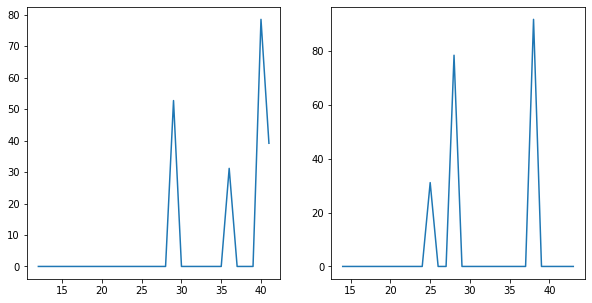

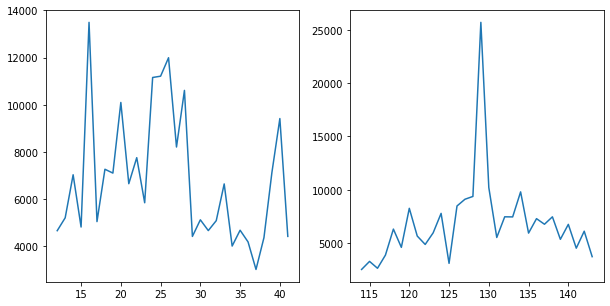

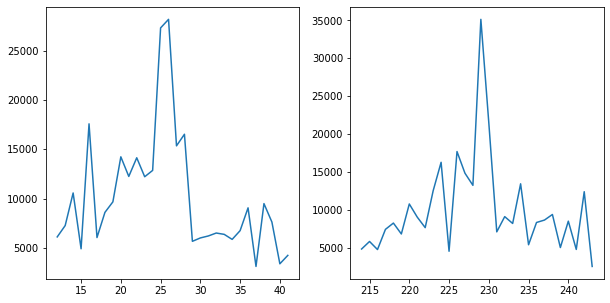

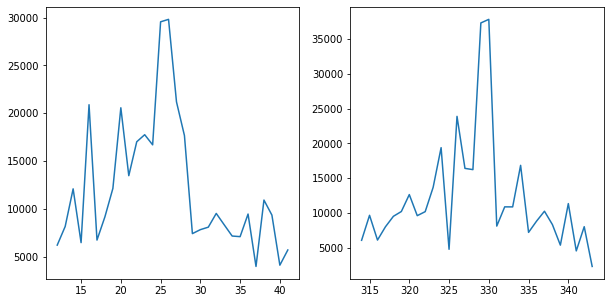

In [17]:
for i in range(_start+1,_end,1):
    i

1

2

3

range(1, 4)


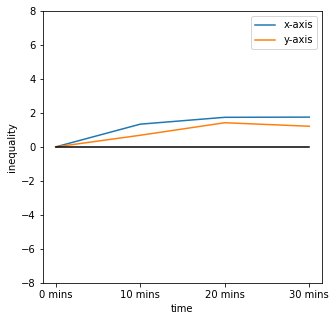

In [43]:
def plot_longitutional(x_inequ_array,y_inequ_array):
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111)
    print(range(_start+1,_end,1))
    ax.plot(range(_start+1,_end+1,1),x_inequ_array,label='x-axis')#y_inequ_array,color='Black')
    ax.plot(range(_start+1,_end+1,1),y_inequ_array,label='y-axis')
    ax.plot(range(_start+1,_end+1,1),np.repeat(0,len(y_inequ_array)),color='Black')
    ax.set_xlabel('time')
    ax.set_ylabel('inequality')
    plt.legend(loc="upper right")
    ax.set_ylim(-8,8)
    fig.show() 
    ax.set_xticks([1,2,3,4])
    ax.set_xticklabels(['0 mins','10 mins','20 mins','30 mins'])
_start = 0
_end = 4
plot_longitutional(x_inequ_array[_start:_end],y_inequ_array[_start:_end])
#plot_longitutional(np.multiply(x_inequ_array,average_exp)[_start:_end],np.multiply(y_inequ_array,average_exp)[_start:_end])

In [124]:
# from  https://plotly.com/python/cone-plot/ 
import plotly.graph_objects as go
import pandas as pd

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/vortex.csv")
a=np.zeros(shape=(50, 50))+1
b=np.zeros(shape=(50, 50))+1
#basic vector calculus
#Ux = X/np.sqrt(X**2 + Y**2) #velocity in x direction
#Uy = Y/np.sqrt(X**2 + Y**2) #velocity in y direction
#speed = np.sqrt(Ux**2 + Uy**2) #VELOCITY MAGNITUDE 
#UN = Ux/speed # velocity direction
#VN = Uy/speed # velocity direction
u = a/np.sqrt(a**2+b**2+Z**2)
v = b/np.sqrt(a**2+b**2+Z**2)
w = Z/np.sqrt(a**2+b**2+Z**2)
speed = np.sqrt(u**2 + v**2 + w**2)/10
u = u/speed,
v = v/speed,
w = w/speed,


fig = go.Figure(data = go.Cone(
    #x = X.flatten(),
    #y = Y.flatten(),
    #z = Z.flatten(),
    #u = u[0].flatten(),
    #v = v[0].flatten(),
    #w = w[0].flatten(),
    x = df.x[0:3],
    y = df.y[0:3],
    z = df.z[0:3],
    u = df.u[0:3],
    v = df.v[0:3],
    w = df.w[0:3],
    colorscale = 'greys',
    sizemode = "absolute",
    sizeref = 2))

fig.update_layout(
    scene = dict(aspectratio = dict(x = 1, y = 1, z = 0.8),
    camera_eye = dict(x = 1.2, y = 1.2, z = 0.6)))

#fig.show()

In [79]:
#! pip install geopandas
#! pip install pysal

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 61 kB 40 kB/s  eta 0:00:01
     |████████████████████████████████| 112 kB 5.9 MB/s eta 0:00:01
     |████████████████████████████████| 5.7 MB 2.5 kB/s  eta 0:00:01 |███████████████████████████████ | 5.6 MB 29.3 MB/s eta 0:00:01
     |████████████████████████████████| 243 kB 33 kB/s /s eta 0:00:01
     |████████████████████████████████| 116 kB 162.3 MB/s eta 0:00:01
     |████████████████████████████████| 50 kB 23 kB/s /s eta 0:00:01
     |████████████████████████████████| 147 kB 21 kB/s /s eta 0:00:01
     |████████████████████████████████| 2.4 MB 155.6 MB/s eta 0:00:01��█▋                            | 266 kB 155.6 MB/s eta 0:00:01
     |████████████████████████████████| 220 kB 27 kB/s /s eta 0:00:01
     |████████████████████████████████| 41 kB 2.1 kB/s s eta 0:00:01
     |████████████████████████████████| 59 kB 33 kB/s /s eta 0:00:01
     |████████████████████████████

     |████████████████████████████████| 135 kB 155.9 MB/s eta 0:00:01
     |████████████████████████████████| 10.7 MB 153.9 MB/s eta 0:00:01
     |████████████████████████████████| 79 kB 18.3 MB/s  eta 0:00:01
  Created wheel for spglm: filename=spglm-1.0.8-py3-none-any.whl size=38805 sha256=ce6f1982beef344a11c68368099999821d64061f5461d54f97fa711b4cd63e9e
  Stored in directory: /mmfs1/home/zzy0065/.cache/pip/wheels/04/56/0d/aaa8d7c0dedde9ad7cdb5882229ed287aacd78b1e648b5b7a1
  Created wheel for spvcm: filename=spvcm-0.3.0-py3-none-any.whl size=5777202 sha256=dc444296840f88b8e3d1261b9762b139ddef5cccf253b1f1c7c3badbda7e9d85
  Stored in directory: /mmfs1/home/zzy0065/.cache/pip/wheels/da/dd/c6/66fefe936667388f6da5b01437a00cd6b31dee97a771edf7e5
  Created wheel for esda: filename=esda-2.4.3-py3-none-any.whl size=122768 sha256=93e94bd7c1b96d2eecc8e2bdd8533ea894a0cfe1dce8b0efb5f54de8697856df
  Stored in directory: /mmfs1/home/zzy0065/.cache/pip/wheels/34/66/58/a7eb3f6c545f2c8aa4f36af16d3880c8c

Successfully built spglm spvcm esda mgwr spint inequality
Failed to build rvlib
    Running setup.py install for rvlib ... error
    ERROR: Command errored out with exit status 1:
     command: /tools/anacondapython-3.8.6/bin/python -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/tmp/pip-install-x2521azv/rvlib/setup.py'"'"'; __file__='"'"'/tmp/pip-install-x2521azv/rvlib/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record /tmp/pip-record-k64gaszr/install-record.txt --single-version-externally-managed --user --prefix= --compile --install-headers /home/zzy0065/.local/include/python3.8/rvlib
         cwd: /tmp/pip-install-x2521azv/rvlib/
    Complete output (161 lines):
    running install
    running build
    running build_py
    creating build
    creating build/lib.linux-x86_64-3.8
    creating build/lib.linux-x86_64-3.8/rvlib
    copy

In [252]:
### 3. Spatial Inequality Dynamics https://geographicdata.science/book/notebooks/09_spatial_inequality.html
import seaborn
import pandas
import geopandas
import pysal
import numpy
#import mapclassify
import matplotlib.pyplot as plt
#from pysal.explore import esda
#from pysal.lib import weights
from pysal.explore import inequality
inequality.gini.Gini(mtx.sum(0))
mtx.sum(1)

/home/zzy0065/.local/lib/python3.8/site-packages/geopandas/_compat.py:123: UserWarning:

The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.

<ipython-input-252-e215c3aa091c>:4: UserWarning:

Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).



ModuleNotFoundError: No module named 'pysal'

In [ ]:
x_unit = x_end-x_start
y_unit = y_end-y_start

lx=50
top=10
btm=10
lx= size(mtx,0)           # Work out matrix dimensions
ly= size(mtx,1)


Z = np.array(mtx.reset_index(drop=True))[:,::-1]

# Interpolate these onto a regular grid
xi = np.arange(0,lx,1)    # Set up a mesh of positions
yi = np.arange(0,ly,1)
xi, yi = np.meshgrid(xi,yi)

### observation ###
xpos = xi.flatten()   # Convert positions to 1D array
ypos = yi.flatten()
z = Z.flatten()
z_t10 = np.sort (z) [-top]
z_b10 = np.sort (z) [btm]

mask = (z>=z_t10) + (z<=z_b10)
mask_top = (z>=z_t10) 
mask_btm = (z<=z_b10)
func = Rbf(xpos[mask],ypos[mask], z[mask], function='linear')
zi = func(xi, yi)

# -- Plot --------------------------
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
ax1 = plt.subplot2grid((4, 4), (3, 0), colspan=3, rowspan=1)
ax2 = plt.subplot2grid((4, 4), (0, 3),colspan=1, rowspan=3)


# Plot flowlines
dy, dx = np.gradient(-zi.T) # Flow goes down gradient (thus -zi)
ax.streamplot(xi[0,:], yi[:,0],dx, dy, color='0.6', density=1,arrowsize=2)

# Contour gridded head observations
contours = ax.contour(xi, yi, zi, linewidths=2)
ax.clabel(contours)

# Plot well locations
ax.plot(xpos[mask_top],ypos[mask_top], 'ko',color='red')
ax.plot(xpos[mask_btm],ypos[mask_btm], 'ko',color='blue')
ax.set_xlabel('x-axis')
ax.set_ylabel('y-axis')
ax.invert_xaxis()
ax.invert_yaxis()
ax.axis('off')

### plot inequality ###
x_val=mtx.sum(0)
ax1.plot(np.arange(0,1,1/x_unit),(x_val/x_val.sum()).cumsum()-np.arange(0,1,1/x_unit))
ax1.plot(np.arange(0,1,1/x_unit),np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit),color='Black')

y_val=mtx.sum(1)
ax2.plot((y_val/y_val.sum()).cumsum()-np.arange(0,1,1/y_unit),np.arange(0,1,1/y_unit))
ax2.plot(np.arange(0,1,1/y_unit)-np.arange(0,1,1/y_unit),np.arange(0,1,1/y_unit),color='Black')
ax2.invert_yaxis()

plt.show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

data = np.array([
[0,1,0,2,0],
[0,3,0,2,0],
[6,1,1,7,0],
[0,5,0,2,9],
[0,1,0,4,0],
[9,1,3,4,2],
[0,0,2,1,3],
])

column_names = ['a','b','c','d','e']
row_names = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']

fig = plt.figure()
fig.add_subplot(1,1,1)
ax = Axes3D(fig)
#ax = fig.gca()


lx= len(data[0])            # Work out matrix dimensions
ly= len(data[:,0])
xpos = np.arange(0,lx,1)    # Set up a mesh of positions
ypos = np.arange(0,ly,1)
xpos, ypos = np.meshgrid(xpos+0.25, ypos+0.25)

xpos = xpos.flatten()   # Convert positions to 1D array
ypos = ypos.flatten()
zpos = np.zeros(lx*ly)

dx = 0.5 * np.ones_like(zpos)
dy = dx.copy()
dz = data.flatten()
cs = ['r', 'g', 'b', 'y', 'c'] * ly


ax.bar3d(xpos,ypos,zpos, dx, dy, dz, color=cs)

#sh()
ax.w_xaxis.set_ticklabels(column_names)
ax.w_yaxis.set_ticklabels(row_names)
ax.set_xlabel('Letter')
ax.set_ylabel('Day')
ax.set_zlabel('Occurrence')

plt.show()
plt.savefig('./myplot.png')

x:13,y:24


/tmp/ipykernel_111114/3067438454.py:78: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.

/tmp/ipykernel_111114/3067438454.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_111114/3067438454.py:13: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.

/tmp/ipykernel_111114/3067438454.py:121: MatplotlibDeprecationWarning:

The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.



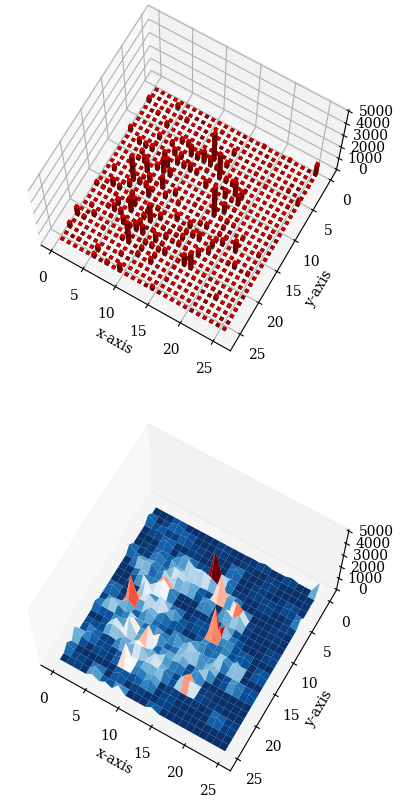

/tmp/ipykernel_111114/58775180.py:70: UserWarning:

linewidths is ignored by contourf

/tmp/ipykernel_111114/58775180.py:126: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:135: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:136: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:137: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:151: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:152: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_111114/58775180.py:153: UserWarning:

FixedFormatter should only be used together with FixedLocator



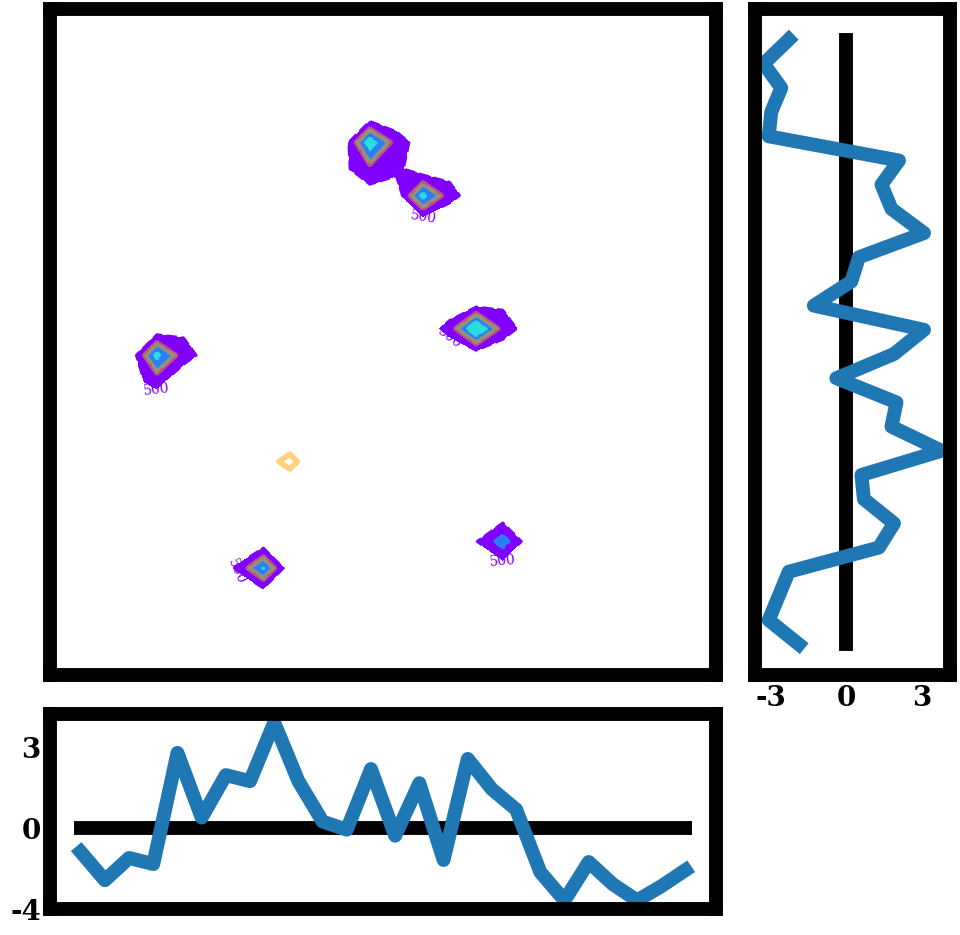

<Figure size 640x480 with 0 Axes>

In [14]:
def plotStream(mtx=[],lx=50,top=10,btm=10,**kwargs):
    # -- parameters --------------------
    lx,ly= np.size(mtx,0),np.size(mtx,1) # Work out matrix dimensions  
    cmlt_contour_color = kwargs['cmlt_contour_color'] if 'cmlt_contour_color' in kwargs.keys() else 'red'
    mtx_pre = kwargs['previous'] if 'previous' in kwargs.keys() else pd.DataFrame(np.zeros(shape=(50, 50)))
    x_unit = kwargs['x_unit'] if 'x_unit' in kwargs.keys() else 50 
    y_unit = kwargs['y_unit'] if 'y_unit' in kwargs.keys() else 50
    densityYN=kwargs['densityYN'] if 'densityYN' in kwargs.keys() else True
    density = kwargs['density'] if 'density' in kwargs.keys() else 1
    cntrlinecml = kwargs['cntrlinecml'] if 'cntrlinecml' in kwargs.keys() else 1200
    show_contour = kwargs['show_contour'] if 'show_contour' in kwargs.keys() else True
    show_cmlt_contour = kwargs['show_cmlt_contour'] if 'show_cmlt_contour' in kwargs.keys() else True
    timeline = kwargs['timeline'] if 'timeline' in kwargs.keys() else ''
    tick_labelsize = kwargs['tick_labelsize'] if 'tick_labelsize' in kwargs.keys() else 20
    dpi_value = kwargs['dpi_value'] if 'dpi_value' in kwargs.keys() else 300
    linewidth = kwargs['linewidth'] if 'linewidth' in kwargs.keys() else 6
    labelweight = kwargs['labelweight'] if 'labelweight' in kwargs.keys() else 'normal'
    framelinewidth = kwargs['framelinewidth'] if 'framelinewidth' in kwargs.keys() else 10
    fontname = kwargs['fontname'] if 'fontname' in kwargs.keys() else 'Arial'
    
    # -- Plot --------------------------
    # Set the font family for all text elements
    plt.rcParams['font.family'] = fontname    
    fig = plt.figure(figsize=(10, 10))
    #ax = fig.add_subplot(111)
    ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
    ax1 = plt.subplot2grid((4, 4), (3, 0), colspan=3, rowspan=1)
    ax2 = plt.subplot2grid((4, 4), (0, 3),colspan=1, rowspan=3)  
    
    ### delta changes ###
    Z = np.array(mtx.reset_index(drop=True).subtract(mtx_pre.reset_index(drop=True)))[:,::-1]     
    Z_cmltv = np.array(mtx.reset_index(drop=True))[:,::-1]
    Z[Z<0] = 0
    Z_cmltv[Z_cmltv<0] = 0
    
    ### Interpolate these onto a regular grid ###
    xi,yi = np.meshgrid(np.arange(0,lx,1),np.arange(0,ly,1)) # Set up a mesh of positions
    
    ### flatten the observation matrix ###
    xpos,ypos,z,z_cmltv = xi.flatten(),yi.flatten(),Z.flatten(),Z_cmltv.flatten() # Convert positions to 1D array

    ### get_mask ###
    (mask,mask_top,mask_btm) = GET_MASK(z=z,top=top,btm=btm)
    (mask_cmltv,mask_top_cmltv,mask_btm_cmltv) = GET_MASK(z=z_cmltv,top=top,btm=btm)

    func = Rbf(xpos[mask],ypos[mask], z[mask], function='linear')
    func_cmltv = Rbf(xpos[mask_cmltv],ypos[mask_cmltv], z_cmltv[mask_cmltv], function='linear')
    zi_cmltv,zi = func_cmltv(xi, yi),func(xi, yi) 
    
    # get the positions of the masked cumulative expression
    shape = (lx,ly)
    mask_top_cmltv_pd = pd.DataFrame(mask_top_cmltv.reshape(shape))
    mask_top_cmltv_pd_pstn = np.where(mask_top_cmltv_pd == True)
    
    ### Plot flowlines cmltv arrow plot ###
    if densityYN == True:
        if top != 0:
            dy, dx = np.gradient(-zi_cmltv) # Flow goes down gradient (thus -zi)
            stream = ax.streamplot(xi[0,:], yi[:,0], dx, dy, density=1,arrowsize=1,linewidth=3,minlength=0.011,
                               color = 'grey',#broken_streamlines=True,
                               start_points=np.column_stack((mask_top_cmltv_pd_pstn[1],mask_top_cmltv_pd_pstn[0]))
                              )#color='0.6',
            # Customize the transparency level
            stream.lines.set_alpha(0.5)

        
    ### Contour gridded head observations ###
    contours =[]
    try:
        ax.contourf(xi, yi, zi, 
                          linewidths=2,levels=list(np.linspace(500,5000,7)),cmap=newcmp,#list(np.linspace(500,5000,7))
                            #cmap="jet2",
                          linestyles='dashed')  
        if show_cmlt_contour == True:
            contours = ax.contour(xi, yi, zi, 
                              linewidths=2,levels=list(np.linspace(500,5000,7)),cmap=newcmp,#list(np.linspace(500,5000,7))
                              linestyles='dashed')
            ax.clabel(contours)
    except:
        print("not available")          
    contours_cmltv = []
    if show_contour == True:
        try:
            contours_cmltv = ax.contour(xi, yi, zi_cmltv, [cntrlinecml], colors = cmlt_contour_color,alpha=0.5,linewidths=4) #
            ax.clabel(contours_cmltv,inline=True, fontsize=12)
        except:
            print("not available")     

    
    ####################
    ##### color ######
    #print(zi)
    #plt.imshow(zi,extent=[-lx, lx, -ly, ly], #cmap=REGISTER_TERRAIN_MAP(),#vmax=Bound, vmin=-Bound,, antialiased=False
    #                       interpolation='nearest',cmap='viridis')  # linewidth=1,
    
    
    ### Plot well locations ###
    #if top != 0:
    #    ax.plot(xpos[mask_top],ypos[mask_top], 'ko',color='black',markersize=2) #cmlt_contour_color
    #    #ax.plot(xpos[mask_top_cmltv],ypos[mask_top_cmltv], 'ko',color=)
    #    #ax.plot(xpos[mask_btm],ypos[mask_btm], 'ko',color='blue')
    ax.set_xlabel('x-axis')
    ax.set_ylabel('y-axis')
    ax.invert_xaxis()
    ax.invert_yaxis()
    #ax.axis('off')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    (x_inequ,y_inequ) = GINI_IDX(mtx=mtx,x_unit=x_unit,y_unit=y_unit)
    ### derivative of gini curve ###
    x_drvtv = list(DERIVATIVE(x_inequ,1))
    y_drvtv = list(DERIVATIVE(y_inequ,1))


    ### plot IDI (index of derivative inequality) ###
    # Set the maximum number of ticks on the x-axis
    max_ticks = 3
    import matplotlib.ticker as ticker
    #ax1.plot(np.arange(0,1,1/x_unit),(np.arange(0,1,1/x_unit)-np.arange(0,1,1/x_unit)),color='Black',linewidth=linewidth)  
    ax1.plot(np.arange(0,x_unit,1),(np.arange(0,x_unit,1)-np.arange(0,x_unit,1)),color='Black',linewidth=linewidth)  
    ax1.plot(np.arange(0,x_unit,1),x_drvtv,linewidth=linewidth)
    ax1.xaxis.set_visible(False)
    ax1.yaxis.set_label_position("right")
    ax1.yaxis.set_tick_params(labelsize=tick_labelsize) 
    # Set tick label font weight
    ax1.set_yticklabels(ax1.get_yticks(), rotation=0, weight=labelweight)    
    #ax1.yaxis.tick_right()
    
    # Set the new tick locations on the x-axis
    ax1.yaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
    #ax1.set_yticklabels([np.float(i) *100 for i in ax1.get_yticks()])
    #ax1.set_yticks(range(len([np.float(i)*100 for i in ax1.get_yticks()])))
    # Set tick label font weight
    # Optionally, you can format the tick labels if needed
    ax1.set_yticklabels(ax1.get_yticks(), rotation=0, weight=labelweight)    
    ax1.set_xticklabels(["{}".format(int(tick*100)) for tick in ax1.get_xticks()])
    ax1.set_yticklabels(["{}".format(int(tick*100)) for tick in ax1.get_yticks()]) 
    ax1.set_xlabel("Derivative of degree of inequality")
    
    ax2.plot(np.arange(0,y_unit,1)-np.arange(0,y_unit,1),np.arange(0,y_unit,1),color='Black',linewidth=linewidth)
    ax2.plot(y_drvtv,np.arange(0,y_unit,1),linewidth=linewidth)
    ax2.invert_yaxis()
    ax2.xaxis.set_tick_params(labelsize=tick_labelsize)
    ax2.yaxis.set_visible(False)
    # Set the new tick locations on the x-axis
    ax2.xaxis.set_major_locator(ticker.MaxNLocator(max_ticks))
    #ax2.set_xticklabels([np.float(i)*100 for i in ax2.get_xticks()])
    #ax2.set_xticks(range(len([np.float(i)*100 for i in ax2.get_xticks()])))
    # Set tick label font weight
    # Optionally, you can format the tick labels if needed
    ax2.set_xticklabels(ax2.get_xticks(), rotation=0, weight=labelweight)
    ax2.set_xticklabels(["{}".format(int(tick*100)) for tick in ax2.get_xticks()])   
    ax2.set_yticklabels(["{}".format(int(tick*100)) for tick in ax2.get_yticks()])
    ax2.set_ylabel("Derivative of degree of inequality")
    
    for axis in ['top', 'bottom', 'left', 'right']:
        ax.spines[axis].set_linewidth(framelinewidth)  # change width
        ax1.spines[axis].set_linewidth(framelinewidth)  # change width
        ax2.spines[axis].set_linewidth(framelinewidth)  # change width
        #ax.spines[axis].set_color('red')    # change color
    
    # Adjust the margins (decrease them)
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
    # Save the plot as png and pdf files
    plt.savefig('./output/'+timeline+".png",dpi=dpi_value) # , bbox_inches='tight'
    plt.savefig('./output/'+timeline+".pdf", format='pdf') # , bbox_inches='tight'

    plt.show()
    
    import io
    ### save figure buffer ###
    buffer = io.BytesIO()
    plt.savefig(buffer, format='pdf')
    buffer.seek(0)
    #save_as_pdf(buffer,timeline+'_figure.pdf')
    ## Add a button to save as PDF
    #if st.button('Save as PDF '+timeline):
    #    save_as_pdf(buffer,timeline+'_figure.pdf')
    #if st.download_button("Download PDF "+timeline, data=buffer, file_name=timeline+"_figure.pdf", mime="application/pdf"):
    #    st.success("File download initiated!")
    return(x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv)  

### test: IL6 sheet 21
InputDirectory='input/'
#df = pd.read_excel(r'./'+InputDirectory+"/M+N IFN-y final data.xlsx", sheet_name='Sheet1',header=None) # T+N IFN-y final data.xlsx
df = pd.read_excel(r'./'+InputDirectory+"/IL-6 with amount summary.xlsx", sheet_name='Sheet15',header=None)
# center coordinate
if df.shape[1]>50:
    df_x,df_y = df.iloc[0,50],df.iloc[0,51]
    
    if ~df_x.isdigit():
        df_x,df_y = df.iloc[1,50],df.iloc[1,51]       
else:
    df_x,df_y = 25,25  

print("x:%s,y:%s" %(df_x,df_y))
(top,btm) = ([1,2,2,2,2,2,3],[1,1,1,1,200,200,200])
diameter = 13
(x_start,x_end,y_start,y_end) = (df_x-diameter,df_x+diameter,df_y-diameter,df_y+diameter)


#mtx_pre = pd.DataFrame(np.zeros(shape=(x_end-x_start, y_end-y_start)))
#mtx_pre.columns = range(y_start,y_end)
#mtx_pre.index=range(x_start,x_end)
cmlt_contour_color = ['blue','','blue','','orange','orange','red']
(x_unit,y_unit) = (x_end-x_start,y_end-y_start)
timeline=['0 mins','5 mins','10 mins','15 mins','20 mins','25 mins','30 mins']
i=5
mtx = df.iloc[i*50:(i+1)*50,0:50]
mtx = mtx.iloc[x_start:x_end,y_start:y_end]

mtx_pre = df.iloc[(i-2)*50:(i-1)*50,0:50]      
mtx_pre = mtx_pre.iloc[x_start:x_end,y_start:y_end]
(X,Y,Z)=plot_3D(mtx,previous = mtx_pre)
(x_inequ,y_inequ,x_drvtv,y_drvtv,contours,contours_cmltv) = plotStream(
    mtx=mtx,top=6,btm=6,previous = mtx_pre,
    x_unit = x_unit,y_unit = y_unit, 
    cmlt_contour_color = cmlt_contour_color[i],
    show_contour = True,
    show_cmlt_contour = True,
    densityYN=False,
    timeline = timeline[i],
    tick_labelsize = 20,
    linewidth= 10,
    labelweight='heavy',#
    framelinewidth = 10,
    fontname='Serif',
    fillcolor=False
)
